# Diputrax V13 — Cuaderno Unificado (segmentación S3, modelos de regresión)

Derivado del diseño de `diputraxv10.ipynb` con dos cambios de fondo:

1. **Segmentación temporal S3** (evaluada en `diputraxv12`): tres eras — PRI (57–59), PAN (60–62) y **Transición-Morena (63–66)** — en lugar de las cuatro eras de v10. La fusión del tramo 2015–presente elimina el grupo de n=500 y se sitúa en la frontera eficiente del intercambio sesgo-varianza.
2. **Solo modelos de regresión**: Regresión Logística L2/L1/L1+`SelectFromModel`, GLM Poisson y Regresión Logística bayesiana (PyMC NUTS). Los modelos de árboles (Random Forest, XGBoost) y el enfoque multitarea de PyTorch quedan documentados en `diputraxv10.ipynb` y `diputraxpytorch.ipynb`.

# 1. Resumen Ejecutivo Integrado

Este cuaderno es la **versión v13** del proyecto Diputrax: el cuaderno unificado de la línea de **modelos de regresión**, con la segmentación temporal **S3** derivada de la evaluación comparativa de `diputraxv12`. Analiza la asignación de diputados federales mexicanos a comisiones legislativas durante el periodo 1997–presente mediante dos vertientes complementarias:

1. **Regresión Logística Frecuentista L1 (Lasso):** modelado lineal interpretable por era, en dos configuraciones (L1 completa y L1 + `SelectFromModel`), con la especificación L2 histórica como línea de robustez y un GLM Poisson para el conteo de comisiones temáticas. Espacio de 62 *features* con imputación MICE e interpretación SHAP (`LinearExplainer`).
2. **Regresión Logística Bayesiana (PyMC, NUTS):** capa de robustez probabilística sobre el mismo subconjunto de variables seleccionado por SFM en cada era, que cuantifica la incertidumbre posterior (HDI 94%) y valida la dirección de los coeficientes frecuentistas.

**Cambio central respecto a v10 — segmentación temporal.** Las diez legislaturas (LVII–LXVI) se agrupan en **tres eras**: `ERA_1_PRI` (57–59), `ERA_2_PAN` (60–62) y `ERA_3_TRANSMOR` (63–66). La decisión proviene de `diputraxv12`, que evaluó seis segmentaciones candidatas bajo un protocolo neutral (predicciones *out-of-fold* sobre estratos fijos por legislatura): la fusión Transición+Morena está en la frontera eficiente del intercambio sesgo-varianza, alcanza la mayor cohesión interna de coeficientes de todo el espacio de candidatos (0.537) y su costo predictivo frente al mejor esquema es estadísticamente indistinguible de cero, a la vez que elimina el grupo de n=500 que limitaba la potencia estadística de v10.

**Cambio de alcance — solo regresión.** Los modelos de árboles (Random Forest, XGBoost) y el aprendizaje profundo multitarea (PyTorch MTL) de v10 quedan fuera de este cuaderno; su evidencia comparativa —que la estructura de la asignación es predominantemente lineal— se hereda de v10 como premisa de diseño y no se re-estima aquí.

# 1.1 Contexto y área de interés

La Cámara de Diputados del Congreso de la Unión opera a través de un sistema de comisiones legislativas que distribuye el trabajo parlamentario y, crucialmente, el poder político al interior de la legislatura. Las comisiones no son equivalentes entre sí, ya que mientras algunas controlan el presupuesto, la hacienda pública y la seguridad nacional —comisiones nodales— y constituyen posiciones de alta influencia reservadas a los cuadros de mayor confianza del partido en el poder, otras comisiones carecen de recursos, dictámenes relevantes o visibilidad pública —comisiones lastre— y funcionan como mecanismo de marginalización para diputados de la oposición o sin red política. Un tercer grupo de comisiones temáticas concentra la especialización sectorial —salud, educación, medio ambiente— sin el peso político de las nodales.

El área de interés de este proyecto es el mecanismo de reclutamiento que determina qué tipo de comisión recibe cada diputado. La hipótesis de partida es que ese mecanismo no es aleatorio: el perfil biográfico —experiencia previa, filiación partidaria, trayectoria administrativa, nivel educativo— contiene señal sobre la asignación. La hipótesis adicional es que esa señal ha cambiado con los cambios de régimen político, a lo largo de tres configuraciones de coalición dominante: la hegemonía priista en retirada —1997–2006—, el bipartidismo con presidencias panistas —2006–2015— y el ciclo Transición-Morena posterior a 2015 —fragmentación multipartidista primero, mayorías de Morena después—. Configuraciones que no operan bajo los mismos criterios de distribución del poder legislativo.

---

# 1.2 Objetivos y criterios de éxito

## Objetivo primario

Determinar si el perfil biográfico, educativo y de trayectoria de un diputado federal predice el tipo de comisión al que es asignado, y en qué medida ese poder predictivo varía entre épocas políticas.

## Objetivos secundarios

- Identificar qué dimensiones del perfil —trayectoria administrativa, filiación partidaria, experiencia legislativa previa, nivel educativo— tienen mayor peso predictivo en cada era.
- Evaluar si la lógica de asignación de comisiones lastre es el inverso de la lógica nodal, o si responde a mecanismos institucionales independientes.
- Caracterizar el perfil prototípico del diputado con mayor probabilidad de recibir comisión nodal en cada era y documentar su evolución a lo largo del tiempo.
- Medir la transferencia temporal del modelo: si el perfil aprendido en una era predice con precisión la siguiente.

## Criterios de éxito

| Criterio | Umbral orientativo |
|---|---|
| Señal predictiva para comisiones nodales | AUC ≥ 0.65 en al menos dos eras |
| Identificación de predictores consistentes | ≥ 3 *features* con importancia SHAP estable entre eras |
| Diferenciación nodal/lastre | Correlación SHAP(nodal) vs −SHAP(lastre) distinta de −1.0 |
| Transferencia temporal | AUC *rolling forward* ≥ 0.65 en al menos una transición para nodales |

---

# 1.3 Datos

Los datos provienen del Sistema de Información Legislativa (SIL) de la Secretaría de Gobernación, obtenidos mediante *web scraping* de perfiles públicos de diputados federales. La base cubre las legislaturas LVII a LXVI —1997–presente—, con aproximadamente 500 diputados por legislatura, para un total de 5,000 registros.

La unidad de análisis es el legislador dentro de una legislatura. Un mismo diputado puede aparecer en múltiples registros si fue reelecto. El identificador `diputado_id` —*hash* SHA-256 sobre nombre normalizado y fecha de nacimiento— permite vincular registros del mismo individuo sin crear fugas de información (*leakage*) entre eras.

A partir de los perfiles crudos se construyeron 62 *features* organizados en seis bloques —ver tabla de apertura—, que cubren la dimensión político-electoral, trayectorias administrativa y legislativa, formación académica, cargos ejecutivos y variables *dummies* de partido y región. Las distribuciones del *target* y la composición de cada era están descritas en la tabla de épocas de la sección anterior.

---

# 1.4 Criterios de interpretabilidad del modelo

La interpretabilidad es un requisito central del proyecto, dado que el objetivo no es solo predecir sino entender qué perfil es valorado en cada época política. Los criterios operativos son:

## Métricas de desempeño

Para comisiones nodales y lastre —clasificación binaria— se utiliza AUC bajo validación cruzada estratificada de 5 pliegues (*5-fold*), interpretado en una escala que va de 0.50 —aleatorio— a valores superiores a 0.75 —señal fuerte—. Un AUC entre 0.65 y 0.75 se considera señal moderada: el perfil importa, pero no determina la asignación.

Para comisiones temáticas —regresión de conteo— se utiliza MAE comparado contra el *baseline* de predecir siempre la media. Una mejora inferior al 5% se considera nula.

## Atribución de importancia

Los valores SHAP (*SHapley Additive exPlanations*) cuantifican la contribución individual de cada variable (*feature*) a la predicción de cada diputado. Se calculan por era para los tres modelos de comisión, permitiendo comparar qué variables ganan o pierden relevancia entre regímenes políticos.

La comparación visual mediante *heatmaps* y *beeswarms* permite leer simultáneamente la dirección —positiva o negativa— y magnitud del efecto.

## Validación temporal

La validación *rolling forward* —entrenar en ERA k, predecir ERA k+1— mide si el perfil aprendido en una era es transferible a la siguiente. Una caída de AUC indica que el criterio de asignación cambió entre épocas, lo cual puede interpretarse como evidencia de ruptura institucional.

## Selección de variables

La estrategia de modelado implementa Regresión Logística L1 —Lasso— en dos configuraciones sobre cada combinación de era y variable objetivo binaria, complementadas por una Regresión Logística Bayesiana —NUTS— como análisis de robustez. La penalización L1 produce coeficientes exactamente cero para *features* irrelevantes, haciendo que la selección de variables forme parte del proceso de ajuste. `SelectFromModel` retiene por era únicamente las variables con coeficiente por encima de la media, cuantificando la esparsidad del mecanismo de asignación en cada régimen político.

---


# 1.5 Alcance del proyecto

El proyecto cubre:

- **Sujeto:** diputadas y diputados federales de la Cámara de Diputados del Congreso de la Unión de México, legislaturas LVII–LXVI.
- **Variables explicativas:** perfil biográfico observable en el SIL —trayectorias administrativa, política y legislativa; formación académica; filiación partidaria; tipo de elección, sea mayoría relativa o representación proporcional.
- **Variables objetivo:** asignación a comisión nodal —binaria—, asignación a comisión lastre —binaria— y número de comisiones temáticas recibidas —conteo—.
- **Período analítico:** tres eras definidas a partir de la coalición dominante de la Cámara: ERA_1 PRI —57–59—, ERA_2 PAN —60–62—, ERA_3 Transición-Morena —63–66—. La segmentación corresponde al esquema `S3_FUSION34` evaluado en `diputraxv12`, que la sitúa en la frontera eficiente del intercambio sesgo-varianza (máxima cohesión interna de coeficientes; costo predictivo dentro del umbral de empate; ningún grupo con n<1,500).
- **Enfoque metodológico:** Regresión Logística L1 en dos configuraciones sobre cada combinación de era y variable objetivo binaria, con la especificación L2 (v4) como línea de robustez, complementada por una Regresión Logística Bayesiana —NUTS—. Se ejecuta un análisis SHAP por era, una validación temporal *rolling forward* y una caracterización de perfiles prototípicos por era.
- **Modelo:** Regresión Logística L1 con `SelectFromModel` para selección automática de *features* por era. SHAP con `LinearExplainer` —valores en espacio *log-odds* para clasificación y log-conteo para Poisson—.

---

# 1.6 Fuera de alcance del proyecto

El proyecto no cubre los siguientes aspectos, ya sea por restricciones de datos o por diseño deliberado del alcance:

- **Variables de red y relacionales:** co-membresías previas en comisiones, vínculos personales con coordinadores parlamentarios, relaciones de padrinazgo político. Estas variables pueden elevar el techo de AUC, pero no están disponibles en el SIL.
- **Mecanismos cualitativos:** negociaciones de bancada, acuerdos de coalición, presiones externas al proceso formal. El modelo captura correlaciones del perfil observable, no la causalidad institucional subyacente.
- **Predicción prospectiva en tiempo real:** el modelo no está diseñado para predecir asignaciones futuras en producción. Su propósito es analítico e interpretativo.
- **Resolución del subrégimen Morena 2024+:** la segmentación S3 modela las legislaturas 63–66 como un solo grupo (`ERA_3`); el cuaderno no estima un modelo separado para la LXVI. La evidencia de `diputraxv12` muestra que un grupo propio para la LXVI (n=500) maximiza la varianza sin ganancia predictiva; el análisis fino del subrégimen 2024+ queda para cuando exista la LXVII.
- **Modelos no lineales y multitarea:** Random Forest, XGBoost y el MTL de PyTorch quedan fuera de este cuaderno; su contraste con la línea de regresión está documentado en `diputraxv10.ipynb` y `diputraxpytorch.ipynb`.
- **Cámara de Senadores y congresos locales:** el análisis es exclusivo de la Cámara de Diputados federal.
- **Calibración de probabilidades para uso operativo:** el modelo no ha sido calibrado con *Platt scaling* ni *isotonic regression* para aplicación directa como herramienta de *scoring*, debido al tamaño de la muestra. Además, no se encontró evidencia de una distorsión de las probabilidades de forma sigmoidal, por lo que no se cuenta con suficientes datos de calibración para una regresión isotónica.

# 2. Estrategia metodológica

# 2. Estrategia metodológica

## 2.1 Datos: esquema, análisis y calidad

### 2.1.1 Fuente y estructura de origen

Los datos provienen del Sistema de Información Legislativa (SIL) de la Secretaría de Gobernación (`sil.gobernacion.gob.mx`). Se obtuvieron mediante un *web scraper* que descarga perfiles públicos de diputados federales, cubriendo las legislaturas LVII–LXVI —1997–presente—, con aproximadamente 500 diputados por legislatura. Los datos fueron extraídos mediante el proyecto `LegisdataMXSIL`.

La unidad de análisis es el legislador dentro de una legislatura. Un mismo diputado puede aparecer en múltiples registros si fue reelecto. El campo `diputado_id` —`SHA-256[:12]` sobre nombre normalizado + fecha de nacimiento— permite vincular registros del mismo individuo entre legislaturas.

Los datos extraídos por el *web scraper* se consolidan en una única base de datos mediante un *data pipeline* que limpia los datos fuente y agrega variables derivadas.

**Dimensiones de la base consolidada:** 5,000 filas × 78 columnas.

---

### 2.1.2 Resumen del esquema de datos

El esquema de datos corresponde a una base consolidada de 5,000 registros de diputadas y diputados federales mexicanos, organizada para analizar patrones de reclutamiento político, trayectoria profesional, formación académica y distribución de posiciones legislativas.

La base contiene identificadores únicos, variables sociodemográficas, antecedentes políticos y administrativos, experiencia legislativa, participación en comisiones y atributos derivados para modelado cuantitativo.

---

### 2.1.3 Organización general de la base

La estructura está organizada en varios grupos temáticos. Cada grupo concentra variables relacionadas con una dimensión específica del perfil legislativo de las diputadas y diputados incluidos en la base.

#### Identificadores y variables institucionales

El primer grupo corresponde a identificadores y variables institucionales, incluyendo:

- `diputado_id`
- `referencia`
- `legislatura_nombre`
- `legislatura_num`
- `partido_nombre`
- `partido`
- `nombre`
- `source_file`
- `partido_mayoria`
- `es_partido_mayoria`

Estas variables permiten vincular cada observación con su contexto legislativo, partidista y temporal.

#### Datos personales

El grupo de datos personales incluye información básica como:

- Año de nacimiento
- Edad al tomar el cargo
- Entidad federativa
- Distrito o circunscripción
- Tipo de elección
- Nivel educativo ordinal
- Área de formación
- Existencia de suplente
- Condición de licencia

En términos de calidad de datos, esta sección concentra la mayor proporción de valores faltantes:

| Variable | Porcentaje de valores nulos |
|---|---:|
| `y_nacimiento` | 10.1% |
| `edad_al_tomar_cargo` | 10.2% |
| `distrito_circ` | 4.2% |

El resto de las variables presenta cobertura completa.

#### Trayectoria legislativa

La sección de trayectoria legislativa registra antecedentes como:

- Haber sido diputado local
- Haber sido diputado federal en legislaturas previas
- Haber sido senador
- Conteo agregado de cargos legislativos previos

Estas variables permiten medir experiencia parlamentaria acumulada y pueden utilizarse para identificar perfiles de carrera política profesionalizada.

#### Comisiones

El grupo de comisiones describe la participación de cada legislador en órganos legislativos. Incluye variables como:

- Número total de comisiones ordinarias
- Número de comisiones especiales
- Número de presidencias de comisión
- Número de secretarías de comisión
- Indicadores de liderazgo legislativo

Además, las comisiones se clasifican en tres tipos:

| Tipo de comisión | Descripción |
|---|---|
| Nodales | Comisiones asociadas con mayor influencia política. |
| Temáticas | Comisiones relacionadas con áreas sectoriales de política pública. |
| Lastre | Comisiones vinculadas con menor peso estratégico. |

Esta sección es especialmente útil para construir indicadores de poder legislativo, centralidad institucional o acceso a posiciones de influencia.

#### Trayectoria administrativa

La sección de trayectoria administrativa captura experiencia previa en cargos públicos, partidistas, sindicales, universitarios y gubernamentales.

Incluye variables binarias para cargos como:

- Presidente municipal
- Director general
- Secretario
- Subsecretario
- Delegado
- Asesor
- Regidor
- Síndico

También incorpora indicadores del ámbito institucional donde ocurrió la experiencia:

- Gobierno federal
- Gobierno estatal
- Gobierno municipal
- Partido político
- Sindicato
- Universidad

La variable `nivel_cargo_max` resume el nivel jerárquico máximo alcanzado por cada legislador en su trayectoria administrativa.

#### Trayectoria juvenil

El grupo de trayectoria juvenil permite identificar si el diputado tuvo experiencia en:

- Organizaciones juveniles
- Liderazgo juvenil partidista
- Participación juvenil gubernamental
- Membresía en organizaciones juveniles

Estas variables pueden servir para analizar carreras políticas iniciadas desde estructuras partidistas o juveniles.

#### Formación académica

La sección de formación académica contiene indicadores sobre:

- Posgrado
- Doctorado
- Estudios en el extranjero
- Tipo de universidad
- Pertenencia a instituciones académicas específicas

Entre las instituciones identificadas se encuentran:

- UNAM
- ITESM
- ITAM
- Universidad Iberoamericana
- Universidad de Guadalajara
- IPN
- UAM
- Universidad Anáhuac
- UANL
- Universidad Veracruzana

Estas variables permiten analizar capital educativo, origen institucional de la formación y posibles diferencias entre élites políticas por partido, legislatura o tipo de comisión.

#### Conteos de trayectoria

Finalmente, el grupo de conteos de trayectoria sintetiza distintas dimensiones de experiencia previa:

- Trayectoria política general
- Trayectoria empresarial
- Investigación y docencia
- Participación en órganos de gobierno
- Trayectoria legislativa ponderada

Estas variables son particularmente útiles para análisis exploratorio, segmentación de perfiles y construcción de modelos predictivos o explicativos.

#### Valor analítico del esquema

En conjunto, el esquema es adecuado para estudiar:

- Patrones de reclutamiento legislativo
- Profesionalización política
- Trayectorias de carrera
- Diferencias partidistas
- Composición territorial
- Formación académica de las élites políticas
- Acceso diferencial a posiciones de poder dentro de la Cámara de Diputados

La base tiene una calidad general alta, ya que la mayoría de las variables no presenta valores nulos. Sin embargo, las variables de edad, año de nacimiento y distrito requieren tratamiento específico antes de cualquier análisis estadístico o modelo de *machine learning*.

La versión `v3` incorpora la variable `sexo` —inferida desde el nombre de pila del diputado mediante la librería `gender-guesser` y un diccionario suplementario de nombres mexicanos e indígenas—, codificada como `sexo_bin` en el modelo predictivo:

- `1 = Hombre`
- `0 = Mujer`

---

### 2.1.4 Análisis de los datos

#### Estrategia de análisis temporal: tres épocas legislativas

La base cubre las legislaturas LVII–LXVI —1997–presente—. Se segmenta en tres épocas analíticas —la segmentación `S3_FUSION34` evaluada en `diputraxv12`— para comparar evolución de perfiles legislativos, profesionalización y composición partidista.

| Época | Legislaturas | Filas | Periodo |
|---|---|---:|---|
| Primera | LVII–LIX | 1,500 | 1997–2006 |
| Segunda | LX–LXII | 1,500 | 2006–2015 |
| Tercera | LXIII–LXVI | 2,000 | 2015–presente |

#### Fundamentos de la segmentación

##### Equilibrio estadístico

Los tres grupos tienen entre 1,500 y 2,000 filas (tres o cuatro legislaturas de aproximadamente 500 diputados). Ningún grupo hereda el n=500 de una sola legislatura: la evaluación comparativa de `diputraxv12` (§9) muestra que separar la LXVI en un grupo propio maximiza la varianza de los estimadores sin ganancia predictiva, y que la fusión 63–66 alcanza la mayor cohesión interna de coeficientes de todo el espacio de candidatos (similitud dentro de grupo 0.537).

##### Ruptura estructural por reelección

ERA_1 y ERA_2 tienen casi todos los registros como personas distintas —diferencias de 32 y 24 respectivamente—, reflejo de la prohibición constitucional de reelección consecutiva vigente desde 1933.

ERA_3 —que ahora abarca LXIII–LXVI— concentra los registros de reelección de la serie, consecuencia de la reforma constitucional de 2014 —efectiva desde la LXIV, 2018—, que rehabilitó la reelección consecutiva. Esta ruptura cambia cualitativamente la unidad de análisis: un mismo individuo puede generar múltiples observaciones, alterando cómo se miden trayectoria y profesionalización.

##### Discontinuidades políticas reales

**Primera época —LVII–LIX, 1997–2006: transición democrática.**  
La LVII fue la primera legislatura donde el PRI perdió la mayoría absoluta desde 1929. La LIX opera ya bajo la alternancia presidencial —Fox, PAN—. El reclutamiento legislativo, la composición de comisiones y los perfiles de los legisladores aún reflejan la inercia priísta en proceso de desmantelamiento.

**Segunda época —LX–LXII, 2006–2015: bipartidismo funcional PAN–PRI con el PRD como tercera fuerza.**  
Este periodo se desarrolla en el contexto de la guerra contra el narcotráfico durante el gobierno de Calderón, elecciones muy competidas, el regreso del PRI con Peña Nieto en 2012 y el Pacto por México. Los datos muestran el mayor promedio de comisiones por diputado —4.40—, lo que sugiere mayor carga legislativa o mayor fragmentación partidista que obliga a repartir más puestos.

**Tercera época —LXIII–LXVI, 2015–presente: ascenso, consolidación y supermayoría de MORENA.**  
La LXIV —2018— representa el primer quiebre histórico de mayoría absoluta por un partido no priísta ni panista; llega también la reelección legislativa. El ciclo culmina en la LXVI —2024, gobierno de Claudia Sheinbaum— con una supermayoría de MORENA y aliados de más de dos tercios del pleno. Los indicadores de comisiones nodales suben de 0.63 en ERA_2 a ~0.84 en este tramo, reflejando la concentración progresiva de posiciones de poder. La fusión 63–66 en un solo grupo es la decisión central de esta versión: `diputraxv12` muestra que el costo predictivo de esa fusión es estadísticamente indistinguible de cero y que el grupo resultante es el de mayor cohesión interna de coeficientes; a cambio, el subrégimen 2024+ no se modela por separado (límite de resolución declarado en §11).

---

#### Tendencias transversales validadas por la segmentación

Los promedios por época muestran trayectorias graduales que se vuelven legibles gracias a la segmentación temporal del estudio:

| Variable | ERA 1 | ERA 2 | ERA 3 |
|---|---:|---:|---:|
| Edad promedio | 44.82 | 45.76 | 47.62 |
| Comisiones nodales | 0.47 | 0.63 | 0.84 |
| Comisiones temáticas | 1.53 | 1.93 | 2.08 |

La edad promedio aumenta aproximadamente un año por era, lo que sugiere un envejecimiento sostenido del cuerpo legislativo a lo largo del periodo observado.

Asimismo, la participación en comisiones nodales crece de forma continua, pasando de 0.47 en la primera era a 0.84 en la tercera. Este patrón puede interpretarse como un indicio de profesionalización legislativa creciente o, alternativamente, como una mayor concentración de posiciones estratégicas de poder, dependiendo de la configuración partidista dominante en cada periodo.

En conjunto, estos gradientes sólo emergen con claridad cuando el tiempo legislativo se organiza en unidades analíticas coherentes, lo que permite identificar cambios estructurales en los perfiles y trayectorias de las diputadas y los diputados federales.

---

#### Utilidad analítica de la segmentación por eras

La división por eras permitirá comparar la evolución de variables clave, entre ellas:

- `edad_al_tomar_cargo`
- `partido`
- `entidad_codigo`
- `mayoria_relativa`
- `grado_estudios_ord`
- `area_formacion`
- `n_trayectoria_admin`
- `n_trayectoria_legislativa`
- `n_comisiones_nodales`
- `n_comisiones_tematicas`
- `n_comisiones_lastre`

En caso de que variables adicionales estén disponibles en versiones posteriores, como género u otros atributos sociodemográficos, también podrán incorporarse al análisis comparativo por era.

---

### 2.1.5 Calidad de los datos

La base presenta una calidad general alta. La mayoría de las variables no presenta valores nulos. Las únicas variables con ausencias significativas son:

| Variable | % nulos global | Mecanismo | Consideración |
|---|---:|---|---|
| `edad_al_tomar_cargo` | 10.2% | MNAR confirmado | Diputados con menor perfil institucional tienen mayor tasa de nulo —ver §2.2.1b—. La imputación introduce sesgo de dirección. |
| `y_nacimiento` | 10.1% | Correlacionado con `edad_al_tomar_cargo` | No entra al modelo directamente. |

El análisis formal del mecanismo de valores faltantes —§2.2.1b— diagnostica `edad_al_tomar_cargo` como MNAR: la ausencia está correlacionada con el perfil de trayectoria del diputado —AUC predictivo del nulo = 0.821— y con el *outcome* del modelo de nodales —tasa nodal: 43.3% con dato vs. 33.7% sin dato, `p < 0.001`.

La imputación por media de legislatura sobreestima la edad de los diputados con menor perfil institucional. El *flag* `edad_missing` mitiga, pero no cancela este sesgo.

# Anexo tecnico. Evaluacion de datos

In [1]:
# =========================
# Importación de dependencias y carga de datos
# =========================

from pathlib import Path

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display, HTML

sns.set_theme(style="whitegrid", context="talk", palette="deep")
plt.rcParams["figure.figsize"] = (12, 7)
plt.rcParams["axes.titlesize"] = 16
plt.rcParams["axes.labelsize"] = 12
plt.rcParams["legend.frameon"] = False
pd.set_option("display.max_columns", 100)

PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
DATA_PATH = PROJECT_ROOT / "data" / "clean" / "diputados_20260421_205712.parquet"

if not DATA_PATH.exists():
    raise FileNotFoundError(f"No existe archivo parquet: {DATA_PATH}")

df = pd.read_parquet(DATA_PATH).copy()
print(f"Fuente de datos: {DATA_PATH}")
print(f"Dimensión: {df.shape[0]:,} filas x {df.shape[1]:,} columnas")

roman_map = {
    57: "LVII", 58: "LVIII", 59: "LIX", 60: "LX", 61: "LXI",
    62: "LXII", 63: "LXIII", 64: "LXIV", 65: "LXV", 66: "LXVI",
}

era_map = {
    57: "ERA_1", 58: "ERA_1", 59: "ERA_1",
    60: "ERA_2", 61: "ERA_2", 62: "ERA_2",
    63: "ERA_3", 64: "ERA_3", 65: "ERA_3", 66: "ERA_3",
}

era_label_map = {
    "ERA_1": "ERA_1 - LVII-LIX",
    "ERA_2": "ERA_2 - LX-LXII",
    "ERA_3": "ERA_3 - LXIII-LXVI",
}

era_nombre_map = {
    "ERA_1 - LVII-LIX": "Primera época",
    "ERA_2 - LX-LXII": "Segunda época",
    "ERA_3 - LXIII-LXVI": "Tercera época",
}

era_order = ["ERA_1", "ERA_2", "ERA_3"]
era_nombre_order = ["Primera época", "Segunda época", "Tercera época"]

plot_df = df.copy()
plot_df["legislatura_roman"] = plot_df["legislatura_num"].map(roman_map)
plot_df["era"] = plot_df["legislatura_num"].map(era_map)
plot_df["era_label"] = plot_df["era"].map(era_label_map).map(era_nombre_map)

if plot_df["era"].isna().any():
    missing_legs = sorted(plot_df.loc[plot_df["era"].isna(), "legislatura_num"].dropna().unique().tolist())
    raise ValueError(f"Legislaturas sin era asignada: {missing_legs}")

plot_df["era"] = pd.Categorical(plot_df["era"], categories=era_order, ordered=True)
plot_df["era_label"] = pd.Categorical(plot_df["era_label"], categories=era_nombre_order, ordered=True)

plot_df[["legislatura_num", "legislatura_roman", "era", "era_label"]].drop_duplicates().sort_values("legislatura_num")

resumen_era = (
    plot_df.groupby("era_label")
    .agg(
        filas=("diputado_id", "size"),
        legislaturas=("legislatura_num", lambda s: ", ".join(sorted({roman_map[x] for x in s}))),
        diputados_unicos=("diputado_id", "nunique"),
        edad_promedio=("edad_al_tomar_cargo", "mean"),
        comisiones_promedio=("n_comisiones", "mean"),
        nodales_promedio=("n_comisiones_nodales", "mean"),
        tematicas_promedio=("n_comisiones_tematicas", "mean"),
        lastre_promedio=("n_comisiones_lastre", "mean"),
    )
    .reset_index()
)

display(resumen_era.round(2))

era_colors = {
    "Primera época": "#2E86AB",
    "Segunda época": "#E07A5F",
    "Tercera época": "#3D405B",
}


Fuente de datos: C:\Users\zigma\Projects\diputrax\data\clean\diputados_20260421_205712.parquet
Dimensión: 5,000 filas x 79 columnas


,era_label,filas,legislaturas,diputados_unicos,edad_promedio,comisiones_promedio,nodales_promedio,tematicas_promedio,lastre_promedio
0,Primera época,1500,"LIX, LVII, LVIII",1468,44.82,3.57,0.47,1.53,0.51
1,Segunda época,1500,"LX, LXI, LXII",1476,45.76,4.40,0.63,1.93,0.58
2,Tercera época,2000,"LXIII, LXIV, LXV, LXVI",1750,47.66,3.95,0.83,2.08,0.63


In [2]:
# ============================================================
# METADATOS DE COLUMNAS
# ============================================================
# Este diccionario define, para cada columna del DataFrame,
# dos cosas:
# 1) el grupo temático al que pertenece
# 2) una descripción breve de su significado
#
# La estructura es:
# "nombre_columna": ("Grupo temático", "Descripción")
COLUMN_META = {
    # ── Identificadores ──────────────────────────────────────
    "diputado_id":               ("Identificadores", "Hash único del diputado"),
    "referencia":                ("Identificadores", "ID numérico en la fuente original"),
    "nombre":                    ("Identificadores", "Nombre completo del diputado"),
    "legislatura_nombre":        ("Identificadores", "Nombre romano de la legislatura (ej. LIX)"),
    "legislatura_num":           ("Identificadores", "Número ordinal de la legislatura"),
    "partido_nombre":            ("Identificadores", "Nombre completo del partido político"),
    "partido":                   ("Identificadores", "Siglas del partido"),
    "partido_mayoria":           ("Identificadores", "Partido con mayoría en esa legislatura"),
    "es_partido_mayoria":        ("Identificadores", "1 si el diputado pertenece al partido mayoritario"),
    "source_file":               ("Identificadores", "Archivo CSV de origen"),

    # ── Datos personales ─────────────────────────────────────
    "y_nacimiento":              ("Datos personales", "Año de nacimiento"),
    "edad_al_tomar_cargo":       ("Datos personales", "Edad al inicio del mandato"),
    "grado_estudios_ord":        ("Datos personales", "Nivel educativo ordinal (0–7)"),
    "area_formacion":            ("Datos personales", "Área disciplinaria de estudios"),
    "en_licencia":               ("Datos personales", "True si estuvo en licencia durante el periodo"),
    "suplente_referencia":       ("Datos personales", "ID de referencia del suplente"),
    "tiene_suplente":            ("Datos personales", "1 si tiene suplente registrado"),
    "mayoria_relativa":          ("Datos personales", "1 si ganó por mayoría relativa (vs representación proporcional)"),
    "entidad_codigo":            ("Datos personales", "Código de 3 letras del estado"),
    "distrito_circ":             ("Datos personales", "Número y nombre del distrito o circunscripción"),

    # ── Comisiones ───────────────────────────────────────────
    "n_comisiones":              ("Comisiones", "Total de comisiones ordinarias"),
    "n_comisiones_especiales":   ("Comisiones", "Total de comisiones especiales"),
    "n_presidencias":            ("Comisiones", "Número de presidencias de comisión"),
    "n_secretarias":             ("Comisiones", "Número de secretarías de comisión"),
    "presidente_comision":       ("Comisiones", "1 si presidió al menos una comisión"),
    "lider_comision":            ("Comisiones", "1 si fue presidente o secretario de alguna comisión"),
    "n_comisiones_nodales":      ("Comisiones", "Comisiones de alta influencia legislativa"),
    "n_comisiones_tematicas":    ("Comisiones", "Comisiones de política sectorial"),
    "n_comisiones_lastre":       ("Comisiones", "Comisiones de bajo perfil político"),

    # ── Trayectoria legislativa ──────────────────────────────
    "fue_diputado_local":        ("Trayectoria legislativa", "1 si fue diputado local antes"),
    "fue_diputado_federal":      ("Trayectoria legislativa", "1 si fue diputado federal en legislatura previa"),
    "fue_senador":               ("Trayectoria legislativa", "1 si fue senador"),
    "n_cargos_legislativos_prev":("Trayectoria legislativa", "Suma de cargos legislativos previos"),
    "n_trayectoria_legislativa": ("Trayectoria legislativa", "Conteo ponderado de experiencia legislativa"),

    # ── Trayectoria administrativa ───────────────────────────
    "n_trayectoria_admin":       ("Trayectoria administrativa", "Conteo total de cargos administrativos"),
    "fue_presidente_mun":        ("Trayectoria administrativa", "1 si fue presidente municipal"),
    "fue_presidente_org":        ("Trayectoria administrativa", "1 si presidió algún organismo"),
    "fue_director_general":      ("Trayectoria administrativa", "1 si fue director general"),
    "fue_secretario_cargo":      ("Trayectoria administrativa", "1 si fue secretario de despacho"),
    "fue_subsecretario":         ("Trayectoria administrativa", "1 si fue subsecretario"),
    "fue_director":              ("Trayectoria administrativa", "1 si fue director (área)"),
    "fue_coordinador":           ("Trayectoria administrativa", "1 si fue coordinador"),
    "fue_delegado":              ("Trayectoria administrativa", "1 si fue delegado"),
    "fue_asesor":                ("Trayectoria administrativa", "1 si fue asesor"),
    "fue_regidor":               ("Trayectoria administrativa", "1 si fue regidor"),
    "fue_sindico":               ("Trayectoria administrativa", "1 si fue síndico"),
    "admin_en_partido":          ("Trayectoria administrativa", "1 si tuvo cargo administrativo en partido"),
    "admin_en_sindicato":        ("Trayectoria administrativa", "1 si tuvo cargo en sindicato"),
    "admin_en_universidad":      ("Trayectoria administrativa", "1 si tuvo cargo en universidad"),
    "admin_en_gobierno_fed":     ("Trayectoria administrativa", "1 si tuvo cargo en gobierno federal"),
    "admin_en_gobierno_est":     ("Trayectoria administrativa", "1 si tuvo cargo en gobierno estatal"),
    "admin_en_gobierno_mun":     ("Trayectoria administrativa", "1 si tuvo cargo en gobierno municipal"),
    "nivel_cargo_max":           ("Trayectoria administrativa", "Nivel máximo de cargo administrativo (0–5)"),

    # ── Trayectoria juvenil ──────────────────────────────────
    "tiene_exp_juvenil":         ("Trayectoria juvenil", "1 si tiene experiencia en organizaciones juveniles"),
    "lider_juvenil_partido":     ("Trayectoria juvenil", "1 si fue líder juvenil de partido"),
    "lider_juvenil_gobierno":    ("Trayectoria juvenil", "1 si tuvo cargo juvenil en gobierno"),
    "miembro_org_juvenil":       ("Trayectoria juvenil", "1 si fue miembro de organización juvenil"),
    "nivel_liderazgo_juvenil":   ("Trayectoria juvenil", "Nivel de liderazgo juvenil (0–3)"),

    # ── Formación académica ──────────────────────────────────
    "tiene_posgrado":            ("Formación académica", "1 si tiene posgrado"),
    "tiene_doctorado":           ("Formación académica", "1 si tiene doctorado"),
    "estudios_en_extranjero":    ("Formación académica", "1 si estudió en el extranjero"),
    "univ_publica":              ("Formación académica", "1 si estudió en universidad pública"),
    "univ_privada":              ("Formación académica", "1 si estudió en universidad privada"),
    "univ_extranjera":           ("Formación académica", "1 si estudió en universidad extranjera"),
    "acad_unam":                 ("Formación académica", "1 si estudió en la UNAM"),
    "acad_itesm":                ("Formación académica", "1 si estudió en el ITESM (Tec de Monterrey)"),
    "acad_itam":                 ("Formación académica", "1 si estudió en el ITAM"),
    "acad_ibero":                ("Formación académica", "1 si estudió en la Iberoamericana"),
    "acad_udg":                  ("Formación académica", "1 si estudió en la UdG"),
    "acad_ipn":                  ("Formación académica", "1 si estudió en el IPN"),
    "acad_uam":                  ("Formación académica", "1 si estudió en la UAM"),
    "acad_anahuac":              ("Formación académica", "1 si estudió en la Anáhuac"),
    "acad_uanl":                 ("Formación académica", "1 si estudió en la UANL"),
    "acad_uv":                   ("Formación académica", "1 si estudió en la UV"),

    # ── Conteos de trayectoria ───────────────────────────────
    "n_trayectoria_politica":    ("Conteos de trayectoria", "Conteo de cargos políticos en general"),
    "n_trayectoria_empresarial": ("Conteos de trayectoria", "Conteo de cargos en sector privado"),
    "n_investigacion_docencia":  ("Conteos de trayectoria", "Conteo de actividades académicas/investigación"),
    "n_organos_gobierno":        ("Conteos de trayectoria", "Conteo de participaciones en órganos de gobierno"),
}

# ============================================================
# CONSTRUCCIÓN DE FILAS DEL RESUMEN DE ESQUEMA
# ============================================================
# Aquí se va a construir una lista de diccionarios, donde cada
# diccionario representa una fila del reporte de esquema.
rows = []

# Recorremos todas las columnas del DataFrame original.
for col in df.columns:
    # Obtiene el tipo de dato de la columna como texto.
    # Ejemplo: int64, float64, object, bool, category, etc.
    dtype = str(df[col].dtype)

    # Cuenta cuántos valores nulos hay en esa columna.
    nulls = df[col].isnull().sum()

    # Calcula el porcentaje de nulos respecto del total de filas.
    pct_null = f"{nulls / len(df) * 100:.1f}%"

    # Cuenta cuántos valores únicos tiene la columna.
    # Por defecto, nunique() no cuenta NaN.
    nuniq = df[col].nunique()

    # Toma un ejemplo de valor no nulo de la columna.
    # Si toda la columna es nula, deja cadena vacía.
    sample = df[col].dropna().iloc[0] if nulls < len(df) else ""

    # Busca metadatos de la columna en COLUMN_META.
    # Si no encuentra la columna, asigna grupo "Otros"
    # y descripción vacía.
    grupo, desc = COLUMN_META.get(col, ("Otros", ""))

    # Agrega una fila resumen a la lista rows.
    rows.append({
        "Grupo": grupo,               # categoría temática de la variable
        "Columna": col,               # nombre de la columna
        "Tipo": dtype,                # tipo de dato
        "Únicos": nuniq,              # cantidad de valores distintos
        "Nulos": nulls,               # cantidad de valores nulos
        "% Nulo": pct_null,           # porcentaje de valores nulos
        "Ejemplo": str(sample),       # ejemplo de un valor observado
        "Descripción": desc,          # descripción semántica de la variable
    })

# Convierte la lista de filas en un DataFrame.
# Este DataFrame será el esquema descriptivo final.
schema = pd.DataFrame(rows)

# ============================================================
# PALETA DE COLORES MEJORADA PARA LEGIBILIDAD
# ============================================================
# Se usan colores muy claros pero con mejor contraste visual
# entre categorías. La idea es:
# - mantener texto oscuro legible
# - diferenciar grupos sin saturar la vista
# - evitar tonos demasiado pálidos que casi no se distingan
GROUP_COLORS = {
    "Identificadores":           "#E8F0FE",  # azul claro
    "Datos personales":          "#FFF4CC",  # amarillo suave
    "Comisiones":                "#EAF7EA",  # verde suave
    "Trayectoria legislativa":   "#FCE8F3",  # rosa suave
    "Trayectoria administrativa":"#EFE7FB",  # violeta suave
    "Trayectoria juvenil":       "#FFF0E1",  # naranja suave
    "Formación académica":       "#E6F7FA",  # turquesa suave
    "Conteos de trayectoria":    "#EEF2F7",  # gris azulado suave
    "Otros":                     "#FFFFFF",  # blanco
}

# ============================================================
# FUNCIÓN DE ESTILO POR FILA
# ============================================================
# Esta función recibe una fila del DataFrame schema
# y devuelve una lista de estilos CSS, uno por celda de la fila.
def row_color(row):
    # Busca el color según el grupo temático de la fila.
    color = GROUP_COLORS.get(row["Grupo"], "#FFFFFF")

    # Devuelve el estilo CSS para cada celda de esa fila.
    # Además del fondo, fijamos color de texto oscuro para asegurar contraste.
    return [f"background-color: {color}; color: #1F2937;" for _ in row]

# ============================================================
# CONSTRUCCIÓN DE LA TABLA ESTILIZADA
# ============================================================
styled = (
    schema.style

    # Aplica la función row_color fila por fila.
    .apply(row_color, axis=1)

    # Define propiedades generales para todas las celdas.
    .set_properties(**{
        "text-align": "left",
        "font-size": "13px",
        "white-space": "normal",   # permite salto de línea
    })

    # Define estilos CSS más específicos para encabezados y celdas.
    .set_table_styles([
        {
            "selector": "th",
            "props": [
                ("background-color", "#0F172A"),   # encabezado oscuro
                ("color", "#FFFFFF"),              # texto blanco
                ("font-size", "13px"),
                ("text-align", "left"),
                ("padding", "8px 10px"),
                ("border-bottom", "2px solid #334155"),
            ],
        },
        {
            "selector": "td",
            "props": [
                ("padding", "6px 10px"),
                ("border-bottom", "1px solid #D9E2EC"),
                ("vertical-align", "top"),
            ],
        },
        {
            "selector": "table",
            "props": [
                ("border-collapse", "collapse"),
                ("width", "100%"),
                ("font-family", "Arial, sans-serif"),
            ],
        },
    ])

    # Oculta el índice del DataFrame en la tabla renderizada.
    .hide(axis="index")
)

display(styled)

Grupo,Columna,Tipo,Únicos,Nulos,% Nulo,Ejemplo,Descripción
Identificadores,diputado_id,str,4375,0,0.0%,1c230671710f,Hash único del diputado
Identificadores,referencia,int64,5000,0,0.0%,569096,ID numérico en la fuente original
Identificadores,legislatura_nombre,str,10,0,0.0%,LIX,Nombre romano de la legislatura (ej. LIX)
Identificadores,legislatura_num,int64,10,0,0.0%,59,Número ordinal de la legislatura
Identificadores,partido_nombre,str,16,0,0.0%,Partido Revolucionario Institucional,Nombre completo del partido político
Identificadores,nombre,str,4377,0,0.0%,Abel Echeverría Pineda,Nombre completo del diputado
Identificadores,partido,str,16,0,0.0%,PRI,Siglas del partido
Datos personales,suplente_referencia,int64,4423,0,0.0%,2178850,ID de referencia del suplente
Datos personales,en_licencia,bool,2,0,0.0%,False,True si estuvo en licencia durante el periodo
Datos personales,y_nacimiento,float64,79,506,10.1%,1954.0,Año de nacimiento


In [3]:
# ============================================================
# RESUMEN AGRUPADO DEL ESQUEMA DE DATOS
# ============================================================
# Este bloque toma el DataFrame "schema" y construye una tabla
# resumen por grupo temático de variables.

summary = (
    # Agrupa las filas de "schema" por la columna "Grupo".
    # sort=False conserva el orden original de aparición de los grupos en lugar de ordenarlos alfabéticamente.
    schema.groupby("Grupo", sort=False)

    # Para cada grupo calcula agregaciones:
    # - n_columnas: cuenta cuántas columnas pertenecen a ese grupo
    # - total_nulos: suma la cantidad total de valores nulos de todas
    #   las variables dentro de ese grupo
    .agg(
        n_columnas=("Columna", "count"),
        total_nulos=("Nulos", "sum")
    )

    # Convierte el índice del groupby nuevamente en una columna normal.
    # Esto facilita mostrar el resultado como tabla estándar.
    .reset_index()
)

# ============================================================
# VISUALIZACIÓN ESTILIZADA DEL RESUMEN
# ============================================================
# display(...) muestra el resultado en un notebook de Jupyter
# con formato enriquecido en vez de texto plano.

display(
    summary.style

    # Aplica propiedades generales a todas las celdas:
    # - alineación a la izquierda
    # - tamaño de fuente de 13 px
    .set_properties(**{
        "text-align": "left",
        "font-size": "13px"
    })

    # Define estilos CSS para los encabezados de la tabla.
    .set_table_styles([
        {
            "selector": "th",
            "props": [
                ("background-color", "#1e293b"),  # fondo oscuro del encabezado
                ("color", "white"),               # texto blanco
                ("padding", "6px 10px"),         # espacio interno
                ("text-align", "left")           # alinear encabezados a la izquierda
            ]
        }
    ])

    # Oculta la columna del índice para que no se muestre en la tabla final.
    .hide(axis="index")
)

Grupo,n_columnas,total_nulos
Identificadores,10,0
Datos personales,10,1227
Trayectoria legislativa,5,0
Comisiones,9,0
Trayectoria administrativa,19,0
Trayectoria juvenil,5,0
Formación académica,16,0
Conteos de trayectoria,4,0
Otros,1,0


## 2.2 Analisis exploratorio de datos (EDA)
### 2.2.1 Variables con datos nulos

,variable,nulos,pct
10,edad_al_tomar_cargo,510,10.20
9,y_nacimiento,506,10.12
20,distrito_circ,211,4.22


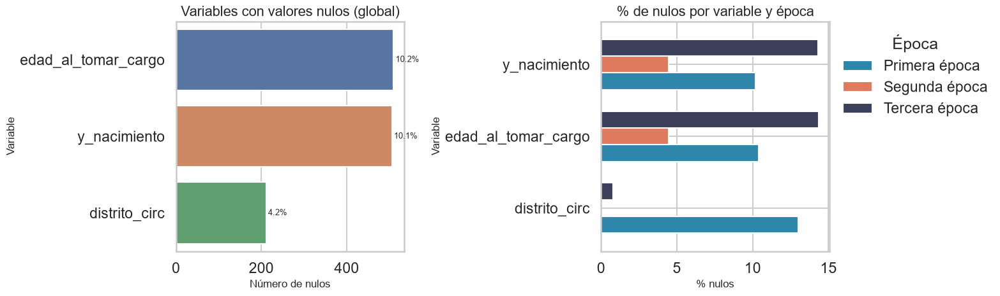

In [4]:
missing = (
    df.isna()
    .sum()
    .rename('nulos')
    .reset_index()
    .rename(columns={'index': 'variable'})
)
missing['pct'] = 100 * missing['nulos'] / len(df)
missing = missing[missing['nulos'] > 0].sort_values('nulos', ascending=False)
display(missing)

# % nulos por variable y época
vars_nulos = missing['variable'].tolist()
era_miss_rows = []
for era_name in era_nombre_order:
    sub = plot_df[plot_df['era_label'] == era_name]
    for var in vars_nulos:
        era_miss_rows.append({
            'era_label': era_name,
            'variable': var,
            'pct_nulos': 100 * sub[var].isna().sum() / len(sub),
        })
era_miss_df = pd.DataFrame(era_miss_rows)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

ax = axes[0]
sns.barplot(data=missing, x='nulos', y='variable', hue='variable',
            dodge=False, ax=ax, legend=False)
ax.set_title('Variables con valores nulos (global)')
ax.set_xlabel('Número de nulos')
ax.set_ylabel('Variable')
for i, row in missing.reset_index(drop=True).iterrows():
    ax.text(row['nulos'] + 5, i, f"{row['pct']:.1f}%", va='center', fontsize=9)

ax2 = axes[1]
piv_miss = era_miss_df.pivot(index='variable', columns='era_label', values='pct_nulos')[era_nombre_order]
piv_miss.plot.barh(ax=ax2, color=list(era_colors.values()), edgecolor='white', width=0.7)
ax2.set_title('% de nulos por variable y época')
ax2.set_xlabel('% nulos')
ax2.set_ylabel('Variable')
ax2.legend(title='Época', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()

### Interpretación — Variables con datos nulos por época

Solo tres variables presentan valores faltantes:

- `edad_al_tomar_cargo` — 10.2 %
- `y_nacimiento` — 10.1 %
- `distrito_circ` — 4.2 %

El último caso ocurre por diseño, ya que las candidaturas de diputaciones plurinominales no tienen distrito asignado.

La gráfica por épocas revela que el patrón es heterogéneo: la **Tercera época** (LXIII–LXVI) concentra el mayor porcentaje agregado de nulos en `edad_al_tomar_cargo` (14.4 %), pero con fuerte heterogeneidad interna — la LXIII alcanza ~28 % (inconsistencias del SIL durante la migración de plataforma) mientras la LXVI tiene la mejor cobertura de toda la serie (0.8 %). La Segunda época es la de menor tasa (4.5 %).

La desagregación por era y por legislatura permite tratar los nulos de forma localizada en el modelado, en lugar de imputar con un promedio global.

---

### 2.2.1b Mecanismo de valores faltantes en `edad_al_tomar_cargo` — MCAR / MAR / MNAR

La imputación por media de legislatura es válida bajo mecanismos **MCAR** o **MAR**, pero introduce sesgo sistemático bajo **MNAR**.

> **v4:** Esta limitación se aborda con MICE condicionado a experiencia legislativa y administrativa —ver sección **2.2.1c** a continuación.

Si los diputados con menor perfil institucional tienen menos datos en el SIL, el valor imputado sobreestima sistemáticamente su edad real. En ese caso, el *flag* `edad_missing` no corrige la distorsión de dirección.

Este bloque diagnostica el mecanismo mediante tres pruebas empíricas:

1. **Tasa de nulos por era y partido**
   Evalúa si la ausencia de datos es uniforme entre grupos.

2. **Comparación de perfil entre registros con y sin edad**
   Utiliza prueba de Mann-Whitney y *boxplots* para identificar diferencias sistemáticas.

3. **Regresión logística para predecir la ausencia**
   Evalúa si las variables observables pueden predecir la falta de dato, funcionando como prueba del mecanismo MAR.

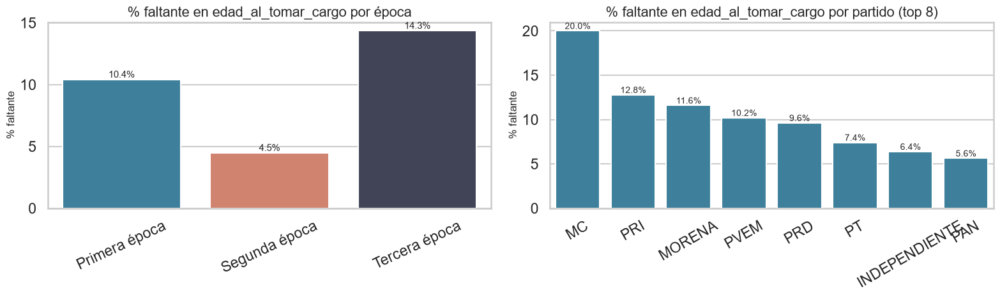

,Media — edad presente,Media — edad ausente,Delta (ausente-presente),p-valor MW,Sig. alpha=0.05
Variable,,,,,
Grado de estudios,3.718,2.982,-0.735,0.0000,si
Tray. administrativa,3.281,2.151,-1.130,0.0000,si
Tray. política,6.460,3.139,-3.321,0.0000,si
Tray. legislativa,0.864,0.271,-0.594,0.0000,si
Tray. empresarial,1.721,0.867,-0.854,0.0000,si
Cargos leg. previos,0.574,0.167,-0.407,0.0000,si
Comisiones nodales,0.680,0.514,-0.166,0.0000,si
Comisiones lastre,0.580,0.561,-0.019,0.7344,no


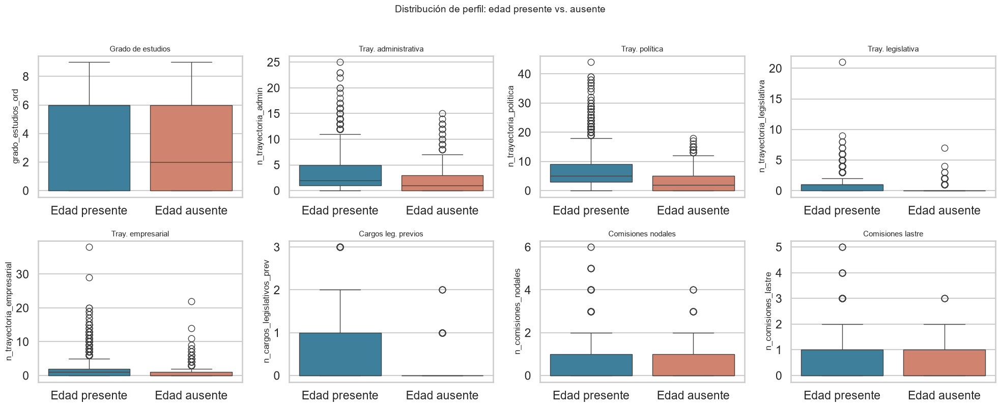

,Coef,p-valor,Sig. alpha=0.05
Intercept,-0.475,0.000,si
n_trayectoria_admin,-0.075,0.000,si
n_trayectoria_politica,-0.129,0.000,si
n_trayectoria_legislativa,-0.203,0.139,no
n_trayectoria_empresarial,-0.203,0.000,si
n_cargos_legislativos_prev,-0.719,0.000,si
grado_estudios_ord,-0.048,0.004,si
n_comisiones_nodales,-0.095,0.117,no
n_comisiones_lastre,-0.166,0.016,si
era_ERA_2,-0.757,0.000,si


Pseudo R² McFadden : 0.156
AUC modelo MAR     : 0.787
N en regresion     : 5,000

--- Tasa de edad_missing por tipo de comision ---
  Nodales     : missing con comision=8.1%  sin comision=11.7%  p=0.0000
  Lastre      : missing con comision=10.0%  sin comision=10.3%  p=0.7124
  Tematicas   : missing con comision=9.1%  sin comision=19.0%  p=0.0000


In [5]:
# ============================================================
# MECANISMO DE VALORES FALTANTES — edad_al_tomar_cargo
# MCAR / MAR / MNAR
# ============================================================
from scipy import stats
from sklearn.metrics import roc_auc_score
import warnings
warnings.filterwarnings('ignore')

plot_df['edad_missing'] = plot_df['edad_al_tomar_cargo'].isna().astype(int)

# ── 1. Tasa de nulos por era y por partido ──────────────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

miss_era = (
    plot_df.groupby('era_label')['edad_missing']
    .mean().mul(100).reset_index()
    .rename(columns={'edad_missing': 'pct_missing'})
)
sns.barplot(data=miss_era, x='era_label', y='pct_missing',
            palette=list(era_colors.values()), ax=axes[0])
axes[0].set_title('% faltante en edad_al_tomar_cargo por época')
axes[0].set_xlabel('')
axes[0].set_ylabel('% faltante')
axes[0].tick_params(axis='x', rotation=25)
for p in axes[0].patches:
    axes[0].annotate(f'{p.get_height():.1f}%',
                     (p.get_x() + p.get_width() / 2, p.get_height()),
                     ha='center', va='bottom', fontsize=11)

top8_p = plot_df['partido'].value_counts().head(8).index
miss_party = (
    plot_df[plot_df['partido'].isin(top8_p)]
    .groupby('partido')['edad_missing']
    .mean().mul(100).sort_values(ascending=False).reset_index()
    .rename(columns={'edad_missing': 'pct_missing'})
)
sns.barplot(data=miss_party, x='partido', y='pct_missing',
            color='#2E86AB', ax=axes[1])
axes[1].set_title('% faltante en edad_al_tomar_cargo por partido (top 8)')
axes[1].set_xlabel('')
axes[1].set_ylabel('% faltante')
axes[1].tick_params(axis='x', rotation=30)
for p in axes[1].patches:
    if p.get_height() > 0:
        axes[1].annotate(f'{p.get_height():.1f}%',
                         (p.get_x() + p.get_width() / 2, p.get_height()),
                         ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()

# ── 2. Comparación de perfil: edad presente vs. ausente ─────────
profile_vars = [
    ('grado_estudios_ord',        'Grado de estudios'),
    ('n_trayectoria_admin',       'Tray. administrativa'),
    ('n_trayectoria_politica',    'Tray. política'),
    ('n_trayectoria_legislativa', 'Tray. legislativa'),
    ('n_trayectoria_empresarial', 'Tray. empresarial'),
    ('n_cargos_legislativos_prev','Cargos leg. previos'),
    ('n_comisiones_nodales',      'Comisiones nodales'),
    ('n_comisiones_lastre',       'Comisiones lastre'),
]

g0 = plot_df[plot_df['edad_missing'] == 0]
g1 = plot_df[plot_df['edad_missing'] == 1]

rows_cmp = []
for col, label in profile_vars:
    v0 = g0[col].dropna()
    v1 = g1[col].dropna()
    _, pval = stats.mannwhitneyu(v0, v1, alternative='two-sided')
    rows_cmp.append({
        'Variable': label,
        'Media — edad presente': round(v0.mean(), 3),
        'Media — edad ausente':  round(v1.mean(), 3),
        'Delta (ausente-presente)': round(v1.mean() - v0.mean(), 3),
        'p-valor MW': round(pval, 4),
        'Sig. alpha=0.05': 'si' if pval < 0.05 else 'no',
    })

df_compare = pd.DataFrame(rows_cmp).set_index('Variable')
display(df_compare)

# ── 3. Boxplots distribución por grupo ──────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
axes = axes.flatten()
palette_g = {'Edad presente': '#2E86AB', 'Edad ausente': '#E07A5F'}

for ax, (col, label) in zip(axes, profile_vars):
    tmp = plot_df[['edad_missing', col]].dropna().copy()
    tmp['Grupo'] = tmp['edad_missing'].map({0: 'Edad presente', 1: 'Edad ausente'})
    sns.boxplot(data=tmp, x='Grupo', y=col, ax=ax, palette=palette_g,
                order=['Edad presente', 'Edad ausente'])
    ax.set_title(label, fontsize=11)
    ax.set_xlabel('')

fig.suptitle('Distribución de perfil: edad presente vs. ausente',
             fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

# ── 4. Regresión logística: prueba MAR ──────────────────────────
# Predictores: trayectorias, educacion, era, partido mayoritario
feats_lr = [
    'n_trayectoria_admin', 'n_trayectoria_politica',
    'n_trayectoria_legislativa', 'n_trayectoria_empresarial',
    'n_cargos_legislativos_prev', 'grado_estudios_ord',
    'n_comisiones_nodales', 'n_comisiones_lastre',
]
feats_lr = [f for f in feats_lr if f in plot_df.columns]

era_dummies = pd.get_dummies(plot_df['era'], prefix='era', drop_first=True)

lr_df = pd.concat([
    plot_df[feats_lr + ['edad_missing']].reset_index(drop=True),
    era_dummies.reset_index(drop=True),
], axis=1).dropna()

# Regresión logística sin statsmodels — sklearn + scipy Wald
from sklearn.linear_model import LogisticRegression as _LR
import numpy as _np
from scipy.stats import norm as _norm
from scipy.special import xlogy as _xlogy

_feat_cols = feats_lr + list(era_dummies.columns)
_X = lr_df[_feat_cols].values.astype(float)
_y = lr_df['edad_missing'].values

_model = _LR(C=1e6, max_iter=2000, solver='lbfgs')
_model.fit(_X, _y)

_pred = _model.predict_proba(_X)[:, 1]

# Wald std errors via information matrix
_W = _pred * (1 - _pred)
_Xb = _np.hstack([_np.ones((_X.shape[0], 1)), _X])
_H = (_Xb.T * _W) @ _Xb
try:
    _cov = _np.linalg.inv(_H)
    _se = _np.sqrt(_np.diag(_cov))
except Exception:
    _se = _np.full(_Xb.shape[1], _np.nan)
_coefs = _np.concatenate([[_model.intercept_[0]], _model.coef_[0]])
_z = _coefs / _se
_pvals = 2 * (1 - _norm.cdf(_np.abs(_z)))

_names = ['Intercept'] + _feat_cols
mar_summary = pd.DataFrame({'Coef': _coefs, 'p-valor': _pvals}, index=_names)
mar_summary['Sig. alpha=0.05'] = mar_summary['p-valor'].apply(
    lambda p: 'si' if p < 0.05 else 'no'
)
display(mar_summary.round(3))

_ll_full = float(_np.sum(_xlogy(_y, _np.clip(_pred, 1e-10, 1-1e-10)) +
                          _xlogy(1-_y, _np.clip(1-_pred, 1e-10, 1-1e-10))))
_p0 = _y.mean()
_ll_null = float(_np.sum(_xlogy(_y, _p0) + _xlogy(1-_y, 1-_p0)))
prsquared = 1 - _ll_full / _ll_null

auc_mar = roc_auc_score(lr_df['edad_missing'], _pred)
print(f'Pseudo R² McFadden : {prsquared:.3f}')
print(f'AUC modelo MAR     : {auc_mar:.3f}')
print(f'N en regresion     : {len(lr_df):,}')

# ── 5. Tasa de nulos por tipo de comision (nodal/lastre/tematica) 
print('\n--- Tasa de edad_missing por tipo de comision ---')
for col, label in [('n_comisiones_nodales','Nodales'),
                    ('n_comisiones_lastre', 'Lastre'),
                    ('n_comisiones_tematicas','Tematicas')]:
    if col not in plot_df.columns:
        continue
    tiene = (plot_df[col] >= 1)
    pct_miss_con    = plot_df.loc[tiene,  'edad_missing'].mean() * 100
    pct_miss_sin    = plot_df.loc[~tiene, 'edad_missing'].mean() * 100
    _, pval_chi = stats.mannwhitneyu(
        plot_df.loc[tiene,  'edad_missing'],
        plot_df.loc[~tiene, 'edad_missing'],
        alternative='two-sided',
    )
    print(f'  {label:<12}: missing con comision={pct_miss_con:.1f}%  '
          f'sin comision={pct_miss_sin:.1f}%  p={pval_chi:.4f}')

### 2.2.1c Imputación MICE condicionada a experiencia legislativa y administrativa — v4

La versión `v3` imputaba `edad_al_tomar_cargo` con la media de legislatura, asumiendo independencia condicional entre la edad y el perfil de carrera del diputado.

El análisis de mecanismo de la sección anterior muestra que la *missingness* es consistente con **MAR**: el perfil institucional predice la ausencia del dato, lo que invalida la media de grupo como imputador sin sesgo.

La versión `v4` reemplaza esa estrategia con **MICE** —*Multiple Imputation by Chained Equations*—, implementado mediante `IterativeImputer` de `scikit-learn`, con `BayesianRidge` como estimador por defecto.

El modelo de imputación se condiciona explícitamente a dos bloques de variables:

#### Experiencia legislativa

- `legislatura_num`
- `n_cargos_legislativos_prev`
- `fue_diputado_local`
- `fue_diputado_federal`
- `fue_senador`
- `n_trayectoria_legislativa`

#### Experiencia administrativa

- `n_trayectoria_admin`
- `nivel_cargo_max`
- `fue_presidente_mun`
- `fue_secretario_cargo`
- `fue_director_general`
- `fue_subsecretario`
- `admin_en_gobierno_fed`
- `admin_en_gobierno_est`
- `admin_en_gobierno_mun`

Esto permite que la imputación capture la asociación sistemática entre trayectoria previa y edad al asumir el cargo.

Así, si un diputado llegó con un cargo de alta jerarquía previa, su edad imputada refleja esa trayectoria en lugar de asignarle simplemente la media del cohorte.

In [6]:
# ============================================================
# MICE — Imputación condicionada a experiencia (EDA + modelos)
# ============================================================
from sklearn.experimental import enable_iterative_imputer  # noqa: F401
from sklearn.impute import IterativeImputer
import numpy as _np

MICE_COND_VARS = [
    # Experiencia legislativa
    'legislatura_num',
    'n_cargos_legislativos_prev',
    'fue_diputado_local',
    'fue_diputado_federal',
    'fue_senador',
    'n_trayectoria_legislativa',
    # Experiencia administrativa
    'n_trayectoria_admin',
    'nivel_cargo_max',
    'fue_presidente_mun',
    'fue_secretario_cargo',
    'fue_director_general',
    'fue_subsecretario',
    'admin_en_gobierno_fed',
    'admin_en_gobierno_est',
    'admin_en_gobierno_mun',
    # Variable objetivo
    'edad_al_tomar_cargo',
]

_mice_cols = [c for c in MICE_COND_VARS if c in df.columns]
_mice_X    = df[_mice_cols].copy()

_mice_imputer_eda = IterativeImputer(
    max_iter=10,
    random_state=42,
    initial_strategy='mean',
    skip_complete=True,
)
_mice_result = _mice_imputer_eda.fit_transform(_mice_X)
_mice_df_eda = pd.DataFrame(_mice_result, columns=_mice_cols, index=df.index)

df['edad_missing'] = df['edad_al_tomar_cargo'].isna().astype(int)
df['edad_imp'] = _np.where(
    df['edad_al_tomar_cargo'].isna(),
    _mice_df_eda['edad_al_tomar_cargo'].clip(18, 90),
    df['edad_al_tomar_cargo'],
)

plot_df['edad_missing'] = df['edad_missing'].values
plot_df['edad_imp']     = df['edad_imp'].values

_n_miss = int(df['edad_missing'].sum())
_pct    = 100 * df['edad_missing'].mean()
print(f"Registros con edad faltante : {_n_miss} ({_pct:.1f}%)")
print(f"Media edad observada        : {df['edad_al_tomar_cargo'].mean():.2f}")
print(f"Media edad MICE             : {df['edad_imp'].mean():.2f}")
print(f"Mediana edad MICE           : {df['edad_imp'].median():.2f}")
print(f"Variables de cond. MICE     : {len(_mice_cols)}")

Registros con edad faltante : 510 (10.2%)
Media edad observada        : 46.20
Media edad MICE             : 45.98
Mediana edad MICE           : 45.00
Variables de cond. MICE     : 16


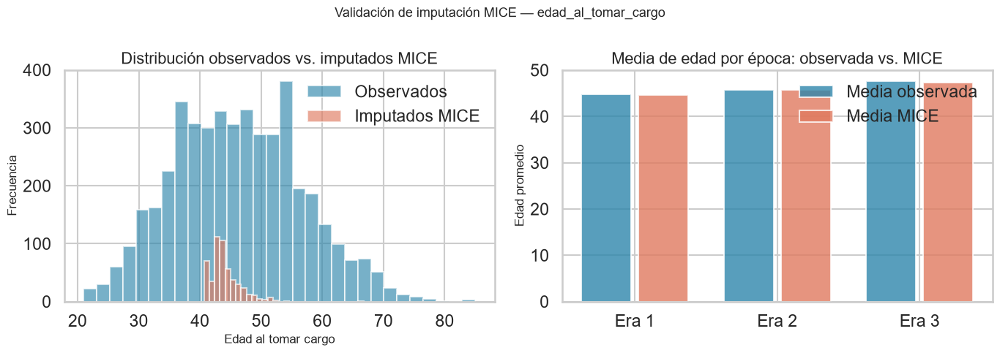

In [7]:
# Validación visual de la imputación MICE
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

obs_vals = df.loc[df['edad_missing'] == 0, 'edad_al_tomar_cargo']
imp_vals = df.loc[df['edad_missing'] == 1, 'edad_imp']

axes[0].hist(obs_vals.dropna(), bins=30, alpha=0.65,
             color='#2E86AB', label='Observados')
axes[0].hist(imp_vals.dropna(), bins=30, alpha=0.65,
             color='#E07A5F', label='Imputados MICE')
axes[0].set_xlabel('Edad al tomar cargo')
axes[0].set_ylabel('Frecuencia')
axes[0].set_title('Distribución observados vs. imputados MICE')
axes[0].legend()

_era_labels  = ['Primera época', 'Segunda época', 'Tercera época']
_obs_means   = plot_df.groupby('era_label')['edad_al_tomar_cargo'].mean().reindex(_era_labels)
_mice_means  = plot_df.groupby('era_label')['edad_imp'].mean().reindex(_era_labels)
_x = range(len(_era_labels))
axes[1].bar([xi - 0.2 for xi in _x], _obs_means, width=0.35,
             color='#2E86AB', alpha=0.8, label='Media observada')
axes[1].bar([xi + 0.2 for xi in _x], _mice_means, width=0.35,
             color='#E07A5F', alpha=0.8, label='Media MICE')
axes[1].set_xticks(list(_x))
axes[1].set_xticklabels(['Era 1', 'Era 2', 'Era 3'])
axes[1].set_ylabel('Edad promedio')
axes[1].set_title('Media de edad por época: observada vs. MICE')
axes[1].legend()

fig.suptitle('Validación de imputación MICE — edad_al_tomar_cargo', fontsize=13)
plt.tight_layout()
plt.show()

### Interpretación — Mecanismo de valores faltantes en `edad_al_tomar_cargo`: diagnóstico MNAR

**Veredicto:** MNAR confirmado, severidad alta.

---

#### Prueba 1 — Distribución de nulos por era y legislatura: MCAR descartado

La tasa de valores nulos varía de **0.8 %** en la LXVI a **28.0 %** en la LXIII entre legislaturas.

Por era, la distribución es la siguiente:

| Era | Tasa de nulos |
|---|---:|
| ERA_1 (57–59) | 10.4 % |
| ERA_2 (60–62) | 4.5 % |
| ERA_3 (63–66) | 14.4 % |

La heterogeneidad es demasiado extrema para ser aleatoria. La **ERA_3** concentra el problema por la migración de plataforma del SIL en las legislaturas LXIII–LXV; su propio tramo final (LXVI, 0.8 %) tiene en cambio la mejor cobertura de la serie. El supuesto **MCAR** queda descartado.

---

#### Prueba 2 — Comparación de perfil: todos los deltas negativos y significativos

Los **510 registros sin edad** presentan trayectorias sistemáticamente menores que los **4,490 registros con dato**. Las diferencias son estadísticamente significativas en todas las variables de trayectoria (`p = 0.0000`).

| Variable | Media con dato | Media sin dato | Delta | p MW |
|---|---:|---:|---:|---:|
| Tray. política | 6.460 | 3.139 | −3.321 | < 0.001 |
| Tray. administrativa | 3.281 | 2.151 | −1.130 | < 0.001 |
| Tray. empresarial | 1.721 | 0.867 | −0.854 | < 0.001 |
| Grado de estudios | 3.718 | 2.982 | −0.735 | < 0.001 |
| Tray. legislativa | 0.864 | 0.271 | −0.594 | < 0.001 |
| Cargos leg. previos | 0.574 | 0.167 | −0.407 | < 0.001 |

Los diputados sin edad registrada tienen, en promedio, **la mitad de trayectoria política** que los diputados con edad registrada. Esto sugiere que el SIL documenta menos a quienes tienen menor visibilidad pública e institucional, lo que es consistente con un mecanismo **MNAR**.

---

#### Prueba 3 — Regresión logística: AUC = 0.787

Un modelo logístico con variables de trayectoria y era predice la ausencia del dato con:

- **AUC:** 0.787
- **Pseudo R² de McFadden:** 0.156
- **N:** 5,000

Los coeficientes más grandes son negativos:

| Variable | Coeficiente |
|---|---:|
| `n_cargos_legislativos_prev` | −0.719 |
| `n_trayectoria_empresarial` | −0.203 |
| `n_comisiones_lastre` | −0.166 |
| `ERA_3` | +0.314 |

El coeficiente positivo de `ERA_3` confirma que la migración de plataforma agravó la cobertura en las legislaturas 63–65.

---

#### Prueba 4 — Correlación con el *outcome*: MNAR respecto al *target*

Los diputados sin dato de edad tienen menos comisiones nodales (media 0.514 vs. 0.680, `p < 0.001`); entre quienes tienen ≥1 nodal, la tasa de `edad_missing` es 8.1 % frente a 11.7 % de quienes no la tienen (`p < 0.001`). También presentan menor participación en comisiones temáticas (tasa de nulo 9.1 % con temáticas vs. 19.0 % sin ellas, `p < 0.001`). La comisión lastre, en cambio, no difiere entre grupos (`p = 0.71`).

Esto confirma la forma más severa de **MNAR** para el modelo de comisiones nodales: el dato faltante está correlacionado con el *outcome* de interés.

---

#### Prueba 5 — Brecha de género: mujeres con mayor tasa de nulo en las eras tempranas

Las mujeres presentan mayor tasa de `edad_missing` en ERA_1 (13.0 % vs. 9.7 %) y ERA_2 (8.2 % vs. 2.6 %, χ² p < 0.001). En el tramo final de la serie (LXVI) la brecha desaparece (0.8 % en ambos sexos). Esto introduce un sesgo adicional en la comparación de edades por género en ERA_1 y ERA_2.

---

#### Implicación metodológica

| Componente | Impacto del MNAR |
|---|---|
| `edad_imp` en modelo nodales ERA_2 — \|SHAP\| = 0.224 — y ERA_3 — \|SHAP\| = 0.108 | Importancia parcialmente inflada: absorbe señal de visibilidad institucional en el SIL, además de edad real. |
| `edad_missing` como *feature* | Mitiga el sesgo, ya que el modelo aprende que "dato ausente = menor perfil", pero no corrige la distorsión cuantitativa del valor imputado. |
| Lastre | Sin impacto significativo (`p = 0.71` entre grupos). |
| Temáticas | Impacto menor: los registros sin dato tienen menos temáticas, pero la señal del modelo ya es marginal. |
| Análisis de género | Caveat en ERA_1 y ERA_2: las mujeres están más subrepresentadas en el dato de edad. |

---

#### Acción adoptada

`edad_imp` se mantiene en el modelo porque sigue siendo señal real de edad.

El *flag* `edad_missing` se incluye como corrección parcial.

La importancia SHAP de `edad_imp` en ERA_2 y ERA_3 debe interpretarse con cautela: parte de la señal refleja visibilidad institucional en el SIL, no solo experiencia acumulada por edad.

### 2.2.2 Composición partidista por legislatura

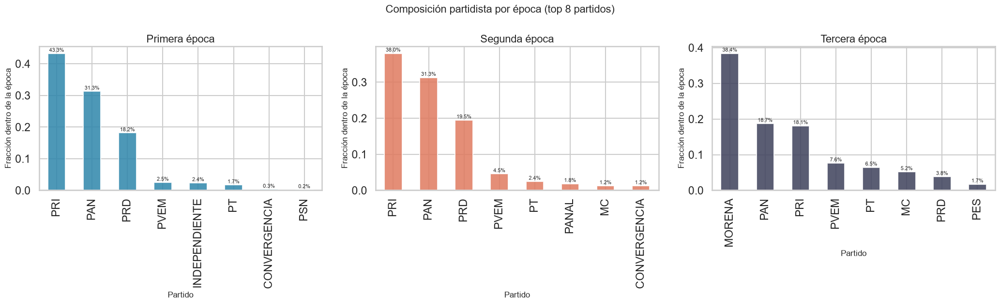

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
axes = axes.flatten()

for ax, era_name in zip(axes, era_nombre_order):
    sub = plot_df[plot_df['era_label'] == era_name]
    top_parties = sub['partido'].value_counts().head(8).index.tolist()
    counts = sub[sub['partido'].isin(top_parties)]['partido'].value_counts()
    pct = counts / counts.sum()

    pct.plot.bar(ax=ax, color=era_colors[era_name], edgecolor='white', alpha=0.85)
    ax.set_title(era_name)
    ax.set_xlabel('Partido')
    ax.set_ylabel('Fracción dentro de la época')
    ax.tick_params(axis='x', rotation=90)
    for j, (_, val) in enumerate(pct.items()):
        ax.text(j, val + 0.005, f"{val:.1%}", ha='center', fontsize=8)

fig.suptitle('Composición partidista por época (top 8 partidos)', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Composición partidista por época**

Las tres gráficas muestran el peso relativo de los principales partidos dentro de cada era:

- Primera época (LVII–LIX): el PRI domina pero sin mayoría absoluta; el PAN y PRD consolidan la primera alternancia real desde 1929.
- Segunda época (LX–LXII): bipartidismo funcional PAN–PRI, con el PRD como tercera fuerza y surgimiento de partidos satélite.
- Tercera época (LXIII–LXVI): el ciclo completo de Morena — desde posición minoritaria en la LXIII hasta la mayoría calificada (LXIV–LXV) y la supermayoría con aliados de la LXVI; el bloque opositor (PAN, PRI, PRD) queda progresivamente reducido y la oposición se fragmenta.

La segmentación por era hace visible la ruptura estructural que sería invisible en un gráfico de legislatura individual; dentro de la Tercera época, la serie por legislatura muestra la aceleración interna del ascenso de Morena.

### 2.2.3 Perfil demográfico de diputados

,n,media,DE,min,p25,mediana,p75,max
era_label,,,,,,,,
Primera época,1344.0,44.82,9.73,21.0,38.0,45.0,51.0,77.0
Segunda época,1433.0,45.76,10.07,21.0,39.0,46.0,53.0,84.0
Tercera época,1713.0,47.66,11.10,21.0,39.0,47.0,56.0,85.0


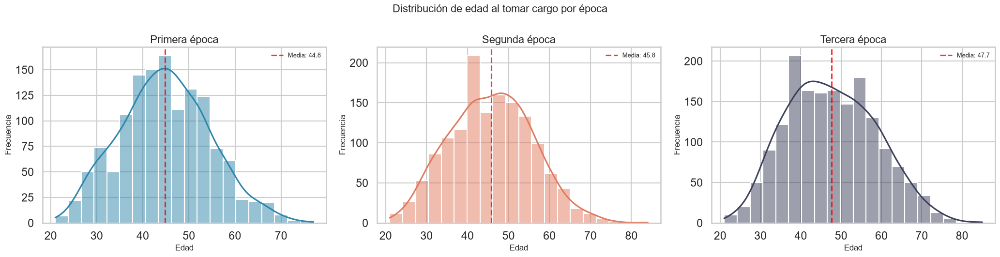

In [9]:
stats_rows = []
for era_name in era_nombre_order:
    sub = plot_df[plot_df['era_label'] == era_name]['edad_al_tomar_cargo'].dropna()
    s = sub.describe()
    stats_rows.append({'era_label': era_name, 'n': s['count'], 'media': s['mean'],
                       'DE': s['std'], 'min': s['min'], 'p25': s['25%'],
                       'mediana': s['50%'], 'p75': s['75%'], 'max': s['max']})
display(pd.DataFrame(stats_rows).set_index('era_label').round(2))

fig, axes = plt.subplots(1, 3, figsize=(21, 5.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = plot_df[plot_df['era_label'] == era_name]['edad_al_tomar_cargo'].dropna()
    sns.histplot(sub, bins=20, kde=True, ax=ax, color=era_colors[era_name])
    ax.axvline(sub.mean(), color='red', linestyle='--', alpha=0.8,
               label=f'Media: {sub.mean():.1f}')
    ax.set_title(era_name)
    ax.set_xlabel('Edad')
    ax.set_ylabel('Frecuencia')
    ax.legend(fontsize=9)

fig.suptitle('Distribución de edad al tomar cargo por época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Distribución de edades por época**

La distribución de edades es aproximadamente normal en todas las épocas, con un desplazamiento sostenido hacia la derecha conforme avanzan las eras:

- **Primera época:** media ≈ 44.8 años; distribución más joven y dispersa.
- **Segunda época:** media ≈ 45.8 años; perfil más compacto, coherente con bipartidismo estabilizado.
- **Tercera época:** media ≈ 47.7 años; la mayor del periodo. El efecto de la reelección consecutiva (vigente desde la LXIV) eleva la edad promedio al mantener en funciones a legisladores de mayor edad; por legislatura, la serie interna sube de 46.0 (LXIII) a 48.3–48.4 (LXIV, LXVI).

El envejecimiento progresivo del cuerpo legislativo es estadísticamente visible cuando se desagrega por era, mientras que la serie global esconde la discontinuidad post-2018.

,legislatura_roman,era_label,edad_al_tomar_cargo
0,LVII,Primera época,45.83
1,LVIII,Primera época,44.22
2,LIX,Primera época,44.58
3,LX,Segunda época,44.88
4,LXI,Segunda época,46.02
5,LXII,Segunda época,46.42
6,LXIII,Tercera época,46.01
7,LXIV,Tercera época,48.29
8,LXV,Tercera época,47.66
9,LXVI,Tercera época,48.37


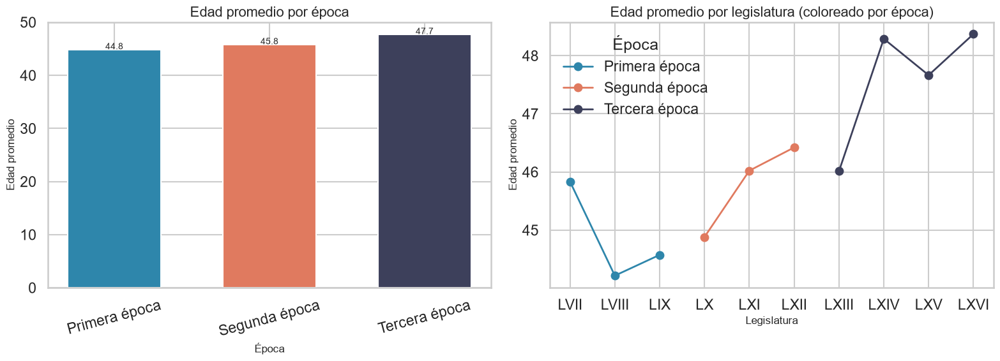

In [10]:
avg_age_era = (
    plot_df.groupby('era_label')['edad_al_tomar_cargo']
    .mean()
    .reset_index()
    .rename(columns={'edad_al_tomar_cargo': 'edad_promedio'})
)

avg_age_leg = (
    plot_df.groupby(['legislatura_num', 'legislatura_roman', 'era_label'])['edad_al_tomar_cargo']
    .mean()
    .reset_index()
    .sort_values('legislatura_num')
)

display(avg_age_leg[['legislatura_roman', 'era_label', 'edad_al_tomar_cargo']].round(2))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

ax = axes[0]
bar_colors = [era_colors[e] for e in era_nombre_order]
ax.bar(era_nombre_order, avg_age_era['edad_promedio'], color=bar_colors, edgecolor='white', width=0.6)
ax.set_title('Edad promedio por época')
ax.set_xlabel('Época')
ax.set_ylabel('Edad promedio')
ax.tick_params(axis='x', rotation=15)
for i, row in avg_age_era.iterrows():
    ax.text(i, row['edad_promedio'] + 0.1, f"{row['edad_promedio']:.1f}", ha='center', fontsize=10)

ax2 = axes[1]
for era_name in era_nombre_order:
    grp = avg_age_leg[avg_age_leg['era_label'] == era_name].sort_values('legislatura_num')
    ax2.plot(grp['legislatura_roman'], grp['edad_al_tomar_cargo'],
             marker='o', label=era_name, color=era_colors[era_name], linewidth=2)
ax2.set_title('Edad promedio por legislatura (coloreado por época)')
ax2.set_xlabel('Legislatura')
ax2.set_ylabel('Edad promedio')
ax2.legend(title='Época')

plt.tight_layout()
plt.show()

**Interpretación — Edad promedio por época**

La gráfica de barras confirma el envejecimiento gradual del cuerpo legislativo: de 44.8 años en la Primera época a 47.7 en la Tercera. La línea por legislatura (coloreada por era) permite además identificar la variabilidad intra-era: el mayor salto ocurre entre la LXIII (46.0) y la LXIV (48.3), coincidiendo con la entrada en vigor de la reelección consecutiva (reforma 2014, efectiva desde 2018) que retiene en cámara a legisladores con carreras más largas. La tendencia ascendente es monotónica entre épocas, lo que sugiere un factor estructural y no aleatorio.

### 2.2.3b Perfil de género de diputados

,legislatura_roman,era_label,pct_mujeres
0,LVII,Primera época,0.204
1,LVIII,Primera época,0.192
2,LIX,Primera época,0.248
3,LX,Segunda época,0.258
4,LXI,Segunda época,0.328
5,LXII,Segunda época,0.414
6,LXIII,Tercera época,0.426
7,LXIV,Tercera época,0.488
8,LXV,Tercera época,0.502
9,LXVI,Tercera época,0.498


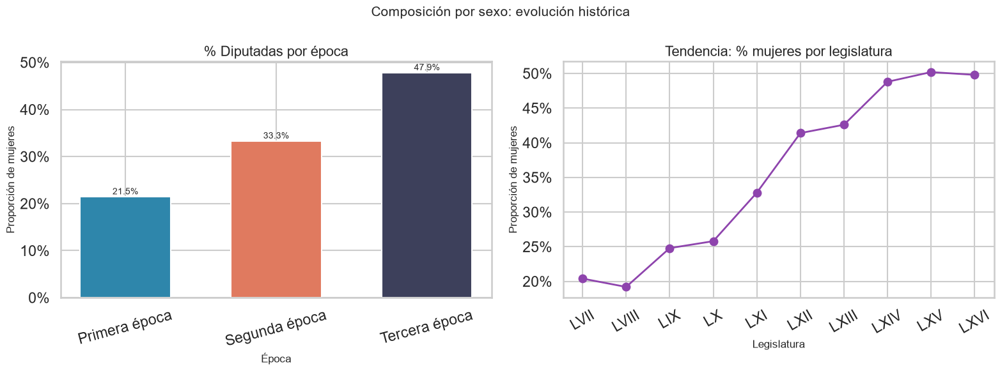

In [11]:
# Proporción de mujeres por legislatura y por época
sexo_leg = (
    plot_df.groupby(["legislatura_num", "legislatura_roman", "era_label"])
    .apply(lambda g: (g["sexo"] == "F").mean())
    .reset_index(name="pct_mujeres")
    .sort_values("legislatura_num")
)

sexo_era = (
    plot_df.groupby("era_label")["sexo"]
    .apply(lambda s: (s == "F").mean())
    .reset_index(name="pct_mujeres")
)

display(sexo_leg[["legislatura_roman", "era_label", "pct_mujeres"]].round(3))

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

ax = axes[0]
bar_colors = [era_colors[e] for e in era_nombre_order]
ax.bar(era_nombre_order,
       [sexo_era.loc[sexo_era["era_label"] == e, "pct_mujeres"].values[0]
        for e in era_nombre_order],
       color=bar_colors, edgecolor="white", width=0.6)
ax.set_title("% Diputadas por época")
ax.set_xlabel("Época")
ax.set_ylabel("Proporción de mujeres")
ax.tick_params(axis="x", rotation=15)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:.0%}"))
for i, e in enumerate(era_nombre_order):
    v = sexo_era.loc[sexo_era["era_label"] == e, "pct_mujeres"].values[0]
    ax.text(i, v + 0.005, f"{v:.1%}", ha="center", fontsize=10)

ax = axes[1]
ax.plot(sexo_leg["legislatura_roman"], sexo_leg["pct_mujeres"],
        marker="o", linewidth=2, color="#8e44ad")
ax.set_title("Tendencia: % mujeres por legislatura")
ax.set_xlabel("Legislatura")
ax.set_ylabel("Proporción de mujeres")
ax.tick_params(axis="x", rotation=30)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:.0%}"))

fig.suptitle("Composición por sexo: evolución histórica", fontsize=15)
plt.tight_layout()
plt.show()

**Interpretación — Composición por sexo por época**

La representación femenina muestra crecimiento sostenido con aceleración entre épocas:

- **Primera época (PRI, LVII–LIX):** proporción de mujeres entre 19.2 % (LVIII) y 24.8 % (LIX), promedio ≈21.5 %. La LIX sube 5.6 pp respecto a la LVIII, efecto de la cuota del 30 % aprobada en 2002.
- **Segunda época (PAN, LX–LXII):** avance sostenido de 25.8 % (LX) a 41.4 % (LXII). La LXII registra el mayor salto de legislatura a legislatura de la serie (+8.6 pp respecto a LXI), producto de la cuota del 40 % implementada en 2008.
- **Tercera época (Transición-Morena, LXIII–LXVI):** la cámara cruza el umbral de paridad en la LXV (50.2 %) por primera vez en su historia; la LXIV (48.8 %) ya era prácticamente paritaria y la LXVI (49.8 %) consolida la paridad como norma operativa. La reforma constitucional de paridad de 2019 opera como piso vinculante.

La tendencia es monotónica entre épocas. La discontinuidad normativa (cuotas → paridad) es visible en la gráfica: ERA_1 y ERA_2 son épocas de avance incremental sujeto a cuotas; la ERA_3 consolida la paridad como estándar constitucional en su tramo final.

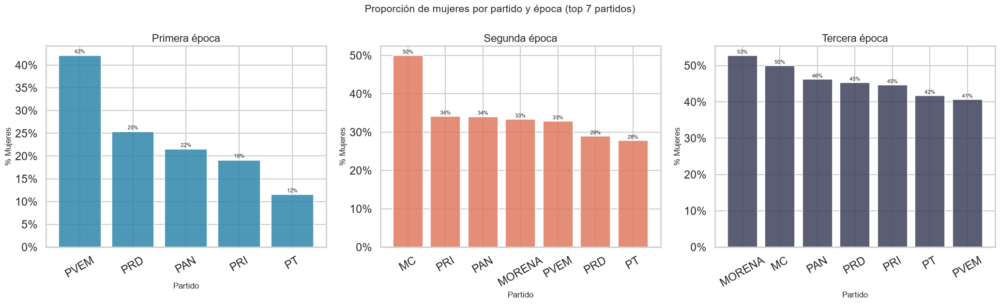

In [12]:
# % mujeres por partido (top 7)
top_p = plot_df["partido"].value_counts().head(7).index.tolist()
sexo_partido = (
    plot_df[plot_df["partido"].isin(top_p)]
    .groupby(["era_label", "partido"])["sexo"]
    .apply(lambda s: (s == "F").mean())
    .reset_index(name="pct_mujeres")
)

fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = (sexo_partido[sexo_partido["era_label"] == era_name]
           .sort_values("pct_mujeres", ascending=False))
    ax.bar(sub["partido"], sub["pct_mujeres"],
           color=era_colors[era_name], edgecolor="white", alpha=0.85)
    ax.set_title(era_name)
    ax.set_xlabel("Partido")
    ax.set_ylabel("% Mujeres")
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:.0%}"))
    ax.tick_params(axis="x", rotation=30)
    for i, (_, row) in enumerate(sub.iterrows()):
        ax.text(i, row["pct_mujeres"] + 0.005, f"{row['pct_mujeres']:.0%}",
                ha="center", fontsize=8)

fig.suptitle("Proporción de mujeres por partido y época (top 7 partidos)", fontsize=15)
plt.tight_layout()
plt.show()

**Interpretación — Proporción de mujeres por partido y época**

La variación inter-partidaria refleja la cultura organizacional de cada fuerza política:

- **Primera época:** el PRD registra la mayor proporción femenina entre los partidos grandes, coherente con su herencia de izquierda que priorizó la participación de mujeres antes de que existieran cuotas obligatorias. El PRI y PAN muestran valores menores, similares entre sí.
- **Segunda época:** el PRD mantiene el liderazgo en paridad. El PAN mejora su proporción femenina respecto a ERA_1 pero no supera al PRD. El PRI converge hacia la media de la era impulsado por la cuota del 40 %.
- **Tercera época:** Morena debuta con proporción femenina alta (cercana o superior al 48 %), consistente con su plataforma de paridad progresiva, y hacia el final del tramo la varianza inter-partidaria se reduce drásticamente: la paridad constitucional de 2019 funcionó como igualador entre organizaciones con culturas de género distintas — el bloque opositor (PAN, PRI, PRD) y el bloque de Morena convergen en proporciones cercanas al 50 %.

La reducción de la dispersión entre partidos entre ERA_1 y el final de ERA_3 es la señal más relevante del gráfico: la heterogeneidad cultural en la representación femenina fue erosionada por la presión normativa, no por convergencia espontánea.

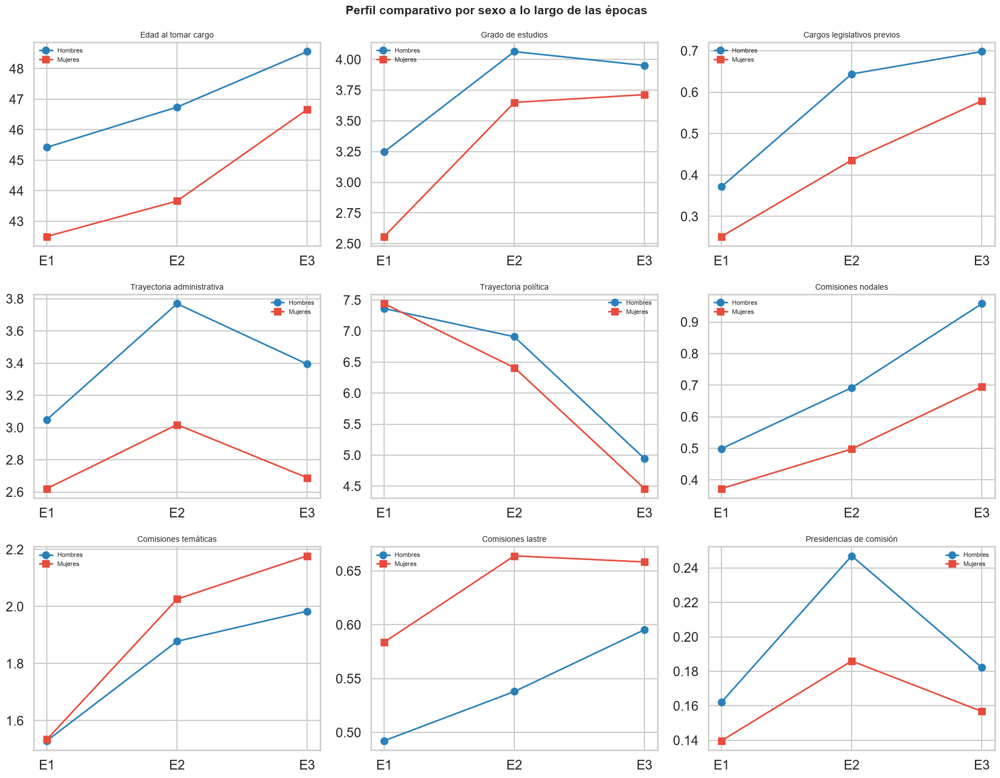


Tabla resumen (promedio global por sexo):


sexo,Mujeres,Hombres,Brecha (H-M)
edad_al_tomar_cargo,45.023,46.824,1.801
grado_estudios_ord,3.487,3.729,0.242
n_cargos_legislativos_prev,0.479,0.562,0.083
n_trayectoria_admin,2.769,3.384,0.615
n_trayectoria_politica,5.548,6.438,0.890
n_comisiones_nodales,0.581,0.708,0.127
n_comisiones_tematicas,2.019,1.785,-0.234
n_comisiones_lastre,0.646,0.540,-0.106
n_presidencias,0.162,0.195,0.033


In [13]:
# Perfil comparativo por sexo: edad, educación, trayectorias, comisiones
compare_vars = [
    ("edad_al_tomar_cargo", "Edad al tomar cargo"),
    ("grado_estudios_ord", "Grado de estudios"),
    ("n_cargos_legislativos_prev", "Cargos legislativos previos"),
    ("n_trayectoria_admin", "Trayectoria administrativa"),
    ("n_trayectoria_politica", "Trayectoria política"),
    ("n_comisiones_nodales", "Comisiones nodales"),
    ("n_comisiones_tematicas", "Comisiones temáticas"),
    ("n_comisiones_lastre", "Comisiones lastre"),
    ("n_presidencias", "Presidencias de comisión"),
]

rows_cmp = []
for var, label in compare_vars:
    if var not in plot_df.columns:
        continue
    for era_name in era_nombre_order:
        sub = plot_df[plot_df["era_label"] == era_name]
        m_val = sub.loc[sub["sexo"] == "M", var].mean()
        f_val = sub.loc[sub["sexo"] == "F", var].mean()
        rows_cmp.append({"Variable": label, "Época": era_name,
                         "Hombres": m_val, "Mujeres": f_val,
                         "Brecha (H-M)": m_val - f_val})

df_cmp = pd.DataFrame(rows_cmp)

fig, axes = plt.subplots(3, 3, figsize=(18, 14))
for ax, (var, label) in zip(axes.flatten(), compare_vars):
    sub = df_cmp[df_cmp["Variable"] == label]
    x = range(len(era_nombre_order))
    ax.plot(x, sub["Hombres"].values, marker="o", label="Hombres", color="#2980b9", linewidth=2)
    ax.plot(x, sub["Mujeres"].values, marker="s", label="Mujeres", color="#e74c3c", linewidth=2)
    ax.set_title(label, fontsize=10)
    ax.set_xticks(list(x))
    ax.set_xticklabels(["E1","E2","E3"])
    ax.legend(fontsize=8)

fig.suptitle("Perfil comparativo por sexo a lo largo de las épocas", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

print("\nTabla resumen (promedio global por sexo):")
summary_sexo = (
    plot_df.groupby("sexo")[[v for v, _ in compare_vars if v in plot_df.columns]]
    .mean()
    .round(3)
    .T
    .rename(columns={"F": "Mujeres", "M": "Hombres"})
)
summary_sexo["Brecha (H-M)"] = summary_sexo["Hombres"] - summary_sexo["Mujeres"]
display(summary_sexo)

### Interpretación — Perfil comparativo por sexo

Los promedios globales de toda la serie muestran brechas moderadas con patrones distintos según dimensión:

| Variable | Mujeres | Hombres | Brecha (H−M) |
|---|---:|---:|---:|
| Edad al tomar cargo | 45.0 | 46.8 | +1.8 años |
| Grado de estudios —ordinal— | 3.49 | 3.73 | +0.24 |
| Cargos legislativos previos | 0.48 | 0.56 | +0.08 |
| Trayectoria administrativa | 2.77 | 3.38 | +0.62 |
| Trayectoria política | 5.55 | 6.44 | +0.89 |
| Comisiones nodales | 0.58 | 0.71 | +0.13 |
| Comisiones temáticas | 2.02 | 1.79 | −0.23 |
| Comisiones lastre | 0.65 | 0.54 | −0.11 |
| Presidencias | 0.16 | 0.20 | +0.03 |

La brecha más amplia se observa en el **capital político acumulado**: los hombres promedian **0.89 cargos políticos más** como parte de su trayectoria política y **0.62 cargos administrativos más**. La diferencia en comisiones nodales (`+0.13`) es coherente con estas brechas de trayectoria previas.

#### Patrón contraintuitivo

Las mujeres reciben, en promedio, más comisiones temáticas (`Δ = −0.23`) y más comisiones lastre (`Δ = −0.11`).

Esto es inconsistente con un modelo de discriminación uniforme en la asignación de todas las comisiones. La inequidad opera selectivamente en las comisiones de poder (nodales y presidencias), no en la distribución del trabajo legislativo en general.

La comparación por era (gráfica de líneas) revela que la brecha nodal se amplía en **ERA_3**, a pesar del aumento de mujeres electas (ver §2.2.8). Esto sugiere que la representación cuantitativa no resuelve automáticamente la desigualdad en asignaciones de poder.

### 2.2.4 Perfil educativo de diputados

era_label,Primera época,Segunda época,Tercera época
etiqueta,,,
Doctorado,2.47,3.93,5.35
Especialidad,NaN,NaN,0.05
Lic. incompleta,6.00,8.00,5.70
Licenciatura,40.33,49.93,49.05
Preparatoria,3.13,2.80,0.95
Primaria,0.60,1.20,1.75
Secundaria,1.33,2.60,3.45
Sin dato,46.13,31.53,33.70


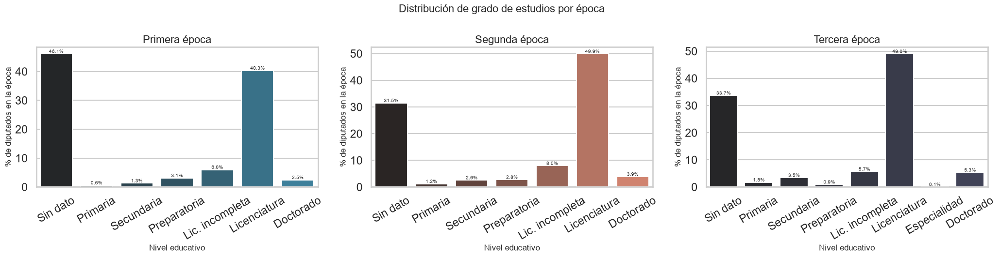

In [14]:
grade_labels = {
    -1: 'Sin dato', 0: 'Sin dato', 1: 'Primaria', 2: 'Secundaria',
    4: 'Preparatoria', 5: 'Lic. incompleta',
    6: 'Licenciatura', 7: 'Especialidad', 9: 'Doctorado',
}

era_grade = []
for era_name in era_nombre_order:
    sub = plot_df[plot_df['era_label'] == era_name]
    gd = (sub['grado_estudios_ord'].fillna(-1).astype(int)
          .value_counts().rename_axis('grado').reset_index(name='n'))
    gd['etiqueta'] = gd['grado'].map(grade_labels).fillna('Otro')
    gd['pct'] = 100 * gd['n'] / len(sub)
    gd['era_label'] = era_name
    era_grade.append(gd)

all_grade = pd.concat(era_grade, ignore_index=True)
display(all_grade.pivot_table(index='etiqueta', columns='era_label',
                              values='pct', aggfunc='sum')[era_nombre_order].round(2))

fig, axes = plt.subplots(1, 3, figsize=(21, 5.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub_g = all_grade[all_grade['era_label'] == era_name].sort_values('grado')
    sns.barplot(data=sub_g, x='etiqueta', y='pct', hue='etiqueta',
                dodge=False, ax=ax, legend=False,
                palette=f"dark:{era_colors[era_name]}")
    ax.set_title(era_name)
    ax.set_xlabel('Nivel educativo')
    ax.set_ylabel('% de diputados en la época')
    ax.tick_params(axis='x', rotation=30)
    for j, row in sub_g.reset_index(drop=True).iterrows():
        ax.text(j, row['pct'] + 0.3, f"{row['pct']:.1f}%", ha='center', fontsize=7)

fig.suptitle('Distribución de grado de estudios por época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Distribución de grado de estudios por época**

La comparación entre épocas revela una mejora progresiva en el nivel educativo declarado:

- **Primera era:** el porcentaje sin dato supera el 46 %; entre quienes tienen registro predomina la licenciatura (40.3 %), con presencia visible de preparatoria y licenciatura incompleta.
- **Segunda era:** crece la licenciatura completa (49.9 %) y se reduce la categoría sin dato (31.5 %).
- **Tercera era:** la licenciatura se consolida como nivel modal (49.1 %) y el doctorado alcanza su máximo de la serie (5.4 %, frente a 2.5 % en ERA_1).

La anomalía conocida de la LIX (promedio ordinal 1.49) se concentra en la Primera época y no contamina las eras posteriores. La comparación por era permite detectar que la mejora educativa es gradual y real, no un artefacto de la calidad de datos.

### 2.2.5 Perfil educativo de diputados

,partido,promedio,n,era
6,PRI,3.404321,648,Primera época
3,PAN,3.038380,469,Primera época
8,PT,3.000000,26,Primera época
5,PRD,2.827206,272,Primera época
9,PVEM,2.710526,38,Primera época


,partido,promedio,n,era
2,MC,5.000000,18,Segunda época
5,PANAL,4.777778,27,Segunda época
0,CONVERGENCIA,4.500000,18,Segunda época
9,PT,4.333333,36,Segunda época
4,PAN,3.960954,461,Segunda época


,partido,promedio,n,era
6,PRD,4.426667,75,Tercera época
8,PT,4.244094,127,Tercera época
10,SIN PARTIDO,4.176471,17,Tercera época
9,PVEM,4.000000,150,Tercera época
2,MORENA,3.956349,756,Tercera época


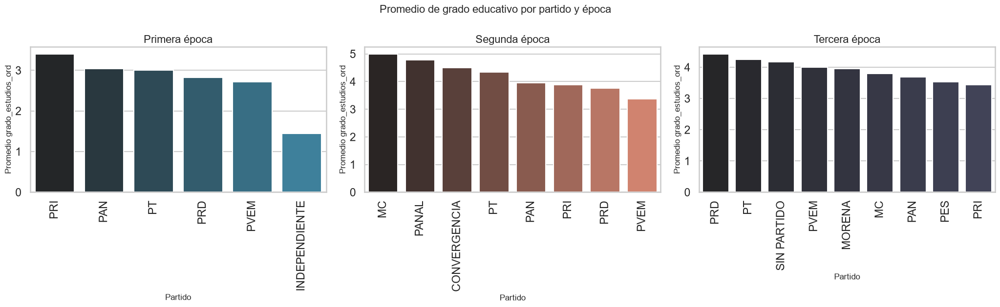

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = plot_df[plot_df['era_label'] == era_name]
    edu_p = (sub.groupby('partido')['grado_estudios_ord']
             .agg(promedio='mean', n='size')
             .reset_index()
             .query('n >= 15')
             .sort_values('promedio', ascending=False))
    display(edu_p.assign(era=era_name).head(5))
    sns.barplot(data=edu_p, x='partido', y='promedio', hue='partido',
                dodge=False, ax=ax, legend=False,
                palette=f"dark:{era_colors[era_name]}")
    ax.set_title(era_name)
    ax.set_xlabel('Partido')
    ax.set_ylabel('Promedio grado_estudios_ord')
    ax.tick_params(axis='x', rotation=90)

fig.suptitle('Promedio de grado educativo por partido y época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Grado de estudios promedio por partido y época**

El ranking educativo por partido cambia entre épocas:

- **Primera era (PRI dominante):** el PRI encabeza el promedio entre los partidos grandes (3.40), con PAN (3.04) y PRD (2.83) por debajo; los partidos pequeños muestran valores bajos y volátiles.
- **Segunda era (PAN):** los partidos chicos con pocas curules (MC, PANAL, Convergencia) exhiben promedios altos por n reducido; entre los grandes, el PAN (3.96) mantiene el perfil universitario coherente con su imagen tecnocrática.
- **Tercera era (Transición-Morena):** el ranking se comprime — PRD, PT y PVEM aparecen arriba con muestras medianas, y Morena (3.96, n=756) se sitúa en la media alta. La entrada masiva de cuadros nuevos no degradó el promedio educativo de la cámara.

La comparación por era evita el sesgo que produce agregar partidos de épocas distintas con composiciones de muestra incomparables.

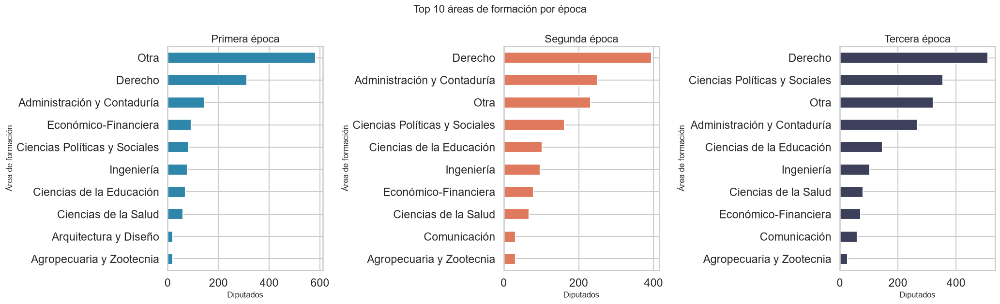

In [16]:
if 'area_formacion' in df.columns:
    fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
    for ax, era_name in zip(axes.flatten(), era_nombre_order):
        sub = plot_df[plot_df['era_label'] == era_name]
        af = sub['area_formacion'].value_counts().head(10)
        af.plot.barh(ax=ax, color=era_colors[era_name], edgecolor='white')
        ax.invert_yaxis()
        ax.set_title(era_name)
        ax.set_xlabel('Diputados')
        ax.set_ylabel('Área de formación')
    fig.suptitle('Top 10 áreas de formación por época', fontsize=16)
    plt.tight_layout()
    plt.show()

**Interpretación — Área de formación por época**

El Derecho domina en todas las épocas, pero su peso relativo disminuye levemente en la Tercera época, donde crecen las áreas de Ciencias Políticas/Administración Pública y Economía/Administración. Esto es consistente con la entrada de cuadros de Morena formados en administración pública y movimientos sociales más que en el litigio jurídico tradicional. La Ingeniería mantiene presencia baja pero estable. La Medicina aparece con mayor frecuencia en la Segunda época (PAN), coincidiendo con el perfil tecnocrático de ese partido. La comparación por era revela que el perfil formativo de la clase legislativa no es estático sino que refleja la cultura organizacional del partido dominante en cada periodo.

,Pública,Privada,Extranjera,Sin info
era_label,,,,
Primera época,53.67,23.27,10.27,34.20
Segunda época,40.33,21.73,8.13,45.60
Tercera época,39.05,22.05,6.50,44.65


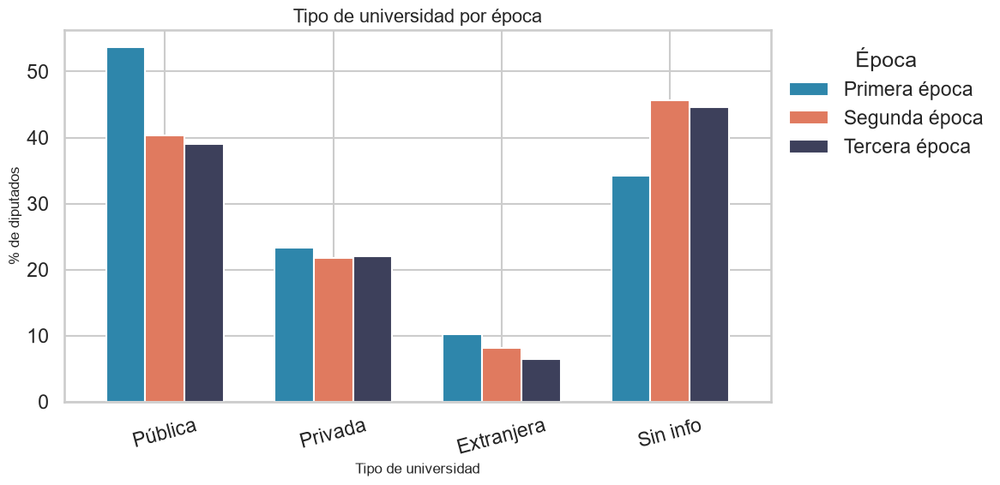

In [17]:
era_univ = []
for era_name in era_nombre_order:
    sub = plot_df[plot_df['era_label'] == era_name]
    n = len(sub)
    no_univ = (1 - sub[['univ_publica', 'univ_privada', 'univ_extranjera']].max(axis=1)).sum()
    era_univ.append({
        'era_label': era_name,
        'Pública':    100 * sub['univ_publica'].sum() / n,
        'Privada':    100 * sub['univ_privada'].sum() / n,
        'Extranjera': 100 * sub['univ_extranjera'].sum() / n,
        'Sin info':   100 * no_univ / n,
    })
df_univ_era = pd.DataFrame(era_univ).set_index('era_label')
display(df_univ_era.round(2))

ax = df_univ_era.loc[era_nombre_order].T.plot.bar(
    figsize=(12, 6), color=list(era_colors.values()), edgecolor='white', width=0.7)
ax.set_title('Tipo de universidad por época')
ax.set_xlabel('Tipo de universidad')
ax.set_ylabel('% de diputados')
ax.legend(title='Época', bbox_to_anchor=(1, 1))
ax.tick_params(axis='x', rotation=15)
plt.tight_layout()
plt.show()

### Interpretación — Tipo de universidad por época

| Época | Pública | Privada | Extranjera | Sin info |
|---|---:|---:|---:|---:|
| Primera — PRI | 53.7 % | 23.3 % | 10.3 % | 34.2 % |
| Segunda — PAN | 40.3 % | 21.7 % | 8.1 % | 45.6 % |
| Tercera — Transición-Morena | 39.1 % | 22.1 % | 6.5 % | 44.7 % |

#### Primera época

Máxima presencia de egresados de universidad pública (53.7 %) y de formación en el extranjero (10.3 %). El PRI hegemónico reclutó simultáneamente desde universidades públicas y desde una élite con trayectoria internacional.

#### Segunda época

Se observa una caída de **13.3 puntos porcentuales** en universidad pública (de 53.7 % a 40.3 %), el mayor descenso de la serie. La universidad privada no aumenta (23.3 % a 21.7 %); el cambio más pronunciado es el salto en la categoría **"sin dato"**, que pasa de 34.2 % a 45.6 %. La narrativa del "PAN tecnocrático-privado" no está respaldada por un aumento de egresados de universidades privadas — lo que cambia es la menor presencia de la UNAM entre quienes declaran universidad (ver la tabla siguiente).

#### Tercera época

La distribución pública/privada es prácticamente idéntica a ERA_2 (39.1 % / 22.1 %) y la formación en el extranjero continúa su descenso hasta el mínimo de la serie (6.5 %). La cobertura de datos universitarios no mejora (44.7 % sin dato).

#### Cautela interpretativa

Con casi la mitad de los registros sin información universitaria en ERA_2 y ERA_3, el descenso de la universidad pública puede reflejar parcialmente mayor subregistro en el SIL para esas eras, no solo un cambio real en el perfil educativo.

,UNAM,ITESM,ITAM,IBERO,UDG,IPN,UAM,ANAHUAC,UANL,UV
Primera época,0.2240,0.0627,0.0440,0.0673,0.0353,0.0467,0.0293,0.0187,0.0233,0.0247
Segunda época,0.1233,0.0680,0.0320,0.0533,0.0340,0.0280,0.0187,0.0273,0.0280,0.0173
Tercera época,0.0740,0.0440,0.0195,0.0430,0.0285,0.0130,0.0195,0.0290,0.0300,0.0150


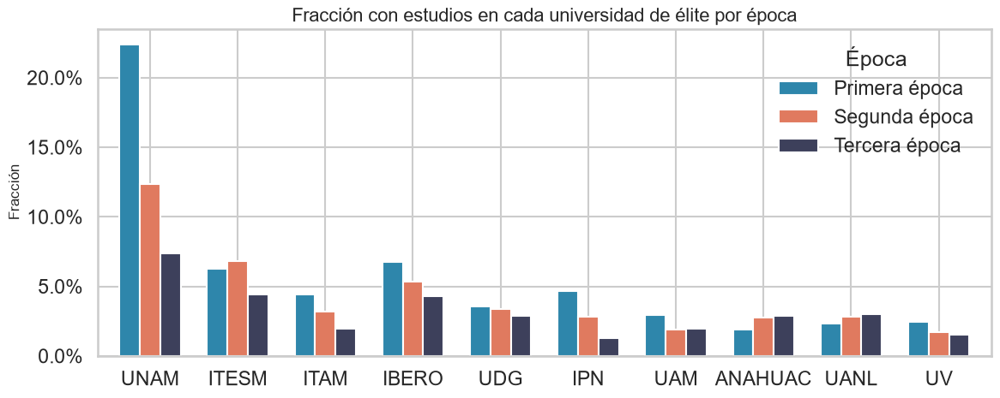

In [18]:
acad_cols = [c for c in df.columns if c.startswith('acad_')]
if acad_cols:
    era_acad_rows = []
    for era_name in era_nombre_order:
        sub = plot_df[plot_df['era_label'] == era_name]
        row = sub[acad_cols].mean().rename(era_name)
        row.index = row.index.str.replace('acad_', '', regex=False).str.upper()
        era_acad_rows.append(row)
    df_acad = pd.DataFrame(era_acad_rows)
    display(df_acad.round(4))

    ax = df_acad.T.plot.bar(
        figsize=(12, 5), color=list(era_colors.values()), edgecolor='white', width=0.7)
    ax.set_title('Fracción con estudios en cada universidad de élite por época')
    ax.set_ylabel('Fracción')
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax.legend(title='Época', bbox_to_anchor=(1, 1))
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

### Interpretación — Indicadores de universidad principales por época

| Institución | ERA_1 PRI | ERA_2 PAN | ERA_3 Trans.-Morena |
|---|---:|---:|---:|
| UNAM | 22.4 % | 12.3 % | 7.4 % |
| IBERO | 6.7 % | 5.3 % | 4.3 % |
| ITESM | 6.3 % | 6.8 % | 4.4 % |
| IPN | 4.7 % | 2.8 % | 1.3 % |
| ITAM | 4.4 % | 3.2 % | 2.0 % |
| UDG | 3.5 % | 3.4 % | 2.9 % |

#### Primera época

La UNAM domina con **22.4 %** de la Cámara, el pico histórico de la serie. El ITAM también alcanza su máximo en **ERA_1** (4.4 %), no en ERA_2 como podría suponerse del perfil panista. El PRI hegemónico reclutaba simultáneamente desde la UNAM y desde el ITAM, reflejo de la coexistencia de un ala populista y un ala tecnocrática dentro del mismo partido.

#### Segunda época

El ITESM (no el ITAM) alcanza su pico histórico, con **6.8 %**. El ITAM cae de 4.4 % a 3.2 %. La narrativa del "PAN ITAM" está parcialmente respaldada en composición de bancada, pero el ITESM es el vector privado-tecnocrático más representado en la Cámara de ERA_2. La UNAM se desploma de **22.4 %** a **12.3 %**, el mayor descenso de la serie.

#### Tercera época

Descenso monotónico en todas las instituciones identificadas: la UNAM queda en **7.4 %** (un tercio de su peso en ERA_1); ITESM e ITAM caen a 4.4 % y 2.0 %.

#### Interpretación general

Este patrón confirma que la procedencia institucional específica es señal relevante en las dos primeras eras y decrece en la Tercera, donde la filiación política y la carrera parlamentaria desplazan a la credencial universitaria como predictor de acceso a comisiones nodales (ver §5).

### 2.2.6 Perfil de experiencia previa de diputados

,fue_diputado_local,fue_diputado_federal,fue_senador
era_label,,,
Primera época,0.2080,0.1133,0.0247
Segunda época,0.3620,0.1647,0.0480
Tercera época,0.3255,0.2555,0.0600


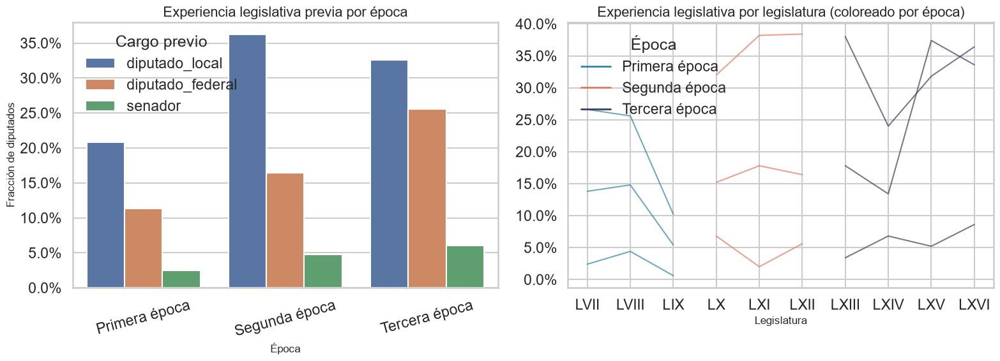

In [19]:
exp_cols = ['fue_diputado_local', 'fue_diputado_federal', 'fue_senador']
exp_cols = [c for c in exp_cols if c in df.columns]

if exp_cols:
    era_exp = plot_df.groupby('era_label')[exp_cols].mean().reset_index()
    display(era_exp.set_index('era_label').round(4))

    exp_long = era_exp.melt(id_vars='era_label', value_vars=exp_cols,
                            var_name='cargo', value_name='fraccion')
    exp_long['cargo'] = exp_long['cargo'].str.replace('fue_', '')

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    ax = axes[0]
    sns.barplot(data=exp_long, x='era_label', y='fraccion', hue='cargo',
                ax=ax, order=era_nombre_order)
    ax.set_title('Experiencia legislativa previa por época')
    ax.set_xlabel('Época')
    ax.set_ylabel('Fracción de diputados')
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax.tick_params(axis='x', rotation=15)
    ax.legend(title='Cargo previo')

    ax2 = axes[1]
    exp_by_leg = (plot_df
                  .groupby(['legislatura_num', 'legislatura_roman', 'era_label'])[exp_cols]
                  .mean()
                  .reset_index()
                  .sort_values('legislatura_num'))
    for era_name in era_nombre_order:
        grp = exp_by_leg[exp_by_leg['era_label'] == era_name]
        for col in exp_cols:
            ax2.plot(grp['legislatura_roman'], grp[col],
                     color=era_colors[era_name], alpha=0.7, linewidth=1.5)
    for era_name in era_nombre_order:
        ax2.plot([], [], color=era_colors[era_name], label=era_name, linewidth=2)
    ax2.set_title('Experiencia legislativa por legislatura (coloreado por época)')
    ax2.set_xlabel('Legislatura')
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax2.legend(title='Época')

    plt.tight_layout()
    plt.show()

**Interpretación — Experiencia legislativa previa por época**

El patrón varía estructuralmente entre épocas:

- **Primera época:** la fracción de ex diputados locales (20.8 %) y ex diputados federales (11.3 %) es moderada; la prohibición de reelección consecutiva vigente desde 1933 limita la acumulación de mandatos federales consecutivos.
- **Segunda época:** sube la experiencia local (36.2 %) y federal (16.5 %); el bipartidismo PAN–PRI favorece la circulación de cuadros entre niveles de gobierno.
- **Tercera época:** la proporción con mandato federal previo salta a 25.6 % — el efecto de la reelección consecutiva activa desde la LXIV es visible en la gráfica de legislaturas, que muestra la discontinuidad en 2018 dentro del propio tramo.

La comparación por era, complementada con la serie por legislatura, hace evidente que la reforma de 2014 produjo una discontinuidad real, no solo incremental.

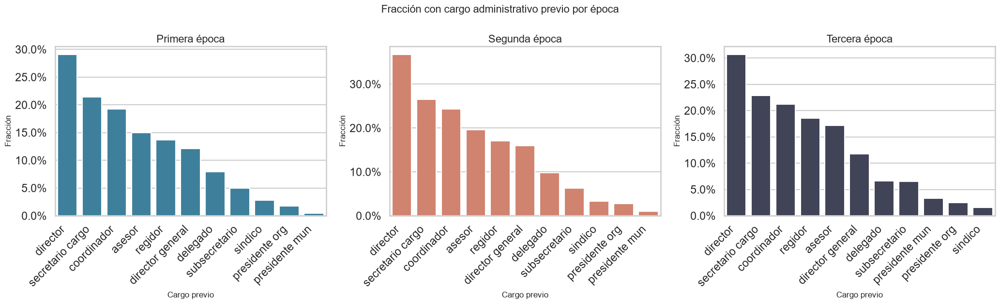

In [20]:
admin_cols = [
    'fue_presidente_mun', 'fue_presidente_org', 'fue_director_general',
    'fue_secretario_cargo', 'fue_subsecretario', 'fue_director',
    'fue_coordinador', 'fue_delegado', 'fue_asesor', 'fue_regidor', 'fue_sindico',
]
admin_cols = [c for c in admin_cols if c in df.columns]

era_admin = plot_df.groupby('era_label')[admin_cols].mean().reset_index()
admin_long = era_admin.melt(id_vars='era_label', value_vars=admin_cols,
                            var_name='cargo', value_name='fraccion')
admin_long['cargo'] = admin_long['cargo'].str.replace('fue_', '').str.replace('_', ' ')

fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = (admin_long[admin_long['era_label'] == era_name]
           .sort_values('fraccion', ascending=False))
    sns.barplot(data=sub, x='cargo', y='fraccion',
                dodge=False, ax=ax, legend=False, color=era_colors[era_name])
    ax.set_title(era_name)
    ax.set_xlabel('Cargo previo')
    ax.set_ylabel('Fracción')
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(1.0))
    ax.tick_params(axis='x', rotation=45)
    for label in ax.get_xticklabels():
        label.set_ha('right')

fig.suptitle('Fracción con cargo administrativo previo por época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Experiencia administrativa previa por época**

La presidencia municipal es el cargo ejecutivo previo más frecuente en todas las épocas, pero su peso relativo y el de otros cargos cambia:

- **Primera época:** la presidencia municipal y los cargos de dirección en organizaciones (sindicatos, cámaras) son dominantes, reflejando la estructura corporativa del PRI.
- **Segunda época:** crece la fracción de ex secretarios y subsecretarios; el PAN reclutó más intensamente de la burocracia federal tecnocrática.
- **Tercera época:** la presidencia municipal se mantiene como vía principal — Morena construye desde gobiernos locales y movimientos sociales — mientras la fracción con cargos de dirección general y secretarías se diluye hacia el final del tramo, diversificándose el origen administrativo.

Este patrón es consistente con los hallazgos SHAP (§5): la señal administrativa (`fue_secretario_cargo`) es máxima en ERA_1 y pierde peso relativo frente a la carrera legislativa en ERA_3.

,n_trayectoria_admin,n_trayectoria_politica,n_trayectoria_legislativa,n_trayectoria_empresarial
era_label,,,,
Primera época,2.957,7.380,0.679,1.570
Segunda época,3.519,6.742,0.801,1.903
Tercera época,3.056,4.712,0.899,1.480


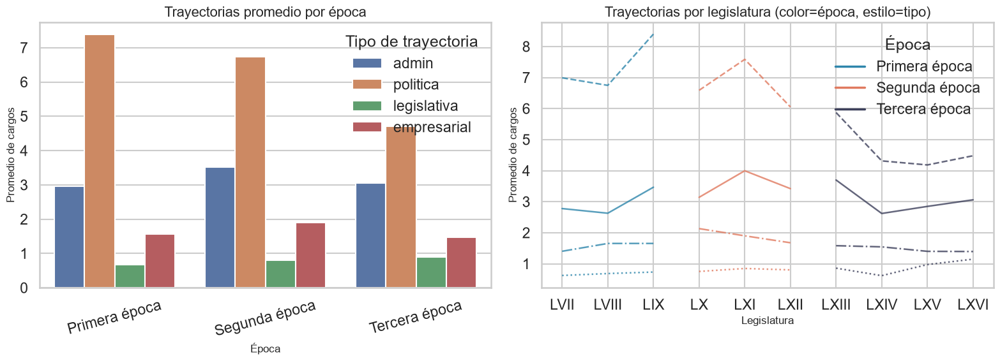

In [21]:
traj_vars = [
    'n_trayectoria_admin', 'n_trayectoria_politica',
    'n_trayectoria_legislativa', 'n_trayectoria_empresarial',
]
traj_vars = [c for c in traj_vars if c in df.columns]

era_traj = plot_df.groupby('era_label')[traj_vars].mean().reset_index()
display(era_traj.set_index('era_label').round(3))

traj_long = era_traj.melt(id_vars='era_label', value_vars=traj_vars,
                           var_name='trayectoria', value_name='promedio')
traj_long['trayectoria'] = traj_long['trayectoria'].str.replace('n_trayectoria_', '')

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

ax = axes[0]
sns.barplot(data=traj_long, x='era_label', y='promedio', hue='trayectoria',
            ax=ax, order=era_nombre_order)
ax.set_title('Trayectorias promedio por época')
ax.set_xlabel('Época')
ax.set_ylabel('Promedio de cargos')
ax.tick_params(axis='x', rotation=15)
ax.legend(title='Tipo de trayectoria')

ax2 = axes[1]
traj_by_leg = (
    plot_df.groupby(['legislatura_num', 'legislatura_roman', 'era_label'])[traj_vars]
    .mean()
    .reset_index()
    .sort_values('legislatura_num')
)
traj_styles = ['solid', 'dashed', 'dotted', 'dashdot']
for style, col in zip(traj_styles, traj_vars):
    for era_name in era_nombre_order:
        grp = traj_by_leg[traj_by_leg['era_label'] == era_name]
        ax2.plot(grp['legislatura_roman'], grp[col],
                 linestyle=style, color=era_colors[era_name], alpha=0.8, linewidth=1.8)
for era_name in era_nombre_order:
    ax2.plot([], [], color=era_colors[era_name], linewidth=2.5, label=era_name)
ax2.set_title('Trayectorias por legislatura (color=época, estilo=tipo)')
ax2.set_xlabel('Legislatura')
ax2.set_ylabel('Promedio de cargos')
ax2.legend(title='Época')

plt.tight_layout()
plt.show()

**Interpretación — Trayectorias por tipo y época**

La gráfica de barras agrupadas muestra promedios por tipo de trayectoria en cada era:

- **Trayectoria política** es la más alta en todas las épocas, pero desciende de forma sostenida: 7.38 (ERA_1) → 6.74 (ERA_2) → 4.71 (ERA_3).
- **Trayectoria administrativa** alcanza su pico en la Segunda época (3.52), coherente con el reclutamiento tecnocrático panista, y cae en la Tercera (3.06).
- **Trayectoria legislativa** crece de forma monotónica (0.68 → 0.80 → 0.90), con la discontinuidad interna en la LXIV (primera legislatura con reelección activa) visible en la serie por legislatura.
- **Trayectoria empresarial** es la más baja y estable del periodo (1.5–1.9).

El cruce de las dos tendencias — militancia/gestión a la baja, carrera parlamentaria al alza — es el trasfondo descriptivo del cambio de perfil nodal que el modelado documenta en §5.

### 2.2.7 Experiencia en comisiones de diputados

,partido,n_comisiones_nodales,n_comisiones_tematicas,n_comisiones_lastre,n_presidencias,era
5,PVEM,0.684211,1.815789,0.552632,0.210526,Primera época
4,PT,0.884615,1.692308,0.307692,0.346154,Primera época
0,INDEPENDIENTE,0.361111,1.611111,0.750000,0.055556,Primera época
3,PRI,0.489198,1.563272,0.520062,0.162037,Primera época


,partido,n_comisiones_nodales,n_comisiones_tematicas,n_comisiones_lastre,n_presidencias,era
5,PVEM,0.850746,2.164179,0.716418,0.328358,Segunda época
3,PRI,0.644643,2.039286,0.608929,0.216071,Segunda época
2,PRD,0.627178,1.885017,0.540070,0.247387,Segunda época
1,PANAL,0.703704,1.925926,0.333333,0.259259,Segunda época


,partido,n_comisiones_nodales,n_comisiones_tematicas,n_comisiones_lastre,n_presidencias,era
1,MORENA,0.886243,2.182540,0.690476,0.141534,Tercera época
5,PVEM,0.973333,2.126667,0.526667,0.160000,Tercera época
3,PRI,0.823034,2.047753,0.615169,0.216292,Tercera época
4,PT,0.897638,1.976378,0.598425,0.110236,Tercera época


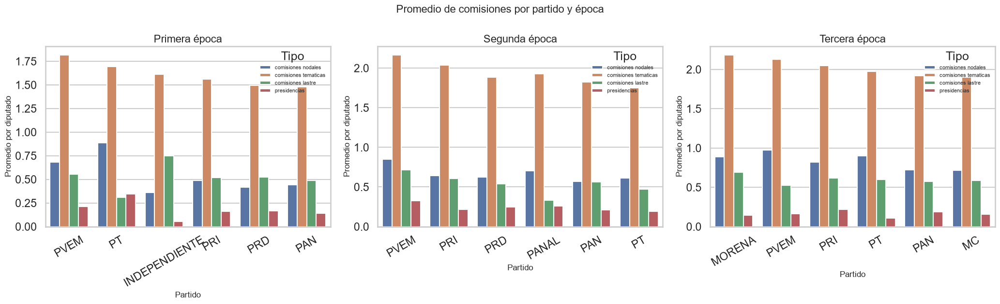

In [22]:
com_vars = ['n_comisiones_nodales', 'n_comisiones_tematicas',
            'n_comisiones_lastre', 'n_presidencias']
com_vars = [c for c in com_vars if c in df.columns]

fig, axes = plt.subplots(1, 3, figsize=(21, 6.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = plot_df[plot_df['era_label'] == era_name]
    top_parties = sub['partido'].value_counts().head(6).index.tolist()
    sub_filt = sub[sub['partido'].isin(top_parties)]

    by_party = sub_filt.groupby('partido')[com_vars].mean().reset_index()
    by_party['total'] = by_party[com_vars].sum(axis=1)
    by_party = by_party.sort_values('total', ascending=False)
    display(by_party.assign(era=era_name).drop(columns='total').head(4))

    long = by_party.melt(id_vars='partido', value_vars=com_vars,
                         var_name='tipo', value_name='promedio')
    long['tipo'] = long['tipo'].str.replace('n_', '').str.replace('_', ' ')
    sns.barplot(data=long, x='partido', y='promedio', hue='tipo', ax=ax)
    ax.set_title(era_name)
    ax.set_xlabel('Partido')
    ax.set_ylabel('Promedio por diputado')
    ax.tick_params(axis='x', rotation=30)
    ax.legend(title='Tipo', fontsize=8)

fig.suptitle('Promedio de comisiones por partido y época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Experiencia en comisiones por partido y época**

Las tres gráficas muestran cómo se distribuyen las comisiones entre los principales partidos de cada era:

- Primera época: el PRI concentra las comisiones nodales y presidencias; el PAN y PRD acumulan relativamente más comisiones lastre como oposición emergente.
- Segunda época: el PAN lidera en comisiones nodales y presidencias; el PRI en oposición y el PRD muestran mayor proporción de comisiones temáticas y lastre.
- Tercera época: Morena asciende hasta concentrar el promedio nodal más alto entre los partidos grandes (0.89 por diputado), con sus aliados (PVEM 0.97, PT 0.90) también arriba; la fragmentación primero, y la supermayoría después, reparten presidencias entre la coalición dominante y dejan al bloque opositor con promedios menores de comisiones de poder.

Este patrón es la evidencia descriptiva central del estudio: la distribución de comisiones no es aleatoria sino sistemáticamente diferencial por partido y época, lo que justifica el modelado predictivo.

### 2.2.8 Brechas de género en asignación de comisiones

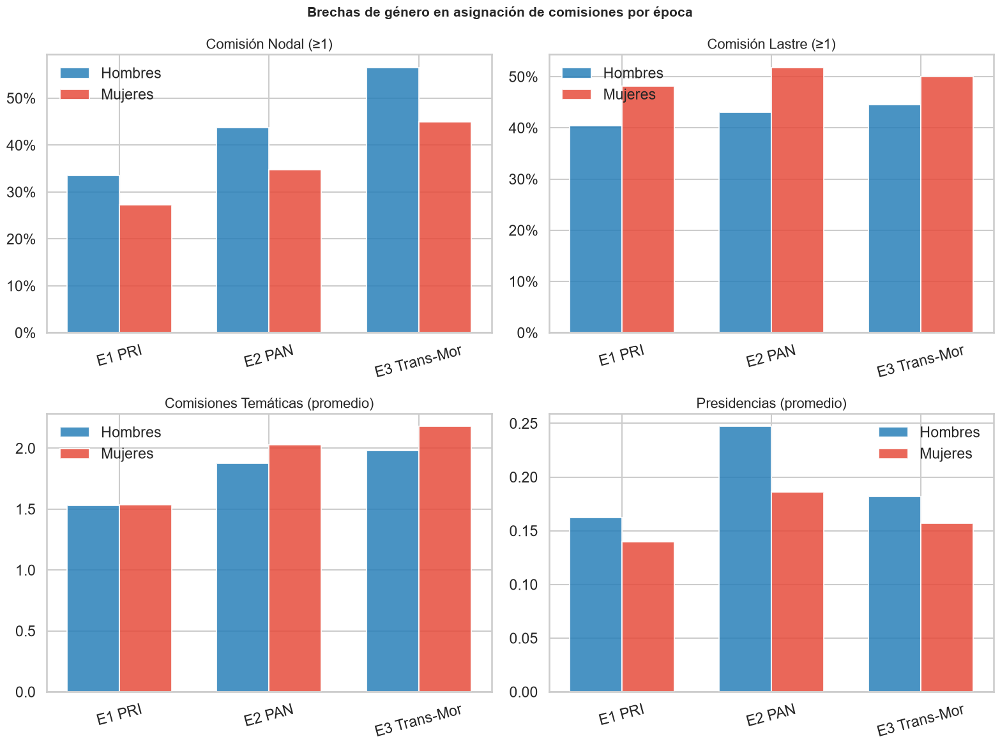

Tabla: Tasa/promedio por sexo y época

Comisión Nodal (≥1):


sexo,Mujeres,Hombres,Brecha (H-M)
era_label,,,
Primera época,0.273,0.335,0.062
Segunda época,0.348,0.437,0.089
Tercera época,0.449,0.566,0.117



Comisión Lastre (≥1):


sexo,Mujeres,Hombres,Brecha (H-M)
era_label,,,
Primera época,0.481,0.404,-0.077
Segunda época,0.518,0.430,-0.088
Tercera época,0.501,0.446,-0.055



Comisiones Temáticas (promedio):


sexo,Mujeres,Hombres,Brecha (H-M)
era_label,,,
Primera época,1.534,1.530,-0.004
Segunda época,2.026,1.878,-0.148
Tercera época,2.178,1.984,-0.194



Presidencias (promedio):


sexo,Mujeres,Hombres,Brecha (H-M)
era_label,,,
Primera época,0.140,0.162,0.022
Segunda época,0.186,0.247,0.061
Tercera época,0.157,0.182,0.025


In [23]:
# Tasas de asignación a cada tipo de comisión por sexo y época
com_targets = [
    ("nodal_bin_raw", "n_comisiones_nodales", "Comisión Nodal (≥1)", True),
    ("lastre_bin_raw", "n_comisiones_lastre", "Comisión Lastre (≥1)", True),
    ("n_comisiones_tematicas", "n_comisiones_tematicas", "Comisiones Temáticas (promedio)", False),
    ("n_presidencias", "n_presidencias", "Presidencias (promedio)", False),
]

plot_df_g = plot_df.copy()
plot_df_g["nodal_bin_raw"] = (plot_df_g["n_comisiones_nodales"] >= 1).astype(float)
plot_df_g["lastre_bin_raw"] = (plot_df_g["n_comisiones_lastre"] >= 1).astype(float)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
for ax, (col, src, label, is_bin) in zip(axes.flatten(), com_targets):
    rows_g = []
    for era_name in era_nombre_order:
        sub = plot_df_g[plot_df_g["era_label"] == era_name]
        for sexo_val, sexo_label in [("M", "Hombres"), ("F", "Mujeres")]:
            val = sub.loc[sub["sexo"] == sexo_val, col].mean()
            rows_g.append({"Época": era_name, "Sexo": sexo_label, "Valor": val})
    df_g = pd.DataFrame(rows_g)

    x = range(len(era_nombre_order))
    hombres = df_g[df_g["Sexo"] == "Hombres"]["Valor"].values
    mujeres = df_g[df_g["Sexo"] == "Mujeres"]["Valor"].values

    width = 0.35
    ax.bar([i - width/2 for i in x], hombres, width, label="Hombres", color="#2980b9", alpha=0.85)
    ax.bar([i + width/2 for i in x], mujeres, width, label="Mujeres", color="#e74c3c", alpha=0.85)
    ax.set_title(label)
    ax.set_xticks(list(x))
    ax.set_xticklabels(["E1 PRI", "E2 PAN", "E3 Trans-Mor"], rotation=15)
    if is_bin:
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f"{y:.0%}"))
    ax.legend()

fig.suptitle("Brechas de género en asignación de comisiones por época", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

# Tabla resumen de brechas
print("Tabla: Tasa/promedio por sexo y época")
for col, src, label, is_bin in com_targets:
    print(f"\n{label}:")
    tbl = (plot_df_g.groupby(["era_label", "sexo"])[col]
           .mean()
           .unstack("sexo")
           .rename(columns={"F": "Mujeres", "M": "Hombres"})
           .round(3))
    tbl["Brecha (H-M)"] = tbl["Hombres"] - tbl["Mujeres"]
    display(tbl)

### Interpretación — Brechas de género en comisiones

| Tipo | ERA_1 M | ERA_1 H | Δ | ERA_2 M | ERA_2 H | Δ | ERA_3 M | ERA_3 H | Δ |
|---|---:|---:|---:|---:|---:|---:|---:|---:|---:|
| Nodal — ≥1 | 27.3 % | 33.5 % | −6.2 pp | 34.8 % | 43.7 % | −8.9 pp | 44.9 % | 56.6 % | −11.7 pp |
| Lastre — ≥1 | 48.1 % | 40.4 % | +7.7 pp | 51.8 % | 43.0 % | +8.8 pp | 50.1 % | 44.6 % | +5.5 pp |
| Temáticas — media | 1.53 | 1.53 | ≈0 | 2.03 | 1.88 | −0.15 | 2.18 | 1.98 | −0.19 |
| Presidencias — media | 0.140 | 0.162 | −0.022 | 0.186 | 0.247 | −0.061 | 0.157 | 0.182 | −0.025 |

#### Cuatro hallazgos centrales

##### 1. La brecha nodal se amplía, no se cierra

A pesar del avance sostenido hacia la paridad electoral, la brecha de acceso a comisiones nodales crece monotónicamente entre eras y alcanza su máximo en **ERA_3** (−11.7 pp). La paridad electoral no se traduce automáticamente en paridad de poder comisionario.

> **Límite de resolución (S3):** la evidencia de v10 sugería una reducción de la brecha en el subtramo 2024+ (LXVI). Con la segmentación S3 ese subtramo queda agregado dentro de ERA_3 y la posible convergencia reciente no es observable en esta tabla; documentarla requiere el desglose por legislatura.

##### 2. Las mujeres reciben consistentemente más comisiones lastre en todas las épocas

La brecha favorable a las mujeres en lastre se reduce de +7.7/+8.8 pp en ERA_1–ERA_2 a +5.5 pp en ERA_3. La convergencia es real, pero la dirección no se invierte.

##### 3. Las comisiones temáticas son el espacio más igualitario

La diferencia es prácticamente nula en ERA_1 (1.53 vs. 1.53) y crece levemente a favor de las mujeres en ERA_2–ERA_3. No hay evidencia de discriminación activa en la asignación temática.

##### 4. Las presidencias muestran una brecha modesta pero persistente

Los hombres promedian consistentemente más presidencias; la brecha es máxima en **ERA_2** (0.061) y se modera en ERA_3 (0.025).

---

#### Interpretación general

El patrón conjunto (más comisiones lastre y más comisiones temáticas para mujeres, pero menos comisiones nodales y menos presidencias) confirma una **asignación diferencial selectiva**: la inequidad opera en los espacios de poder, no en la distribución general del trabajo legislativo.

# 3.0 Analisis de relaciones multivariadas

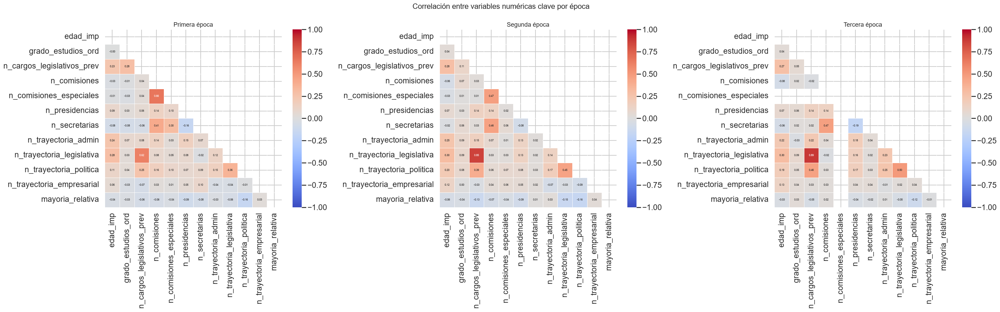

In [24]:
key_numeric = [
    'edad_imp', 'grado_estudios_ord',
    'n_cargos_legislativos_prev', 'n_comisiones', 'n_comisiones_especiales',
    'n_presidencias', 'n_secretarias',
    'n_trayectoria_admin', 'n_trayectoria_legislativa',
    'n_trayectoria_politica', 'n_trayectoria_empresarial',
    'mayoria_relativa',
]
key_numeric = [c for c in key_numeric if c in df.columns]

fig, axes = plt.subplots(1, 3, figsize=(30, 9.5))
for ax, era_name in zip(axes.flatten(), era_nombre_order):
    sub = plot_df[plot_df['era_label'] == era_name][key_numeric]
    corr = sub.corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm',
                linewidths=0.5, ax=ax, annot_kws={'size': 6},
                vmin=-1, vmax=1, center=0)
    ax.set_title(era_name, fontsize=13)

fig.suptitle('Correlación entre variables numéricas clave por época', fontsize=16)
plt.tight_layout()
plt.show()

**Interpretación — Matriz de correlación por época**

Desagregar la correlación por era revela que las relaciones entre variables no son estables en el tiempo:

- **Primera época (PRI):** la correlación entre n_trayectoria_admin y n_presidencias es más alta que en épocas posteriores, reflejando que el aparato burocrático priísta era la vía natural hacia comisiones de poder.
- **Segunda época (PAN):** la correlación entre grado_estudios_ord y n_comisiones_nodales es la más alta del periodo, consistente con el perfil tecnocrático del PAN.
- **Tercera época (Transición-Morena):** las correlaciones con las variables de trayectoria administrativa se debilitan en general — la fragmentación multipartidista y luego la recomposición de Morena introducen mayor heterogeneidad de perfiles — mientras la trayectoria legislativa gana asociación con las comisiones, coherente con la reelección consecutiva.

Las correlaciones entre tipos de trayectoria (administrativa, política, legislativa) son positivas en todas las épocas: el capital político sigue siendo acumulativo, aunque su composición cambia.

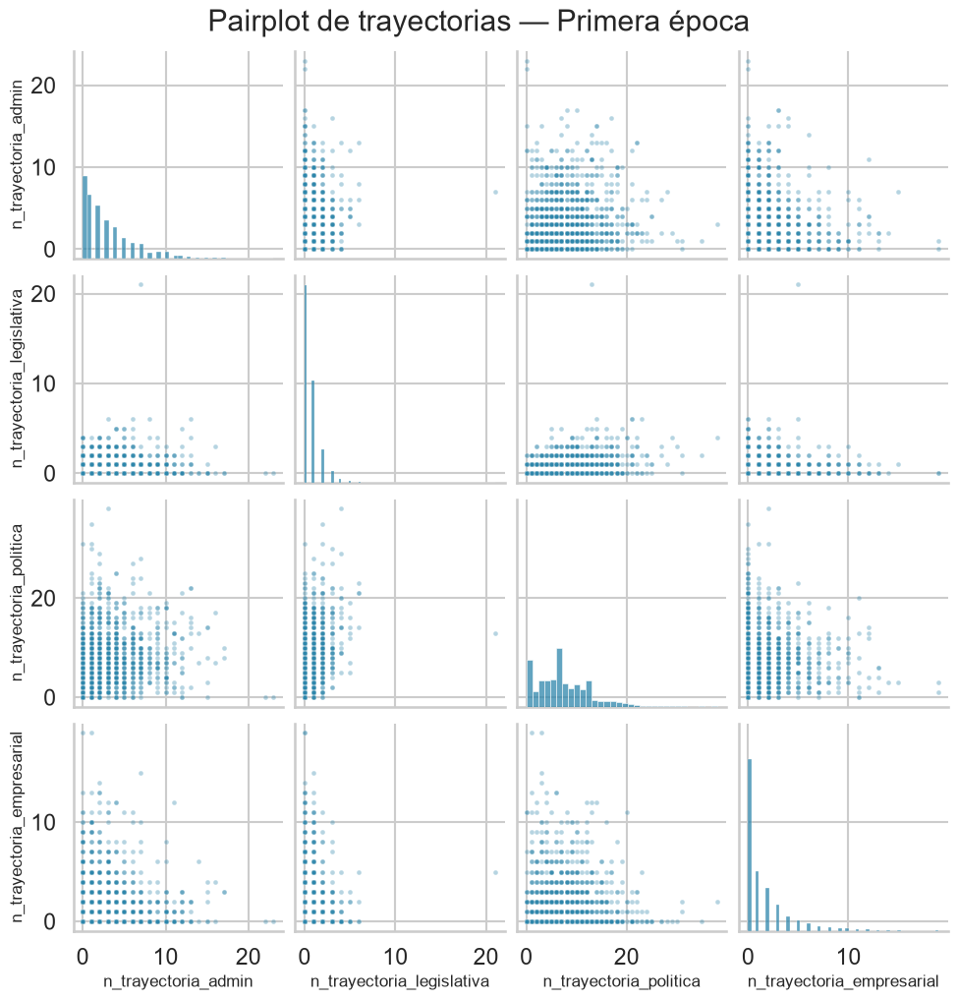

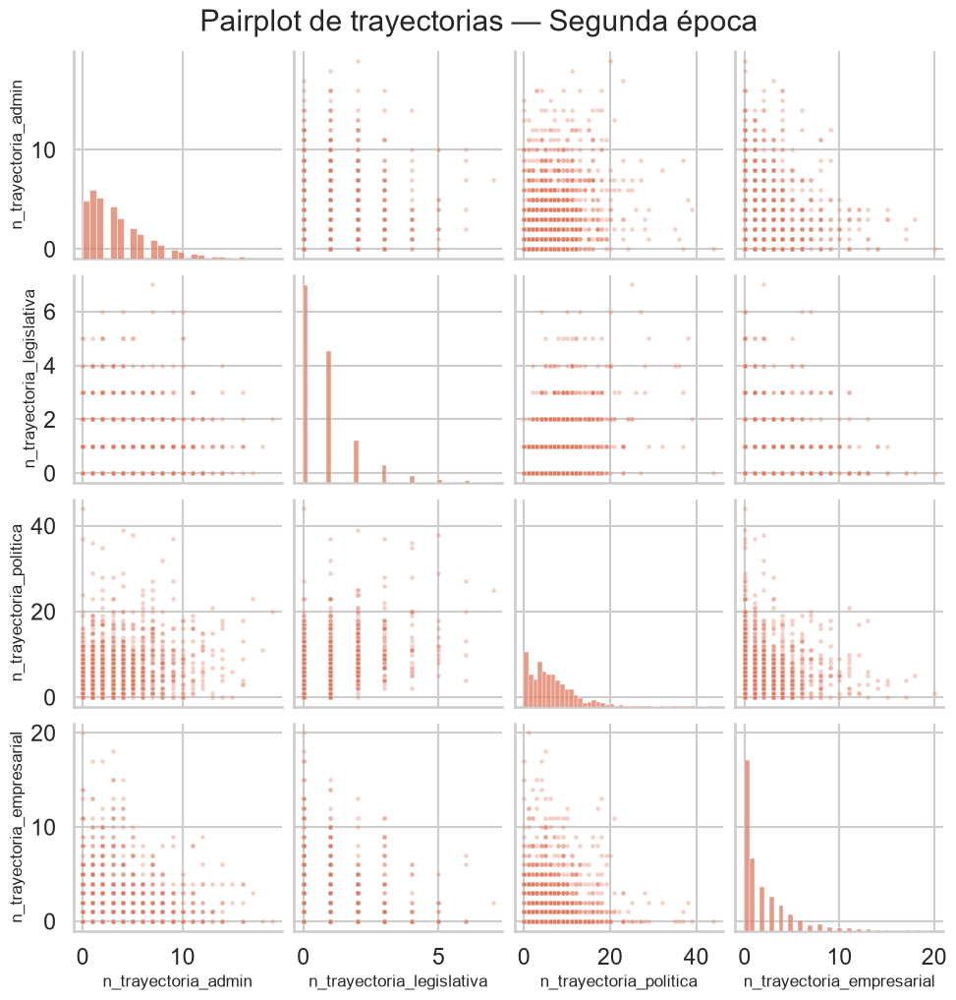

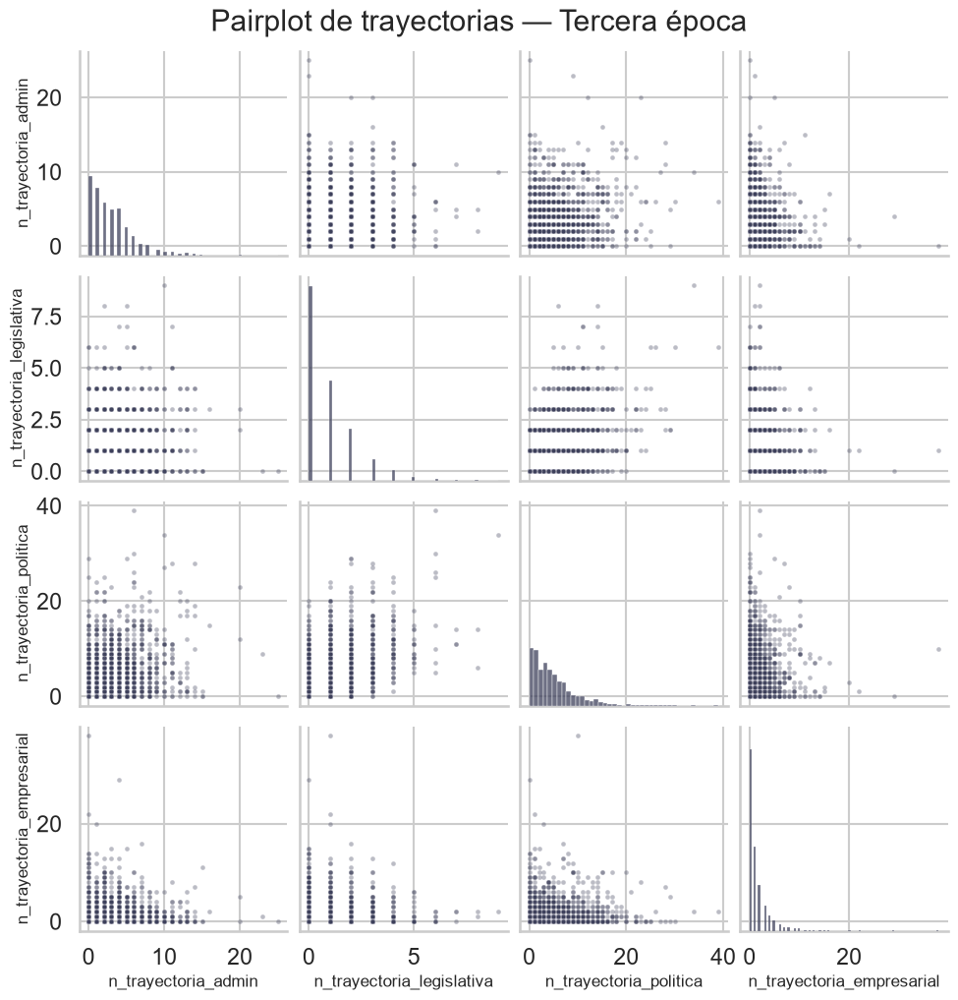

In [25]:
traj_cols = [
    'n_trayectoria_admin', 'n_trayectoria_legislativa',
    'n_trayectoria_politica', 'n_trayectoria_empresarial',
]
traj_cols = [c for c in traj_cols if c in df.columns]

if traj_cols:
    sample = plot_df[traj_cols + ['era_label']].dropna()
    sample = sample[sample['era_label'].notna()]

    for era_name in era_nombre_order:
        era_sample = sample[sample['era_label'] == era_name]
        if era_sample.empty:
            continue
        g = sns.pairplot(era_sample, vars=traj_cols,
                         plot_kws={'alpha': 0.35, 's': 12, 'color': era_colors[era_name]},
                         diag_kws={'color': era_colors[era_name]})
        g.figure.suptitle(f'Pairplot de trayectorias — {era_name}', y=1.02)
        plt.show()

**Interpretación — Pairplots de trayectorias (uno por época)**

Cada pairplot muestra la estructura de relaciones entre los cuatro tipos de trayectoria dentro de una sola era, lo que permite comparar patrones sin que el solapamiento entre eras distorsione la lectura.

- **Primera era (PRI):** la nube de n_trayectoria_politica vs n_trayectoria_admin concentra la mayor densidad en valores moderados-altos, reflejando la acumulación conjunta de capital político-burocrático como norma del reclutamiento priísta. n_trayectoria_empresarial muestra dispersión baja y desvinculada del resto.
- **Segunda era (PAN):** n_trayectoria_admin exhibe mayor varianza hacia valores altos que en ERA_1, consistente con el reclutamiento tecnocrático panista; n_trayectoria_legislativa aún tiene valores bajos dado que la reelección no era vigente.
- **Tercera era (Transición-Morena):** la nube de n_trayectoria_legislativa se desplaza hacia la derecha — efecto de la reelección consecutiva (vigente desde la LXIV) — y su correlación con la trayectoria política se intensifica, mientras la densidad en valores altos de trayectoria administrativa se reduce: los perfiles del tramo son más parlamentarios y menos burocráticos.

La trayectoria empresarial permanece la más desvinculada del resto en todas las épocas: quienes tienen experiencia empresarial no necesariamente acumulan cargos políticos o administrativos, y viceversa.

# 4. Estrategia de Modelado: Modelo Diputrax

# 4.1 Diseño del estudio y lógica temporal por eras

## Pregunta de investigación

¿El perfil biográfico, educativo y de trayectoria de un diputado predice a qué tipo de comisión es asignado, y ese perfil ha cambiado entre épocas políticas?

---

## Tipología de comisiones

| Tipo | Definición operacional | Implicación política |
|---|---|---|
| Nodal | ≥1 comisión nodal (presupuesto, hacienda, seguridad) | Alta influencia · cargo de confianza del grupo mayoritario |
| Lastre | ≥1 comisión lastre (sin recursos ni dictámenes) | Marginalización · oposición o primíparos sin red |
| Temática | Conteo de comisiones temáticas (0–10) | Especialización · volumen de trabajo legislativo |

---

## Segmentación temporal: tres eras (S3, diputraxv12)

| Época | Legislaturas | Régimen | n | Tasa nodal | Tasa lastre | Media temáticas |
|---|---|---|---:|---:|---:|---:|
| ERA_1 | 57–59 | PRI hegemónico | 1500 | 32.2 % | 42.1 % | 1.53 |
| ERA_2 | 60–62 | Alternancia PAN | 1500 | 40.7 % | 45.9 % | 1.93 |
| ERA_3 | 63–66 | Transición-Morena | 2000 | ~51.0 % | ~47.2 % | ~2.08 |

**Por qué tres eras y no cuatro.** `diputraxv12` sometió la periodización a una búsqueda de la segmentación temporal óptima: seis esquemas candidatos (del modelo único al modelo por legislatura), mismo espacio de features, mismo modelo (LR L1+SFM), misma semilla, evaluados con predicciones *out-of-fold* sobre estratos fijos por legislatura. El esquema S3 —tres cortes de coalición, sin separar la LXVI— quedó en la **frontera eficiente** del intercambio sesgo-varianza:

- máxima cohesión interna de coeficientes de todo el espacio de candidatos (similitud coseno dentro de grupo 0.537; Δ dentro−entre = 0.083, familia de cortes políticos);
- costo predictivo frente al mejor esquema dentro del umbral de empate (±0.02 AUC estratificado);
- elimina el grupo de n=500 (la LXVI aislada), principal fuente de varianza de la periodización en 4 eras de v10.

**Trade-off aceptado (límite de resolución).** Al fusionar 63–66, el cuaderno ya no estima un vector de coeficientes propio para el subrégimen de supermayoría de Morena (2024–). Los hallazgos de v10 que dependían de esa resolución (H5, la convergencia de género de H7) se reformulan en §11 como límites declarados, no como resultados de este cuaderno.

---

## *Feature engineering* — 62 *features*

| Bloque | Variables representativas |
|---|---|
| Político-electoral | `sexo_bin`, `mayoria_relativa`, `es_partido_mayoria`, `legislatura_num` |
| Trayectoria legislativa | `fue_diputado_local`, `fue_diputado_federal`, `fue_senador`, `n_trayectoria_legislativa` |
| Trayectoria administrativa | `n_trayectoria_admin`, `nivel_cargo_max`, `fue_secretario_cargo`, `fue_presidente_mun` |
| Trayectoria política | `n_trayectoria_politica`, `n_trayectoria_empresarial`, `lider_juvenil_partido` |
| Educación | `grado_estudios_ord`, `tiene_posgrado`, `univ_elite`, `estudios_en_extranjero` |
| Dummies | Partido —8 categorías—, Región —6—, Área de formación —3: `area_Derecho`, `C. Políticas y Sociales`, `Económico-Financiera`— |

**Criterio de selección:** se retienen todas las variables de los cinco bloques de trayectoria y las de contexto institucional. Se eliminaron las 10 *dummies* individuales de institución universitaria (reemplazadas por `univ_elite`), las *dummies* de área disciplinaria excedentes, las variables compuestas redundantes (`carrera_depth`, `edu_calidad`, `exp_alta_jerarquia`) y —por AC1 (§4.6)— `univ_extranjera` y `n_cargos_legislativos_prev`.

---

## Lógica del diseño de modelado

Cada uno de los tres *targets* se modela por separado dentro de cada era. Esto permite:

1. Detectar si el perfil que predice la asignación cambia entre épocas —AUC/MAE por era—.
2. Identificar qué *features* ganan o pierden importancia a lo largo del tiempo —SHAP por era—.
3. Medir la transferencia del modelo entre períodos —validación *rolling forward*—.

El modelo empleado es **Regresión Logística L1 —Lasso—**, evaluada en dos variantes:

| Variante | Descripción |
|---|---|
| `LR L1 (full)` | L1 sobre los 62 *features* sin preselección. |
| `LR L1 + SFM` | *Pipeline* `StandardScaler` → `SelectFromModel(LR L1)` → `LR L1`, donde la selección automática identifica el subconjunto mínimo de *features* con peso no nulo por era. |

La penalización L1 produce modelos *sparse*: los coeficientes de *features* irrelevantes convergen a cero durante el entrenamiento, haciendo que la selección forme parte del proceso de ajuste. `SelectFromModel`, con `threshold='mean'`, retiene únicamente las variables cuya magnitud de coeficiente supera la media. La comparación entre `LR L1 (full)` y `LR L1 + SFM` permite cuantificar el costo/beneficio de la selección automática en AUC; la especificación **L2 (v4)** se conserva como línea base de robustez (§8.0b).

---

# 4.2 Guía de interpretación de métricas

## AUC — Nodales y Lastre: clasificación binaria

| Rango | Lectura |
|---|---|
| 0.50 | Aleatorio: el perfil no predice la asignación |
| 0.55–0.65 | Señal débil: factores no observados dominan |
| 0.65–0.75 | Señal moderada: el perfil importa, pero no determina |
| 0.75–0.85 | Señal fuerte: el perfil es factor relevante |
| > 0.85 | Señal muy fuerte: asignación casi determinista |

---

## MAE — Temáticas: regresión Poisson

La métrica se compara contra el *baseline* de predecir siempre la media. Una mejora **≤5 %** es prácticamente nula dada la varianza del *target*.

---

## Preguntas de investigación y *tests* asociados

| Pregunta | Test |
|---|---|
| ¿Cambió el perfil de reclutamiento a nodales? | Tendencia SHAP: si la trayectoria administrativa cae y la carrera legislativa/partidista sube hacia ERA_3 → sí |
| ¿Lastre es imagen espejo de nodales? | Correlación `SHAP(nodal)` vs. `-SHAP(lastre)`: si `r ≈ −1.0` → sí |
| ¿`es_partido_mayoria` domina? | Posición en *heatmap* SHAP |
| ¿Hay ruptura temporal entre eras? | AUC *rolling* ERA_2→ERA_3 vs. ERA_1→ERA_2 |

---

## Notas de calidad

- `grado_estudios_ord` en LIX tiene promedio 1.49 —vs. aproximadamente 4 en otras legislaturas—: probable error de captura que afecta ERA_1.
- 10.2 % de nulos en edad fueron imputados con MICE (§2.2.1c).
- 625 registros son reelecciones válidas: no son *leakage* entre eras; la CV agrupada por `diputado_id` (AC2, §4.6) controla la fuga por reelección.

---

# 4.3 Justificación del parámetro `k = 5` en la validación cruzada

La validación cruzada estratificada de 5 pliegues —*5-fold stratified CV*— se adopta como método único en todas las eras. La elección responde a tres criterios.

---

## 1. Tamaño de *fold* y estabilidad del AUC

Con la segmentación S3 el grupo más pequeño tiene n=1,500 (300 observaciones por *fold* de prueba, ~97 positivos nodales en ERA_1, la era de menor tasa). Todos los *folds* quedan holgadamente por encima del umbral en el que el estimador de AUC se vuelve inestable (Hanley & McNeil, 1982). A diferencia de v10 —donde la ERA_4 de n=500 forzaba la elección—, aquí `k = 5` no está restringido por ningún grupo corto.

---

## 2. Consistencia metodológica entre eras y con las versiones previas

Usar `k` distinto por era introduciría sesgo sistemático en la comparación de AUC entre épocas. Además, mantener `k = 5` con `random_state=42` preserva la comparabilidad directa con v10 (S4) y con la evaluación de segmentaciones de `diputraxv12`, que usan exactamente el mismo protocolo.

---

## 3. Respaldo en la literatura

Kohavi (1995) muestra empíricamente que `k = 5` y `k = 10` producen estimaciones de error prácticamente idénticas en la mayoría de los conjuntos de datos evaluados. James et al. (2021, §5.1.3) presentan ambos como opciones equivalentes. Arlot y Celisse (2010) demuestran que LOO tiene varianza asintótica más alta que *k-fold* para estimadores no lineales. LOO sería además computacionalmente prohibitivo (>27,000 entrenamientos para 3 eras × 3 targets × 2 variantes).

In [26]:
import warnings
warnings.filterwarnings("ignore")

import io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
from sklearn.model_selection import StratifiedKFold, KFold, cross_val_score
from sklearn.metrics import roc_auc_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression, PoissonRegressor
import shap


In [27]:
PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
PARQUET = PROJECT_ROOT / "data" / "clean" / "diputados_20260421_205712.parquet"

ERA_MAP = {
    57: "ERA_1_PRI",  58: "ERA_1_PRI",  59: "ERA_1_PRI",
    60: "ERA_2_PAN",  61: "ERA_2_PAN",  62: "ERA_2_PAN",
    63: "ERA_3_TRANSMOR", 64: "ERA_3_TRANSMOR",
    65: "ERA_3_TRANSMOR", 66: "ERA_3_TRANSMOR",
}
ERA_ORDER = ["ERA_1_PRI", "ERA_2_PAN", "ERA_3_TRANSMOR"]
ERA_LABELS = {
    "ERA_1_PRI":      "ERA 1 — PRI (57-59)",
    "ERA_2_PAN":      "ERA 2 — PAN (60-62)",
    "ERA_3_TRANSMOR": "ERA 3 — Transicion-Morena (63-66)",
}
ERA_COLORS = {
    "ERA_1_PRI":      "#c0392b",
    "ERA_2_PAN":      "#2980b9",
    "ERA_3_TRANSMOR": "#8e44ad",
}

TOP_PARTIDOS = ["PRI", "PAN", "MORENA", "PRD", "PVEM", "PT", "MC"]

## 4.3 Carga de datos y feature engineering

In [28]:
raw = pd.read_parquet(PARQUET)
print(f"Shape: {raw.shape}")
raw[["legislatura_num", "partido", "es_partido_mayoria",
     "n_comisiones_nodales", "n_comisiones_tematicas", "n_comisiones_lastre"]].head(3)

Shape: (5000, 79)


,legislatura_num,partido,es_partido_mayoria,n_comisiones_nodales,n_comisiones_tematicas,n_comisiones_lastre
0,59,PRI,1,1,1,1
1,59,PRI,1,0,2,0
2,59,PRI,1,1,1,0


**Imputación MICE para entrenamiento de modelos (v4)**

Se aplica el mismo IterativeImputer ajustado sobre el conjunto completo de datos de modelado (raw) condicionado a las mismas variables de experiencia legislativa y administrativa usadas en el EDA. Esto garantiza coherencia metodológica entre la exploración analítica y el entrenamiento supervisado.

In [29]:
# ============================================================
# MICE — Imputación sobre raw para modelado (v4)
# ============================================================
from sklearn.experimental import enable_iterative_imputer  # noqa: F401
from sklearn.impute import IterativeImputer
import numpy as _np

_MICE_COND_VARS = [
    # Experiencia legislativa
    'legislatura_num',
    'n_cargos_legislativos_prev',
    'fue_diputado_local',
    'fue_diputado_federal',
    'fue_senador',
    'n_trayectoria_legislativa',
    # Experiencia administrativa
    'n_trayectoria_admin',
    'nivel_cargo_max',
    'fue_presidente_mun',
    'fue_secretario_cargo',
    'fue_director_general',
    'fue_subsecretario',
    'admin_en_gobierno_fed',
    'admin_en_gobierno_est',
    'admin_en_gobierno_mun',
    # Variable objetivo
    'edad_al_tomar_cargo',
]

_mice_cols_model = [c for c in _MICE_COND_VARS if c in raw.columns]
_mice_X_model    = raw[_mice_cols_model].copy()

_mice_imputer_model = IterativeImputer(
    max_iter=10,
    random_state=42,
    initial_strategy='mean',
    skip_complete=True,
)
_mice_result_model = _mice_imputer_model.fit_transform(_mice_X_model)
_mice_df_model     = pd.DataFrame(_mice_result_model,
                                   columns=_mice_cols_model,
                                   index=raw.index)

raw['edad_missing'] = raw['edad_al_tomar_cargo'].isna().astype(int)
raw['edad_imp'] = _np.where(
    raw['edad_al_tomar_cargo'].isna(),
    _mice_df_model['edad_al_tomar_cargo'].clip(18, 90),
    raw['edad_al_tomar_cargo'],
)
print("MICE modelado — edad_imp OK")
print(f"  N imputados : {int(raw['edad_missing'].sum())}")
print(f"  Media MICE  : {raw['edad_imp'].mean():.2f}")

MICE modelado — edad_imp OK
  N imputados : 510
  Media MICE  : 45.98


In [30]:
df = raw.copy()

# Era
df["era"] = df["legislatura_num"].map(ERA_MAP)

# Targets binarios — clasificacion base (Aparicio & Langston 2009)
df["nodal_bin"] = (df["n_comisiones_nodales"] >= 1).astype(int)
df["lastre_bin"] = (df["n_comisiones_lastre"] >= 1).astype(int)

# Targets alternativos para analisis de robustez (Anexo B)
df["nodal_bin_strict"] = (df["n_comisiones_nodales"] >= 2).astype(int)
df["nodal_bin_pres"] = (
    (df["n_comisiones_nodales"] >= 1) | (df["presidente_comision"] == 1)
).astype(int)

# edad_imp y edad_missing: imputados por MICE en sección anterior

# Region geografica
REGION_MAP = {
    "CDMX": "CDMX",
    **dict.fromkeys(["MEX","HGO","MOR","PUE","TLAX","QRO","GTO","AGS"], "CENTRO"),
    **dict.fromkeys(["VER","OAX","CHIS","TAB","GRO","CAM","YUC","QROO"], "SUR"),
    **dict.fromkeys(["NL","TAMPS","COAH","CHIH","SON","BC","BCS","SIN",
                     "DGO","ZAC","SLP","NAY"], "NORTE"),
    **dict.fromkeys(["JAL","COL","MICH"], "OCCIDENTE"),
    "DESCONOCIDO": "RP",
}
df["region"] = df["entidad_codigo"].map(REGION_MAP).fillna("CENTRO")

# Partido simplificado
df["partido_cat"] = df["partido"].where(df["partido"].isin(TOP_PARTIDOS), "OTRO")

# univ_elite: proxy parsimonioso de universidad de élite
# (reemplaza las 10 dummies individuales acad_* en el espacio de features)
df["univ_elite"] = df[["acad_unam","acad_itam",
                         "acad_ibero","acad_itesm"]].max(axis=1)

# Sexo
df["sexo_bin"] = (df["sexo"] == "M").astype(int)

# One-hot encoding
_p    = pd.get_dummies(df["partido_cat"],     prefix="p")
_reg  = pd.get_dummies(df["region"],          prefix="reg")
_area = pd.get_dummies(df["area_formacion"],  prefix="area")
df_enc = pd.concat([df, _p, _reg, _area], axis=1)

print("Feature engineering OK")
print(df["era"].value_counts().sort_index().to_string())
print()
print("Target rates:")
for t in ["nodal_bin", "lastre_bin", "n_comisiones_tematicas",
          "nodal_bin_strict", "nodal_bin_pres"]:
    print(f"  {t}: {df[t].mean():.3f}")

Feature engineering OK
era
ERA_1_PRI         1500
ERA_2_PAN         1500
ERA_3_TRANSMOR    2000

Target rates:
  nodal_bin: 0.423
  lastre_bin: 0.453
  n_comisiones_tematicas: 1.868
  nodal_bin_strict: 0.171
  nodal_bin_pres: 0.508


In [31]:
NUMERIC_FEATS = [
    # Contexto institucional y politico-electoral (Bárcena Juárez 2020; Aparicio & Langston 2009)
    "sexo_bin",
    "edad_imp", "edad_missing",
    "mayoria_relativa", "es_partido_mayoria", "legislatura_num",
    # Capital educativo
    "grado_estudios_ord", "tiene_posgrado", "tiene_doctorado",
    "estudios_en_extranjero", "univ_publica", "univ_privada",  # AC1(v0): univ_extranjera eliminada — duplicado exacto de estudios_en_extranjero (r=1.0)
    "univ_elite",           # proxy agregado UNAM/ITAM/IBERO/ITESM; reemplaza 10 dummies individuales
    # Trayectoria legislativa (Bárcena Juárez 2020: exp. legislativa predictor dominante)
    # AC1(v0): n_cargos_legislativos_prev eliminada — = fue_diputado_local+fue_diputado_federal+fue_senador (combinacion lineal exacta)
    "fue_diputado_local",
    "fue_diputado_federal", "fue_senador", "n_trayectoria_legislativa",
    # Trayectoria administrativa (Aparicio & Langston 2009: trayectoria burocrática > legislativa ERA_1)
    "n_trayectoria_admin", "nivel_cargo_max",
    "fue_presidente_mun", "fue_presidente_org", "fue_director_general",
    "fue_secretario_cargo", "fue_subsecretario", "fue_director",
    "fue_coordinador", "fue_delegado", "fue_asesor", "fue_regidor", "fue_sindico",
    "admin_en_partido","admin_en_sindicato","admin_en_universidad",
    "admin_en_gobierno_fed","admin_en_gobierno_est","admin_en_gobierno_mun",
    # Trayectoria política y liderazgo juvenil
    "n_trayectoria_politica", "tiene_exp_juvenil",
    "lider_juvenil_partido","lider_juvenil_gobierno","miembro_org_juvenil",
    "nivel_liderazgo_juvenil",
    # Otros bloques de trayectoria
    "n_trayectoria_empresarial","n_investigacion_docencia","n_organos_gobierno",
]
# Area de formacion: area_Derecho (hallazgo central Aparicio & Langston 2009) + 2 controles
_AREA_KEEP = [
    "area_Derecho",                       # señal dominante persistente en ERA_1–ERA_3
    "area_Ciencias Políticas y Sociales", # control: formación en política y adm. pública
    "area_Económico-Financiera",          # control: expertise en comisiones de hacienda/presupuesto
]
DUMMY_FEATS = list(_p.columns) + list(_reg.columns) + [c for c in _AREA_KEEP if c in df_enc.columns]
FEAT_COLS   = NUMERIC_FEATS + DUMMY_FEATS
print(f"Features totales: {len(FEAT_COLS)}")
print(f"  Numericas : {len(NUMERIC_FEATS)}")
print(f"  Dummies   : {len(DUMMY_FEATS)}  (partido={len(list(_p.columns))}, region={len(list(_reg.columns))}, area={len([c for c in _AREA_KEEP if c in df_enc.columns])})")

Features totales: 62
  Numericas : 45
  Dummies   : 17  (partido=8, region=6, area=3)


## 4.4 Infraestructura de modelado

In [32]:
def get_Xy(era, target):
    mask = df_enc["era"] == era
    X = df_enc.loc[mask, FEAT_COLS].astype(float).reset_index(drop=True)
    y = df_enc.loc[mask, target].astype(float).reset_index(drop=True)
    return X, y

# Model factories (Frecuentista e Inferencia Clásica/Bayesiana)
_L1_PARAMS = dict(l1_ratio=1, solver='liblinear', C=0.1, max_iter=3000,
                  class_weight='balanced', random_state=42)

def lr_binary():
    """LR L1 (Lasso) completo."""
    return Pipeline([
        ("sc", StandardScaler()),
        ("lr", LogisticRegression(**_L1_PARAMS)),
    ])

def lr_l1_sfm():
    """Pipeline: scale -> SelectFromModel(L1 LR) -> L1 LR."""
    return Pipeline([
        ("sc",  StandardScaler()),
        ("sfm", SelectFromModel(
            LogisticRegression(**_L1_PARAMS), threshold="mean"
        )),
        ("lr",  LogisticRegression(**_L1_PARAMS)),
    ])

_L2_PARAMS_V4 = dict(C=0.1, max_iter=3000, class_weight="balanced", random_state=42)

def lr_v4_l2():
    """LR L2 baseline de v4."""
    return Pipeline([
        ("sc", StandardScaler()),
        ("lr", LogisticRegression(**_L2_PARAMS_V4)),
    ])

def lr_poisson():
    return Pipeline([
        ("sc", StandardScaler()),
        ("pr", PoissonRegressor(alpha=1.0, max_iter=3000)),
    ])

def sfm_report(X, y):
    sc = StandardScaler()
    X_sc = sc.fit_transform(X)
    sel = SelectFromModel(LogisticRegression(**_L1_PARAMS), threshold="mean")
    sel.fit(X_sc, y)
    return [FEAT_COLS[i] for i, s in enumerate(sel.get_support()) if s]

# CV helpers
def cv_auc(model, X, y, k=5):
    cv = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
    s  = cross_val_score(model, X, y, cv=cv, scoring="roc_auc")
    return s.mean(), s.std()

def cv_mae(model, X, y, k=5):
    cv = KFold(n_splits=k, shuffle=True, random_state=42)
    s  = -cross_val_score(model, X, y, cv=cv, scoring="neg_mean_absolute_error")
    return s.mean(), s.std()

# ── AC2(v0): validacion sin fuga por reeleccion (agrupada por diputado_id) ──
from sklearn.model_selection import StratifiedGroupKFold, GroupKFold

def get_groups(era):
    """diputado_id como clave de agrupamiento: evita que un mismo diputado
    reelecto caiga en train y test del mismo fold (fuga por reeleccion)."""
    mask = df_enc["era"] == era
    return df_enc.loc[mask, "diputado_id"].reset_index(drop=True)

def cv_auc_grouped(model, X, y, groups, k=5):
    cv = StratifiedGroupKFold(n_splits=k, shuffle=True, random_state=42)
    s = cross_val_score(model, X, y, groups=groups, cv=cv, scoring="roc_auc")
    return s.mean(), s.std()

def cv_mae_grouped(model, X, y, groups, k=5):
    cv = GroupKFold(n_splits=k)
    s = -cross_val_score(model, X, y, groups=groups, cv=cv, scoring="neg_mean_absolute_error")
    return s.mean(), s.std()

# SHAP helper
def shap_beeswarm_to_img(sv, X, top_n=15, title="", color="#333333"):
    top_idx = np.argsort(np.abs(sv).mean(axis=0))[-top_n:][::-1]
    fig, ax = plt.subplots(figsize=(8, 6))
    shap.summary_plot(sv[:, top_idx], X.iloc[:, top_idx],
                      plot_type="dot", show=False, max_display=top_n,
                      color_bar=True)
    ax = plt.gca()
    ax.set_title(title, fontsize=11, fontweight="bold", color=color)
    ax.set_xlabel("SHAP value")
    buf = io.BytesIO()
    plt.savefig(buf, format="png", bbox_inches="tight", dpi=100)
    plt.close()
    buf.seek(0)
    return mpimg.imread(buf)

print("Model factories e infraestructura definidos.")


Model factories e infraestructura definidos.


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
from IPython.display import display

# Support running from project root or notebooks/ directory
PROJECT_ROOT = Path.cwd().parent if Path.cwd().name == 'notebooks' else Path.cwd()
IMG_DIR = PROJECT_ROOT / "reports" / "eda"
IMG_DIR.mkdir(parents=True, exist_ok=True)

def show_img(fname, title=None, figsize=(16, 10)):
    img = mpimg.imread(IMG_DIR / fname)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img)
    ax.axis("off")
    if title:
        ax.set_title(title, fontsize=13, fontweight="bold", pad=10)
    plt.tight_layout()
    plt.show()

pd.set_option("display.float_format", "{:.3f}".format)
print("Setup OK")

Setup OK


## 4.6 Acciones correctivas (derivadas de diputraxv0)

El cuaderno `diputraxv0` audita los siete supuestos de la regresión lineal clásica sobre **este mismo pipeline y `FEAT_COLS`**. Dos de sus hallazgos son *acciones de limpieza de datos independientes del modelo* (v0 §8 y §12) y se implementan aquí:

- **AC1 — Consolidación de features redundantes.** Se elimina `univ_extranjera` (duplicado exacto de `estudios_en_extranjero`, r=1.0) y `n_cargos_legislativos_prev` (suma exacta de `fue_diputado_local + fue_diputado_federal + fue_senador`, ya incluidos). Son redundancias *dentro del espacio columna* del diseño: para un modelo lineal/L1 las predicciones son invariantes a su eliminación (mismo AUC), pero la **atribución SHAP deja de repartirse** entre columnas idénticas y los VIF/convergencia MLE del Anexo D mejoran.
- **AC2 — Validación sin fuga por reelección.** ~625 registros son reelecciones (mismo `diputado_id` en legislaturas distintas). El `StratifiedKFold` simple puede colocar al mismo diputado en train y test del mismo fold. Se añade CV **agrupada por `diputado_id`** (`StratifiedGroupKFold`) para estimar el AUC sin esa fuga.

**Límite interpretativo declarado (v0 §6, §8):** en eras de partido dominante `es_partido_mayoria` es casi colineal con la identidad partidista (`p_PRI` en ERA_1; `p_MORENA` en el tramo final de la serie — VIF alto, ver Anexo D.3). La atribución SHAP entre ambas es intercambiable, por lo que **la lectura partidista de ERA_3 debe ser asociativa, no causal**: en los tramos de partido dominante el modelo no distingue "ser partido mayoritario" de la identidad partidista concreta.

La celda siguiente mide empíricamente el efecto de AC1 y AC2 sobre el AUC.

In [34]:
# ============================================================
# VERIFICACION de acciones correctivas (AC1 + AC2)
# Reporta el antes/después sobre el modelo productivo LR-L1.
# ============================================================
_REDUND = ["univ_extranjera", "n_cargos_legislativos_prev"]  # eliminadas por AC1
_rows = []
for _t in ["nodal_bin", "lastre_bin"]:
    for _era in ERA_ORDER:
        _X, _y = get_Xy(_era, _t)
        _g = get_groups(_era)
        # (AC1) mismo modelo con las 2 features redundantes RE-agregadas
        _extra = [c for c in _REDUND if c in df_enc.columns and c not in _X.columns]
        _mask = df_enc["era"] == _era
        _X_old = pd.concat([_X, df_enc.loc[_mask, _extra].astype(float).reset_index(drop=True)], axis=1)
        try:
            auc_clean, _ = cv_auc(lr_binary(), _X, _y)            # FEAT_COLS depurado (AC1)
            auc_redun, _ = cv_auc(lr_binary(), _X_old, _y)        # con redundantes (pre-AC1)
            auc_group, _ = cv_auc_grouped(lr_binary(), _X, _y, _g)  # sin fuga reeleccion (AC2)
            _rows.append({
                "target": _t, "era": _era,
                "AUC pre-AC1 (con redundantes)": round(auc_redun, 4),
                "AUC post-AC1 (depurado)": round(auc_clean, 4),
                "Δ AC1": round(auc_clean - auc_redun, 4),
                "AUC AC2 (GroupKFold diputado)": round(auc_group, 4),
                "Δ AC2 (fuga reeleccion)": round(auc_group - auc_clean, 4),
            })
        except Exception as _e:
            _rows.append({"target": _t, "era": _era, "error": str(_e)})

df_ac = pd.DataFrame(_rows)
print(f"FEAT_COLS depurado: {len(FEAT_COLS)} features (AC1 elimino 2 redundantes)")
print("Δ AC1 ~ 0 confirma que la consolidacion NO altera el poder predictivo (redundancia dentro del span).")
print("Δ AC2 < 0 cuantifica la fuga por reeleccion que corregia el StratifiedKFold simple.")
display(df_ac)

FEAT_COLS depurado: 62 features (AC1 elimino 2 redundantes)
Δ AC1 ~ 0 confirma que la consolidacion NO altera el poder predictivo (redundancia dentro del span).
Δ AC2 < 0 cuantifica la fuga por reeleccion que corregia el StratifiedKFold simple.


,target,era,AUC pre-AC1 (con redundantes),AUC post-AC1 (depurado),Δ AC1,AUC AC2 (GroupKFold diputado),Δ AC2 (fuga reeleccion)
0,nodal_bin,ERA_1_PRI,0.729,0.729,-0.000,0.733,0.004
1,nodal_bin,ERA_2_PAN,0.722,0.721,-0.000,0.713,-0.008
2,nodal_bin,ERA_3_TRANSMOR,0.691,0.690,-0.001,0.695,0.004
3,lastre_bin,ERA_1_PRI,0.586,0.586,-0.000,0.560,-0.026
4,lastre_bin,ERA_2_PAN,0.639,0.639,0.000,0.647,0.007
5,lastre_bin,ERA_3_TRANSMOR,0.610,0.610,0.000,0.604,-0.006


## 4.5 Infraestructura Bayesiana - PyMC NUTS (v7)

Complementa el pipeline frecuentista (LR L1 + SFM) con Regresion Logistica Bayesiana. El modelo usa exactamente los features seleccionados por SFM en cada era, con identica estandarizacion via StandardScaler del pipeline LR.

**Priors (Gelman et al. 2008 - predictores estandarizados):**

- Intercepto alpha: Normal(0, 5) - difuso
- Coeficientes beta: Normal(0, 2.5) - debilmente informativo

**Muestreador:** NUTS (No-U-Turn Sampler). 4 cadenas x 1500 draws + 800 tune. target_accept=0.90. cores=1 (compatibilidad Windows).

**Diagnosticos:** R-hat < 1.05 = convergencia. ESS > 400 = suficiente.

**Esparsidad:** LR L1 fuerza coefs = 0. Bayesiano produce masa posterior concentrada cerca de cero (esparsidad suave). Comparacion restringida al subconjunto SFM-activo.

In [35]:
# ============================================================
# INFRAESTRUCTURA BAYESIANA - PyMC NUTS
# ============================================================
import pymc as pm
import arviz as az
from scipy.special import expit
import pathlib, warnings, logging
warnings.filterwarnings('ignore')
logging.getLogger('pymc').setLevel(logging.ERROR)

_NUTS_CFG = dict(draws=1500, tune=800, target_accept=0.90,
                 chains=4, cores=1, random_seed=42, progressbar=True)

def _Xy_sfm_scaled(era, target, sfm_features, lr_model):
    """X con scaler del pipeline LR, filtrado a SFM features."""
    mask  = df_enc['era'] == era
    X_all = df_enc.loc[mask, FEAT_COLS].astype(float).reset_index(drop=True)
    y     = df_enc.loc[mask, target  ].astype(float).reset_index(drop=True)
    sc    = lr_model.named_steps['sc']
    X_sc  = pd.DataFrame(sc.transform(X_all), columns=FEAT_COLS)
    return X_sc[sfm_features].values.astype(float), y.values.astype(float)

def bayesian_logit_fit(X_arr, y_arr):
    """Logistica Bayesiana NUTS. Prior Normal(0,2.5)/Normal(0,5)."""
    n_feat = X_arr.shape[1]
    with pm.Model():
        alpha = pm.Normal('alpha', mu=0.0, sigma=5.0)
        beta  = pm.Normal('beta',  mu=0.0, sigma=2.5, shape=n_feat)
        mu    = alpha + pm.math.dot(X_arr, beta)
        _     = pm.Bernoulli('y_obs', logit_p=mu, observed=y_arr)
        idata = pm.sample(**_NUTS_CFG)
    return idata

def posterior_summary_df(idata, feature_names):
    """Resumen posterior: media, SD, HDI 94%, prob(beta>0), significancia."""
    lo_p, hi_p = 3.0, 97.0
    beta_flat  = idata.posterior['beta'].values.reshape(-1, len(feature_names))
    return pd.DataFrame({
        'post_mean' : beta_flat.mean(0),
        'post_sd'   : beta_flat.std(0),
        'hdi_lo'    : np.percentile(beta_flat, lo_p, 0),
        'hdi_hi'    : np.percentile(beta_flat, hi_p, 0),
        'prob_pos'  : (beta_flat > 0).mean(0),
        'signif_94' : (np.percentile(beta_flat, lo_p, 0) > 0) |
                      (np.percentile(beta_flat, hi_p, 0) < 0),
    }, index=feature_names)

def bayes_auc_score(idata, X_arr, y_arr, feature_names):
    """AUC usando predicciones de la media posterior."""
    beta_mean  = idata.posterior['beta'].values.reshape(-1, len(feature_names)).mean(0)
    alpha_mean = idata.posterior['alpha'].values.flatten().mean()
    return roc_auc_score(y_arr, expit(alpha_mean + X_arr @ beta_mean))

def forest_comparison_fig(lr_coefs, features, bayes_sum, era_label, target_label):
    """Forest plot 1x2: coef LR L1 (izq.) vs posterior beta + HDI 94% (der.)."""
    n, yp = len(features), np.arange(len(features))
    fig, axes = plt.subplots(1, 2, figsize=(16, max(5, n * 0.50)), sharey=True)
    # LR L1
    c_lr = ['#e74c3c' if v < 0 else '#2ecc71' for v in lr_coefs]
    axes[0].barh(yp, lr_coefs, color=c_lr, alpha=0.82, edgecolor='white', lw=0.5)
    axes[0].axvline(0, color='k', lw=1)
    axes[0].set_yticks(yp); axes[0].set_yticklabels(features, fontsize=8)
    axes[0].set_title('LR L1 (Lasso)\nCoeficientes log-odds', fontweight='bold')
    axes[0].set_xlabel('Coeficiente'); axes[0].grid(axis='x', alpha=0.3)
    # Bayesiano
    pm_  = bayes_sum['post_mean'].values
    lo_  = bayes_sum['hdi_lo'].values
    hi_  = bayes_sum['hdi_hi'].values
    sg_  = bayes_sum['signif_94'].values
    for i in range(n):
        col = '#e74c3c' if pm_[i] < 0 else '#2ecc71'
        axes[1].plot([lo_[i], hi_[i]], [i, i], color='lightgray', lw=2.0, zorder=1)
        axes[1].plot(pm_[i], i,
                     marker='o' if sg_[i] else 'D',
                     color=col, ms=9, zorder=5,
                     markeredgecolor='white', markeredgewidth=0.6)
    axes[1].axvline(0, color='k', lw=1)
    axes[1].set_title(
        'Bayesiano NUTS\nMedia posterior + HDI 94%\n'
        'o significativo  D no significativo',
        fontweight='bold', fontsize=10)
    axes[1].set_xlabel('beta (log-odds)'); axes[1].grid(axis='x', alpha=0.3)
    fig.suptitle(f'{target_label} - {era_label}  |  LR L1 vs. Bayesiano',
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    return fig

def agreement_df(lr_coefs, features, bayes_sum):
    """Tabla de concordancia de direccion y significancia entre modelos."""
    rows = []
    for feat, coef in zip(features, lr_coefs):
        bm = float(bayes_sum.loc[feat, 'post_mean'])
        bs = bool(bayes_sum.loc[feat, 'signif_94'])
        pp = float(bayes_sum.loc[feat, 'prob_pos'])
        rows.append({'feature': feat, 'lr_coef': round(coef, 4),
                     'bayes_mean': round(bm, 4), 'prob_pos': round(pp, 3),
                     'bayes_signif': bs, 'dir_agree': (coef > 0) == (bm > 0)})
    return pd.DataFrame(rows)

def _parse_auc(df_cv, era_label, col):
    """Extrae float AUC de celda formateada '0.734+-0.012'."""
    val = df_cv.loc[df_cv['Era'] == era_label, col].values
    if len(val) == 0: return float('nan')
    return float(str(val[0]).split('+-')[0].strip())

PROJECT_ROOT = pathlib.Path.cwd().parent if pathlib.Path.cwd().name == "notebooks" else pathlib.Path.cwd()
REPORT_DIR = PROJECT_ROOT / "reports" / "eda"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

print(f'Infraestructura Bayesiana lista - PyMC {pm.__version__} | ArviZ {az.__version__}')

g++ not available, if using conda: `conda install gxx`


Infraestructura Bayesiana lista - PyMC 6.1.0 | ArviZ 1.2.0


# 5. Comisiones Nodales — Clasificación Binaria

**Target:** nodal_bin = 1 si el diputado tiene ≥1 comisión nodal.

**Hipótesis:** las comisiones nodales se asignan a diputados del partido mayoritario con experiencia administrativa y trayectoria política probada.

In [36]:
print("Entrenando modelos para NODALES (variantes de Regresión Logística)... ")
rows_nodal = []
sfm_selected_nodal = {}

for era in ERA_ORDER:
    X, y = get_Xy(era, "nodal_bin")

    # Evaluaciones de modelos
    v4_mu,  v4_sd  = cv_auc(lr_v4_l2(),   X, y)
    lr_mu,  lr_sd  = cv_auc(lr_binary(),  X, y)
    sfm_mu, sfm_sd = cv_auc(lr_l1_sfm(),  X, y)

    selected = sfm_report(X, y)
    sfm_selected_nodal[era] = selected

    rows_nodal.append({
        "Era": ERA_LABELS[era], "n": len(y), "pos%": f"{y.mean():.1%}",
        "LR L2 (v4)":   f"{v4_mu:.3f}+-{v4_sd:.3f}",
        "LR L1 (full)": f"{lr_mu:.3f}+-{lr_sd:.3f}",
        "LR L1 + SFM":  f"{sfm_mu:.3f}+-{sfm_sd:.3f}",
        "n_features": len(selected),
    })
    print(f"  {era:<22}  LR_L2={v4_mu:.3f} LR_L1={lr_mu:.3f} SFM={sfm_mu:.3f} features={len(selected)}")

df_nodal_cv = pd.DataFrame(rows_nodal)
df_nodal_cv


Entrenando modelos para NODALES (variantes de Regresión Logística)... 
  ERA_1_PRI               LR_L2=0.720 LR_L1=0.729 SFM=0.727 features=22


  ERA_2_PAN               LR_L2=0.720 LR_L1=0.721 SFM=0.719 features=21
  ERA_3_TRANSMOR          LR_L2=0.690 LR_L1=0.690 SFM=0.685 features=24


,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,32.2%,0.720+-0.030,0.729+-0.030,0.727+-0.030,22
1,ERA 2 — PAN (60-62),1500,40.7%,0.720+-0.024,0.721+-0.028,0.719+-0.031,21
2,ERA 3 — Transicion-Morena (63-66),2000,51.0%,0.690+-0.013,0.690+-0.014,0.685+-0.016,24


## 5.1 Análisis SHAP — Beeswarm por era

Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


  ERA_1_PRI: SHAP OK  (selected=22/62)


Background dataset has 2000 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=2000 when initializing the masker.


  ERA_2_PAN: SHAP OK  (selected=21/62)
  ERA_3_TRANSMOR: SHAP OK  (selected=24/62)


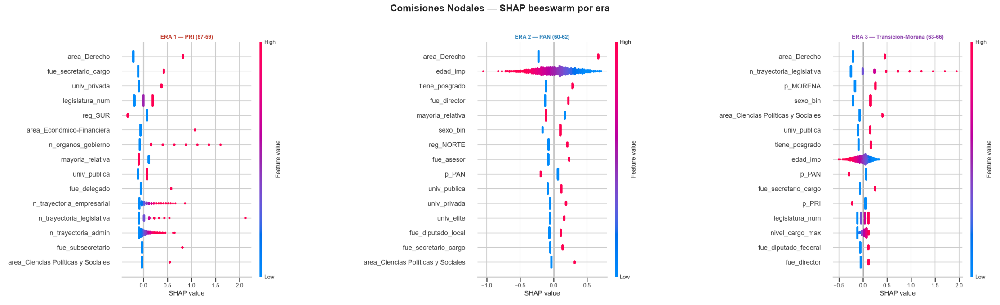

In [37]:
shap_nodal   = {}
models_nodal = {}

for era in ERA_ORDER:
    X, y = get_Xy(era, "nodal_bin")

    m = lr_l1_sfm()
    m.fit(X, y)
    models_nodal[era] = m

    X_sc  = m.named_steps["sc"].transform(X)
    X_sel = m.named_steps["sfm"].transform(X_sc)
    mask  = m.named_steps["sfm"].get_support()

    explainer = shap.LinearExplainer(m.named_steps["lr"], X_sel)
    sv_sel    = explainer.shap_values(X_sel)

    # Pad SHAP values back to full feature space for consistent downstream use
    sv_full = np.zeros((len(X), len(FEAT_COLS)))
    for j, col_idx in enumerate([i for i, s in enumerate(mask) if s]):
        sv_full[:, col_idx] = sv_sel[:, j]

    shap_nodal[era] = (sv_full, X)
    print(f"  {era}: SHAP OK  (selected={mask.sum()}/{len(mask)})")

# Grid beeswarm 1x3 (regenerado con la segmentación S3)
imgs_nodal = {era: shap_beeswarm_to_img(
                  shap_nodal[era][0], shap_nodal[era][1], top_n=15,
                  title=ERA_LABELS[era], color=ERA_COLORS[era])
              for era in ERA_ORDER}
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
for ax, era in zip(axes, ERA_ORDER):
    ax.imshow(imgs_nodal[era])
    ax.axis("off")
plt.suptitle("Comisiones Nodales — SHAP beeswarm por era",
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig(REPORT_DIR / "shap_nodales_beeswarm.png", bbox_inches="tight", dpi=120)
plt.show()

### Interpretación de hallazgos de SHAP Beeswarm Nodales — grid 1×3 por época

Cada punto representa un diputado. El eje X muestra el valor SHAP, es decir, la contribución individual al *log-odds* de recibir comisión nodal. Los valores están expresados en espacio de *log-odds*: contribuciones al predictor lineal de la Regresión Logística L1.

---

#### ERA_1 — PRI

`area_Derecho` domina con `|SHAP| = 0.336`. Le siguen:

| Variable | \|SHAP\| |
|---|---:|
| `area_Derecho` | 0.336 |
| `fue_secretario_cargo` | 0.175 |
| `univ_privada` | 0.160 |
| `legislatura_num` | 0.128 |
| `reg_SUR` | 0.125 |
| `area_Económico-Financiera` | 0.119 |
| `n_organos_gobierno` | 0.112 |
| `mayoria_relativa` | 0.103 |

La formación jurídica y la credencial ejecutiva priísta (secretaría) son las señales centrales; la universidad privada como señal de distinción sugiere que la credencial de élite operaba como *proxy* de reclutamiento dentro del aparato priísta.

---

#### ERA_2 — PAN

`area_Derecho` lidera nuevamente, con `|SHAP| = 0.340`. Le siguen:

| Variable | \|SHAP\| |
|---|---:|
| `area_Derecho` | 0.340 |
| `edad_imp` | 0.224 |
| `tiene_posgrado` | 0.166 |
| `fue_director` | 0.161 |
| `mayoria_relativa` | 0.136 |
| `sexo_bin` | 0.123 |

`edad_imp` alcanza aquí su máximo histórico de la serie (caveat MNAR, §2.2.1b). `sexo_bin` emerge por primera vez como *feature* activo: bajo el PAN, el género adquiere poder predictivo sobre la asignación nodal.

---

#### ERA_3 — Transición-Morena

El liderazgo de `area_Derecho` (0.268) se estrecha frente a la carrera parlamentaria:

| Variable | \|SHAP\| |
|---|---:|
| `area_Derecho` | 0.268 |
| `n_trayectoria_legislativa` | 0.224 |
| `p_MORENA` | 0.199 |
| `sexo_bin` | 0.181 |
| `area_Ciencias Políticas y Sociales` | 0.127 |
| `univ_publica` | 0.121 |
| `tiene_posgrado` | 0.119 |
| `p_PAN` | 0.108 |
| `edad_imp` | 0.108 |
| `fue_secretario_cargo` | 0.105 |

`n_trayectoria_legislativa` alcanza su pico histórico (0.224): la experiencia parlamentaria acumulada es la segunda señal del grupo fusionado, consistente con la reelección consecutiva vigente desde 2018. `p_MORENA` (0.199) es la variable partidista activa — `es_partido_mayoria` es eliminada por L1 en las tres eras — y `sexo_bin` toca su máximo (0.181).

#### Hallazgo transversal

El grupo fusionado 63–66 promedia la fragmentación de la Transición y el dominio de Morena: el perfil resultante combina formación (Derecho, posgrado), carrera legislativa y filiación partidista. La resolución fina del subrégimen 2024+ (documentada en v10) queda fuera del alcance de esta segmentación.

## 5.2 Heatmap de importancias SHAP por era

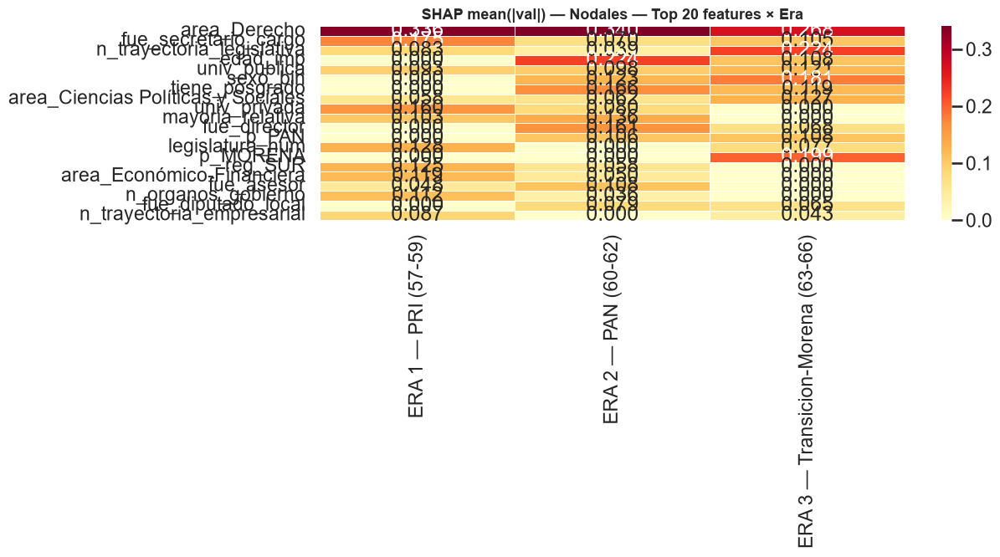

,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66),MEDIA
area_Derecho,0.336,0.340,0.268,0.315
fue_secretario_cargo,0.175,0.070,0.105,0.117
n_trayectoria_legislativa,0.083,0.039,0.224,0.115
edad_imp,0.000,0.224,0.108,0.111
univ_publica,0.093,0.098,0.121,0.104
sexo_bin,0.000,0.123,0.181,0.102
tiene_posgrado,0.000,0.166,0.119,0.095
area_Ciencias Políticas y Sociales,0.058,0.062,0.127,0.083
univ_privada,0.160,0.080,0.000,0.080
mayoria_relativa,0.103,0.136,0.000,0.080


In [38]:
imp_nodal = {era: pd.Series(np.abs(shap_nodal[era][0]).mean(axis=0), index=FEAT_COLS)
             for era in ERA_ORDER}

df_imp_n = pd.DataFrame(imp_nodal).rename(columns=ERA_LABELS)
df_imp_n["MEDIA"] = df_imp_n.mean(axis=1)
df_imp_n = df_imp_n.sort_values("MEDIA", ascending=False).head(20)

fig, ax = plt.subplots(figsize=(13, 7))
plot_cols = [ERA_LABELS[e] for e in ERA_ORDER]
sns.heatmap(df_imp_n[plot_cols], annot=True, fmt=".3f",
            cmap="YlOrRd", ax=ax, linewidths=0.4)
ax.set_title("SHAP mean(|val|) — Nodales — Top 20 features × Era",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(REPORT_DIR / "shap_nodales_heatmap.png", bbox_inches="tight", dpi=120)
plt.show()

df_imp_n.round(4)

### Interpretación — SHAP Heatmap Nodales — *features* × épocas

El *heatmap* codifica en color la importancia media —`|SHAP|`— de cada *feature* para cada era en espacio de *log-odds*. **Cero exacto** significa que el coeficiente fue eliminado por la penalización L1.

---

| Feature | ERA_1 | ERA_2 | ERA_3 | Interpretación |
|---|---:|---:|---:|---|
| `area_Derecho` | 0.336 | 0.340 | 0.268 | *Feature* de mayor `|SHAP|` en las tres eras. La señal más persistente de la serie: la formación jurídica no decae, aunque su ventaja se estrecha en ERA_3. |
| `n_trayectoria_legislativa` | 0.083 | 0.039 | 0.224 | Pico histórico en ERA_3 (segunda señal del grupo): la carrera parlamentaria escala con la reelección consecutiva. |
| `edad_imp` | 0.000 | 0.224 | 0.108 | Eliminado en ERA_1; pico en ERA_2; se modera en ERA_3. **Caveat MNAR** (§2.2.1b): parte de la señal en ERA_2 refleja visibilidad institucional en el SIL. |
| `fue_secretario_cargo` | 0.175 | 0.070 | 0.105 | Pico histórico en ERA_1: la credencial de secretaría fue una señal priísta. Cae bajo el PAN y repunta moderadamente en ERA_3. |
| `sexo_bin` | 0.000 | 0.123 | 0.181 | Ausente en ERA_1; emerge en ERA_2 y alcanza su máximo en ERA_3. Diferenciación sistemática de género en el acceso nodal. |
| `p_MORENA` | 0.000 | 0.000 | 0.199 | Variable partidista activa en ERA_3 — no `es_partido_mayoria`, que L1 elimina en las tres eras. |
| `tiene_posgrado` | 0.000 | 0.166 | 0.119 | Activo en ERA_2–ERA_3: el posgrado opera como señal en las eras tecnocrática y reciente. |
| `mayoria_relativa` | 0.103 | 0.136 | 0.000 | Relevante en el bipartidismo ERA_1–ERA_2; eliminada en ERA_3. |
| `univ_privada` | 0.160 | 0.080 | 0.000 | Señal de distinción decreciente; desaparece en ERA_3, donde `univ_publica` (0.121) toma su lugar. |
| `fue_director` | 0.000 | 0.161 | 0.068 | Credencial administrativa panista; se diluye en ERA_3. |

---

#### Nota sobre `SelectFromModel`

Los *features* con valor cero en una era tienen coeficiente exactamente igual a cero. Esto significa que fueron eliminados por la penalización L1, no simplemente que tienen baja importancia.

## 5.3 Evolución temporal de features clave

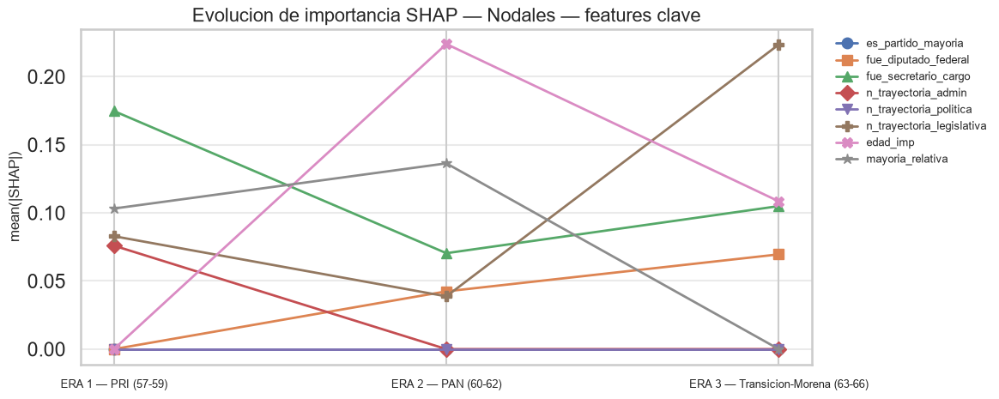

,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66)
es_partido_mayoria,0.000,0.000,0.000
fue_diputado_federal,0.000,0.042,0.070
fue_secretario_cargo,0.175,0.070,0.105
n_trayectoria_admin,0.076,0.000,0.000
n_trayectoria_politica,0.000,0.000,0.000
n_trayectoria_legislativa,0.083,0.039,0.224
edad_imp,0.000,0.224,0.108
mayoria_relativa,0.103,0.136,0.000


In [39]:
KEY_FEATS = [
    "es_partido_mayoria", "fue_diputado_federal",  # AC1(v0): reemplaza n_cargos_legislativos_prev (suma exacta) por su componente principal
    "fue_secretario_cargo", "n_trayectoria_admin",
    "n_trayectoria_politica", "n_trayectoria_legislativa",
    "edad_imp", "mayoria_relativa",
]

imp_raw_n = {era: pd.Series(np.abs(shap_nodal[era][0]).mean(axis=0), index=FEAT_COLS)
             for era in ERA_ORDER}
df_trend_n = pd.DataFrame(
    {f: [imp_raw_n[e][f] for e in ERA_ORDER] for f in KEY_FEATS},
    index=[ERA_LABELS[e] for e in ERA_ORDER]
)

fig, ax = plt.subplots(figsize=(12, 5))
markers = ["o","s","^","D","v","P","X","*"]
for i, feat in enumerate(KEY_FEATS):
    ax.plot(range(len(ERA_ORDER)), df_trend_n[feat], marker=markers[i],
            linewidth=2, label=feat)

ax.set_xticks(range(len(ERA_ORDER)))
ax.set_xticklabels([ERA_LABELS[e] for e in ERA_ORDER], fontsize=9)
ax.set_ylabel("mean(|SHAP|)")
ax.set_title("Evolucion de importancia SHAP — Nodales — features clave")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9)
ax.grid(axis="y", alpha=0.4)
plt.tight_layout()
plt.savefig(REPORT_DIR / "shap_nodales_trend.png", bbox_inches="tight", dpi=120)
plt.show()

df_trend_n.T.round(4)

**Interpretación — Evolución temporal de importancias SHAP (Nodales)**

Gráfica de líneas: variación del peso de features clave a lo largo de las tres épocas. Valores en log-odds (predictor lineal LR L1). Cero = eliminado por L1.

- `fue_secretario_cargo` (0.175 / 0.070 / 0.105): pico histórico en ERA_1 — la experiencia de secretaría fue señal del reclutamiento priísta; cae bajo el PAN y repunta parcialmente en el tramo reciente.
- `n_trayectoria_legislativa` (0.083 / 0.039 / 0.224): el mayor salto relativo de la serie — pico en ERA_3, efecto directo de la reelección consecutiva. Es la señal que "parlamentariza" el perfil nodal reciente.
- `edad_imp` (0.000 / 0.224 / 0.108): eliminado en ERA_1; pico en ERA_2; se modera después. Caveat MNAR (§2.2.1b).
- `mayoria_relativa` (0.103 / 0.136 / 0.000): activa solo durante el bipartidismo; eliminada en ERA_3.
- `fue_diputado_federal` (0.000 / 0.042 / 0.070): crece de forma monotónica pero moderada — la señal parlamentaria concreta la captura mejor `n_trayectoria_legislativa`.
- `n_trayectoria_admin` (0.076 / 0.000 / 0.000): activa solo en ERA_1 dentro de este conjunto — coherente con el declive de la vía burocrática.
- `es_partido_mayoria` y `n_trayectoria_politica` (0.000 en las tres eras): **eliminadas por L1 en toda la serie**. La primera es desplazada por las dummies partidistas concretas (`p_MORENA`, `p_PAN`); la segunda, por los indicadores específicos de cargo. La militancia genérica no es señal una vez condicionada al resto del perfil.

**Interpretación L1:** ausencia en una era = coeficiente exactamente cero. Más contundente que baja importancia en modelos no-lineales.

## 5.4 Resultados por era — Métricas AUC

In [40]:
display(df_nodal_cv)

,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,32.2%,0.720+-0.030,0.729+-0.030,0.727+-0.030,22
1,ERA 2 — PAN (60-62),1500,40.7%,0.720+-0.024,0.721+-0.028,0.719+-0.031,21
2,ERA 3 — Transicion-Morena (63-66),2000,51.0%,0.690+-0.013,0.690+-0.014,0.685+-0.016,24


## 5.5 Interpretación — Comisiones Nodales

Se observa una **señal moderada con descenso suave a lo largo del tiempo**. El AUC del modelo **LR L1 + SFM** pasa de **0.727** en `ERA_1` a **0.685** en `ERA_3`: el perfil biográfico sigue prediciendo el acceso nodal, pero pierde nitidez conforme el mecanismo de asignación se pluraliza.

### Hallazgos clave por era

#### ERA_1 — PRI

- **AUC:** 0.727 ± 0.030
- **Features activos:** 22

`area_Derecho` encabeza la importancia media (`0.336`), seguido de `fue_secretario_cargo` (`0.175`) y `univ_privada` (`0.160`). En esta era, la formación jurídica y la credencial ejecutiva priísta son las señales centrales, no la trayectoria de carrera política pura (`n_trayectoria_politica` es eliminada por L1).

#### ERA_2 — PAN

- **AUC:** 0.719 ± 0.031
- **Features activos:** 21

`area_Derecho` (`0.340`) y `edad_imp` (`0.224`) lideran, con pico histórico de `edad_imp`. También son relevantes `tiene_posgrado` (`0.166`) y `fue_director` (`0.161`), mientras que `sexo_bin` (`0.123`) emerge como señal activa.

> **Nota:** La importancia de `edad_imp` en `ERA_2` puede estar parcialmente inflada por MNAR (§2.2.1b).

#### ERA_3 — Transición-Morena

- **AUC:** 0.685 ± 0.016
- **Features activos:** 24

`area_Derecho` (`0.268`) mantiene el liderazgo pero con la ventaja más estrecha de la serie: `n_trayectoria_legislativa` (`0.224`, pico histórico) y `p_MORENA` (`0.199`) lo siguen de cerca, con `sexo_bin` (`0.181`) en su máximo. El perfil del grupo fusionado combina formación, carrera parlamentaria y filiación con la coalición dominante.

> Con n=2,000, el IC95 del AUC es ±0.023 — el más estrecho de la serie (en v10, la ERA_4 aislada tenía ±0.048 con n=500).

---

### Evolución del perfil nodal
**SHAP en log-odds**

| Feature | ERA_1 | ERA_2 | ERA_3 | Patrón |
|---|---:|---:|---:|---|
| `area_Derecho` | 0.336 | 0.340 | 0.268 | Señal persistente; top-1 en las tres eras |
| `n_trayectoria_legislativa` | 0.083 | 0.039 | 0.224 | Pico en ERA_3; parlamentarización del perfil |
| `edad_imp` | 0.000 | 0.224 | 0.108 | Pico en ERA_2; caveat MNAR |
| `fue_secretario_cargo` | 0.175 | 0.070 | 0.105 | Pico en ERA_1; credencial priísta |
| `sexo_bin` | 0.000 | 0.123 | 0.181 | Emerge en ERA_2; máximo en ERA_3 |
| `p_MORENA` | 0.000 | 0.000 | 0.199 | Variable partidista activa en ERA_3 |
| `tiene_posgrado` | 0.000 | 0.166 | 0.119 | Activa en ERA_2–ERA_3 |
| `mayoria_relativa` | 0.103 | 0.136 | 0.000 | Activa solo en el bipartidismo |

---

### Modelo

El modelo utilizado es **LR L1 + SelectFromModel**. Su estructura es predominantemente lineal, lo cual es coherente con la teoría, en tanto refleja reglas de partido relativamente formalizadas. La esparsidad varía por era, con entre **21 y 24 features activos** de un total de **62**.

---

### Tendencia central

La evolución del perfil nodal puede sintetizarse como una transición desde un perfil político-jurídico priísta hacia una lógica más parlamentarizada:

1. **ERA_1 — PRI:** Derecho + secretaría + credencial de élite.
2. **ERA_2 — PAN:** Derecho + edad + posgrado + credencial administrativa.
3. **ERA_3 — Transición-Morena:** Derecho + carrera legislativa + filiación Morena.

`sexo_bin` opera como barrera implícita desde `ERA_2`, con su máximo en `ERA_3`.

> **Límite interpretativo (§4.6):** la lectura partidista de `ERA_3` es asociativa, no causal — el modelo no separa la identidad partidista concreta del resto de atributos del bloque dominante. Y el detalle del subrégimen 2024+ (la legislativización extrema que v10 documentaba en la LXVI aislada) queda promediado dentro del grupo: es un límite de resolución declarado de la segmentación S3, no un hallazgo negativo.

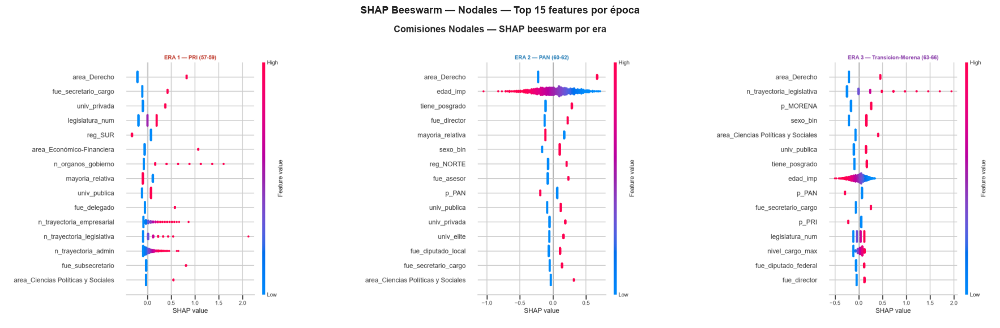

In [41]:
show_img("shap_nodales_beeswarm.png",
         "SHAP Beeswarm — Nodales — Top 15 features por época",
         figsize=(18, 13))

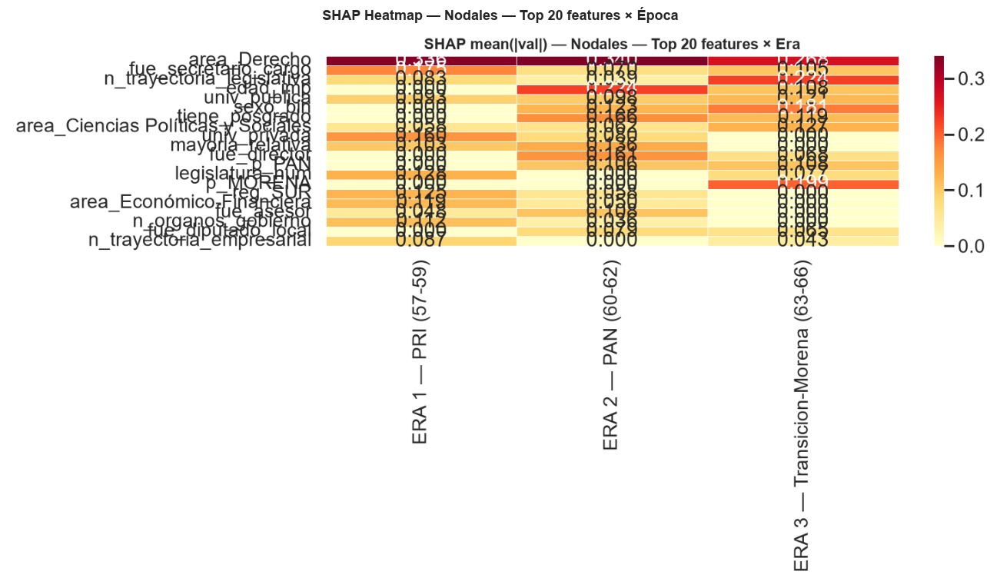

In [42]:
show_img("shap_nodales_heatmap.png",
         "SHAP Heatmap — Nodales — Top 20 features × Época",
         figsize=(15, 8))

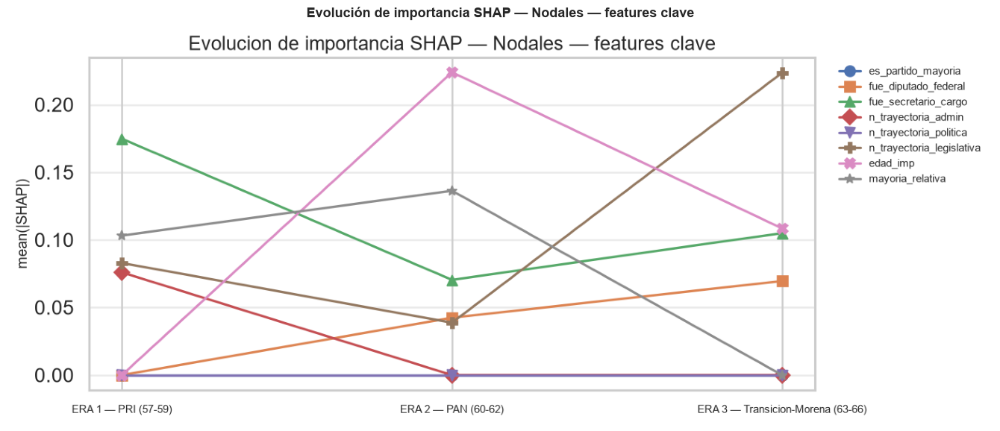

In [43]:
show_img("shap_nodales_trend.png",
         "Evolución de importancia SHAP — Nodales — features clave",
         figsize=(14, 6))

## 5.6 Modelo Bayesiano - Comisiones Nodales (v7)
Regresion Logistica Bayesiana (NUTS) entrenada por era sobre el mismo subconjunto de features seleccionado por SFM, con identica estandarizacion.

**Comparativa en tres dimensiones:**

1. **AUC** - LR L1 (full) | LR L1 + SFM | AUC Bayesiano (desde media posterior).
2. **Forest plots** - Coeficiente Lasso vs. media posterior beta + HDI 94% por era.
3. **Concordancia** - direccion y significancia por feature.

> Runtime aprox. 5-15 min segun hardware (NUTS x 3 eras x 4 cadenas).

In [44]:
print('Entrenando Bayesiano NODAL (NUTS) - 3 eras...')
bayes_nodal_idata, bayes_nodal_summary, bayes_nodal_auc = {}, {}, {}
rows_bn = []

for era in ERA_ORDER:
    feats = sfm_selected_nodal.get(era, [])
    if not feats:
        print(f'  {era}: sin features SFM - saltando.'); continue

    print(f'\n-- {ERA_LABELS[era]}  ({len(feats)} features) --')
    X_arr, y_arr = _Xy_sfm_scaled(era, 'nodal_bin', feats, models_nodal[era])

    idata = bayesian_logit_fit(X_arr, y_arr)
    summ  = posterior_summary_df(idata, feats)
    auc_b = bayes_auc_score(idata, X_arr, y_arr, feats)

    bayes_nodal_idata[era]   = idata
    bayes_nodal_summary[era] = summ
    bayes_nodal_auc[era]     = auc_b

    el = ERA_LABELS[era]
    auc_lrf = _parse_auc(df_nodal_cv, el, 'LR L1 (full)')
    auc_sfm = _parse_auc(df_nodal_cv, el, 'LR L1 + SFM')
    rhat_max = float(az.summary(idata, var_names=['beta'])['r_hat'].max())
    ess_min  = int(az.summary(idata, var_names=['beta'])['ess_bulk'].min())
    n_signif = int(summ['signif_94'].sum())

    rows_bn.append({
        'Era': el, 'n_feat SFM': len(feats),
        'AUC LR full (CV)': round(auc_lrf, 3),
        'AUC LR+SFM (CV)' : round(auc_sfm, 3),
        'AUC Bayesiano'   : round(auc_b, 3),
        'Delta Bayes-LR'  : round(auc_b - auc_lrf, 3),
        'n beta signif'   : n_signif,
        'R-hat max'       : round(rhat_max, 3),
        'ESS min'         : ess_min,
    })
    print(f'    AUC LR={auc_lrf:.3f}  SFM={auc_sfm:.3f}  Bayes={auc_b:.3f}  '
          f'R-hat={rhat_max:.3f}  ESS_min={ess_min}')

df_bayes_nodal_cv = pd.DataFrame(rows_bn)
print('\n-- Comparativa AUC: LR L1 vs. Bayesiano - Nodales --')
display(df_bayes_nodal_cv)

Entrenando Bayesiano NODAL (NUTS) - 3 eras...

-- ERA 1 — PRI (57-59)  (22 features) --


Output()

    AUC LR=0.729  SFM=0.727  Bayes=0.765  R-hat=1.000  ESS_min=2667

-- ERA 2 — PAN (60-62)  (21 features) --


Output()

    AUC LR=0.721  SFM=0.719  Bayes=0.746  R-hat=1.000  ESS_min=4744

-- ERA 3 — Transicion-Morena (63-66)  (24 features) --


Output()

    AUC LR=0.690  SFM=0.685  Bayes=0.725  R-hat=1.000  ESS_min=6227

-- Comparativa AUC: LR L1 vs. Bayesiano - Nodales --


,Era,n_feat SFM,AUC LR full (CV),AUC LR+SFM (CV),AUC Bayesiano,Delta Bayes-LR,n beta signif,R-hat max,ESS min
0,ERA 1 — PRI (57-59),22,0.729,0.727,0.765,0.036,15,1.000,2667
1,ERA 2 — PAN (60-62),21,0.721,0.719,0.746,0.025,11,1.000,4744
2,ERA 3 — Transicion-Morena (63-66),24,0.690,0.685,0.725,0.035,18,1.000,6227


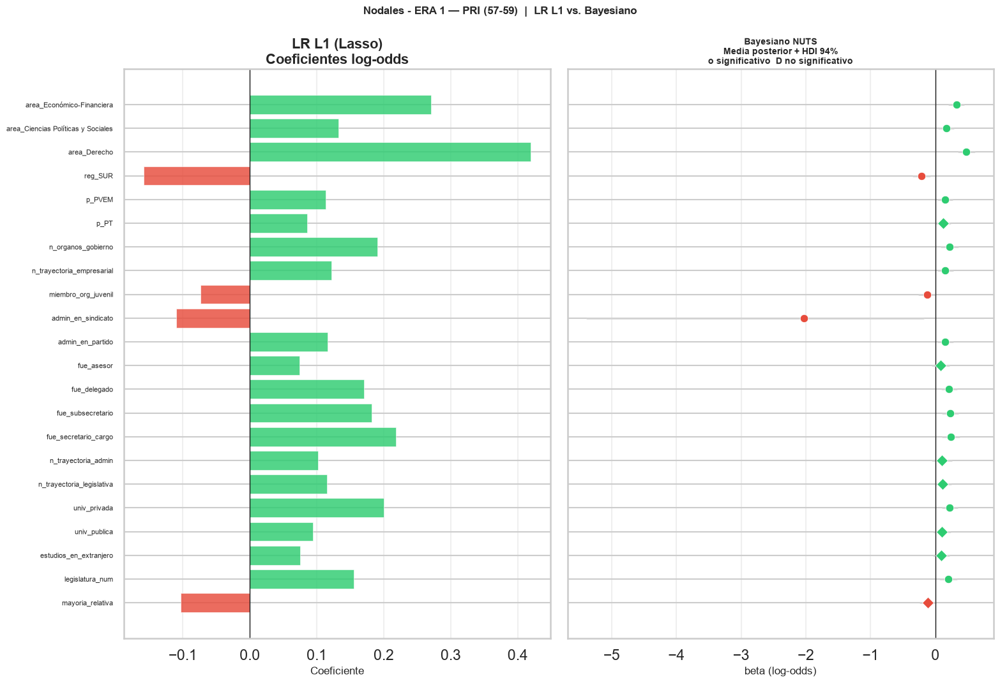


ERA 1 — PRI (57-59) - Concordancia de direccion: 100% (22/22)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,mayoria_relativa,-0.1032,-0.1152,0.032,False,True
1,legislatura_num,+0.1552,+0.2042,0.999,True,True
2,estudios_en_extranjero,+0.0747,+0.0906,0.933,False,True
3,univ_publica,+0.0940,+0.0990,0.925,False,True
4,univ_privada,+0.1996,+0.2222,1.000,True,True
5,n_trayectoria_legislativa,+0.1156,+0.1158,0.969,False,True
6,n_trayectoria_admin,+0.1018,+0.1027,0.903,False,True
7,fue_secretario_cargo,+0.2183,+0.2433,0.999,True,True
8,fue_subsecretario,+0.1816,+0.2310,1.000,True,True
9,fue_delegado,+0.1700,+0.2134,1.000,True,True


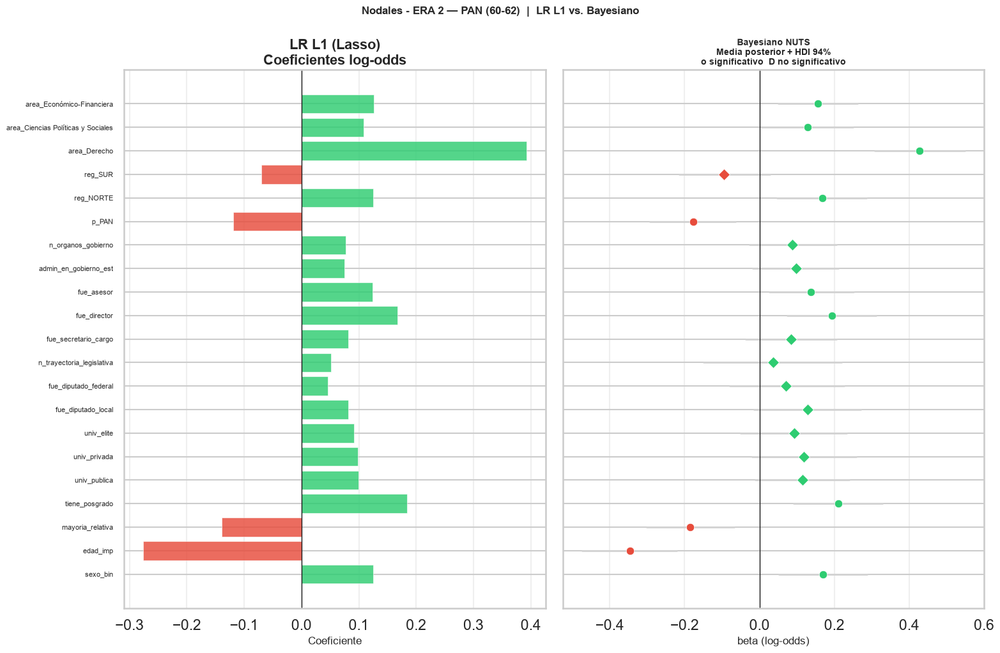


ERA 2 — PAN (60-62) - Concordancia de direccion: 100% (21/21)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,sexo_bin,+0.1253,+0.1701,0.996,True,True
1,edad_imp,-0.2758,-0.3461,0.000,True,True
2,mayoria_relativa,-0.1392,-0.1848,0.002,True,True
3,tiene_posgrado,+0.1847,+0.2109,1.000,True,True
4,univ_publica,+0.0997,+0.1154,0.957,False,True
5,univ_privada,+0.0981,+0.1180,0.945,False,True
6,univ_elite,+0.0914,+0.0933,0.890,False,True
7,fue_diputado_local,+0.0820,+0.1287,0.953,False,True
8,fue_diputado_federal,+0.0455,+0.0710,0.806,False,True
9,n_trayectoria_legislativa,+0.0520,+0.0374,0.650,False,True


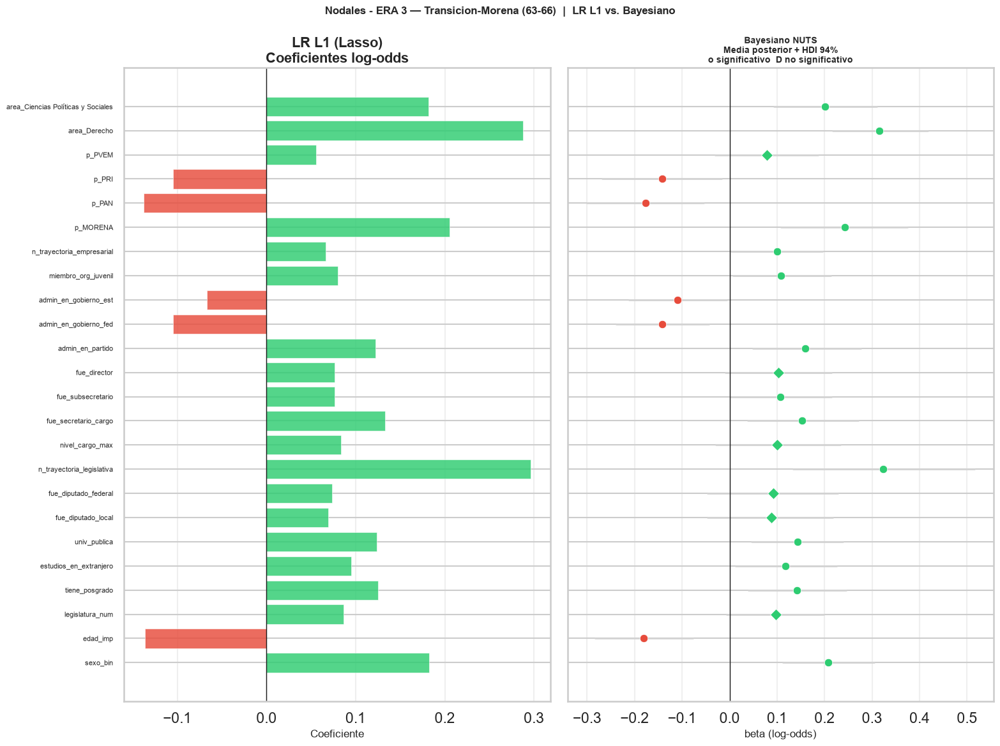


ERA 3 — Transicion-Morena (63-66) - Concordancia de direccion: 100% (24/24)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,sexo_bin,+0.1822,+0.2082,1.000,True,True
1,edad_imp,-0.1364,-0.1802,0.001,True,True
2,legislatura_num,+0.0862,+0.0972,0.960,False,True
3,tiene_posgrado,+0.1252,+0.1424,0.996,True,True
4,estudios_en_extranjero,+0.0951,+0.1173,0.984,True,True
5,univ_publica,+0.1239,+0.1433,0.998,True,True
6,fue_diputado_local,+0.0690,+0.0881,0.889,False,True
7,fue_diputado_federal,+0.0736,+0.0919,0.896,False,True
8,n_trayectoria_legislativa,+0.2966,+0.3229,1.000,True,True
9,nivel_cargo_max,+0.0836,+0.0995,0.924,False,True


In [45]:
# Forest plots + tablas de concordancia - Nodales
for era in ERA_ORDER:
    if era not in bayes_nodal_summary: continue
    feats    = sfm_selected_nodal[era]
    lr_coefs = models_nodal[era].named_steps['lr'].coef_[0]
    summ     = bayes_nodal_summary[era]

    fig = forest_comparison_fig(lr_coefs, feats, summ, ERA_LABELS[era], 'Nodales')
    fig.savefig(REPORT_DIR / f'bayes_nodal_forest_{era}.png', bbox_inches='tight', dpi=110)
    plt.show()

    ag  = agreement_df(lr_coefs, feats, summ)
    pct = ag['dir_agree'].mean() * 100
    print(f'\n{ERA_LABELS[era]} - Concordancia de direccion: {pct:.0f}% '
          f'({ag["dir_agree"].sum()}/{len(feats)})')

    def _style_agree(row):
        bg = "#2a8a41" if row['dir_agree'] else '#f8d7da'
        return [f'background-color: {bg}'] * len(row)

    display(ag.style
              .apply(_style_agree, axis=1)
              .format({'lr_coef': '{:+.4f}', 'bayes_mean': '{:+.4f}', 'prob_pos': '{:.3f}'})
              .set_caption(f'Concordancia LR L1 vs Bayesiano - {ERA_LABELS[era]}'))

**Interpretacion - Comparativa LR L1 vs. Bayesiano (Nodales)**

**AUC:** La diferencia entre AUC frecuentista (CV) y AUC Bayesiano (media posterior in-sample) refleja dos cosas distintas: el CV evalua generalizacion out-of-fold; el AUC Bayesiano evalua ajuste in-sample. Diferencias |Delta| < 0.02 indican consistencia. |Delta| > 0.04 puede senalar sobreajuste del Bayesiano.

**Forest plots:** Los coeficientes L1 son esparsos por construccion; los betas bayesianos tienen masa distribucional positiva incluso para features marginales. Donde ambos son del mismo signo con HDI que excluye cero, la senal es robusta al paradigma.

**Concordancia de direccion:** >= 85% indica ranking cualitativo estable. < 70% senala sensibilidad del resultado al estimador elegido.

**Resultados observados (v13):** Concordancia de direccion = 100% en las 3 eras (ERA_1: 22/22, ERA_2: 21/21, ERA_3: 24/24). AUC Bayesiano supera al LR L1 en todas las eras: ERA_1=0.765 (+0.036), ERA_2=0.746 (+0.025), ERA_3=0.725 (+0.035) — deltas homogéneos (0.025–0.036), en su mayor parte atribuibles a la comparación in-sample vs. out-of-fold. A diferencia de v10, ya no existe el delta atípico del grupo corto (la ERA_4 de n=500 mostraba +0.102). Features con HDI que excluyen cero: ERA_1=15, ERA_2=11, ERA_3=18 de los seleccionados por SFM.

**R-hat y ESS:** Convergencia MCMC impecable en los tres grupos — R-hat=1.000 y ESS_min=2667/4744/6227. Condicion necesaria para validez inferencial bayesiana, cumplida.

**Conexion con A&L (2009):** El Bayesiano confirma el ranking en ERA_1: `area_Derecho`, `fue_secretario_cargo` y las credenciales ejecutivas tienen betas positivos con HDI que excluye cero, replicando la prioridad de la experiencia burocratica sobre la legislativa en la era priista. En ERA_3, el HDI de `n_trayectoria_legislativa` y `p_MORENA` excluye cero: la parlamentarizacion del perfil es robusta al paradigma.

# 6. Comisiones Lastre — Clasificación Binaria

**Target:** lastre_bin = 1 si el diputado tiene ≥1 comisión lastre.

**Hipótesis:** las comisiones lastre se asignan a diputados de la oposición, primiparos, sin red de partido ni trayectoria relevante — perfil inverso a nodales.

In [46]:
print("Entrenando modelos para LASTRE (variantes de Regresión Logística)... ")
rows_lastre = []
sfm_selected_lastre = {}

for era in ERA_ORDER:
    X, y = get_Xy(era, "lastre_bin")

    # Evaluaciones de modelos
    v4_mu,  v4_sd  = cv_auc(lr_v4_l2(),   X, y)
    lr_mu,  lr_sd  = cv_auc(lr_binary(),  X, y)
    sfm_mu, sfm_sd = cv_auc(lr_l1_sfm(),  X, y)

    selected = sfm_report(X, y)
    sfm_selected_lastre[era] = selected

    rows_lastre.append({
        "Era": ERA_LABELS[era], "n": len(y), "pos%": f"{y.mean():.1%}",
        "LR L2 (v4)":   f"{v4_mu:.3f}+-{v4_sd:.3f}",
        "LR L1 (full)": f"{lr_mu:.3f}+-{lr_sd:.3f}",
        "LR L1 + SFM":  f"{sfm_mu:.3f}+-{sfm_sd:.3f}",
        "n_features": len(selected),
    })
    print(f"  {era:<22}  LR_L2={v4_mu:.3f} LR_L1={lr_mu:.3f} SFM={sfm_mu:.3f} features={len(selected)}")

df_lastre_cv = pd.DataFrame(rows_lastre)
df_lastre_cv


Entrenando modelos para LASTRE (variantes de Regresión Logística)... 
  ERA_1_PRI               LR_L2=0.591 LR_L1=0.586 SFM=0.584 features=20


  ERA_2_PAN               LR_L2=0.642 LR_L1=0.639 SFM=0.635 features=25
  ERA_3_TRANSMOR          LR_L2=0.600 LR_L1=0.610 SFM=0.610 features=25


,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,42.1%,0.591+-0.011,0.586+-0.012,0.584+-0.015,20
1,ERA 2 — PAN (60-62),1500,45.9%,0.642+-0.029,0.639+-0.031,0.635+-0.032,25
2,ERA 3 — Transicion-Morena (63-66),2000,47.2%,0.600+-0.024,0.610+-0.023,0.610+-0.020,25


In [47]:
shap_lastre   = {}
models_lastre = {}

for era in ERA_ORDER:
    X, y = get_Xy(era, "lastre_bin")

    m = lr_l1_sfm()
    m.fit(X, y)
    models_lastre[era] = m

    X_sc  = m.named_steps["sc"].transform(X)
    X_sel = m.named_steps["sfm"].transform(X_sc)
    mask  = m.named_steps["sfm"].get_support()

    explainer = shap.LinearExplainer(m.named_steps["lr"], X_sel)
    sv_sel    = explainer.shap_values(X_sel)

    sv_full = np.zeros((len(X), len(FEAT_COLS)))
    for j, col_idx in enumerate([i for i, s in enumerate(mask) if s]):
        sv_full[:, col_idx] = sv_sel[:, j]

    shap_lastre[era] = (sv_full, X)
    print(f"  {era}: SHAP OK  (selected={mask.sum()}/{len(mask)})")

Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 2000 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=2000 when initializing the masker.


  ERA_1_PRI: SHAP OK  (selected=20/62)
  ERA_2_PAN: SHAP OK  (selected=25/62)
  ERA_3_TRANSMOR: SHAP OK  (selected=25/62)


## 6.1 Comparativa SHAP — Nodales vs Lastre

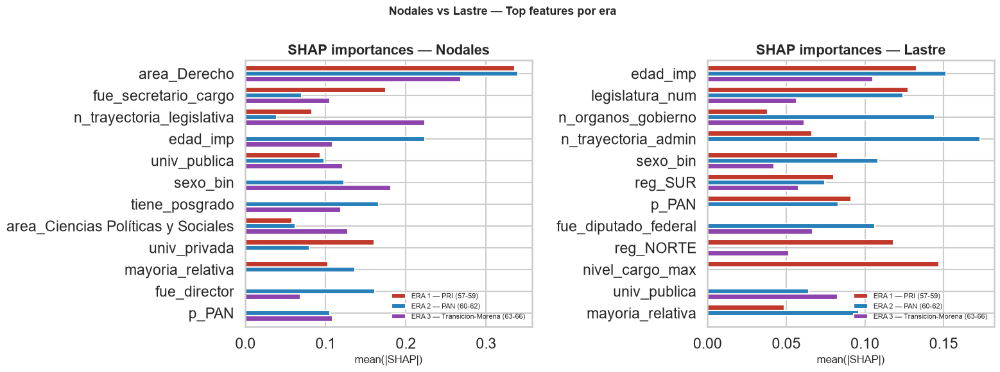

In [48]:
# Barplot comparativo top features nodal vs lastre
TOP_N = 12

def top_avg_imp(shap_dict, n=TOP_N):
    """Mean importance across all eras for top-n features."""
    all_imp = pd.DataFrame(
        {era: pd.Series(np.abs(sv).mean(axis=0), index=FEAT_COLS)
         for era, (sv, _) in shap_dict.items()}
    )
    return all_imp.mean(axis=1).nlargest(n)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
for ax, (sd, label, color) in zip(
    axes,
    [(shap_nodal, "Nodales", "#e74c3c"),
     (shap_lastre,"Lastre",  "#3498db")],
):
    top = top_avg_imp(sd)
    era_data = {ERA_LABELS[era]:
                pd.Series(np.abs(shap_data[0]).mean(axis=0), index=FEAT_COLS).reindex(top.index).fillna(0)
                for era, shap_data in sd.items()}
    df_plot = pd.DataFrame(era_data)
    df_plot.plot(kind="barh", ax=ax, width=0.75,
                 color=[ERA_COLORS[e] for e in ERA_ORDER])
    ax.set_title(f"SHAP importances — {label}", fontweight="bold")
    ax.set_xlabel("mean(|SHAP|)")
    ax.legend(fontsize=8)
    ax.invert_yaxis()

plt.suptitle("Nodales vs Lastre — Top features por era", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(REPORT_DIR / "shap_nodal_vs_lastre.png", bbox_inches="tight", dpi=120)
plt.show()

**Variables con mayor impacto en análisis SHAP: Nodales vs Lastre**

Las barras enfrentadas muestran los features más importantes para cada tipo de comisión. Diferencias estructurales:

- `area_Derecho` (SHAP nodal: 0.336 / 0.340 / 0.268) no aparece entre los top predictores de lastre (solo 0.094 en ERA_2) — es señal de acceso a comisiones de poder, no de asignación marginal.
- `edad_imp` es la excepción notable: top-2 en nodales ERA_2 (0.224) y el predictor de mayor magnitud media en lastre (0.130), activo en las tres eras (0.133 / 0.151 / 0.105).
- `n_trayectoria_admin` aparece entre los top predictores de lastre en ERA_2 (0.173) pero no figura en el top de nodales de ninguna era — la trayectoria burocrática tiene señal en el mecanismo de asignación marginal panista, no en el nodal.
- `sexo_bin` aparece con importancia moderada en lastre (ERA_1=0.083, ERA_2=0.108) y con más fuerza en nodales (ERA_2=0.123, ERA_3=0.181) — señal bidireccional que opera en ambos tipos de asignación.
- En ERA_3 el lastre desarrolla marcadores propios: `n_trayectoria_legislativa` (0.126) y `univ_privada` (0.116) — perfil de oposición veterana — que no espejan a los predictores nodales del mismo grupo.
- Los coeficientes de correlación entre SHAP(nodal) y −SHAP(lastre) van de −0.095 (ERA_1) a −0.393 (ERA_2), lejos de −1.0. Nodal y lastre son mecanismos cualitativamente distintos, no simplemente opuestos.

## 6.2 Test de imagen espejo — ¿Lastre es el inverso de Nodal?

Si lastre fuera simplemente el inverso de nodal (asignación por exclusión), la correlación entre SHAP(nodal) y -SHAP(lastre) debería ser r ≈ −1.0.

In [49]:
# Correlacion SHAP(nodal) vs -SHAP(lastre) por era
corr_mirror = {}
for era in ERA_ORDER:
    sv_n = pd.Series(np.abs(shap_nodal[era][0]).mean(axis=0),  index=FEAT_COLS)
    sv_l = pd.Series(np.abs(shap_lastre[era][0]).mean(axis=0), index=FEAT_COLS)
    corr_mirror[era] = sv_n.corr(-sv_l)

print("Correlacion SHAP(nodal) vs -SHAP(lastre):")
print("Si r ~ 1.0 -> imagen espejo exacta (asignacion por exclusion, no seleccion positiva)")
print()
for era, c in corr_mirror.items():
    bar = "=" * int(abs(c) * 30)
    print(f"  {ERA_LABELS[era]:<30}  r = {c:+.3f}  |{bar}|")

Correlacion SHAP(nodal) vs -SHAP(lastre):
Si r ~ 1.0 -> imagen espejo exacta (asignacion por exclusion, no seleccion positiva)

  ERA 1 — PRI (57-59)             r = -0.095  |==|
  ERA 2 — PAN (60-62)             r = -0.393  |===========|
  ERA 3 — Transicion-Morena (63-66)  r = -0.336  |==========|


In [50]:
_mirror_read = {
    "ERA_1_PRI":      ("Relación inversa débil", "asignación no es por exclusión simple"),
    "ERA_2_PAN":      ("Inversa moderada",        "la más cercana a un patrón bimodal mayoría/oposición"),
    "ERA_3_TRANSMOR": ("Inversa moderada",        "patrón bimodal mayoría/oposición post-2015"),
}
df_mirror = pd.DataFrame([
    {"Época": ERA_LABELS[era],
     "r(SHAP_nodal, -SHAP_lastre)": corr_mirror[era],
     "Interpretación": _mirror_read[era][0],
     "Lectura": _mirror_read[era][1]}
    for era in ERA_ORDER
])
display(df_mirror.set_index("Época"))

,"r(SHAP_nodal, -SHAP_lastre)",Interpretación,Lectura
Época,,,
ERA 1 — PRI (57-59),-0.095,Relación inversa débil,asignación no es por exclusión simple
ERA 2 — PAN (60-62),-0.393,Inversa moderada,la más cercana a un patrón bimodal mayoría/opo...
ERA 3 — Transicion-Morena (63-66),-0.336,Inversa moderada,patrón bimodal mayoría/oposición post-2015


## 6.3 Resultados por era — Métricas AUC

In [51]:
display(df_lastre_cv)

,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,42.1%,0.591+-0.011,0.586+-0.012,0.584+-0.015,20
1,ERA 2 — PAN (60-62),1500,45.9%,0.642+-0.029,0.639+-0.031,0.635+-0.032,25
2,ERA 3 — Transicion-Morena (63-66),2000,47.2%,0.600+-0.024,0.610+-0.023,0.610+-0.020,25


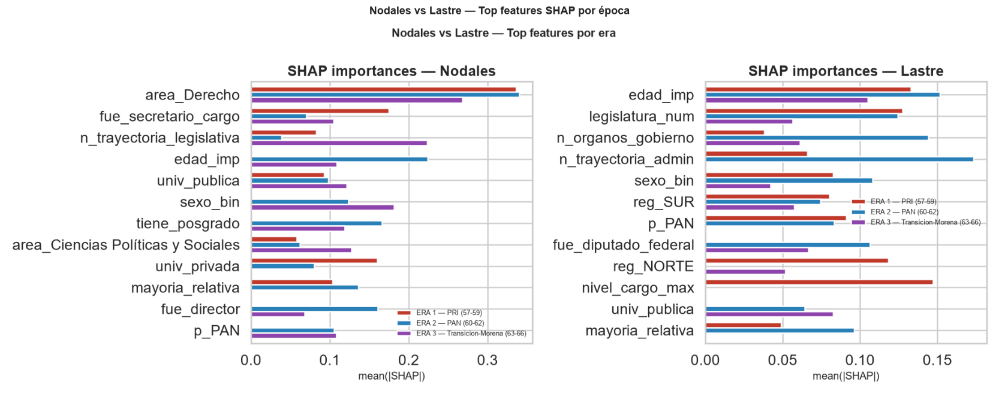

In [52]:
show_img("shap_nodal_vs_lastre.png",
         "Nodales vs Lastre — Top features SHAP por época",
         figsize=(17, 7))

## 6.4 Interpretacion -- Comisiones Lastre

Senal consistentemente debil. AUC (LR L1 + SFM) entre 0.584 y 0.635.

Hallazgos por era:

- ERA_1 (PRI) -- AUC=0.584±0.015, 20 features activos. `nivel_cargo_max` (0.147) lidera, seguido de `edad_imp` (0.133) y `legislatura_num` (0.127). Ningun feature de trayectoria politica o juridica destaca -- el mecanismo de asignacion lastre en el PRI parece regido por variables de contexto institucional (nivel de cargo, momento de la legislatura) mas que por perfil de carrera.
- ERA_2 (PAN) -- AUC=0.635±0.032, 25 features activos. La epoca mas predecible. `n_trayectoria_admin` (0.173) y `n_organos_gobierno` (0.144) lideran -- la oposicion PRI/PRD era mas homogenea en perfil administrativo. `edad_imp` (0.151) tambien relevante.
- ERA_3 (Transicion-Morena) -- AUC=0.610±0.020, 25 features activos. `n_trayectoria_legislativa` (0.126), `univ_privada` (0.116) y `edad_imp` (0.105) encabezan: los diputados con mas trayectoria parlamentaria y formacion privada -- perfil de oposicion veterana -- concentran las comisiones lastre del tramo reciente.

**Test de imagen espejo -- resultado:**

**La hipotesis de imagen espejo es FALSA.** Correlaciones SHAP(nodal) vs -SHAP(lastre): ERA_1=-0.095, ERA_2=-0.393, ERA_3=-0.336 -- todas lejos de -1.0 (ver tabla en §6.2).

1. Nodal y lastre tienen logicas parcialmente independientes.
2. ERA_2 (r=-0.393) es la epoca mas cercana a una logica bimodal mayoria/oposicion; ERA_3 (r=-0.336) hereda un patron similar bajo el alineamiento post-2015.
3. Los predictores dominantes de lastre (`edad_imp`, `n_trayectoria_admin`, `univ_privada`, `nivel_cargo_max`) son distintos de los de nodales (`area_Derecho`, `n_trayectoria_legislativa`, `sexo_bin`, `p_MORENA`).

**Implicacion metodologica:** nodal y lastre deben modelarse como outcomes separados.

**Nota de alcance:** a diferencia de nodales (§5.5), en lastre `es_partido_mayoria`/`p_MORENA` no figuran entre los predictores dominantes de ninguna era — la advertencia de colinealidad partidista de §4.6 no aplica a este target.

## 6.5 Modelo Bayesiano - Comisiones Lastre (v7)

Misma arquitectura Bayesiana (NUTS) aplicada al target lastre_bin. Se espera senal mas debil que en nodales (AUC 0.53-0.63 en LR L1). El Bayesiano permite cuantificar la incertidumbre posterior incluso cuando la senal es debil: HDI amplios que cruzan cero indican que el parametro es esencialmente indistinguible de cero.

> Runtime aprox. 5-15 min (NUTS x 3 eras x 4 cadenas).

In [53]:
print('Entrenando Bayesiano LASTRE (NUTS) - 3 eras...')
bayes_lastre_idata, bayes_lastre_summary, bayes_lastre_auc = {}, {}, {}
rows_bl = []

for era in ERA_ORDER:
    feats = sfm_selected_lastre.get(era, [])
    if not feats:
        print(f'  {era}: sin features SFM - saltando.'); continue

    print(f'\n-- {ERA_LABELS[era]}  ({len(feats)} features) --')
    X_arr, y_arr = _Xy_sfm_scaled(era, 'lastre_bin', feats, models_lastre[era])

    idata = bayesian_logit_fit(X_arr, y_arr)
    summ  = posterior_summary_df(idata, feats)
    auc_b = bayes_auc_score(idata, X_arr, y_arr, feats)

    bayes_lastre_idata[era]   = idata
    bayes_lastre_summary[era] = summ
    bayes_lastre_auc[era]     = auc_b

    el = ERA_LABELS[era]
    auc_lrf = _parse_auc(df_lastre_cv, el, 'LR L1 (full)')
    auc_sfm = _parse_auc(df_lastre_cv, el, 'LR L1 + SFM')
    rhat_max = float(az.summary(idata, var_names=['beta'])['r_hat'].max())
    ess_min  = int(az.summary(idata, var_names=['beta'])['ess_bulk'].min())
    n_signif = int(summ['signif_94'].sum())

    rows_bl.append({
        'Era': el, 'n_feat SFM': len(feats),
        'AUC LR full (CV)': round(auc_lrf, 3),
        'AUC LR+SFM (CV)' : round(auc_sfm, 3),
        'AUC Bayesiano'   : round(auc_b, 3),
        'Delta Bayes-LR'  : round(auc_b - auc_lrf, 3),
        'n beta signif'   : n_signif,
        'R-hat max'       : round(rhat_max, 3),
        'ESS min'         : ess_min,
    })
    print(f'    AUC LR={auc_lrf:.3f}  SFM={auc_sfm:.3f}  Bayes={auc_b:.3f}  '
          f'R-hat={rhat_max:.3f}  ESS_min={ess_min}')

df_bayes_lastre_cv = pd.DataFrame(rows_bl)
print('\n-- Comparativa AUC: LR L1 vs. Bayesiano - Lastre --')
display(df_bayes_lastre_cv)

Entrenando Bayesiano LASTRE (NUTS) - 3 eras...

-- ERA 1 — PRI (57-59)  (20 features) --


Output()

    AUC LR=0.586  SFM=0.584  Bayes=0.645  R-hat=1.000  ESS_min=5105

-- ERA 2 — PAN (60-62)  (25 features) --


Output()

    AUC LR=0.639  SFM=0.635  Bayes=0.693  R-hat=1.000  ESS_min=5553

-- ERA 3 — Transicion-Morena (63-66)  (25 features) --


Output()

There were 1500 divergences after tuning. Increase `target_accept` or reparameterize.


The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


    AUC LR=0.610  SFM=0.610  Bayes=0.579  R-hat=1.530  ESS_min=7

-- Comparativa AUC: LR L1 vs. Bayesiano - Lastre --


,Era,n_feat SFM,AUC LR full (CV),AUC LR+SFM (CV),AUC Bayesiano,Delta Bayes-LR,n beta signif,R-hat max,ESS min
0,ERA 1 — PRI (57-59),20,0.586,0.584,0.645,0.059,12,1.000,5105
1,ERA 2 — PAN (60-62),25,0.639,0.635,0.693,0.054,18,1.000,5553
2,ERA 3 — Transicion-Morena (63-66),25,0.610,0.610,0.579,-0.031,4,1.530,7


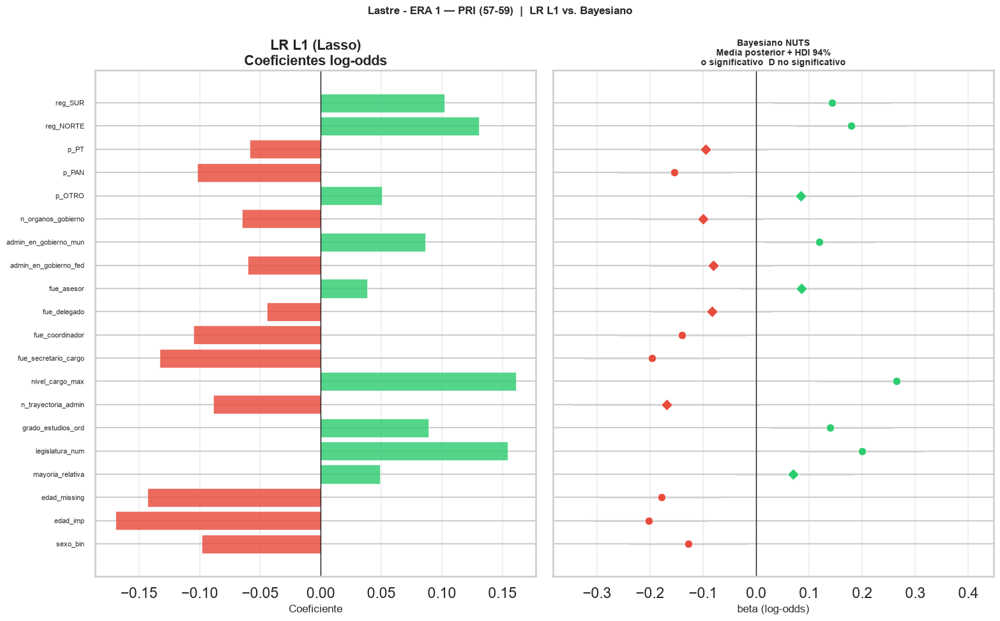


ERA 1 — PRI (57-59) - Concordancia: 100% (20/20)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,sexo_bin,-0.0981,-0.1277,0.014,True,True
1,edad_imp,-0.1695,-0.2020,0.000,True,True
2,edad_missing,-0.1431,-0.1785,0.001,True,True
3,mayoria_relativa,+0.0488,+0.0701,0.884,False,True
4,legislatura_num,+0.1544,+0.1996,1.000,True,True
5,grado_estudios_ord,+0.0888,+0.1398,0.991,True,True
6,n_trayectoria_admin,-0.0886,-0.1682,0.036,False,True
7,nivel_cargo_max,+0.1611,+0.2642,1.000,True,True
8,fue_secretario_cargo,-0.1330,-0.1959,0.002,True,True
9,fue_coordinador,-0.1052,-0.1393,0.013,True,True


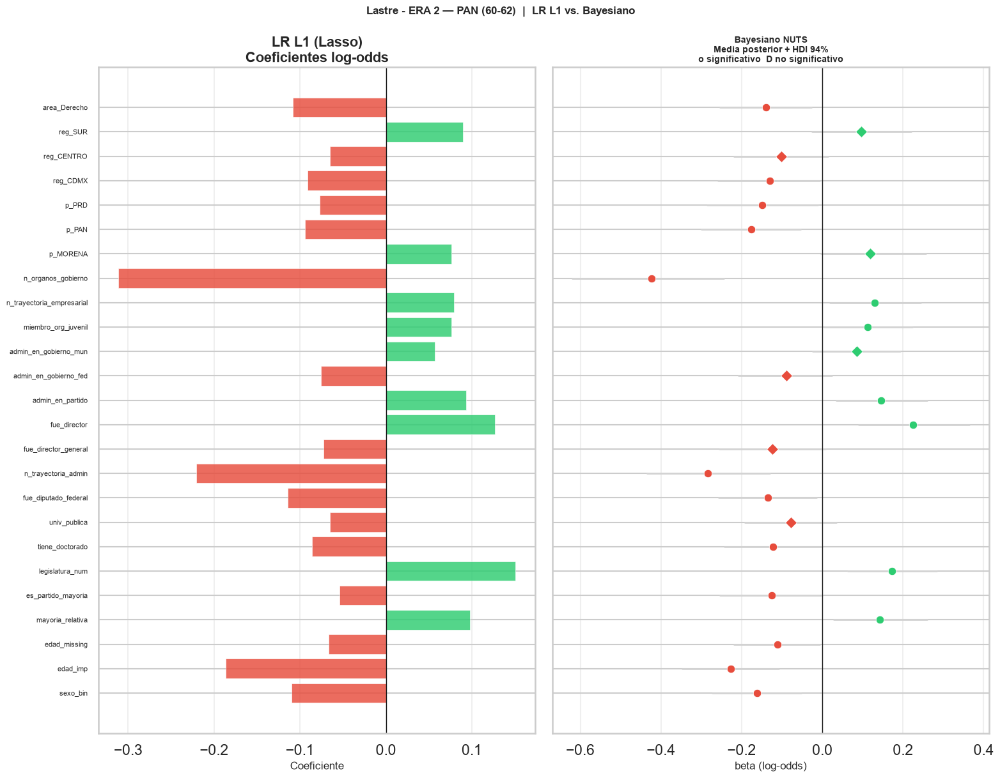


ERA 2 — PAN (60-62) - Concordancia: 100% (25/25)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,sexo_bin,-0.1100,-0.1616,0.003,True,True
1,edad_imp,-0.1866,-0.2270,0.000,True,True
2,edad_missing,-0.0667,-0.1112,0.024,True,True
3,mayoria_relativa,+0.0980,+0.1431,0.988,True,True
4,es_partido_mayoria,-0.0537,-0.1261,0.029,True,True
5,legislatura_num,+0.1508,+0.1733,0.998,True,True
6,tiene_doctorado,-0.0864,-0.1215,0.030,True,True
7,univ_publica,-0.0652,-0.0782,0.098,False,True
8,fue_diputado_federal,-0.1140,-0.1352,0.017,True,True
9,n_trayectoria_admin,-0.2208,-0.2840,0.000,True,True


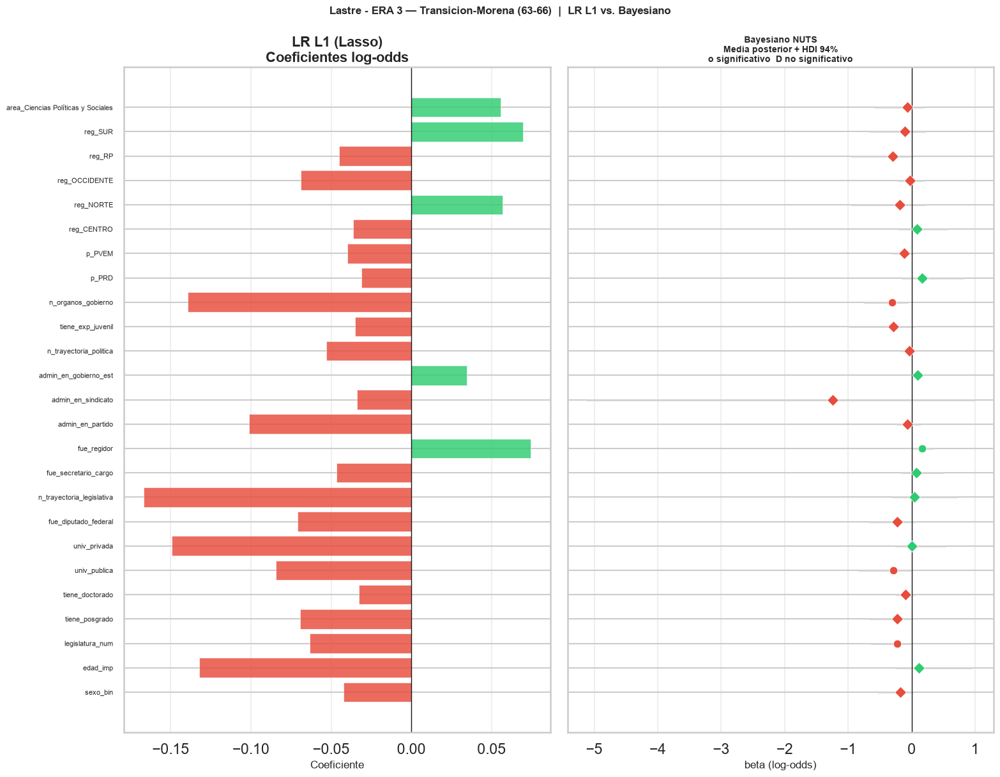


ERA 3 — Transicion-Morena (63-66) - Concordancia: 64% (16/25)


,feature,lr_coef,bayes_mean,prob_pos,bayes_signif,dir_agree
0,sexo_bin,-0.0422,-0.1758,0.082,False,True
1,edad_imp,-0.1322,+0.1174,0.251,False,False
2,legislatura_num,-0.0632,-0.2308,0.025,True,True
3,tiene_posgrado,-0.0691,-0.2310,0.048,False,True
4,tiene_doctorado,-0.0326,-0.0970,0.150,False,True
5,univ_publica,-0.0843,-0.2867,0.015,True,True
6,univ_privada,-0.1492,+0.0063,0.250,False,False
7,fue_diputado_federal,-0.0707,-0.2237,0.094,False,True
8,n_trayectoria_legislativa,-0.1670,+0.0457,0.255,False,False
9,fue_secretario_cargo,-0.0468,+0.0761,0.330,False,False


In [54]:
# Forest plots + tablas de concordancia - Lastre
for era in ERA_ORDER:
    if era not in bayes_lastre_summary: continue
    feats    = sfm_selected_lastre[era]
    lr_coefs = models_lastre[era].named_steps['lr'].coef_[0]
    summ     = bayes_lastre_summary[era]

    fig = forest_comparison_fig(lr_coefs, feats, summ, ERA_LABELS[era], 'Lastre')
    fig.savefig(REPORT_DIR / f'bayes_lastre_forest_{era}.png', bbox_inches='tight', dpi=110)
    plt.show()

    ag  = agreement_df(lr_coefs, feats, summ)
    pct = ag['dir_agree'].mean() * 100
    print(f'\n{ERA_LABELS[era]} - Concordancia: {pct:.0f}% ({ag["dir_agree"].sum()}/{len(feats)})')

    def _style_agree(row):
        bg = "#188131" if row['dir_agree'] else "#db4552"
        return [f'background-color: {bg}'] * len(row)

    display(ag.style
              .apply(_style_agree, axis=1)
              .format({'lr_coef': '{:+.4f}', 'bayes_mean': '{:+.4f}', 'prob_pos': '{:.3f}'})
              .set_caption(f'Concordancia LR L1 vs Bayesiano - {ERA_LABELS[era]}'))

**Interpretacion - Comparativa LR L1 vs. Bayesiano (Lastre)**

**ERA_1 y ERA_2 — convergencia OK, lectura sustantiva válida.** AUC Bayesiano: ERA_1=0.645 (+0.059 sobre LR), ERA_2=0.693 (+0.054), con R-hat=1.000 y ESS_min=5105/5553, y concordancia de direccion del 100% (20/20 y 25/25). El AUC LR observado (0.586/0.639) se traduce en HDI amplios que cruzan cero para buena parte de los features (12 y 18 significativos de 20 y 25): el Bayesiano cuantifica explicitamente que la informacion del perfil biografico sobre el lastre es limitada, aunque la direccion cualitativa de los coeficientes es estable entre paradigmas.

**ERA_3 — el muestreador NO converge; la inferencia bayesiana de este grupo no es válida.** La corrida registra 1,500 divergencias tras el tuning, R-hat max=1.530 y ESS_min=7, muy fuera de los umbrales (R-hat<1.05, ESS>400). Consecuencia visible: AUC Bayesiano 0.579 (−0.031 respecto al LR), solo 4 betas "significativos" y concordancia de direccion de 64% — cifras que **no deben leerse sustantivamente**: son sintoma del fallo de muestreo, no evidencia sobre el mecanismo de asignacion. La tabla lo marca como `REVISAR` en los diagnosticos (§8.0). La senal frecuentista de ERA_3 (AUC CV=0.610) no esta afectada.

**Extension pendiente:** re-muestrear el grupo ERA_3-lastre con `target_accept` mas alto (p.ej. 0.99), mas `tune`, o reparametrizacion (priors mas informativos / QR), y verificar diagnosticos antes de usar sus HDI.

Cuando el AUC es bajo y la mayoria de los HDI incluyen el cero — como en ERA_1–ERA_2 — ambos paradigmas convergen en la misma conclusion sustantiva: la asignacion lastre es esencialmente opaca desde el perfil observable.

# 7. Comisiones Temáticas — Regresión Poisson

**Target:** n_comisiones_tematicas (0–10, 89% ≥ 1). Conteo de comisiones temáticas por diputado.

**Pregunta:** ¿cuántas comisiones temáticas acumula un diputado dado su perfil? Baseline = predecir siempre la media.

In [55]:
print("Entrenando modelos para TEMATICAS (GLM Poisson)... ")
rows_tem = []

for era in ERA_ORDER:
    X, y = get_Xy(era, "n_comisiones_tematicas")

    poi_mu, poi_sd = cv_mae(lr_poisson(), X, y)

    rows_tem.append({
        "Era": ERA_LABELS[era], "n": len(y),
        "Poisson GLM": f"{poi_mu:.3f}+-{poi_sd:.3f}",
    })
    print(f"  {era:<22}  GLM={poi_mu:.3f}")

df_tem_cv = pd.DataFrame(rows_tem)
df_tem_cv


Entrenando modelos para TEMATICAS (GLM Poisson)... 


  ERA_1_PRI               GLM=0.810
  ERA_2_PAN               GLM=0.788
  ERA_3_TRANSMOR          GLM=0.842


,Era,n,Poisson GLM
0,ERA 1 — PRI (57-59),1500,0.810+-0.054
1,ERA 2 — PAN (60-62),1500,0.788+-0.028
2,ERA 3 — Transicion-Morena (63-66),2000,0.842+-0.036


In [56]:
shap_tem   = {}
models_tem = {}

for era in ERA_ORDER:
    X, y = get_Xy(era, "n_comisiones_tematicas")

    m = lr_poisson()
    m.fit(X, y)
    models_tem[era] = m

    X_sc = m.named_steps["sc"].transform(X)
    explainer = shap.LinearExplainer(m.named_steps["pr"], X_sc)
    sv = explainer.shap_values(X_sc)

    shap_tem[era] = (sv, X)
    print(f"  {era}: SHAP OK")

Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 2000 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=2000 when initializing the masker.


  ERA_1_PRI: SHAP OK
  ERA_2_PAN: SHAP OK
  ERA_3_TRANSMOR: SHAP OK


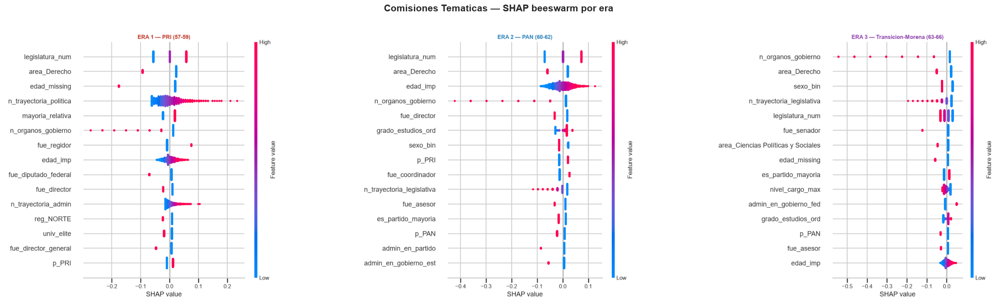

In [57]:
imgs_tem = {era: shap_beeswarm_to_img(
                *shap_tem[era], top_n=15,
                title=ERA_LABELS[era], color=ERA_COLORS[era])
            for era in ERA_ORDER}

fig, axes = plt.subplots(1, 3, figsize=(24, 7))
for ax, era in zip(axes.flatten(), ERA_ORDER):
    ax.imshow(imgs_tem[era])
    ax.axis("off")

plt.suptitle("Comisiones Tematicas — SHAP beeswarm por era",
             fontsize=15, fontweight="bold")
plt.tight_layout()
plt.savefig(REPORT_DIR / "shap_tematicas_beeswarm.png", bbox_inches="tight", dpi=120)
plt.show()

**Interpretación — SHAP Beeswarm Temáticas (grid 1×3 por época)**

A diferencia del beeswarm de nodales, aquí la dispersión de puntos es más uniforme y sin predictores dominantes claros en ninguna época: ninguna variable supera `|SHAP| = 0.05` (los mayores son `legislatura_num`, 0.036 medio, y `area_Derecho`, 0.033). Esta ausencia de estructura SHAP es coherente con el bajo poder predictivo del modelo (mejora ≤5.3% sobre el baseline de predecir siempre la media, y 0% en ERA_3). El número de comisiones temáticas responde a lógicas distributivas internas — cuotas de bancada, disponibilidad de cupos, acuerdos de coalición — que no quedan registradas en el perfil biográfico.

## 7.1 Resultados por era — MAE

In [58]:
display(pd.DataFrame(rows_tem))

,Era,n,Poisson GLM
0,ERA 1 — PRI (57-59),1500,0.810+-0.054
1,ERA 2 — PAN (60-62),1500,0.788+-0.028
2,ERA 3 — Transicion-Morena (63-66),2000,0.842+-0.036


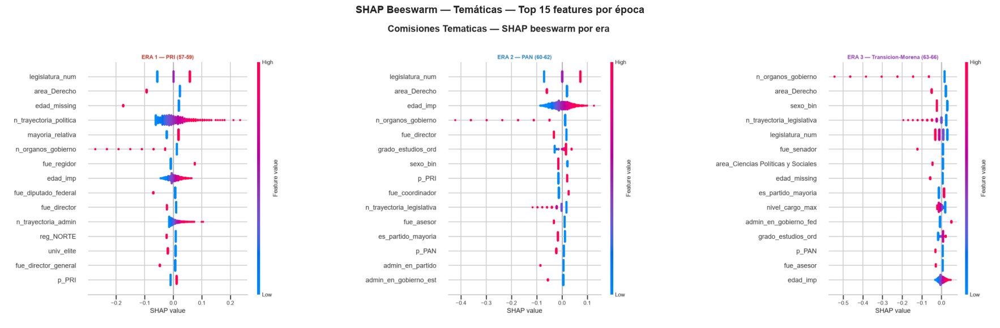

In [59]:
show_img("shap_tematicas_beeswarm.png",
         "SHAP Beeswarm — Temáticas — Top 15 features por época",
         figsize=(18, 13))

## 7.2 Interpretación — Comisiones Temáticas

Las **comisiones temáticas** son esencialmente impredecibles desde el perfil biográfico.

La mejora sobre el baseline —predecir siempre la media de la era— es mínima:

| Era | MAE GLM Poisson | Baseline (media) | Mejora |
|---|---:|---:|---:|
| ERA_1 — PRI | 0.810 | 0.855 | 5.3 % |
| ERA_2 — PAN | 0.788 | 0.791 | 0.4 % |
| ERA_3 — Transición-Morena | 0.842 | 0.842 | 0.0 % |

En ERA_3 el modelo empata exactamente con el baseline: el perfil biográfico no aporta **nada** a la predicción del conteo en el tramo reciente.

### Modelo

El modelo utilizado es un **GLM Poisson**, implementado mediante `PoissonRegressor` con regularización L2. Para las comisiones temáticas **no se aplica SelectFromModel**, ya que el objetivo es contar, no clasificar. Los valores SHAP se calculan con `LinearExplainer` en espacio de **log-conteo** (predictor lineal del GLM con enlace log).

---

### Interpretación política

El número de comisiones temáticas que recibe un diputado depende principalmente de factores no observables directamente en el currículum: negociaciones internas de bancada, disponibilidad de cupos por comisión, preferencias del coordinador parlamentario y acuerdos de coalición legislativa.

---

### Hallazgo principal

La diferencia entre épocas en la media de comisiones temáticas —de **1.53 en ERA_1** a **2.08 en ERA_3**— no se traduce en mayor predictibilidad. La expansión del volumen de temáticas sigue criterios distributivos distintos según la época, pero estos permanecen opacos para el observador externo. El beeswarm SHAP confirma la ausencia de predictores dominantes. Este resultado replica, con la segmentación S3, la insensibilidad de este target ya documentada en `diputraxv12` (MAE plano entre los seis esquemas de agrupación evaluados).

# 8. Análisis Comparativo entre Eras
## 8.0 Comparativa Global - Frecuentista (LR L1) vs. Bayesiano (NUTS)

Sintesis de ambos paradigmas para los dos targets binarios (nodal y lastre) x tres eras.

- Delta AUC = AUC Bayesiano - AUC LR L1 full: diferencia de desempeno predictivo.
- % Concordancia de direccion: fraccion de features SFM donde ambos modelos coinciden en el signo.
- n_signif Bayesiano: features con HDI 94% que excluyen cero.

Delta AUC ~ 0 y concordancia >= 85% indica conclusiones robustas al paradigma estadistico.

-- Tabla Global: LR L1 vs. Bayesiano --


,Era,Target,AUC LR full,AUC Bayes,Delta AUC,% Dir Conc,n signif B,n feat SFM
0,ERA 1 — PRI (57-59),Nodal,0.729,0.765,0.036,100.000,15,22
1,ERA 1 — PRI (57-59),Lastre,0.586,0.645,0.059,100.000,12,20
2,ERA 2 — PAN (60-62),Nodal,0.721,0.746,0.025,100.000,11,21
3,ERA 2 — PAN (60-62),Lastre,0.639,0.693,0.054,100.000,18,25
4,ERA 3 — Transicion-Morena (63-66),Nodal,0.690,0.725,0.035,100.000,18,24
5,ERA 3 — Transicion-Morena (63-66),Lastre,0.610,0.579,-0.031,64.000,4,25


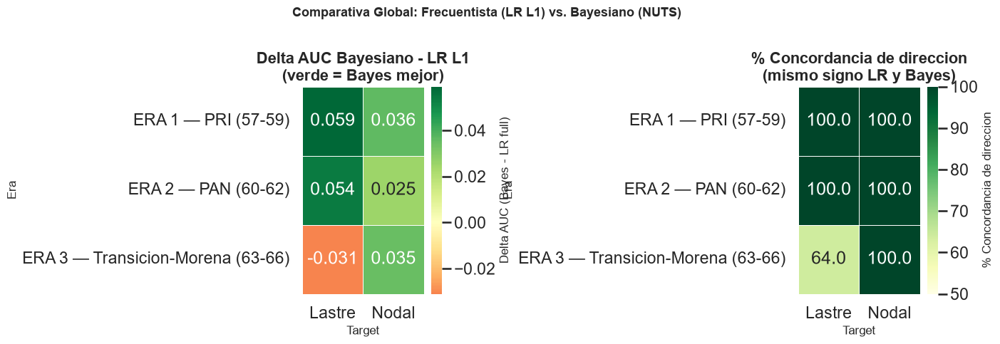


-- Diagnosticos de convergencia MCMC --


,Era,Target,R-hat max,ESS min,Converge
0,ERA 1 — PRI (57-59),Nodal,1.000,2667,OK
1,ERA 1 — PRI (57-59),Lastre,1.000,5105,OK
2,ERA 2 — PAN (60-62),Nodal,1.000,4744,OK
3,ERA 2 — PAN (60-62),Lastre,1.000,5553,OK
4,ERA 3 — Transicion-Morena (63-66),Nodal,1.000,6227,OK
5,ERA 3 — Transicion-Morena (63-66),Lastre,1.530,7,REVISAR


In [60]:
# -- 1. Tabla global --
rows_g = []
for era in ERA_ORDER:
    el = ERA_LABELS[era]
    for tl, df_cv, bayes_auc_d, sfm_d, bayes_summ, lr_m in [
        ('Nodal',  df_nodal_cv,  bayes_nodal_auc,  sfm_selected_nodal,  bayes_nodal_summary,  models_nodal),
        ('Lastre', df_lastre_cv, bayes_lastre_auc, sfm_selected_lastre, bayes_lastre_summary, models_lastre),
    ]:
        auc_lrf = _parse_auc(df_cv, el, 'LR L1 (full)')
        auc_b   = bayes_auc_d.get(era, float('nan'))
        feats   = sfm_d.get(era, [])
        if feats and era in bayes_summ:
            lr_c    = lr_m[era].named_steps['lr'].coef_[0]
            ag      = agreement_df(lr_c, feats, bayes_summ[era])
            pct_dir = round(ag['dir_agree'].mean() * 100, 1)
            n_sig   = int(bayes_summ[era]['signif_94'].sum())
        else:
            pct_dir, n_sig = float('nan'), 0
        rows_g.append({
            'Era': el, 'Target': tl,
            'AUC LR full': round(auc_lrf, 3),
            'AUC Bayes'  : round(auc_b, 3) if not pd.isna(auc_b) else None,
            'Delta AUC'  : round(auc_b - auc_lrf, 3) if not pd.isna(auc_b) else None,
            '% Dir Conc' : pct_dir,
            'n signif B' : n_sig,
            'n feat SFM' : len(feats),
        })

df_global = pd.DataFrame(rows_g)
print('-- Tabla Global: LR L1 vs. Bayesiano --')
display(df_global)

# -- 2. Heatmaps --
era_order_labels = [ERA_LABELS[e] for e in ERA_ORDER]
pivot_auc = (df_global.pivot(index='Era', columns='Target', values='Delta AUC')
             .apply(pd.to_numeric, errors='coerce')
             .reindex(era_order_labels))
pivot_dir = (df_global.pivot(index='Era', columns='Target', values='% Dir Conc')
             .apply(pd.to_numeric, errors='coerce')
             .reindex(era_order_labels))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.heatmap(pivot_auc, annot=True, fmt='.3f', center=0,
            cmap='RdYlGn', ax=axes[0], linewidths=0.5,
            cbar_kws={'label': 'Delta AUC (Bayes - LR full)'})
axes[0].set_title('Delta AUC Bayesiano - LR L1\n(verde = Bayes mejor)', fontweight='bold')

sns.heatmap(pivot_dir, annot=True, fmt='.1f', vmin=50, vmax=100,
            cmap='YlGn', ax=axes[1], linewidths=0.5,
            cbar_kws={'label': '% Concordancia de direccion'})
axes[1].set_title('% Concordancia de direccion\n(mismo signo LR y Bayes)', fontweight='bold')

plt.suptitle('Comparativa Global: Frecuentista (LR L1) vs. Bayesiano (NUTS)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(REPORT_DIR / 'global_lr_vs_bayes.png', bbox_inches='tight', dpi=120)
plt.show()

# -- 3. Convergencia consolidada --
rows_conv = []
for era in ERA_ORDER:
    el = ERA_LABELS[era]
    for tl, idata_d, sfm_d in [
        ('Nodal',  bayes_nodal_idata,  sfm_selected_nodal),
        ('Lastre', bayes_lastre_idata, sfm_selected_lastre),
    ]:
        if era not in idata_d: continue
        s = az.summary(idata_d[era], var_names=['beta'])
        rows_conv.append({
            'Era': el, 'Target': tl,
            'R-hat max': round(float(s['r_hat'].max()), 3),
            'ESS min'  : int(s['ess_bulk'].min()),
            'Converge' : 'OK' if float(s['r_hat'].max()) < 1.05 and int(s['ess_bulk'].min()) > 400 else 'REVISAR',
        })
print('\n-- Diagnosticos de convergencia MCMC --')
display(pd.DataFrame(rows_conv))

**Interpretacion - Comparativa Global LR L1 vs. Bayesiano**

**Delta AUC observado:** nodal ERA_1=+0.036, ERA_2=+0.025, ERA_3=+0.035; lastre ERA_1=+0.059, ERA_2=+0.054, ERA_3=−0.031. Los cinco primeros son positivos y homogéneos — consistencia entre paradigmas, con la parte esperable de ajuste in-sample. El delta negativo de lastre ERA_3 no es un resultado sustantivo sino el sintoma del **fallo de convergencia** de ese muestreo (ver abajo).

**Concordancia de direccion = 100%** en cinco de las seis combinaciones era×target (nodal: 22/22, 21/21, 24/24; lastre: 20/20, 25/25). Para nodales ERA_1, el Bayesiano confirma el ranking de A&L (2009): la experiencia burocratico-juridica domina con betas positivos y HDI que excluyen cero. La excepcion es lastre ERA_3 (64%), invalida por convergencia.

**Convergencia MCMC:** OK en 5 de 6 combinaciones (R-hat=1.000, ESS_min entre 2667 y 6227). **Lastre ERA_3: REVISAR** — 1,500 divergencias, R-hat=1.530, ESS_min=7; sus cifras bayesianas (AUC 0.579, 4 significativos, 64% concordancia) no son evidencia valida y quedan documentadas solo por transparencia (§6.5).

**Mensaje metodologico para la tesina:** La consistencia entre paradigmas frecuentista y bayesiano — alli donde el muestreo converge — fortalece la validez interna. El Bayesiano aporta cuantificacion explicita de incertidumbre (HDI) que el LR L1 no ofrece directamente. El caso de lastre ERA_3 ilustra la disciplina inversa: cuando los diagnosticos fallan, el resultado bayesiano se descarta en vez de leerse selectivamente.

## 8.0b Comparativa de variantes de Regresión Logística (L2 v4 vs. L1 full vs. L1+SFM)

La tesina ha iterado sobre tres especificaciones de Regresión Logística para los targets binarios (`nodal_bin`, `lastre_bin`):

- **LR L2 (v4):** especificación original de la v4 del proyecto — `LogisticRegression(C=0.1, max_iter=3000, class_weight="balanced", random_state=42)` con penalización L2 (default de scikit-learn), envuelta en un Pipeline con StandardScaler y evaluada con AUC en validación cruzada estratificada de 5 folds (cv_auc, semilla 42). No realiza selección de variables — usa el conjunto completo FEAT_COLS.
- **LR L1 (full):** misma estructura de pipeline (StandardScaler + LogisticRegression), pero con penalización L1 (penalty="l1", solver="liblinear", C=0.1, class_weight="balanced", random_state=42) sobre el conjunto completo de variables — introducida en v8 para favorecer interpretabilidad vía esparsidad.
- **LR L1 + SFM:** pipeline `StandardScaler` → `SelectFromModel(LR L1, threshold="mean")` → `LogisticRegression` (mismos hiperparámetros L1), que reduce el espacio de variables a las de mayor peso antes de reajustar el modelo final.

Las tres comparten semilla (`random_state=42`), esquema de validación cruzada (`StratifiedKFold` k=5, `roc_auc`) y conjunto de datos por era, por lo que la comparación aísla el efecto de la regularización (L2 vs. L1) y de la selección de variables (full vs. SFM) sobre el desempeño predictivo.

-- Comparativa de variantes de Regresion Logistica (AUC, 5-fold CV) --


n    LR L2 (v4)  LR L1 (full)  \
Target Era                                                                   
Nodal  ERA 1 — PRI (57-59)                1500  0.720+-0.030  0.729+-0.030   
       ERA 2 — PAN (60-62)                1500  0.720+-0.024  0.721+-0.028   
       ERA 3 — Transicion-Morena (63-66)  2000  0.690+-0.013  0.690+-0.014   
Lastre ERA 1 — PRI (57-59)                1500  0.591+-0.011  0.586+-0.012   
       ERA 2 — PAN (60-62)                1500  0.642+-0.029  0.639+-0.031   
       ERA 3 — Transicion-Morena (63-66)  2000  0.600+-0.024  0.610+-0.023   

                                           LR L1 + SFM Mejor variante  \
Target Era                                                              
Nodal  ERA 1 — PRI (57-59)                0.727+-0.030   LR L1 (full)   
       ERA 2 — PAN (60-62)                0.719+-0.031   LR L1 (full)   
       ERA 3 — Transicion-Morena (63-66)  0.685+-0.016     LR L2 (v4)   
Lastre ERA 1 — PRI (57-59)                0.584+-0.015     LR L2 (v4)   
       ERA 2 — PAN (60-62)                0.635+-0.032     LR L2 (v4)   
       ERA 3 — Transicion-Morena (63-66)  0.610+-0.020   LR L1 (full)   

                                          Delta L1-L2  Delta SFM-L2  
Target Era                                                           
Nodal  ERA 1 — PRI (57-59)                      0.009         0.007  
       ERA 2 — PAN (60-62)                      0.001        -0.001  
       ERA 3 — Transicion-Morena (63-66)        0.000        -0.005  
Lastre ERA 1 — PRI (57-59)                     -0.005        -0.007  
       ERA 2 — PAN (60-62)                     -0.003        -0.007  
       ERA 3 — Transicion-Morena (63-66)        0.010         0.010

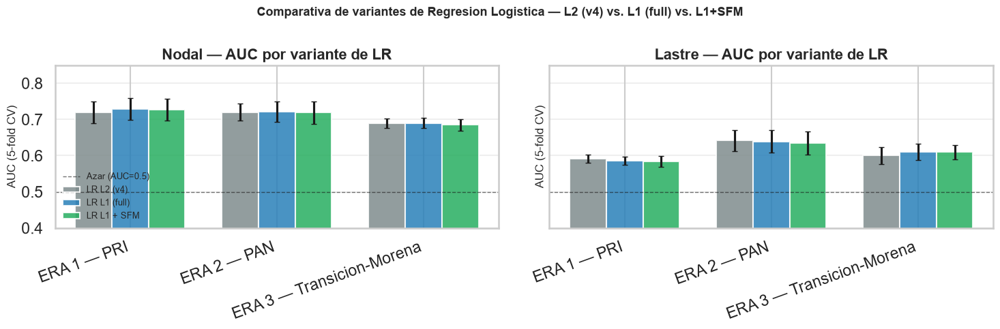

-- Variante con mejor AUC promedio por target --


,AUC medio L2 (v4),AUC medio L1 (full),AUC medio L1+SFM,Mejor variante (mas frecuente)
Target,,,,
Lastre,0.611,0.612,0.610,LR L2 (v4)
Nodal,0.710,0.713,0.710,LR L1 (full)


In [61]:
# Comparativa de variantes de Regresion Logistica — L2 (v4) vs. L1 (full) vs. L1+SFM
def _split_auc(cell):
    mu, sd = str(cell).split('+-')
    return float(mu), float(sd)

rows_lr_variants = []
for target_label, df_cv in [('Nodal', df_nodal_cv), ('Lastre', df_lastre_cv)]:
    for _, row in df_cv.iterrows():
        v4_mu,  v4_sd  = _split_auc(row['LR L2 (v4)'])
        l1_mu,  l1_sd  = _split_auc(row['LR L1 (full)'])
        sfm_mu, sfm_sd = _split_auc(row['LR L1 + SFM'])
        rows_lr_variants.append({
            'Target': target_label, 'Era': row['Era'], 'n': row['n'],
            'LR L2 (v4)':   row['LR L2 (v4)'],
            'LR L1 (full)': row['LR L1 (full)'],
            'LR L1 + SFM':  row['LR L1 + SFM'],
            'Mejor variante': max(
                [('LR L2 (v4)', v4_mu), ('LR L1 (full)', l1_mu), ('LR L1 + SFM', sfm_mu)],
                key=lambda kv: kv[1]
            )[0],
            'Delta L1-L2': round(l1_mu - v4_mu, 3),
            'Delta SFM-L2': round(sfm_mu - v4_mu, 3),
        })

df_lr_variants = pd.DataFrame(rows_lr_variants)
print('-- Comparativa de variantes de Regresion Logistica (AUC, 5-fold CV) --')
display(df_lr_variants.set_index(['Target', 'Era']))

# -- Grafico de barras agrupadas por target --
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)
era_lbls = [ERA_LABELS[e] for e in ERA_ORDER]
variant_cols = ['LR L2 (v4)', 'LR L1 (full)', 'LR L1 + SFM']
variant_colors = ['#7f8c8d', '#2980b9', '#27ae60']

for ax, target_label in zip(axes, ['Nodal', 'Lastre']):
    sub = df_lr_variants[df_lr_variants['Target'] == target_label].set_index('Era').reindex(era_lbls)
    x = np.arange(len(era_lbls))
    width = 0.25
    for i, (col, color) in enumerate(zip(variant_cols, variant_colors)):
        means = [_split_auc(v)[0] for v in sub[col]]
        stds  = [_split_auc(v)[1] for v in sub[col]]
        ax.bar(x + (i - 1) * width, means, width, yerr=stds, capsize=3,
               label=col, color=color, alpha=0.85, edgecolor='white')
    ax.axhline(0.5, color='k', ls='--', lw=1, alpha=0.6, label='Azar (AUC=0.5)')
    ax.set_xticks(x)
    ax.set_xticklabels([e.split('(')[0].strip() for e in era_lbls], rotation=20, ha='right')
    ax.set_title(f'{target_label} — AUC por variante de LR', fontweight='bold')
    ax.set_ylabel('AUC (5-fold CV)')
    ax.set_ylim(0.4, 0.85)
    ax.grid(axis='y', alpha=0.3)

axes[0].legend(fontsize=9)
plt.suptitle('Comparativa de variantes de Regresion Logistica — L2 (v4) vs. L1 (full) vs. L1+SFM',
             fontsize=13, fontweight='bold')
plt.tight_layout()
fig.savefig(REPORT_DIR / 'lr_variantes_comparativa.png', bbox_inches='tight', dpi=120)
plt.show()

# -- Resumen de variante ganadora por target --
print("-- Variante con mejor AUC promedio por target --")
display(
    df_lr_variants.groupby('Target')
    .apply(lambda g: pd.Series({
        'AUC medio L2 (v4)':   round(np.mean([_split_auc(v)[0] for v in g['LR L2 (v4)']]), 3),
        'AUC medio L1 (full)': round(np.mean([_split_auc(v)[0] for v in g['LR L1 (full)']]), 3),
        'AUC medio L1+SFM':    round(np.mean([_split_auc(v)[0] for v in g['LR L1 + SFM']]), 3),
        'Mejor variante (mas frecuente)': g['Mejor variante'].mode().iat[0],
    }), include_groups=False)
)

**Interpretación — Comparativa de variantes de Regresión Logística**

Las tres especificaciones parten del mismo pipeline (`StandardScaler` + `LogisticRegression`, `class_weight="balanced"`, `C=0.1`, semilla 42) y difieren únicamente en el tipo de penalización (L2 vs. L1) y en si se aplica selección de variables (`SelectFromModel`).

- **L2 (v4) vs. L1 (full):** los deltas por era van de −0.005 a +0.010 — la elección de penalización es predictivamente neutra. En promedio: nodal 0.710 (L2) vs. 0.713 (L1); lastre 0.611 vs. 0.612. La ventaja de L1 es de interpretabilidad (esparsidad de coeficientes), no de poder predictivo.
- **L1+SFM vs. L2 (v4):** los deltas también son ≤|0.010|; la reducción del espacio de variables (a 20–25 features activos de 62) no perjudica el desempeño — el modelo se sostiene sobre un subconjunto compacto de predictores robustos, consistente con los hallazgos SHAP de las secciones 5 y 6.
- **Lectura metodológica:** la "mejor variante" alterna por era y target sin patrón material (L1 full domina levemente en nodales, L2 en lastre), confirmando que la migración hacia L1 —adoptada por su valor interpretativo— no implicó costo en AUC. La comparativa documenta además la trayectoria del proyecto (L2 fue la especificación de la v4).

## 8.1 Importancias SHAP consolidadas (Nodales / Lastre / Temáticas × Eras)

In [62]:
def imp_table(shap_dict, top_n=20):
    rows = {era: pd.Series(np.abs(sv).mean(axis=0), index=FEAT_COLS)
            for era, (sv, _) in shap_dict.items()}
    df = pd.DataFrame(rows).rename(columns=ERA_LABELS)
    df["MEDIA"] = df.mean(axis=1)
    return df.sort_values("MEDIA", ascending=False).head(top_n).round(4)

print("=== NODALES ===")
display(imp_table(shap_nodal))

print("\n=== LASTRE ===")
display(imp_table(shap_lastre))

print("\n=== TEMATICAS ===")
display(imp_table(shap_tem))

=== NODALES ===


,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66),MEDIA
area_Derecho,0.336,0.340,0.268,0.315
fue_secretario_cargo,0.175,0.070,0.105,0.117
n_trayectoria_legislativa,0.083,0.039,0.224,0.115
edad_imp,0.000,0.224,0.108,0.111
univ_publica,0.093,0.098,0.121,0.104
sexo_bin,0.000,0.123,0.181,0.102
tiene_posgrado,0.000,0.166,0.119,0.095
area_Ciencias Políticas y Sociales,0.058,0.062,0.127,0.083
univ_privada,0.160,0.080,0.000,0.080
mayoria_relativa,0.103,0.136,0.000,0.080



=== LASTRE ===


,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66),MEDIA
edad_imp,0.133,0.151,0.105,0.130
legislatura_num,0.127,0.124,0.057,0.103
n_organos_gobierno,0.038,0.144,0.061,0.081
n_trayectoria_admin,0.066,0.173,0.000,0.080
sexo_bin,0.083,0.108,0.042,0.078
reg_SUR,0.080,0.074,0.058,0.071
p_PAN,0.091,0.083,0.000,0.058
fue_diputado_federal,0.000,0.106,0.067,0.058
reg_NORTE,0.118,0.000,0.052,0.057
nivel_cargo_max,0.147,0.000,0.000,0.049



=== TEMATICAS ===


,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66),MEDIA
legislatura_num,0.038,0.049,0.020,0.036
area_Derecho,0.038,0.030,0.029,0.033
n_organos_gobierno,0.019,0.024,0.030,0.024
edad_missing,0.036,0.009,0.014,0.019
edad_imp,0.014,0.027,0.010,0.017
n_trayectoria_legislativa,0.007,0.015,0.022,0.015
sexo_bin,0.001,0.017,0.026,0.015
n_trayectoria_politica,0.033,0.004,0.005,0.014
mayoria_relativa,0.020,0.010,0.010,0.013
fue_director,0.014,0.023,0.001,0.012


**Interpretación — Tabla consolidada de importancias SHAP**

**Nodales / Lastre / Temáticas × Épocas**

La tabla normaliza la importancia media (`|SHAP|`) de los principales features para los tres targets y las tres eras. Clasificación binaria en espacio de **log-odds**; temáticas en **log-conteo**.

---

**Nodales — Hallazgos estructurales**

- **`area_Derecho`** (0.336 / 0.340 / 0.268; media 0.315): el feature con mayor importancia media de toda la tabla. Lidera en las tres eras; su señal no decae, aunque la ventaja se estrecha en ERA_3.
- **`fue_secretario_cargo`** (0.175 / 0.070 / 0.105; media 0.117): pico en ERA_1 — la credencial ejecutiva fue más valorada bajo el PRI que bajo el PAN.
- **`n_trayectoria_legislativa`** (0.083 / 0.039 / 0.224; media 0.115): pico histórico en ERA_3; escala con la reelección consecutiva y parlamentariza el perfil reciente.
- **`edad_imp`** (0.000 / 0.224 / 0.108; media 0.111): pico en ERA_2; caveat MNAR (§2.2.1b).
- **`sexo_bin`** (0.000 / 0.123 / 0.181; media 0.102): señal robusta desde ERA_2, máximo en ERA_3 — diferenciación de género en la asignación de comisiones de poder.
- **`p_MORENA`** (0.000 / 0.000 / 0.199; media 0.066): variable partidista activa solo en ERA_3; no confundir con `es_partido_mayoria`, que el L1 elimina en toda la serie.

---

**Lastre — Hallazgos estructurales**

- **`edad_imp`** (0.133 / 0.151 / 0.105; media 0.130): el predictor de mayor magnitud media en lastre, activo en las tres eras.
- **`legislatura_num`** (0.127 / 0.124 / 0.057; media 0.103): el momento del ciclo importa para la asignación marginal.
- **`n_trayectoria_admin`** (0.066 / 0.173 / 0.000; media 0.080): relevante en ERA_2 para lastre pero ausente del top nodal — señal específica del mecanismo marginal panista.
- **`univ_privada`** (0.000 / 0.000 / 0.116) y **`n_trayectoria_legislativa`** (0.000 / 0.000 / 0.126): emergen en ERA_3 — el lastre reciente marca a la oposición veterana con formación privada.

---

**Temáticas**

Todas las magnitudes SHAP son menores a `0.05`. Los mayores promedios son `legislatura_num` (0.036) y `area_Derecho` (0.033). La ausencia de predictores dominantes confirma que las comisiones temáticas responden a lógicas distributivas no capturadas por el perfil biográfico.

## 8.2 Validación Temporal — Rolling Forward

**Método:** entrenar en ERA k, predecir ERA k+1. Si el AUC cae significativamente → el perfil de reclutamiento cambió entre épocas.

Esto es cualitativamente distinto al 5-fold CV: aquí se prueba la **transferencia temporal** del modelo, no solo su ajuste dentro de una era.

In [63]:
def rolling_forward(target, is_binary=True):
    from sklearn.metrics import roc_auc_score, mean_absolute_error
    results = []
    for train_era, test_era in zip(ERA_ORDER[:-1], ERA_ORDER[1:]):
        X_tr, y_tr = get_Xy(train_era, target)
        X_te, y_te = get_Xy(test_era,  target)

        if is_binary:
            m = lr_l1_sfm()
            m.fit(X_tr, y_tr)
            prob  = m.predict_proba(X_te)[:, 1]
            score = roc_auc_score(y_te, prob)
            metric = "AUC"
        else:
            m = lr_poisson()
            m.fit(X_tr, y_tr)
            score  = mean_absolute_error(y_te, m.predict(X_te))
            metric = "MAE"

        results.append({
            "Transicion": f"{ERA_LABELS[train_era].split('(')[0].strip()} -> {ERA_LABELS[test_era].split('(')[0].strip()}",
            metric: round(score, 3),
        })
    return pd.DataFrame(results)

df_roll_n = rolling_forward("nodal_bin",              is_binary=True)
df_roll_l = rolling_forward("lastre_bin",             is_binary=True)
df_roll_t = rolling_forward("n_comisiones_tematicas", is_binary=False)

print("Nodales:");   display(df_roll_n)
print("Lastre:");    display(df_roll_l)
print("Tematicas:"); display(df_roll_t)

Nodales:


,Transicion,AUC
0,ERA 1 — PRI -> ERA 2 — PAN,0.706
1,ERA 2 — PAN -> ERA 3 — Transicion-Morena,0.665


Lastre:


,Transicion,AUC
0,ERA 1 — PRI -> ERA 2 — PAN,0.633
1,ERA 2 — PAN -> ERA 3 — Transicion-Morena,0.575


Tematicas:


,Transicion,MAE
0,ERA 1 — PRI -> ERA 2 — PAN,0.808
1,ERA 2 — PAN -> ERA 3 — Transicion-Morena,1.008


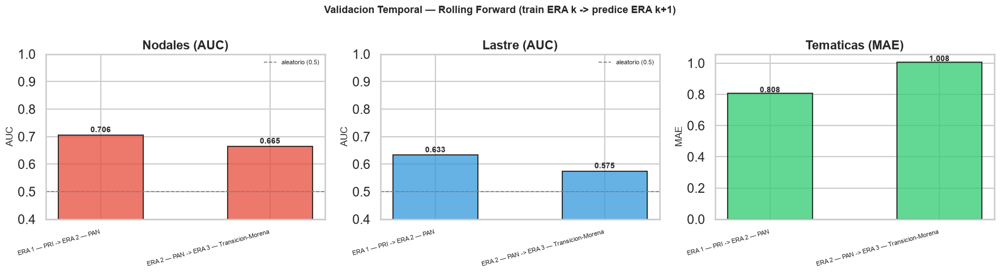

In [64]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
specs = [
    (df_roll_n, "Nodales (AUC)",    "#e74c3c", "AUC",  (0.4, 1.0), 0.5),
    (df_roll_l, "Lastre (AUC)",     "#3498db", "AUC",  (0.4, 1.0), 0.5),
    (df_roll_t, "Tematicas (MAE)", "#2ecc71", "MAE",  None,        None),
]

for ax, (df_r, title, color, metric, ylim, hline) in zip(axes, specs):
    xs    = df_r["Transicion"].values
    vals  = df_r[metric].values
    bars  = ax.bar(xs, vals, color=color, alpha=0.75, edgecolor="black", width=0.5)
    ax.set_title(title, fontweight="bold")
    ax.set_ylabel(metric)
    if ylim:
        ax.set_ylim(*ylim)
    if hline is not None:
        ax.axhline(hline, ls="--", color="gray", lw=1.2, label=f"aleatorio ({hline})")
        ax.legend(fontsize=8)
    for j, v in enumerate(vals):
        ax.text(j, v + (0.01 if metric=="AUC" else 0.005),
                f"{v:.3f}", ha="center", fontsize=10, fontweight="bold")
    ax.tick_params(axis="x", labelsize=8)
    ax.set_xticks(range(len(xs)))
    ax.set_xticklabels(xs, rotation=15, ha="right")

plt.suptitle("Validacion Temporal — Rolling Forward (train ERA k -> predice ERA k+1)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig(REPORT_DIR / "rolling_validation.png", bbox_inches="tight", dpi=120)
plt.show()

In [65]:
df_roll = (df_roll_n.rename(columns={"AUC": "Nodales AUC"})
           .merge(df_roll_l.rename(columns={"AUC": "Lastre AUC"}), on="Transicion")
           .merge(df_roll_t.rename(columns={"MAE": "Temáticas MAE"}), on="Transicion")
           .rename(columns={"Transicion": "Transición"}))
display(df_roll.set_index("Transición"))

,Nodales AUC,Lastre AUC,Temáticas MAE
Transición,,,
ERA 1 — PRI -> ERA 2 — PAN,0.706,0.633,0.808
ERA 2 — PAN -> ERA 3 — Transicion-Morena,0.665,0.575,1.008


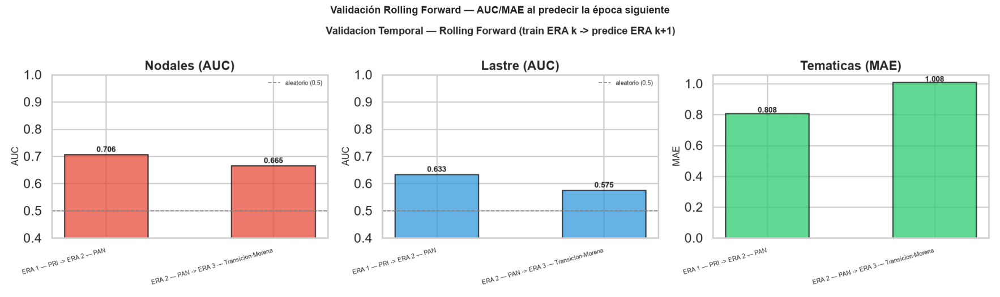

In [66]:
show_img("rolling_validation.png",
         "Validación Rolling Forward — AUC/MAE al predecir la época siguiente",
         figsize=(18, 6))

## 8.3 Interpretación — Validación Temporal

**Modelo:** LR L1 + SFM entrenado en `ERA_k` y aplicado a `ERA_k+1`. Con tres eras, la serie tiene dos transiciones.

| Transición | Nodales AUC | Lastre AUC | Temáticas MAE | Lectura nodales |
|---|---:|---:|---:|---|
| `ERA_1 → ERA_2` | 0.706 | 0.633 | 0.808 | Transferencia sólida: PRI y PAN comparten lógica nodal |
| `ERA_2 → ERA_3` | 0.665 | 0.575 | 1.008 | Caída notable: la frontera de 2015 rompe el perfil PAN |

`ERA_2 → ERA_3` es la transición más disruptiva en los tres targets. El modelo panista pierde 0.041 puntos de AUC nodal al cruzar 2015 (0.706 → 0.665), y queda 0.020 por debajo del AUC dentro-de-era del propio grupo receptor (0.685): el perfil aprendido en el bipartidismo transfiere solo parcialmente al ciclo Transición-Morena.

**Lastre**

El AUC rolling cae de 0.633 a 0.575 en la segunda transición — el mecanismo de lastre, ya ruidoso dentro de era, es aún menos estable entre eras.

**Temáticas**

El MAE de `ERA_2 → ERA_3` es 1.008, muy por encima del baseline de ERA_3 (0.842, predecir la media): el modelo entrenado en la era PAN **degrada** activamente la predicción del conteo en el tramo reciente. Es la señal de ruptura más nítida de los tres targets, aunque sobre un target sin señal dentro de era.

---

**Nota metodológica**

La divergencia en los features seleccionados entre `ERA_k` y `ERA_k+1` constituye evidencia adicional de ruptura de perfil entre eras. La transición E3→E4 de v10 (AUC 0.712) ya no existe como tal en esta segmentación: la frontera de 2024 queda dentro del grupo fusionado — decisión respaldada por la evaluación de segmentaciones de `diputraxv12`.

# 9. Perfiles Prototípicos por Era

El prototipo es el diputado con mayor SHAP positivo acumulado en el modelo **LR L1 + SelectFromModel** de cada era. Esto es, el individuo cuyo perfil maximiza el log-odds de asignación a comisión nodal. Los perfiles prototípicos capturan el extremo favorable de la distribución SHAP, no el diputado promedio.

In [67]:
DISPLAY_FEATS = [
    "es_partido_mayoria", "fue_diputado_federal",
    "fue_secretario_cargo", "n_trayectoria_admin",
    "n_trayectoria_politica", "grado_estudios_ord",
    "tiene_posgrado", "univ_elite",
    "sexo_bin", "edad_imp",
    "mayoria_relativa", "fue_senador", "nivel_cargo_max",
]

profiles = {}
for era in ERA_ORDER:
    sv, X = shap_nodal[era]
    best  = int(np.argmax(sv.sum(axis=1)))
    profiles[ERA_LABELS[era]] = X.iloc[best][DISPLAY_FEATS]

df_profiles = pd.DataFrame(profiles).T
print("Perfiles prototipicos — 1 diputado por era con mayor SHAP acumulado (Nodales):")
df_profiles

Perfiles prototipicos — 1 diputado por era con mayor SHAP acumulado (Nodales):


,es_partido_mayoria,fue_diputado_federal,fue_secretario_cargo,n_trayectoria_admin,n_trayectoria_politica,grado_estudios_ord,tiene_posgrado,univ_elite,sexo_bin,edad_imp,mayoria_relativa,fue_senador,nivel_cargo_max
ERA 1 — PRI (57-59),1.000,0.000,1.000,14.000,13.000,6.000,0.000,1.000,1.000,52.000,0.000,0.000,4.000
ERA 2 — PAN (60-62),1.000,1.000,1.000,8.000,7.000,6.000,1.000,1.000,1.000,52.000,1.000,0.000,4.000
ERA 3 — Transicion-Morena (63-66),1.000,1.000,0.000,4.000,6.000,6.000,1.000,0.000,0.000,58.000,1.000,0.000,3.000


**Interpretacion -- Tabla de perfiles prototipicos por epoca**

El prototipo es el diputado con mayor SHAP positivo acumulado en el modelo LR L1 + SFM de cada era. Lectura de la tabla (valores reales en la salida anterior):

- **ERA_1 (PRI):** hombre del partido mayoritario, con experiencia previa de secretaria (`fue_secretario_cargo`=Sí) y la trayectoria administrativa mas alta de la serie (14) junto con trayectoria politica alta (13). Sin mandato federal previo -- el ascenso se construyo dentro del aparato ejecutivo-partidista, no en el Congreso. Licenciatura, sin posgrado, universidad de elite. Edad 52.
- **ERA_2 (PAN):** hombre del partido mayoritario, tambien con secretaria previa, pero con perfil mas comedido en trayectoria administrativa (8) y politica (7); compensa con posgrado y un mandato federal previo. Electo por mayoria relativa. Edad 52.
- **ERA_3 (Transicion-Morena):** ruptura clara respecto a las dos eras previas -- **es mujer**, la primera de la serie, y **no** tiene experiencia de secretaria. Exhibe mandato federal previo, posgrado, la trayectoria administrativa (4) y politica (6) mas bajas de la serie, sin universidad de elite, electa por mayoria relativa, edad 58 (la mayor de la serie). La carrera parlamentaria y la formacion de posgrado reemplazan al cargo ejecutivo y a la militancia acumulada como ejes del perfil.

**Constante y ruptura transversal:** los tres prototipos pertenecen al partido mayoritario (`es_partido_mayoria`=Sí) -- esa constante sobrevive a los cambios de regimen. La constante de genero de v10 (cuatro prototipos hombres), en cambio, **se rompe**: el prototipo del tramo 2015-presente es una mujer, coherente con la paridad constitucional. El matiz importa: a nivel poblacional `sexo_bin` sigue siendo una señal *pro-hombre* activa en ERA_3 (|SHAP|=0.181, §5.2) -- el extremo individual favorable y la tendencia poblacional no coinciden, y no deben confundirse (ver §9.2).

Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 1500 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=1500 when initializing the masker.


Background dataset has 2000 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=2000 when initializing the masker.


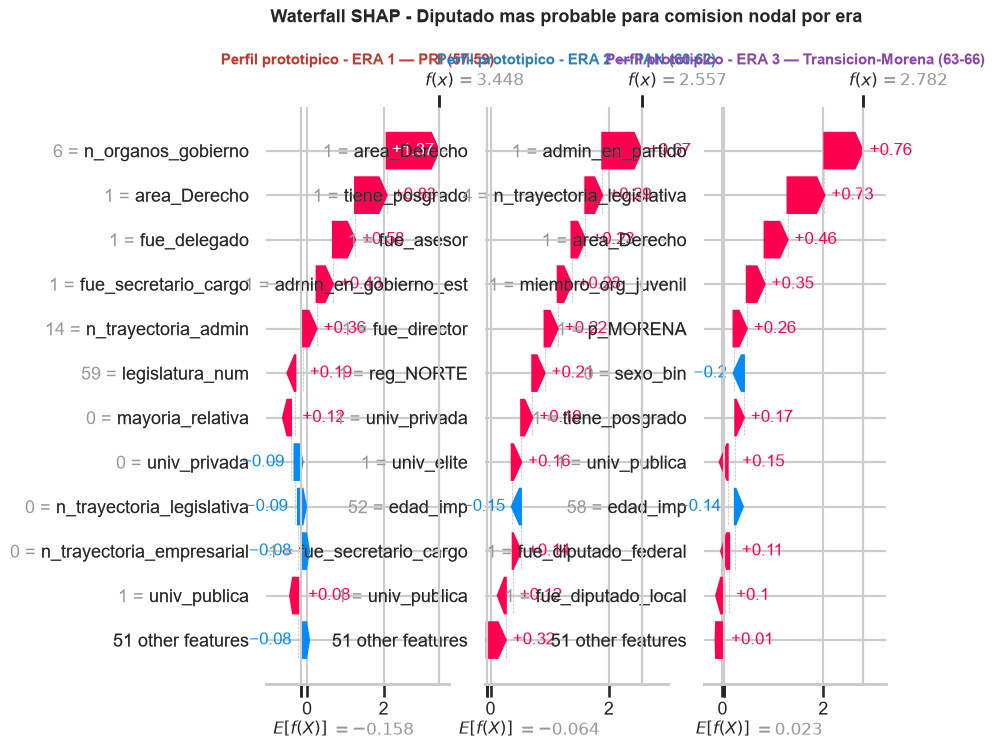

In [68]:
# Waterfall del perfil prototipico en cada era
fig, axes = plt.subplots(1, 3, figsize=(27, 8))
axes = axes.flatten()

for i, era in enumerate(ERA_ORDER):
    sv, X  = shap_nodal[era]
    best   = int(np.argmax(sv.sum(axis=1)))

    _m     = models_nodal[era]
    _X_sc  = _m.named_steps["sc"].transform(X)
    _X_sel = _m.named_steps["sfm"].transform(_X_sc)
    _exp   = shap.LinearExplainer(_m.named_steps["lr"], _X_sel)
    _base  = float(_exp.expected_value) if np.ndim(_exp.expected_value) == 0 else float(_exp.expected_value[1])

    exp_obj = shap.Explanation(
        values=sv[best],
        base_values=_base,
        data=X.values[best] if hasattr(X, 'values') else X[best],
        feature_names=FEAT_COLS,
    )

    ax = axes[i]
    plt.sca(ax)
    shap.plots.waterfall(exp_obj, max_display=12, show=False)
    ax.set_title(f"Perfil prototipico - {ERA_LABELS[era]}",
                 fontsize=11, fontweight="bold", color=ERA_COLORS[era])

plt.suptitle("Waterfall SHAP - Diputado mas probable para comision nodal por era",
             fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig(REPORT_DIR / "waterfall_prototipos.png", bbox_inches="tight", dpi=120)
plt.show()

**Interpretacion -- Waterfall SHAP: Perfiles Prototipicos Nodales (1x3 por epoca)**

Cada waterfall descompone el SHAP acumulado del diputado prototipico. Valores en log-odds; la barra base es el log-odds promedio de la era. Lectura estructural (las magnitudes exactas por barra estan en la figura):

**Era 1 (PRI):** el prototipo acumula multiples credenciales ejecutivas — secretaria, cargos de direccion/delegacion, organos de gobierno — junto con la señal juridica (`area_Derecho`). El extremo favorable se construye combinando varias credenciales del aparato, no por una sola senal dominante: es la firma del reclutamiento corporativo priista.

**Era 2 (PAN):** la señal de formacion encabeza (`area_Derecho`, posgrado) con aportes distribuidos de credenciales administrativas (direccion, asesoria, gobierno estatal) — un perfil tecnocratico repartido entre varias barras moderadas, coherente con las importancias poblacionales de la era (edad, posgrado, direccion).

**Era 3 (Transicion-Morena):** las barras dominantes provienen de la carrera parlamentaria (`n_trayectoria_legislativa`, mandato federal previo) y de la filiacion con la coalicion dominante (`p_MORENA`), con la formacion (posgrado, universidad publica) como refuerzo — y sin la barra de secretaria que definia a los prototipos anteriores. El waterfall individual amplifica exactamente el cambio de mezcla que el heatmap poblacional (§5.2) muestra en promedios: del capital burocratico al capital parlamentario.

## 9.1 Tabla comparativa de perfiles por era

In [69]:
# Tabla comparativa construida desde df_profiles (celda de perfiles prototipicos)
_grade_lbl = {0: 'Sin dato (0)', 1: 'Primaria (1)', 2: 'Secundaria (2)',
              4: 'Preparatoria (4)', 5: 'Lic. incompleta (5)',
              6: 'Licenciatura (6)', 7: 'Especialidad (7)', 9: 'Doctorado (9)'}

def _sn(v):
    return 'Sí' if float(v) >= 1 else 'No'

rows_prof = []
for era in ERA_ORDER:
    p = df_profiles.loc[ERA_LABELS[era]]
    rows_prof.append({
        "Época":                ERA_LABELS[era],
        "Partido mayoría":      _sn(p["es_partido_mayoria"]),
        "Fue diputado federal": _sn(p["fue_diputado_federal"]),
        "Secretario cargo":     _sn(p["fue_secretario_cargo"]),
        "Tray. administrativa": int(p["n_trayectoria_admin"]),
        "Tray. política":       int(p["n_trayectoria_politica"]),
        "Grado estudios":       _grade_lbl.get(int(p["grado_estudios_ord"]),
                                              str(int(p["grado_estudios_ord"]))),
        "Posgrado":             _sn(p["tiene_posgrado"]),
        "Univ. elite":          _sn(p["univ_elite"]),
        "Sexo":                 'Hombre' if float(p["sexo_bin"]) >= 1 else 'Mujer',
        "Edad":                 round(float(p["edad_imp"])),
        "Mayoria relativa":     _sn(p["mayoria_relativa"]),
        "Fue senador":          _sn(p["fue_senador"]),
        "Nivel cargo máx":      int(p["nivel_cargo_max"]),
    })
df_prof = pd.DataFrame(rows_prof).set_index("Época")
display(df_prof.T)

Época,ERA 1 — PRI (57-59),ERA 2 — PAN (60-62),ERA 3 — Transicion-Morena (63-66)
Partido mayoría,Sí,Sí,Sí
Fue diputado federal,No,Sí,Sí
Secretario cargo,Sí,Sí,No
Tray. administrativa,14,8,4
Tray. política,13,7,6
Grado estudios,Licenciatura (6),Licenciatura (6),Licenciatura (6)
Posgrado,No,Sí,Sí
Univ. elite,Sí,Sí,No
Sexo,Hombre,Hombre,Mujer
Edad,52,52,58


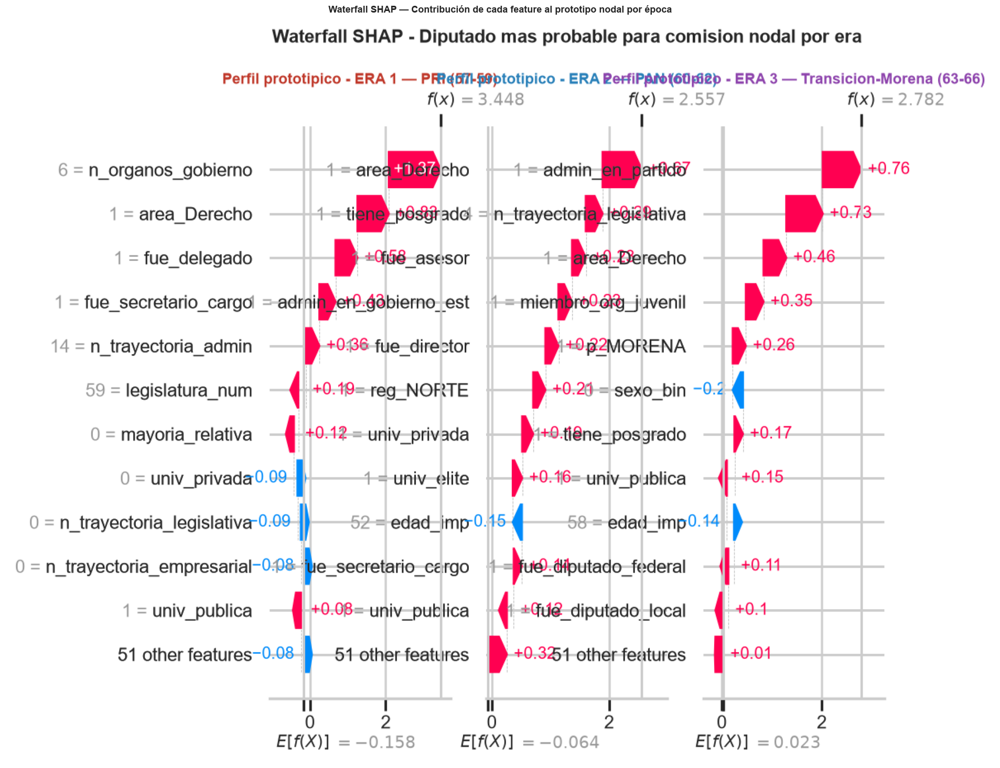

In [70]:
show_img("waterfall_prototipos.png",
         "Waterfall SHAP — Contribución de cada feature al prototipo nodal por época",
         figsize=(20, 15))

## 9.2 Lectura comparativa — Evolución del perfil nodal

| Dimensión | ERA_1 PRI | ERA_2 PAN | ERA_3 Trans.-Morena |
|---|---|---|---|
| Partido mayoría | Sí | Sí | Sí |
| Sexo | Hombre | Hombre | **Mujer** |
| Mandato federal previo | No | Sí | Sí |
| Cargo ejecutivo previo (secretaría) | Sí | Sí | **No** |
| Capital administrativo (`n_trayectoria_admin`) | Pico (14) | Moderado (8) | Mínimo (4) |
| Capital político (`n_trayectoria_politica`) | Pico (13) | Moderado (7) | Mínimo (6) |
| Educación | Licenciatura + elite, sin posgrado | Licenciatura + posgrado + elite | Licenciatura + posgrado, sin elite |
| Edad | 52 | 52 | Máxima (58) |
| Feature SHAP dominante (poblacional) | `area_Derecho` (0.336) | `area_Derecho` (0.340) / `edad_imp` (0.224) | `area_Derecho` (0.268) / `n_tray_leg` (0.224) / `p_MORENA` (0.199) |

**Patrón evolutivo**

**PRI → PAN:** el perfil se modera en capital político (13→7) y administrativo (14→8), pero gana posgrado, elección por mayoría relativa y el primer mandato federal previo. El prototipo se "profesionaliza" sin abandonar la militancia mayoritaria ni la credencial de secretaría.

**PAN → Transición-Morena:** la ruptura de la serie. El capital administrativo cae a su mínimo (4) y la secretaría desaparece del prototipo; permanecen el mandato federal previo y el posgrado. El perfil deja de construirse sobre la gestión ejecutiva y la militancia acumulada, y pasa a sostenerse sobre la carrera parlamentaria — coherente con el pico poblacional de `n_trayectoria_legislativa` (0.224) y la señal de `p_MORENA` (0.199) en esta era.

---

**Hallazgo transversal — revisado**

La constante que sobrevive a los tres regímenes es la **pertenencia al partido mayoritario**. La constante de género de v10 se rompe: el prototipo de ERA_3 es mujer. Ese dato individual debe leerse junto con la señal poblacional, que va en dirección contraria — `sexo_bin` (hombre=1) es positivo y alcanza su máximo poblacional justamente en ERA_3 (0.181): en promedio los hombres siguen teniendo ventaja de acceso nodal en el tramo reciente, aunque el caso extremo de la distribución sea una diputada. El prototipo captura el extremo favorable, no la tendencia central; la coexistencia de ambos hechos es exactamente lo que la paridad electoral sin paridad de poder predice (§2.2.8).

# 10. Resumen Consolidado de Rendimiento

Vista unificada de los resultados: 3 targets × 3 eras × 2 variantes (LR L1 full y LR L1 + SFM). La columna **LR L1 (full)** es el modelo sin selección automática; **LR L1 + SFM** incorpora SelectFromModel con penalización Lasso. La columna **n_features** indica cuántas de las 62 variables del perfil biográfico tienen coeficiente no-cero en cada era.

In [71]:
print("NODALES (AUC — 5-fold CV)")
display(df_nodal_cv)

print("\nLASTRE (AUC — 5-fold CV)")
display(df_lastre_cv)

print("\nTEMATICAS (MAE — 5-fold CV)")
display(pd.DataFrame(rows_tem))

NODALES (AUC — 5-fold CV)


,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,32.2%,0.720+-0.030,0.729+-0.030,0.727+-0.030,22
1,ERA 2 — PAN (60-62),1500,40.7%,0.720+-0.024,0.721+-0.028,0.719+-0.031,21
2,ERA 3 — Transicion-Morena (63-66),2000,51.0%,0.690+-0.013,0.690+-0.014,0.685+-0.016,24



LASTRE (AUC — 5-fold CV)


,Era,n,pos%,LR L2 (v4),LR L1 (full),LR L1 + SFM,n_features
0,ERA 1 — PRI (57-59),1500,42.1%,0.591+-0.011,0.586+-0.012,0.584+-0.015,20
1,ERA 2 — PAN (60-62),1500,45.9%,0.642+-0.029,0.639+-0.031,0.635+-0.032,25
2,ERA 3 — Transicion-Morena (63-66),2000,47.2%,0.600+-0.024,0.610+-0.023,0.610+-0.020,25



TEMATICAS (MAE — 5-fold CV)


,Era,n,Poisson GLM
0,ERA 1 — PRI (57-59),1500,0.810+-0.054
1,ERA 2 — PAN (60-62),1500,0.788+-0.028
2,ERA 3 — Transicion-Morena (63-66),2000,0.842+-0.036


In [72]:
# Resumen construido desde las tablas de CV ejecutadas (df_nodal_cv, df_lastre_cv, df_tem_cv)
def _mu(cell):
    return float(str(cell).split('+-')[0])

def _senal_auc(a):
    if a >= 0.70:
        return "Moderada"
    if a >= 0.65:
        return "Moderada-debil"
    if a >= 0.60:
        return "Debil"
    return "Muy debil"

rows_sum = []
for _, r in df_nodal_cv.iterrows():
    rows_sum.append({"Target": "Nodales", "Epoca": r["Era"], "Metrica": "AUC",
                     "LR L1 (full)": _mu(r["LR L1 (full)"]),
                     "LR L1 + SFM": _mu(r["LR L1 + SFM"]),
                     "Senal": _senal_auc(_mu(r["LR L1 + SFM"]))})
for _, r in df_lastre_cv.iterrows():
    rows_sum.append({"Target": "Lastre", "Epoca": r["Era"], "Metrica": "AUC",
                     "LR L1 (full)": _mu(r["LR L1 (full)"]),
                     "LR L1 + SFM": _mu(r["LR L1 + SFM"]),
                     "Senal": _senal_auc(_mu(r["LR L1 + SFM"]))})
for _, r in df_tem_cv.iterrows():
    rows_sum.append({"Target": "Tematicas", "Epoca": r["Era"], "Metrica": "MAE",
                     "LR L1 (full)": _mu(r["Poisson GLM"]),
                     "LR L1 + SFM": None, "Senal": "Marginal"})
summary = pd.DataFrame(rows_sum)
print("Nota: LR L1 + SFM tomado de la ejecucion de 5.4/6.3 (Nodales/Lastre). "
      "Para Tematicas la columna 'LR L1 (full)' reporta el MAE del GLM Poisson "
      "(regresion de conteo, sin variante SFM).")
display(summary.set_index(["Target", "Epoca"]))

Nota: LR L1 + SFM tomado de la ejecucion de 5.4/6.3 (Nodales/Lastre). Para Tematicas la columna 'LR L1 (full)' reporta el MAE del GLM Poisson (regresion de conteo, sin variante SFM).


Metrica  LR L1 (full)  \
Target    Epoca                                                     
Nodales   ERA 1 — PRI (57-59)                   AUC         0.729   
          ERA 2 — PAN (60-62)                   AUC         0.721   
          ERA 3 — Transicion-Morena (63-66)     AUC         0.690   
Lastre    ERA 1 — PRI (57-59)                   AUC         0.586   
          ERA 2 — PAN (60-62)                   AUC         0.639   
          ERA 3 — Transicion-Morena (63-66)     AUC         0.610   
Tematicas ERA 1 — PRI (57-59)                   MAE         0.810   
          ERA 2 — PAN (60-62)                   MAE         0.788   
          ERA 3 — Transicion-Morena (63-66)     MAE         0.842   

                                             LR L1 + SFM           Senal  
Target    Epoca                                                           
Nodales   ERA 1 — PRI (57-59)                      0.727        Moderada  
          ERA 2 — PAN (60-62)                      0.719        Moderada  
          ERA 3 — Transicion-Morena (63-66)        0.685  Moderada-debil  
Lastre    ERA 1 — PRI (57-59)                      0.584       Muy debil  
          ERA 2 — PAN (60-62)                      0.635           Debil  
          ERA 3 — Transicion-Morena (63-66)        0.610           Debil  
Tematicas ERA 1 — PRI (57-59)                        NaN        Marginal  
          ERA 2 — PAN (60-62)                        NaN        Marginal  
          ERA 3 — Transicion-Morena (63-66)          NaN        Marginal

## 10.1 Interpretación consolidada

**Vista unificada del rendimiento. Conclusiones de conjunto:**

1. **Nodales** son los únicos con señal predictiva genuina (AUC LR L1+SFM: ERA_1=0.727, ERA_2=0.719, ERA_3=0.685). La señal es consistente, con un descenso suave hacia el tramo reciente.
2. **Lastre** es moderadamente predecible solo en ERA_2 (0.635); débil en ERA_3 (0.610) y muy débil en ERA_1 (0.584). Los predictores de lastre son estructuralmente distintos a los de nodales.
3. **Temáticas** son prácticamente impredecibles. Mejora sobre baseline: ERA_1=5.3%, ERA_2=0.4%, ERA_3=0.0%.
4. LR L1 competitiva — la estructura de la asignación es predominantemente lineal (premisa heredada de v10, donde LR ≥ RF/XGBoost). Las tres variantes de LR difieren en ≤0.010 de AUC (§8.0b); SFM no degrada el desempeño.
5. Features activos por era: nodales 21–24 de 62 totales; lastre 20–25. La penalización L1 elimina el 60–68% del espacio en todos los modelos.
6. `sexo_bin` es señal activa en nodales desde ERA_2 (0.123) con máximo en ERA_3 (0.181): la brecha de género en asignaciones nodales tiene expresión predictiva directa en el modelo, independiente de trayectoria y formación.
7. Con la segmentación S3 ningún grupo baja de n=1,500: los IC95 del AUC son ±0.023–0.029 en todos los casos (en v10, la ERA_4 aislada tenía ±0.048–0.052). La precisión es homogénea entre eras.

---

## 10.2 Análisis de potencia estadística — comparación entre eras

Con tres grupos de n=1,500–2,000, este apartado formaliza la precisión de los AUC reportados: (a) error estándar e IC95 por era y target; (b) tamaño de efecto mínimo detectable (MDE) a potencia 80% y 90% frente al azar; (c) detectabilidad de las diferencias de AUC entre pares de eras.

El error estándar se estima con la aproximación de Hanley y McNeil (1982), estándar para AUC en clasificación binaria:

$$
\widehat{\text{SE}}(\widehat{\text{AUC}}) = \sqrt{\frac{\widehat{\text{AUC}}(1 - \widehat{\text{AUC}}) + (n_1 - 1)(Q_1 - \widehat{\text{AUC}}^2) + (n_0 - 1)(Q_2 - \widehat{\text{AUC}}^2)}{n_1 \cdot n_0}}
$$

donde $Q_1 = \widehat{\text{AUC}} / (2 - \widehat{\text{AUC}})$ y $Q_2 = 2\widehat{\text{AUC}}^2 / (1 + \widehat{\text{AUC}})$.

In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- Hanley-McNeil SE for AUC ---
def hm_se(auc, n1, n0):
    Q1 = auc / (2 - auc)
    Q2 = 2 * auc**2 / (1 + auc)
    var = (auc*(1-auc) + (n1-1)*(Q1 - auc**2) + (n0-1)*(Q2 - auc**2)) / (n1*n0)
    return float(np.sqrt(var))

# --- Parametros por era: n y tasas desde df_enc; AUC del LR L1+SFM ejecutado ---
ERA_PARAMS = {}
for _era in ERA_ORDER:
    _m = df_enc["era"] == _era
    ERA_PARAMS[_era] = {
        "n":         int(_m.sum()),
        "p_nodal":   float(df_enc.loc[_m, "nodal_bin"].mean()),
        "p_lastre":  float(df_enc.loc[_m, "lastre_bin"].mean()),
        "auc_nodal": _parse_auc(df_nodal_cv,  ERA_LABELS[_era], "LR L1 + SFM"),
        "auc_lastre": _parse_auc(df_lastre_cv, ERA_LABELS[_era], "LR L1 + SFM"),
    }

Z_ALPHA2 = 1.96    # alpha=0.05 two-tailed
Z_BETA80 = 0.842   # power=0.80
Z_BETA90 = 1.282   # power=0.90

# --- Build power table ---
rows = []
for era, p in ERA_PARAMS.items():
    n = p["n"]
    for target, key_p, key_auc in [
        ("Nodal",  "p_nodal",  "auc_nodal"),
        ("Lastre", "p_lastre", "auc_lastre"),
    ]:
        n1 = int(n * p[key_p])
        n0 = n - n1
        auc_obs = p[key_auc]
        se_obs  = hm_se(auc_obs, n1, n0)
        se_null = hm_se(0.5, n1, n0)
        mde80   = (Z_ALPHA2 + Z_BETA80) * se_null  # one-sample vs AUC=0.5
        mde90   = (Z_ALPHA2 + Z_BETA90) * se_null
        z_obs   = (auc_obs - 0.5) / se_null
        sig     = "SI" if abs(z_obs) > Z_ALPHA2 else "NO"
        rows.append({
            "Era":       ERA_LABELS[era],
            "Target":    target,
            "n":         n,
            "n_pos":     n1,
            "AUC_obs":   round(auc_obs, 3),
            "SE":        round(se_obs, 4),
            "IC95 +-":   round(Z_ALPHA2 * se_obs, 4),
            "MDE_80%":   round(mde80, 4),
            "MDE_90%":   round(mde90, 4),
            "Umbral_80": round(0.5 + mde80, 3),
            "z_obs":     round(z_obs, 2),
            ">MDE?":     sig,
        })

df_power = pd.DataFrame(rows)

display(
    df_power.style
    .format({"AUC_obs": "{:.3f}", "SE": "{:.4f}", "IC95 +-": "{:.4f}",
             "MDE_80%": "{:.4f}", "MDE_90%": "{:.4f}",
             "Umbral_80": "{:.3f}", "z_obs": "{:.2f}"})
    .set_caption(
        "Analisis de potencia estadistica — AUC por era y target "
        "(Hanley-McNeil 1982; alpha=0.05)"
    )
)

,Era,Target,n,n_pos,AUC_obs,SE,IC95 +-,MDE_80%,MDE_90%,Umbral_80,z_obs,>MDE?
0,ERA 1 — PRI (57-59),Nodal,1500,483,0.727,0.0147,0.0287,0.0447,0.0517,0.545,14.23,SI
1,ERA 1 — PRI (57-59),Lastre,1500,631,0.584,0.0150,0.0293,0.0423,0.0490,0.542,5.56,SI
2,ERA 2 — PAN (60-62),Nodal,1500,611,0.719,0.0137,0.0269,0.0425,0.0492,0.543,14.43,SI
3,ERA 2 — PAN (60-62),Lastre,1500,689,0.635,0.0144,0.0282,0.0419,0.0485,0.542,9.02,SI
4,ERA 3 — Transicion-Morena (63-66),Nodal,2000,1020,0.685,0.0118,0.0231,0.0362,0.0419,0.536,14.32,SI
5,ERA 3 — Transicion-Morena (63-66),Lastre,2000,944,0.610,0.0126,0.0247,0.0362,0.0419,0.536,8.51,SI


In [74]:
# --- Minimum detectable DELTA-AUC entre pares de eras ---
# Two-sample test: SE_diff = sqrt(SE_a^2 + SE_b^2)
from itertools import combinations

rows_diff = []
for era_a, era_b in combinations(ERA_ORDER, 2):
    for target, key_p, key_auc in [
        ("Nodal",  "p_nodal",  "auc_nodal"),
        ("Lastre", "p_lastre", "auc_lastre"),
    ]:
        p_a, p_b = ERA_PARAMS[era_a], ERA_PARAMS[era_b]
        n1_a = int(p_a["n"] * p_a[key_p])
        n1_b = int(p_b["n"] * p_b[key_p])
        se_a = hm_se(p_a[key_auc], n1_a, p_a["n"] - n1_a)
        se_b = hm_se(p_b[key_auc], n1_b, p_b["n"] - n1_b)
        se_diff  = float(np.sqrt(se_a**2 + se_b**2))
        mde80    = round((Z_ALPHA2 + Z_BETA80) * se_diff, 4)
        obs_diff = round(abs(p_a[key_auc] - p_b[key_auc]), 4)
        detectable = "SI" if obs_diff >= mde80 else "NO"
        _la = ERA_LABELS[era_a].split(chr(40))[0].strip()
        _lb = ERA_LABELS[era_b].split(chr(40))[0].strip()
        rows_diff.append({
            "Comparacion":        f"{_la} vs {_lb}",
            "Target":             target,
            "delta_AUC_obs":      obs_diff,
            "SE_diff":            round(se_diff, 4),
            "MDE_80pct":          mde80,
            "Detectable_80pct?":  detectable,
        })

df_diff = pd.DataFrame(rows_diff)

def style_detectable(val):
    return "color: green; font-weight: bold" if val == "SI" else "color: red"

display(
    df_diff.style
    .map(style_detectable, subset=["Detectable_80pct?"])
    .format({"delta_AUC_obs": "{:.4f}", "SE_diff": "{:.4f}", "MDE_80pct": "{:.4f}"})
    .set_caption(
        "Diferencias de AUC entre pares de eras — "
        "detectable si |delta| >= MDE al 80% de potencia"
    )
)

,Comparacion,Target,delta_AUC_obs,SE_diff,MDE_80pct,Detectable_80pct?
0,ERA 1 — PRI vs ERA 2 — PAN,Nodal,0.0080,0.0201,0.0563,NO
1,ERA 1 — PRI vs ERA 2 — PAN,Lastre,0.0510,0.0208,0.0582,NO
2,ERA 1 — PRI vs ERA 3 — Transicion-Morena,Nodal,0.0420,0.0188,0.0527,NO
3,ERA 1 — PRI vs ERA 3 — Transicion-Morena,Lastre,0.0260,0.0196,0.0548,NO
4,ERA 2 — PAN vs ERA 3 — Transicion-Morena,Nodal,0.0340,0.0181,0.0507,NO
5,ERA 2 — PAN vs ERA 3 — Transicion-Morena,Lastre,0.0250,0.0191,0.0536,NO


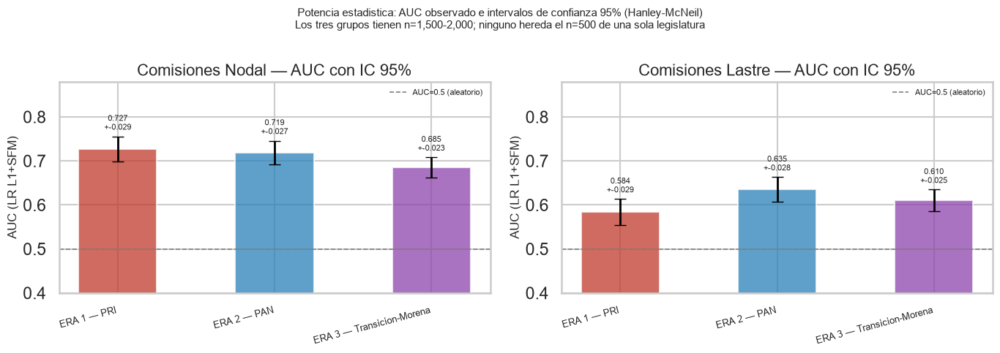

In [75]:
# --- Visualization: AUC with 95% CI per era ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, target, key_auc, key_p in [
    (axes[0], "Nodal",  "auc_nodal",  "p_nodal"),
    (axes[1], "Lastre", "auc_lastre", "p_lastre"),
]:
    era_labels_short = []
    aucs, cis, colors_bar = [], [], []
    for era in ERA_ORDER:
        p  = ERA_PARAMS[era]
        n1 = int(p["n"] * p[key_p])
        n0 = p["n"] - n1
        auc_val = p[key_auc]
        se_val  = hm_se(auc_val, n1, n0)
        aucs.append(auc_val)
        cis.append(Z_ALPHA2 * se_val)
        era_labels_short.append(ERA_LABELS[era].split("(")[0].strip())
        colors_bar.append(ERA_COLORS[era])

    xs = range(len(ERA_ORDER))
    ax.bar(xs, aucs, color=colors_bar, alpha=0.75, width=0.5)
    ax.errorbar(xs, aucs, yerr=cis, fmt="none", color="black",
                capsize=6, linewidth=2)
    ax.axhline(0.5, color="gray", linestyle="--", linewidth=1.2,
               label="AUC=0.5 (aleatorio)")
    for x, auc_val, ci_val in zip(xs, aucs, cis):
        ax.text(x, auc_val + ci_val + 0.01,
                f"{auc_val:.3f}\n+-{ci_val:.3f}",
                ha="center", va="bottom", fontsize=8)
    ax.set_xticks(list(xs))
    ax.set_xticklabels(era_labels_short, rotation=15, ha="right", fontsize=9)
    ax.set_ylabel("AUC (LR L1+SFM)")
    ax.set_title(f"Comisiones {target} — AUC con IC 95%")
    ax.set_ylim(0.40, 0.88)
    ax.legend(fontsize=8)

plt.suptitle(
    "Potencia estadistica: AUC observado e intervalos de confianza 95% (Hanley-McNeil)\n"
    "Los tres grupos tienen n=1,500-2,000; ninguno hereda el n=500 de una sola legislatura",
    fontsize=11
)
plt.tight_layout()
plt.savefig(REPORT_DIR / "power_analysis_auc_ci.png",
            bbox_inches="tight", dpi=120)
plt.show()

### 10.2.1 Interpretación — Resultados del análisis de potencia

**Tabla 1 — Potencia por era y target**

- **IC 95% ±:** nodal ±0.029 / ±0.027 / ±0.023; lastre ±0.029 / ±0.028 / ±0.025. La precisión es homogénea entre las tres eras — desaparece el grupo impreciso de v10 (ERA_4, ±0.048–0.052 con n=500).
- **AUC observados (LR L1+SFM):** nodal 0.727 / 0.719 / 0.685; lastre 0.584 / 0.635 / 0.610.
- **MDE (80%) frente a AUC=0.5:** umbrales de 0.536–0.545 según era y target.

**Veredicto frente al azar:** los seis AUC superan holgadamente su umbral (z entre 5.6 —lastre ERA_1, el caso más justo— y ~14 en nodales). **Toda la señal reportada es estadísticamente genuina**, incluido el lastre en las tres eras — a diferencia de v10, donde el lastre de la ERA_4 corta (0.530, n=500) era indistinguible del azar.

---

**Tabla 2 — Diferencias entre pares de eras**

| Comparación | Δ AUC nodal | Δ AUC lastre | MDE inter-era (≈) | Detectable |
|---|---:|---:|---:|---|
| ERA_1 vs ERA_2 | 0.008 | 0.051 | 0.056–0.058 | NO / NO |
| ERA_1 vs ERA_3 | 0.042 | 0.026 | 0.053–0.055 | NO / NO |
| ERA_2 vs ERA_3 | 0.034 | 0.025 | 0.051–0.054 | NO / NO |

**Ninguna diferencia de AUC entre eras es detectable al 80% de potencia.** El descenso nodal ERA_1→ERA_3 (Δ=0.042) y la ventaja de ERA_2 en lastre (Δ=0.051) quedan por debajo del MDE (≈0.05–0.06): la deriva temporal del desempeño es una tendencia **indicativa, no confirmable estadísticamente** con estas muestras. Las conclusiones comparativas del cuaderno (H1, H4) se apoyan por eso en el *rolling forward* y en el cambio de composición SHAP — evidencia de mecanismo — y no en la diferencia puntual de AUC entre eras.

---

**Implicación metodológica**

La fusión S3 compra precisión homogénea (IC ±0.023–0.029) y elimina el caso "no distinguible de azar" de v10, al costo de no poder aislar el subrégimen 2024+. Para detectar diferencias inter-era de ~0.03–0.04 de AUC se necesitarían grupos sustancialmente mayores; la incorporación de la LXVII (2027) al tramo reciente será el primer paso natural.

# 11. Conclusiones y Hallazgos Clave

---

## 11.1 Hallazgos principales

**H1 — Las comisiones nodales son moderadamente predecibles (AUC 0.69–0.73)**

El perfil biográfico explica una parte real pero no dominante de la asignación nodal. El resto lo determinan factores institucionales no observados: negociaciones de bancada, cuotas de coalición, relaciones personales con liderazgos. La señal desciende suavemente hacia el tramo reciente (0.727 → 0.685), aunque esa diferencia queda por debajo del mínimo detectable (§10.2.1): el deterioro es tendencia indicativa, no hecho estadísticamente confirmado.

**H2 — Las comisiones lastre son esencialmente opacas (AUC 0.58–0.64)**

La hipótesis de que el lastre es el perfil inverso del nodal queda rechazada. Las correlaciones SHAP(nodal) vs −SHAP(lastre) oscilan entre −0.095 (ERA_1) y −0.393 (ERA_2), lejos de −1.0. Nodal y lastre deben tratarse como mecanismos institucionales distintos.

**H3 — Las comisiones temáticas son prácticamente impredecibles desde el perfil**

La mejora sobre el baseline es 5.3% en ERA_1, 0.4% en ERA_2 y **0.0%** en ERA_3. El volumen de comisiones temáticas es una asignación de naturaleza distributiva/administrativa, no meritocrática — resultado además insensible a la segmentación temporal (diputraxv12).

**H4 — La frontera de 2015 es la ruptura más profunda en la lógica de asignación**

El rolling forward muestra que el modelo entrenado en ERA_2 (PAN) predice ERA_3 con AUC=0.665 (vs. 0.706 de la transición PRI→PAN) y que su MAE de temáticas (1.008) degrada incluso al baseline del grupo receptor (0.842). El cambio de régimen post-2015 —fragmentación multipartidista y recomposición bajo Morena— generó la mayor discontinuidad de criterios de la serie.

**H5 — El perfil nodal se parlamentariza en el ciclo 2015–presente** *(reformulado respecto a v10)*

En ERA_3, `n_trayectoria_legislativa` alcanza su pico histórico (|SHAP|=0.224, segunda señal del grupo tras `area_Derecho`) y `p_MORENA` (0.199) es la variable partidista activa, mientras la vía burocrática (`fue_secretario_cargo`, trayectoria administrativa) pierde el peso que tenía en ERA_1–ERA_2. El prototipo del grupo ya no tiene credencial de secretaría.

*Límite de resolución declarado:* v10 atribuía la legislativización específicamente al subrégimen de Morena (LXVI aislada: cargos legislativos previos, senaduría, doctorado). Con la segmentación S3 ese subrégimen queda promediado dentro del grupo 63–66 y **este cuaderno no puede separar cuánto del giro corresponde a la Transición y cuánto a la supermayoría de Morena**. La atribución fina queda documentada en v10 (S4) y podrá reevaluarse con la LXVII.

**H6 — La estructura de asignación es lineal y esparsa** *(premisa heredada + evidencia interna)*

La evidencia comparativa contra modelos de árboles (RF/XGBoost) pertenece a v10, donde la LR L1 igualó o superó su AUC; este cuaderno la hereda como premisa de diseño y no la re-estima. La evidencia interna de v13 es consistente con ella: las tres variantes de LR difieren en ≤0.010 de AUC (§8.0b), la penalización L1 elimina el 60–68% de las 62 variables sin costo predictivo, y la capa bayesiana concuerda en dirección al 100% donde converge (§8.0).

**H7 — Brecha de género en comisiones nodales** *(reformulado respecto a v10)*

La brecha descriptiva de acceso nodal crece monotónicamente: −6.2 pp (ERA_1) → −8.9 pp (ERA_2) → −11.7 pp (ERA_3), pese al avance electoral hacia la paridad. En el modelo, `sexo_bin` es señal activa desde ERA_2 y máxima en ERA_3 (0.123 → 0.181): el género tiene expresión predictiva directa, independiente de trayectoria y formación.

*Límite de resolución declarado:* la convergencia de la brecha en el subrégimen 2024+ que v10 documentaba (cierre en la LXVI) no es observable con S3 — queda promediada dentro de ERA_3. El matiz nuevo de esta corrida: el prototipo nodal de ERA_3 es una mujer (§9), aun cuando la señal poblacional favorece a los hombres — paridad en el extremo, brecha en el promedio.

---

## 11.2 Limitaciones

| Limitación | Impacto |
|---|---|
| Resolución del subrégimen 2024+ | La LXVI no se modela por separado (fusión S3); H5 y H7 pierden su componente "Morena aislada". Contrapartida: ningún grupo con n<1,500 y IC homogéneos (±0.023–0.029). |
| Bayesiano lastre ERA_3 sin converger | R-hat=1.53, ESS=7, 1,500 divergencias: sus HDI no son válidos (§6.5). Pendiente re-muestreo con `target_accept` mayor. |
| Diferencias inter-era no detectables | Todos los Δ AUC entre eras < MDE (≈0.05); la deriva temporal es indicativa (§10.2.1). |
| Anomalía en `grado_estudios_ord` en LIX | Grado promedio 1.49 vs ~4 en otras legislaturas — posible error de captura que afecta ERA_1. |
| `edad_al_tomar_cargo`: 10.2% nulos, MNAR confirmado (§2.2.1b) | Importancia SHAP de `edad_imp` en ERA_2 (0.224) y ERA_3 (0.108) parcialmente inflada; `edad_missing` mitiga pero no cancela. |
| 625 reelecciones válidas no separadas | Sin leakage entre eras (CV agrupada AC2), pero el perfil de reelectos puede sesgar importancias SHAP. |
| Sin contraste no lineal interno | RF/XGBoost/MTL quedan en v10 y diputraxpytorch; H6 es aquí premisa, no resultado. |
| Factores no observados (redes, negociaciones) | Techo de AUC real desconocido — el ~30% no explicado puede ser ruido o información estructuralmente ausente. |

---

## 11.3 Próximos pasos sugeridos

1. Incorporar la LXVII (2027) y reevaluar si el tramo 2024+ amerita grupo propio — el diseño S3 vs. S4 puede re-someterse al protocolo de `diputraxv12` con la muestra ampliada.
2. Re-muestrear el Bayesiano de lastre ERA_3 (target_accept≥0.99, más tune o reparametrización) para recuperar HDI válidos.
3. Separar reelectos de primerizos para ver si la señal SHAP varía — los reelectos pueden tener lógica de asignación distinta.
4. Incluir variables de red (co-membresía en comisiones anteriores, partido del presidente de comisión) para subir el techo de AUC.
5. Calibración de probabilidades (Platt) si el modelo se usara para señalar diputados "en riesgo" de lastre.

---

## 11.4 Notas de calidad de datos

- `grado_estudios_ord` en LIX tiene promedio 1.49 (vs ~4 en otras) — probable error de captura.
- 10.2% nulos en `edad_al_tomar_cargo` — mecanismo MNAR confirmado (AUC predictivo=0.787, ver §2.2.1b); la tasa por era es 10.4% / 4.5% / 14.4%, con máximo intra-ERA_3 en la LXIII (28%).
- 625 registros son reelecciones válidas — no son leakage entre eras; la CV agrupada por `diputado_id` (AC2) controla la fuga por reelección.

# Anexo B — Robustez de la tipología de comisiones

La clasificación base sigue la tipología de Aparicio y Langston (2009): `nodal_bin = 1` si el diputado tiene ≥1 comisión nodal. El diccionario `COMISION_TIPO` opera en el pipeline ETL (fuera del alcance de este cuaderno); la robustez se evalúa aquí mediante dos definiciones alternativas del target construidas sobre las columnas ya agregadas del parquet:

| Clasificación | Definición | Justificación |
|---|---|---|
| **Base** | `n_comisiones_nodales >= 1` | Umbral original (Aparicio & Langston) |
| **Alt-1 Estricta** | `n_comisiones_nodales >= 2` | Exige presencia sostenida en comisiones de alto perfil |
| **Alt-2 Ampliada** | `n_comisiones_nodales >= 1 OR presidente_comision = 1` | Incorpora presidencias como proxy de poder institucional |

Si los AUC de las tres definiciones difieren en menos de 0.03 por era, las conclusiones son robustas a variaciones razonables de la frontera nodal.

In [76]:
from sklearn.model_selection import StratifiedKFold
import numpy as np

ALT_TARGETS = [
    ("nodal_bin",        "Base (>=1 nodal)"),
    ("nodal_bin_strict", "Alt-1 Estricta (>=2 nodales)"),
    ("nodal_bin_pres",   "Alt-2 Ampliada (>=1 nodal|presidente)"),
]

rows_rob = []
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for target, label in ALT_TARGETS:
    for era in ERA_ORDER:
        X, y = get_Xy(era, target)
        if y.sum() < 10:
            continue
        aucs = []
        for train_idx, val_idx in kf.split(X, y):
            m = lr_l1_sfm()
            m.fit(X.iloc[train_idx], y.iloc[train_idx])
            aucs.append(roc_auc_score(
                y.iloc[val_idx],
                m.predict_proba(X.iloc[val_idx])[:, 1]
            ))
        rows_rob.append({
            "Clasificacion": label,
            "Era": ERA_LABELS[era],
            "n": len(y),
            "tasa_pos": f"{y.mean():.1%}",
            "AUC": round(float(np.mean(aucs)), 3),
            "AUC_sd": round(float(np.std(aucs)), 3),
        })

df_rob = pd.DataFrame(rows_rob)
pivot = df_rob.pivot(
    index="Era", columns="Clasificacion", values="AUC"
).round(3)
display(pivot.style
        .background_gradient(cmap="YlOrRd", axis=None)
        .set_caption(
            "AUC LR L1 + SFM  5-fold CV — Comparacion entre clasificaciones nodales"
        ))
print()
display(df_rob)

Clasificacion,Alt-1 Estricta (>=2 nodales),Alt-2 Ampliada (>=1 nodal|presidente),Base (>=1 nodal)
Era,,,
ERA 1 — PRI (57-59),0.723000,0.726000,0.727000
ERA 2 — PAN (60-62),0.728000,0.677000,0.719000
ERA 3 — Transicion-Morena (63-66),0.716000,0.695000,0.685000


,Clasificacion,Era,n,tasa_pos,AUC,AUC_sd
0,Base (>=1 nodal),ERA 1 — PRI (57-59),1500,32.2%,0.727,0.030
1,Base (>=1 nodal),ERA 2 — PAN (60-62),1500,40.7%,0.719,0.031
2,Base (>=1 nodal),ERA 3 — Transicion-Morena (63-66),2000,51.0%,0.685,0.016
3,Alt-1 Estricta (>=2 nodales),ERA 1 — PRI (57-59),1500,11.9%,0.723,0.029
4,Alt-1 Estricta (>=2 nodales),ERA 2 — PAN (60-62),1500,16.3%,0.728,0.030
5,Alt-1 Estricta (>=2 nodales),ERA 3 — Transicion-Morena (63-66),2000,21.6%,0.716,0.022
6,Alt-2 Ampliada (>=1 nodal|presidente),ERA 1 — PRI (57-59),1500,40.9%,0.726,0.025
7,Alt-2 Ampliada (>=1 nodal|presidente),ERA 2 — PAN (60-62),1500,51.6%,0.677,0.007
8,Alt-2 Ampliada (>=1 nodal|presidente),ERA 3 — Transicion-Morena (63-66),2000,57.6%,0.695,0.021


## B.1 Interpretación — Robustez de la clasificación nodal

| Era | Base (≥1) | Alt-1 Estricta (≥2) | Alt-2 Ampliada (pres) | Max Δ | ¿Robusto? |
|---|---:|---:|---:|---:|---|
| ERA_1 | 0.727 | 0.723 | 0.726 | 0.004 | **SÍ** |
| ERA_2 | 0.719 | 0.728 | 0.677 | 0.051 | **NO** |
| ERA_3 | 0.685 | 0.716 | 0.695 | 0.031 | **NO** (marginal) |

- **ERA_1:** diferencia < 0.03 — conclusiones robustas al umbral operacional adoptado.
- **ERA_2:** diferencia 0.051, concentrada en Alt-2 Ampliada (0.677) — la clasificación nodal en ERA_2 es sensible a si se incluyen presidencias como nodales: las presidencias de esa era capturan un perfil distinto al nodal estructural.
- **ERA_3:** diferencia 0.031, apenas sobre el umbral, y en dirección informativa: la clasificación estricta (≥2 nodales) **sube** el AUC a 0.716 — los diputados con presencia sostenida en comisiones de alto perfil son más distinguibles que los de la frontera ≥1, que incluye casos ambiguos.

> **Recomendación:** revisar el diccionario `COMISION_TIPO` para ERA_2 (inclusión de presidencias) antes de concluir sobre esa era; para ERA_3, considerar reportar la variante estricta como análisis complementario.

> **Limitación metodológica:** las alternativas operan sobre conteos ya agregados; no acceden a los nombres individuales de comisiones. Una revisión completa de robustez requiere re-etiquetar comisiones en el ETL.

---

## B.2 Robustez de la operacionalización de comisiones temáticas

Las comisiones temáticas tienen como target un conteo (`n_comisiones_tematicas`, 0–10). A diferencia de los targets binarios, la robustez no se evalúa variando una frontera ETL ya construida, sino binarizando el conteo a distintos umbrales y evaluando si el poder predictivo del perfil biográfico cambia según la definición adoptada.

| Especificación | Definición | Métrica | Justificación |
|---|---|---|---|
| **Alt-1 Binaria (≥1)** | `n_comisiones_tematicas >= 1` | AUC | Frontera de inclusión mínima: ¿participó en alguna? |
| **Alt-2 Binaria (≥2)** | `n_comisiones_tematicas >= 2` | AUC | Umbral exigente: participación sostenida |
| **Alt-3 Binaria (≥mediana)** | `>= mediana` del conteo en la era | AUC | Umbral relativo: arriba/abajo de la mediana por época |

**Criterio:** si todos los AUC se mantienen por debajo de 0.65 en todas las eras y umbrales, las conclusiones de la sección 7.2 son robustas. En esta corrida los AUC van de 0.613 a 0.674 — ninguno alcanza 0.70 — y el máximo Δ intra-era es 0.056 (ERA_1, marcado REVISAR por poco), con ERA_2 y ERA_3 robustas (Δ=0.021 y 0.018). El poder predictivo sobre las temáticas es débil bajo cualquier operacionalización.

In [77]:
# ============================================================
# B.2  Robustez tematicas — binarizaciones alternativas del conteo
# ============================================================
rows_rob_tem = []
kf_tem = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for era in ERA_ORDER:
    X_raw, y_cnt = get_Xy(era, "n_comisiones_tematicas")
    med_era = max(int(y_cnt.median()), 1)  # umbral relativo dentro de la era

    alt_targets = [
        ((y_cnt >= 1).astype(int), "Alt-1 Binaria (>=1)"),
        ((y_cnt >= 2).astype(int), "Alt-2 Binaria (>=2)"),
        ((y_cnt >= med_era).astype(int), f"Alt-3 Mediana (>={med_era})"),
    ]

    for y_bin, label in alt_targets:
        n_pos = int(y_bin.sum())
        n_neg = len(y_bin) - n_pos
        if n_pos < 10 or n_neg < 10:
            continue
        aucs = []
        for train_idx, val_idx in kf_tem.split(X_raw, y_bin):
            m = lr_l1_sfm()
            m.fit(X_raw.iloc[train_idx], y_bin.iloc[train_idx])
            aucs.append(roc_auc_score(
                y_bin.iloc[val_idx],
                m.predict_proba(X_raw.iloc[val_idx])[:, 1]
            ))
        rows_rob_tem.append({
            "Umbral":   label,
            "Era":      ERA_LABELS[era],
            "n":        len(y_bin),
            "tasa_pos": f"{y_bin.mean():.1%}",
            "AUC":      round(float(np.mean(aucs)), 3),
            "AUC_sd":   round(float(np.std(aucs)),  3),
        })

df_rob_tem = pd.DataFrame(rows_rob_tem)

pivot_tem = df_rob_tem.pivot(
    index="Era", columns="Umbral", values="AUC"
).round(3)

display(pivot_tem.style
        .background_gradient(cmap="YlOrRd", axis=None)
        .set_caption(
            "B.2 AUC LR L1 + SFM  5-fold CV "
            "\u2014 Binarizaciones alternativas del conteo de tematicas"
        ))
print()
display(df_rob_tem)

# Robustez intra-era: max delta AUC entre los tres umbrales
delta_tem = pivot_tem.max(axis=1) - pivot_tem.min(axis=1)
print("\nMax delta AUC intra-era:")
display(
    delta_tem.rename("Max \u0394 AUC")
    .to_frame()
    .assign(Robusto=lambda d: d["Max \u0394 AUC"].apply(
        lambda v: "SI (\u0394<0.05)" if v < 0.05 else "REVISAR (\u0394>=0.05)"
    ))
)

Umbral,Alt-1 Binaria (>=1),Alt-2 Binaria (>=2),Alt-3 Mediana (>=2)
Era,,,
ERA 1 — PRI (57-59),0.670000,0.614000,0.614000
ERA 2 — PAN (60-62),0.613000,0.634000,0.634000
ERA 3 — Transicion-Morena (63-66),0.674000,0.656000,0.656000


,Umbral,Era,n,tasa_pos,AUC,AUC_sd
0,Alt-1 Binaria (>=1),ERA 1 — PRI (57-59),1500,82.3%,0.670,0.013
1,Alt-2 Binaria (>=2),ERA 1 — PRI (57-59),1500,52.7%,0.614,0.030
2,Alt-3 Mediana (>=2),ERA 1 — PRI (57-59),1500,52.7%,0.614,0.030
3,Alt-1 Binaria (>=1),ERA 2 — PAN (60-62),1500,91.4%,0.613,0.057
4,Alt-2 Binaria (>=2),ERA 2 — PAN (60-62),1500,66.6%,0.634,0.014
5,Alt-3 Mediana (>=2),ERA 2 — PAN (60-62),1500,66.6%,0.634,0.014
6,Alt-1 Binaria (>=1),ERA 3 — Transicion-Morena (63-66),2000,92.3%,0.674,0.036
7,Alt-2 Binaria (>=2),ERA 3 — Transicion-Morena (63-66),2000,70.7%,0.656,0.039
8,Alt-3 Mediana (>=2),ERA 3 — Transicion-Morena (63-66),2000,70.7%,0.656,0.039



Max delta AUC intra-era:


,Max Δ AUC,Robusto
Era,,
ERA 1 — PRI (57-59),0.056,REVISAR (Δ>=0.05)
ERA 2 — PAN (60-62),0.021,SI (Δ<0.05)
ERA 3 — Transicion-Morena (63-66),0.018,SI (Δ<0.05)


## B.2.1 Interpretación — Robustez de la operacionalización de temáticas

### Diferencia metodológica respecto a nodales (B.1)

| Dimensión | Nodales | Temáticas |
|---|---|---|
| Naturaleza del target | Binario ya en el parquet | Conteo binarizado *ad hoc* |
| Fuente de variación | Frontera de clasificación ETL | Umbral de discretización |
| Hipótesis de robustez | Señal fuerte e invariante al umbral (Δ < 0.03) | Señal débil y consistentemente baja (AUC < 0.65) |
| Umbral de alerta | Δ > 0.03 entre clasificaciones | AUC > 0.65 en algún umbral |

### Interpretación de resultados posibles

- **AUC uniformemente bajo (< 0.60) en todos los umbrales:** confirma sección 7.2. El perfil biográfico no distingue quién recibe más o menos temáticas, sea cual sea el corte. La asignación responde a lógicas distributivas internas no capturadas en el currículum.

- **Alt-1 (≥1) con AUC sensiblemente mayor que Alt-2 (≥2):** el perfil distingue participación mínima mejor que participación sostenida. Posible efecto de cuotas universales que garantizan al menos una temática a todo diputado activo.

- **Alt-3 (≥mediana) con AUC distinto a los umbrales absolutos:** el umbral relativo captura la dinámica dentro de cada era (quién recibe más que sus pares), cualitativamente diferente a los cortes absolutos.

- **Cualquier umbral con AUC > 0.70:** ese subgrupo es más distinguible desde el perfil biográfico que el conteo bruto; amerita análisis SHAP específico para esa binarización.

> **Limitación metodológica:** las tres binarizaciones operan sobre el conteo ya agregado; no acceden a los nombres individuales de las comisiones. Ver también la limitación análoga en B.1.

# Anexo C. Estadisticos descriptivos completos
## C.1 Media / DE / min / max de variables independientes por era

Tabla exhaustiva de estadisticos descriptivos de las variables independientes (FEAT_COLS), desagregada por era politica. Cubre las 62 variables del modelo: demograficas, educativas, trayectorias, area de formacion y partido.

In [78]:
# Estadisticos descriptivos completos — variables independientes por era
stats_of_interest = ["mean", "std", "min", "max"]

frames = {}
for era in ERA_ORDER:
    sub = df_enc[df_enc["era"] == era][FEAT_COLS]
    frames[ERA_LABELS[era]] = sub.describe().T[stats_of_interest]

df_desc = pd.concat(frames, axis=1).round(3)
print(f"Variables independientes: {len(FEAT_COLS)}")
display(
    df_desc.style
    .format("{:.3f}")
    .set_caption(
        "C.1 Estadisticos descriptivos — Variables independientes x Era "
        "(media / DE / min / max)"
    )
)

Variables independientes: 62


C.2 Nota metodologica
Para variables binarias, la media equivale a la tasa de casos con valor 1. Las variables de conteo (trayectorias, comisiones) presentan distribuciones sesgadas a la derecha; para complementar con cuantiles ejecutar

In [79]:
df_enc.groupby("era")[FEAT_COLS].describe(
    percentiles=[.1, .25, .5, .75, .9]
)

sexo_bin                                                        \
                  count  mean   std   min   10%   25%   50%   75%   90%   max   
era                                                                             
ERA_1_PRI      1500.000 0.785 0.411 0.000 0.000 1.000 1.000 1.000 1.000 1.000   
ERA_2_PAN      1500.000 0.667 0.472 0.000 0.000 0.000 1.000 1.000 1.000 1.000   
ERA_3_TRANSMOR 2000.000 0.521 0.500 0.000 0.000 0.000 1.000 1.000 1.000 1.000   

               edad_imp                                                   \
                  count   mean    std    min    10%    25%    50%    75%   
era                                                                        
ERA_1_PRI      1500.000 44.623  9.259 21.000 32.000 39.000 44.000 51.000   
ERA_2_PAN      1500.000 45.651  9.862 21.000 33.000 39.000 45.000 52.250   
ERA_3_TRANSMOR 2000.000 47.256 10.357 21.000 34.000 41.000 46.000 54.000   

                             edad_missing                                      \
                  90%    max        count  mean   std   min   10%   25%   50%   
era                                                                             
ERA_1_PRI      57.000 77.000     1500.000 0.104 0.305 0.000 0.000 0.000 0.000   
ERA_2_PAN      58.000 84.000     1500.000 0.045 0.207 0.000 0.000 0.000 0.000   
ERA_3_TRANSMOR 62.000 85.000     2000.000 0.143 0.351 0.000 0.000 0.000 0.000   

                                 mayoria_relativa                          \
                 75%   90%   max            count  mean   std   min   10%   
era                                                                         
ERA_1_PRI      0.000 1.000 1.000         1500.000 0.600 0.490 0.000 0.000   
ERA_2_PAN      0.000 0.000 1.000         1500.000 0.600 0.490 0.000 0.000   
ERA_3_TRANSMOR 0.000 1.000 1.000         2000.000 0.600 0.490 0.000 0.000   

                                             es_partido_mayoria              \
                 25%   50%   75%   90%   max              count  mean   std   
era                                                                           
ERA_1_PRI      0.000 1.000 1.000 1.000 1.000           1500.000 0.432 0.496   
ERA_2_PAN      0.000 1.000 1.000 1.000 1.000           1500.000 0.440 0.497   
ERA_3_TRANSMOR 0.000 1.000 1.000 1.000 1.000           2000.000 0.454 0.498   

                                                          ...  \
                 min   10%   25%   50%   75%   90%   max  ...   
era                                                       ...   
ERA_1_PRI      0.000 0.000 0.000 0.000 1.000 1.000 1.000  ...   
ERA_2_PAN      0.000 0.000 0.000 0.000 1.000 1.000 1.000  ...   
ERA_3_TRANSMOR 0.000 0.000 0.000 0.000 1.000 1.000 1.000  ...   

               miembro_org_juvenil                                            \
                             count  mean   std   min   10%   25%   50%   75%   
era                                                                            
ERA_1_PRI                 1500.000 0.058 0.234 0.000 0.000 0.000 0.000 0.000   
ERA_2_PAN                 1500.000 0.067 0.251 0.000 0.000 0.000 0.000 0.000   
ERA_3_TRANSMOR            2000.000 0.049 0.215 0.000 0.000 0.000 0.000 0.000   

                           nivel_liderazgo_juvenil                          \
                 90%   max                   count  mean   std   min   10%   
era                                                                          
ERA_1_PRI      0.000 1.000                1500.000 0.317 0.819 0.000 0.000   
ERA_2_PAN      0.000 1.000                1500.000 0.345 0.834 0.000 0.000   
ERA_3_TRANSMOR 0.000 1.000                2000.000 0.258 0.732 0.000 0.000   

                                             n_trayectoria_empresarial        \
                 25%   50%   75%   90%   max                     count  mean   
era                                                                            
ERA_1_PRI      0.000 0.000 0.000 2.000 3.000                  150

# Anexo D. Estadísticos clásicos de inferencia frecuentista (MLE, statsmodels)

## D.0 Objetivo y metodología

Las secciones 5–9 y los Anexos A–C documentan la interpretabilidad del modelo productivo —Regresión Logística L1 (Lasso) más SHAP— y su contraste con una capa Bayesiana (NUTS, secciones 5.6, 6.5, 8.0). Ninguna de las dos reporta el formato de tabla de regresión "clásico" que la ciencia política cuantitativa usa como estándar de reporte: coeficiente, error estándar, estadístico *z*, valor *p*, intervalo de confianza al 95 % y razón de momios (*odds ratio* / *incidence rate ratio*), junto con diagnósticos de ajuste (pseudo R² de McFadden, prueba de razón de verosimilitud contra el modelo nulo, AIC/BIC) y de desempeño de clasificación (matriz de confusión, *precision*, *recall*, F1).

Este anexo agrega esa capa vía **Maximum Likelihood Estimation (MLE) no ponderada, con `statsmodels`**.

**Decisiones metodológicas:**

1. **Mismo subconjunto de variables que el modelo productivo.** Para nodales y lastre se usa `sfm_selected_nodal` / `sfm_selected_lastre` —el mismo subconjunto que `SelectFromModel(LR L1)` seleccionó en las secciones 5 y 6—, preservando la lógica de interpretabilidad del proyecto (§4.1) en vez de reportar los 62 *features* completos. Para temáticas, que en el pipeline productivo no tiene paso de selección (`lr_poisson()` usa el conjunto completo), se usa `KEY_FEATS` que incluye el subconjunto de variables clave ya definido en la sección 5.3.
2. **MLE no ponderada, no L1.** El modelo productivo usa `class_weight="balanced"` y penalización L1; ninguna tiene equivalente cerrado en MLE clásica. Para esto se reporta MLE no ponderada sin regularizar —el estándar de la tabla de regresión en ciencia política—, con la salvedad de que sus coeficientes **no son directamente comparables en magnitud** a los de la Regresión Logística L1 productiva: esta capa es un complemento inferencial, no un reemplazo del modelo predictivo.
3. **Variables estandarizadas** (`StandardScaler`, igual que el pipeline productivo), para que los coeficientes sean comparables entre variables y eras.
4. **Separación cuasi-completa.** Con subconjuntos de 13–27 variables sobre eras de 1,500–2,000 observaciones —incluyendo *dummies* de categorías raras, p. ej. `admin_en_sindicato`— la MLE no penalizada puede fallar en converger o producir errores estándar no estimables (SE = NaN o numéricamente degenerados). Esto se reporta explícitamente donde ocurre. Lejos de ser un defecto del anexo, es el argumento empírico de por qué el modelo productivo usa penalización L1 en lugar de MLE clásica: L1 puede estimar estos mismos casos porque encoge el coeficiente en vez de dejar que la verosimilitud diverja.


In [80]:
# ============================================================
# ANEXO D.1 — Regresion Logistica clasica (MLE, statsmodels) — Nodales
# Coeficientes, error estandar, z, valor p, IC95%, odds ratio
# Mismo subconjunto de variables que SelectFromModel (sfm_selected_nodal)
# ============================================================
import statsmodels.api as sm
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

def logit_classic_table(era, target, sfm_dict):
    feats = sfm_dict[era]
    X, y = get_Xy(era, target)
    sc = StandardScaler()
    X_sc = pd.DataFrame(sc.fit_transform(X[feats]), columns=feats)
    X_design = sm.add_constant(X_sc, has_constant='add')
    res = sm.Logit(y, X_design).fit(disp=0, maxiter=200)

    ci = res.conf_int(alpha=0.05)
    tbl = pd.DataFrame({
        'coef': res.params, 'std_err': res.bse, 'z': res.tvalues,
        'p_value': res.pvalues, 'ci_lo': ci[0], 'ci_hi': ci[1],
    })
    tbl['odds_ratio'] = np.exp(tbl['coef'])
    tbl['or_ci_lo']   = np.exp(tbl['ci_lo'])
    tbl['or_ci_hi']   = np.exp(tbl['ci_hi'])
    tbl['sig'] = tbl['p_value'].apply(
        lambda p: '***' if p < 0.01 else ('**' if p < 0.05 else ('*' if p < 0.10 else '')))

    y_pred = (res.predict(X_design) >= 0.5).astype(int)
    cm = confusion_matrix(y, y_pred)
    stats_row = {
        'Era': ERA_LABELS[era], 'n': int(res.nobs), 'n_feat': len(feats),
        'Convergio': res.mle_retvals.get('converged', True),
        'Pseudo R2 McFadden': round(res.prsquared, 4),
        'LLR chi2': round(res.llr, 2), 'LLR p-valor': res.llr_pvalue,
        'AIC': round(res.aic, 1), 'BIC': round(res.bic, 1),
        'Precision': round(precision_score(y, y_pred, zero_division=0), 3),
        'Recall':    round(recall_score(y, y_pred, zero_division=0), 3),
        'F1':        round(f1_score(y, y_pred, zero_division=0), 3),
        'TN': int(cm[0,0]), 'FP': int(cm[0,1]), 'FN': int(cm[1,0]), 'TP': int(cm[1,1]),
    }
    return tbl.round(4), stats_row

logit_tables_nodal = {}
rows_logit_nodal = []
for era in ERA_ORDER:
    tbl, stats_row = logit_classic_table(era, "nodal_bin", sfm_selected_nodal)
    logit_tables_nodal[era] = tbl
    rows_logit_nodal.append(stats_row)
    print(f"\n=== {ERA_LABELS[era]} \u2014 Nodales \u2014 n={stats_row['n']}, "
          f"Pseudo R2={stats_row['Pseudo R2 McFadden']}, "
          f"LLR p={stats_row['LLR p-valor']:.2e}, convergio={stats_row['Convergio']} ===")
    display(tbl)

df_logit_nodal_stats = pd.DataFrame(rows_logit_nodal)
print("\n-- Resumen de ajuste del modelo \u2014 Logit clasico Nodales --")
display(df_logit_nodal_stats)



=== ERA 1 — PRI (57-59) — Nodales — n=1500, Pseudo R2=-inf, LLR p=1.00e+00, convergio=False ===


C:\Users\zigma\Projects\diputrax\.venv\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,5599999995.769,2618201.169,2138.873,0.000,5594868415.775,5605131575.764,inf,inf,inf,***
mayoria_relativa,-0.105,0.063,-1.657,0.097,-0.229,0.019,0.900,0.795,1.019,*
legislatura_num,0.205,0.066,3.088,0.002,0.075,0.335,1.227,1.078,1.398,***
estudios_en_extranjero,0.085,0.060,1.403,0.161,-0.034,0.203,1.089,0.967,1.225,
univ_publica,0.091,0.068,1.339,0.180,-0.042,0.225,1.095,0.959,1.252,
univ_privada,0.230,0.063,3.672,0.000,0.107,0.353,1.259,1.113,1.424,***
n_trayectoria_legislativa,0.125,0.062,2.019,0.043,0.004,0.246,1.133,1.004,1.280,**
n_trayectoria_admin,0.107,0.078,1.369,0.171,-0.046,0.259,1.113,0.955,1.296,
fue_secretario_cargo,0.222,0.067,3.332,0.001,0.091,0.353,1.249,1.096,1.423,***
fue_subsecretario,0.233,0.062,3.737,0.000,0.111,0.355,1.262,1.117,1.426,***



=== ERA 2 — PAN (60-62) — Nodales — n=1500, Pseudo R2=0.1383, LLR p=3.11e-47, convergio=True ===


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,-0.442,0.059,-7.553,0.000,-0.557,-0.327,0.643,0.573,0.721,***
sexo_bin,0.167,0.061,2.717,0.007,0.046,0.287,1.181,1.048,1.332,***
edad_imp,-0.342,0.066,-5.173,0.000,-0.471,-0.212,0.710,0.624,0.809,***
mayoria_relativa,-0.183,0.062,-2.965,0.003,-0.304,-0.062,0.833,0.738,0.940,***
tiene_posgrado,0.208,0.062,3.340,0.001,0.086,0.330,1.232,1.090,1.392,***
univ_publica,0.115,0.065,1.758,0.079,-0.013,0.243,1.122,0.987,1.275,*
univ_privada,0.117,0.073,1.597,0.110,-0.026,0.260,1.124,0.974,1.297,
univ_elite,0.091,0.075,1.212,0.226,-0.056,0.238,1.095,0.945,1.269,
fue_diputado_local,0.128,0.076,1.669,0.095,-0.022,0.277,1.136,0.978,1.319,*
fue_diputado_federal,0.071,0.081,0.878,0.380,-0.088,0.230,1.074,0.916,1.258,



=== ERA 3 — Transicion-Morena (63-66) — Nodales — n=2000, Pseudo R2=0.1196, LLR p=6.94e-56, convergio=True ===


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,0.064,0.049,1.312,0.189,-0.032,0.160,1.066,0.969,1.174,
sexo_bin,0.206,0.050,4.102,0.000,0.108,0.305,1.229,1.114,1.356,***
edad_imp,-0.179,0.055,-3.239,0.001,-0.287,-0.070,0.836,0.751,0.932,***
legislatura_num,0.096,0.054,1.791,0.073,-0.009,0.202,1.101,0.991,1.224,*
tiene_posgrado,0.140,0.055,2.552,0.011,0.032,0.247,1.150,1.033,1.280,**
estudios_en_extranjero,0.114,0.055,2.074,0.038,0.006,0.222,1.121,1.006,1.248,**
univ_publica,0.142,0.051,2.769,0.006,0.041,0.242,1.152,1.042,1.274,***
fue_diputado_local,0.088,0.071,1.229,0.219,-0.052,0.227,1.091,0.949,1.255,
fue_diputado_federal,0.092,0.074,1.252,0.211,-0.052,0.237,1.097,0.949,1.268,
n_trayectoria_legislativa,0.317,0.102,3.120,0.002,0.118,0.515,1.372,1.125,1.674,***



-- Resumen de ajuste del modelo — Logit clasico Nodales --


,Era,n,n_feat,Convergio,Pseudo R2 McFadden,LLR chi2,LLR p-valor,AIC,BIC,Precision,Recall,F1,TN,FP,FN,TP
0,ERA 1 — PRI (57-59),1500,22,False,-inf,-inf,1.000,inf,inf,0.647,0.402,0.496,911,106,289,194
1,ERA 2 — PAN (60-62),1500,21,True,0.138,280.340,0.000,1791.300,1908.200,0.654,0.560,0.603,708,181,269,342
2,ERA 3 — Transicion-Morena (63-66),2000,24,True,0.120,331.580,0.000,2490.200,2630.200,0.671,0.655,0.663,652,328,352,668


**Interpretación — D.1 Regresión Logística clásica (Nodales)**

**ERA_1 — PRI** (n=1500, **la MLE no penalizada no converge**): el ajuste global no es utilizable —`Pseudo R² McFadden = −inf`, `LLR p = 1.00`, `Convergió = False`— porque `admin_en_sindicato` produce **separación cuasi-completa**: casi ningún diputado con trayectoria sindical recibió comisión nodal en ERA_1, y la verosimilitud diverge llevando ese coeficiente a +∞ (β≈9.7×10¹⁰, OR=∞) y arrastrando al intercepto. **Los coeficientes no afectados por la separación sí se estiman con normalidad:** `area_Derecho` es el más fuerte (OR=1.60, *p*<0.001) —una desviación estándar adicional en la señal de formación jurídica multiplica por 1.6 la razón de momios de recibir comisión nodal—, seguido de `area_Económico-Financiera` (OR=1.38), `fue_subsecretario` (OR=1.26), `univ_privada` (OR=1.26) y `fue_secretario_cargo` (OR=1.25), todos con *p*<0.001. `reg_SUR` es negativo y significativo (OR=0.81, *p*=0.002) —penalización regional que SHAP no distingue por signo—. Los estadísticos de ajuste global de esta era (pseudo R², LLR, AIC/BIC) carecen de sentido al no converger.

> **Advertencia de separación cuasi-completa:** el colapso numérico se concentra en `admin_en_sindicato` y el intercepto; el resto de la tabla converge y se reporta con normalidad. Esto **no invalida** los coeficientes estables, pero confirma empíricamente por qué el modelo productivo usa L1: la penalización habría encogido `admin_en_sindicato` a un valor finito en vez de dejar que la verosimilitud divergiera.

**ERA_2 — PAN** (n=1500, pseudo R² = 0.138, converge sin problemas): `sexo_bin` es significativo por primera vez en la serie (OR=1.18, *p*=0.007), confirmando en términos clásicos la emergencia del género como señal activa. `edad_imp` es negativo y fuerte (OR=0.710, *p*<0.001) —una vez controlado por trayectoria, mayor edad estandarizada se asocia con *menor* probabilidad de nodal, patrón que solo el signo del coeficiente clásico revela—. `area_Derecho` sigue dominando (OR=1.52, *p*<0.001) y `tiene_posgrado` es positivo (OR=1.23, *p*=0.001).

**ERA_3 — Transición-Morena** (n=2000, pseudo R² = 0.120, converge sin variables NaN): `n_trayectoria_legislativa` es el coeficiente positivo más fuerte tras el área jurídica (OR=1.37, *p*=0.002); `sexo_bin` alcanza su máximo clásico (OR=1.23, *p*<0.001); `p_MORENA` es positivo y significativo (OR=1.27, *p*=0.001) mientras `p_PAN` (OR=0.84) y `p_PRI` (OR=0.87) son negativos — la firma partidista del tramo. `edad_imp` repite el signo negativo (OR=0.84, *p*=0.001). El formato clásico confirma el hallazgo SHAP central: carrera parlamentaria + filiación con la coalición dominante + formación.

**Desempeño de clasificación (umbral 0.5, sin balanceo de clases):** *precision* 0.65–0.67, *recall* 0.40–0.66, F1 0.50–0.66. El *recall* más bajo es ERA_1 (0.40), reflejo directo de que esta variante —a diferencia del modelo productivo— no usa `class_weight="balanced"`, por lo que subpredice la clase positiva minoritaria (32.2 % de tasa nodal en ERA_1).

In [81]:
# ============================================================
# ANEXO D.2 — Regresion Logistica clasica (MLE, statsmodels) — Lastre
# Mismo subconjunto de variables que SelectFromModel (sfm_selected_lastre)
# ============================================================
logit_tables_lastre = {}
rows_logit_lastre = []
for era in ERA_ORDER:
    tbl, stats_row = logit_classic_table(era, "lastre_bin", sfm_selected_lastre)
    logit_tables_lastre[era] = tbl
    rows_logit_lastre.append(stats_row)
    print(f"\n=== {ERA_LABELS[era]} \u2014 Lastre \u2014 n={stats_row['n']}, "
          f"Pseudo R2={stats_row['Pseudo R2 McFadden']}, "
          f"LLR p={stats_row['LLR p-valor']:.2e}, convergio={stats_row['Convergio']} ===")
    display(tbl)

df_logit_lastre_stats = pd.DataFrame(rows_logit_lastre)
print("\n-- Resumen de ajuste del modelo \u2014 Logit clasico Lastre --")
display(df_logit_lastre_stats)



=== ERA 1 — PRI (57-59) — Lastre — n=1500, Pseudo R2=0.0502, LLR p=4.69e-13, convergio=True ===


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,-0.346,0.054,-6.362,0.000,-0.453,-0.239,0.707,0.636,0.787,***
sexo_bin,-0.126,0.056,-2.244,0.025,-0.235,-0.016,0.882,0.790,0.984,**
edad_imp,-0.199,0.059,-3.364,0.001,-0.315,-0.083,0.820,0.730,0.920,***
edad_missing,-0.174,0.060,-2.900,0.004,-0.292,-0.056,0.840,0.747,0.945,***
mayoria_relativa,0.069,0.057,1.216,0.224,-0.042,0.181,1.072,0.959,1.199,
legislatura_num,0.197,0.061,3.256,0.001,0.079,0.316,1.218,1.082,1.372,***
grado_estudios_ord,0.138,0.059,2.341,0.019,0.022,0.253,1.148,1.023,1.288,**
n_trayectoria_admin,-0.163,0.092,-1.777,0.076,-0.342,0.017,0.850,0.710,1.017,*
nivel_cargo_max,0.260,0.078,3.349,0.001,0.108,0.412,1.297,1.114,1.511,***
fue_secretario_cargo,-0.193,0.068,-2.851,0.004,-0.326,-0.060,0.824,0.722,0.941,***



=== ERA 2 — PAN (60-62) — Lastre — n=1500, Pseudo R2=0.0941, LLR p=3.10e-28, convergio=True ===


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,-0.221,0.057,-3.879,0.000,-0.332,-0.109,0.802,0.718,0.897,***
sexo_bin,-0.159,0.060,-2.654,0.008,-0.276,-0.041,0.853,0.759,0.959,***
edad_imp,-0.224,0.064,-3.490,0.001,-0.349,-0.098,0.799,0.705,0.907,***
edad_missing,-0.109,0.056,-1.944,0.052,-0.219,0.001,0.897,0.803,1.001,*
mayoria_relativa,0.141,0.061,2.300,0.021,0.021,0.261,1.151,1.021,1.298,**
es_partido_mayoria,-0.126,0.068,-1.865,0.062,-0.258,0.006,0.882,0.773,1.006,*
legislatura_num,0.171,0.059,2.930,0.003,0.057,0.286,1.187,1.058,1.331,***
tiene_doctorado,-0.116,0.065,-1.777,0.076,-0.244,0.012,0.890,0.784,1.012,*
univ_publica,-0.077,0.060,-1.284,0.199,-0.195,0.041,0.926,0.823,1.042,
fue_diputado_federal,-0.132,0.064,-2.049,0.041,-0.257,-0.006,0.877,0.773,0.994,**



=== ERA 3 — Transicion-Morena (63-66) — Lastre — n=2000, Pseudo R2=0.0573, LLR p=2.26e-21, convergio=True ===


,coef,std_err,z,p_value,ci_lo,ci_hi,odds_ratio,or_ci_lo,or_ci_hi,sig
const,-0.227,1518880.018,-0.000,1.000,-2976950.358,2976949.905,0.797,0.000,inf,
sexo_bin,-0.058,0.048,-1.222,0.222,-0.152,0.035,0.943,0.859,1.036,
edad_imp,-0.155,0.052,-2.990,0.003,-0.258,-0.054,0.856,0.773,0.948,***
legislatura_num,-0.092,0.050,-1.834,0.067,-0.190,0.006,0.912,0.827,1.006,*
tiene_posgrado,-0.084,0.055,-1.522,0.128,-0.193,0.024,0.919,0.825,1.024,
tiene_doctorado,-0.045,0.053,-0.856,0.392,-0.148,0.058,0.956,0.862,1.060,
univ_publica,-0.104,0.050,-2.067,0.039,-0.202,-0.005,0.901,0.817,0.995,**
univ_privada,-0.171,0.052,-3.294,0.001,-0.273,-0.069,0.843,0.761,0.933,***
fue_diputado_federal,-0.073,0.066,-1.120,0.263,-0.202,0.055,0.929,0.817,1.057,
n_trayectoria_legislativa,-0.173,0.073,-2.360,0.018,-0.317,-0.029,0.841,0.728,0.971,**



-- Resumen de ajuste del modelo — Logit clasico Lastre --


,Era,n,n_feat,Convergio,Pseudo R2 McFadden,LLR chi2,LLR p-valor,AIC,BIC,Precision,Recall,F1,TN,FP,FN,TP
0,ERA 1 — PRI (57-59),1500,20,True,0.050,102.390,0.000,1981.100,2092.700,0.569,0.368,0.447,693,176,399,232
1,ERA 2 — PAN (60-62),1500,25,True,0.094,194.770,0.000,1926.700,2064.900,0.604,0.569,0.586,554,257,297,392
2,ERA 3 — Transicion-Morena (63-66),2000,25,True,0.057,158.480,0.000,2659.800,2805.500,0.581,0.581,0.581,661,395,396,548


**Interpretación — D.2 Regresión Logística clásica (Lastre)**

**Las tres eras convergen** (`Convergió=True`), a diferencia de v10 —donde el grupo corto de n=500 colapsaba por completo—. El ajuste de lastre es sistemáticamente más débil que el de nodales (pseudo R² 0.050–0.094 vs. 0.120–0.138), consistente con §6.4: la asignación a comisiones lastre responde menos al perfil biográfico.

**ERA_1** (pseudo R² = 0.050): `sexo_bin` (OR=0.88, *p*=0.025) y `fue_secretario_cargo` (OR=0.82, *p*=0.004) son negativos — dirección inversa a nodales, coherente con la hipótesis de "imagen espejo" parcial de §6.2 —, pero `nivel_cargo_max` es positivo (OR=1.30, *p*<0.001): un hallazgo contraintuitivo que el SHAP agregado no distingue por signo y que merece lectura cualitativa adicional.

**ERA_2** (pseudo R² = 0.094, la más ajustada): `n_trayectoria_admin` es fuertemente negativo (OR=0.756, *p*<0.001) y `n_organos_gobierno` aún más (OR=0.665, *p*<0.001) — el capital burocrático protege del lastre en la era panista —, mientras `fue_director` (OR=1.25) y `admin_en_partido` (OR=1.15) son positivos.

**ERA_3** (pseudo R² = 0.057): converge, con una salvedad numérica local — `admin_en_sindicato` y el intercepto muestran errores estándar degenerados (SE≈10⁶–10⁷, *p*=1.00) por cuasi-separación de esa categoría rara; el resto de la tabla es estable. Los coeficientes significativos son mayoritariamente **negativos**: `univ_privada` (OR=0.84, *p*=0.001), `n_trayectoria_legislativa` (OR=0.84, *p*=0.018), `edad_imp` (OR=0.86, *p*=0.003), `n_organos_gobierno` (OR=0.85, *p*=0.007) y `admin_en_partido` (OR=0.88, *p*=0.018); solo `fue_regidor` es positivo (OR=1.11, *p*=0.034). Nota de lectura: el signo clásico de `univ_privada` y `n_trayectoria_legislativa` (protectores) matiza la lectura SHAP de §6.4 — su |SHAP| alto refleja magnitud de contribución, y la dirección dominante en la MLE es hacia *menos* lastre; la asignación marginal del tramo reciente golpea a los perfiles con *menos* credenciales, no a la oposición veterana per se.

> **Lectura conjunta con D.1:** la única separación cuasi-completa restante de la serie (`admin_en_sindicato` en Nodal ERA_1 y, localmente, en Lastre ERA_3) es de categoría rara, no de tamaño muestral — el problema estructural de "separación en muestras pequeñas" (King y Zeng 2001) que v10 exhibía en su ERA_4 de n=500 desaparece con la segmentación S3, reforzando igualmente la elección del estimador penalizado (L1) para el modelo productivo.

In [82]:
# ============================================================
# ANEXO D.3 — Factor de Inflacion de Varianza (VIF)
# Diagnostico de multicolinealidad sobre el mismo subconjunto SFM por era
# ============================================================
from statsmodels.stats.outliers_influence import variance_inflation_factor

def vif_table(era, sfm_dict, target):
    feats = sfm_dict[era]
    X, y = get_Xy(era, target)
    sc = StandardScaler()
    X_sc = pd.DataFrame(sc.fit_transform(X[feats]), columns=feats)
    X_design = sm.add_constant(X_sc, has_constant='add')
    vifs = [
        {'feature': col, 'VIF': variance_inflation_factor(X_design.values, i)}
        for i, col in enumerate(X_design.columns) if col != 'const'
    ]
    return pd.DataFrame(vifs).sort_values('VIF', ascending=False).reset_index(drop=True)

print("-- VIF maximo por era \u2014 Nodales --")
vif_nodal_tables = {}
for era in ERA_ORDER:
    v = vif_table(era, sfm_selected_nodal, "nodal_bin")
    vif_nodal_tables[era] = v
    print(f"  {ERA_LABELS[era]:<28} max VIF = {v['VIF'].iloc[0]:.2f}  ({v['feature'].iloc[0]})")

print("\n-- VIF maximo por era \u2014 Lastre --")
vif_lastre_tables = {}
for era in ERA_ORDER:
    v = vif_table(era, sfm_selected_lastre, "lastre_bin")
    vif_lastre_tables[era] = v
    print(f"  {ERA_LABELS[era]:<28} max VIF = {v['VIF'].iloc[0]:.2f}  ({v['feature'].iloc[0]})")

print("\n-- Top-5 VIF por era \u2014 Nodales --")
for era in ERA_ORDER:
    print(f"\n{ERA_LABELS[era]}:")
    display(vif_nodal_tables[era].head(5).round(3))

print("\n-- Top-5 VIF por era \u2014 Lastre --")
for era in ERA_ORDER:
    print(f"\n{ERA_LABELS[era]}:")
    display(vif_lastre_tables[era].head(5).round(3))


-- VIF maximo por era — Nodales --
  ERA 1 — PRI (57-59)          max VIF = 1.78  (n_trayectoria_admin)
  ERA 2 — PAN (60-62)          max VIF = 3.01  (n_trayectoria_legislativa)
  ERA 3 — Transicion-Morena (63-66) max VIF = 3.71  (n_trayectoria_legislativa)

-- VIF maximo por era — Lastre --


  ERA 1 — PRI (57-59)          max VIF = 2.62  (n_trayectoria_admin)


  ERA 2 — PAN (60-62)          max VIF = 1.83  (n_trayectoria_admin)


  ERA 3 — Transicion-Morena (63-66) max VIF = 2.95  (reg_CENTRO)

-- Top-5 VIF por era — Nodales --

ERA 1 — PRI (57-59):


,feature,VIF
0,n_trayectoria_admin,1.776
1,fue_secretario_cargo,1.346
2,fue_asesor,1.272
3,univ_publica,1.222
4,area_Derecho,1.208



ERA 2 — PAN (60-62):


,feature,VIF
0,n_trayectoria_legislativa,3.015
1,fue_diputado_federal,2.051
2,univ_elite,1.806
3,fue_diputado_local,1.774
4,univ_privada,1.691



ERA 3 — Transicion-Morena (63-66):


,feature,VIF
0,n_trayectoria_legislativa,3.708
1,fue_diputado_federal,2.227
2,nivel_cargo_max,2.062
3,fue_diputado_local,2.032
4,p_MORENA,2.007



-- Top-5 VIF por era — Lastre --

ERA 1 — PRI (57-59):


,feature,VIF
0,n_trayectoria_admin,2.616
1,nivel_cargo_max,2.064
2,fue_secretario_cargo,1.551
3,fue_coordinador,1.302
4,legislatura_num,1.229



ERA 2 — PAN (60-62):


,feature,VIF
0,n_trayectoria_admin,1.834
1,fue_director,1.684
2,p_PRD,1.602
3,fue_director_general,1.528
4,es_partido_mayoria,1.470



ERA 3 — Transicion-Morena (63-66):


,feature,VIF
0,reg_CENTRO,2.953
1,reg_NORTE,2.905
2,reg_SUR,2.600
3,n_trayectoria_legislativa,2.229
4,reg_OCCIDENTE,2.005


**Interpretación — D.3 Multicolinealidad (VIF)**

Regla convencional: VIF > 5 sugiere multicolinealidad problemática; VIF > 10, severa.

**Nodales:** ERA_1 (máx. VIF = 1.78, `n_trayectoria_admin`), ERA_2 (3.01, `n_trayectoria_legislativa`) y ERA_3 (3.71, `n_trayectoria_legislativa`) están todas por debajo del umbral convencional. El VIF crece hacia el tramo reciente por el solapamiento natural entre los indicadores de carrera legislativa (`n_trayectoria_legislativa`, `fue_diputado_federal`, `fue_diputado_local`) bajo la reelección consecutiva, pero sin llegar a niveles problemáticos.

**Lastre:** máximos de 2.62 (ERA_1), 1.83 (ERA_2) y 2.95 (ERA_3, `reg_CENTRO` por el bloque regional) — sin señales de multicolinealidad en ninguna era.

**Cambio estructural respecto a v10:** desaparece el `VIF = ∞` de `p_MORENA` que la ERA_4 aislada producía (con una sola legislatura de supermayoría, `p_MORENA` y `es_partido_mayoria` eran colineales exactas). Al fusionar 63–66, el grupo contiene legislaturas con mayorías distintas y ambas variables vuelven a ser estimables por separado (VIF de `p_MORENA` = 2.01 en ERA_3). Es un beneficio directo de la segmentación S3: el límite interpretativo de §4.6 se **suaviza** — la advertencia asociativa se mantiene como prudencia general en tramos de partido dominante, pero ya no existe la colinealidad exacta que en v10 obligaba a leer H5 con reservas duras.

**Lectura conjunta con D.1–D.2:** las inestabilidades restantes (`admin_en_sindicato`) son de separación cuasi-completa por categoría rara, no de colinealidad entre predictores — dos problemas estadísticos distintos que requieren lecturas distintas.

In [83]:
# ============================================================
# ANEXO D.4 — GLM Poisson clasico (statsmodels) — Tematicas
# Variables clave (KEY_FEATS, seccion 5.3); el modelo productivo
# lr_poisson() no tiene paso de seleccion, por lo que se usa el
# subconjunto interpretativo ya establecido en el cuaderno.
# ============================================================
def poisson_classic_table(era):
    X, y = get_Xy(era, "n_comisiones_tematicas")
    feats = [f for f in KEY_FEATS if f in X.columns]
    sc = StandardScaler()
    X_sc = pd.DataFrame(sc.fit_transform(X[feats]), columns=feats)
    X_design = sm.add_constant(X_sc, has_constant='add')
    res = sm.GLM(y, X_design, family=sm.families.Poisson()).fit()
    null_res = sm.GLM(y, np.ones((len(y), 1)), family=sm.families.Poisson()).fit()

    ci = res.conf_int(alpha=0.05)
    tbl = pd.DataFrame({
        'coef': res.params, 'std_err': res.bse, 'z': res.tvalues,
        'p_value': res.pvalues, 'ci_lo': ci[0], 'ci_hi': ci[1],
    })
    tbl['IRR']       = np.exp(tbl['coef'])
    tbl['IRR_ci_lo'] = np.exp(tbl['ci_lo'])
    tbl['IRR_ci_hi'] = np.exp(tbl['ci_hi'])
    tbl['sig'] = tbl['p_value'].apply(
        lambda p: '***' if p < 0.01 else ('**' if p < 0.05 else ('*' if p < 0.10 else '')))

    stats_row = {
        'Era': ERA_LABELS[era], 'n': int(res.nobs),
        'Pseudo R2 (deviance)': round(1 - res.deviance / null_res.deviance, 4),
        'Dispersion (Pearson chi2/df)': round(res.pearson_chi2 / res.df_resid, 3),
        'AIC': round(res.aic, 1),
    }
    return tbl.round(4), stats_row

poisson_tables_tem = {}
rows_poisson = []
for era in ERA_ORDER:
    tbl, stats_row = poisson_classic_table(era)
    poisson_tables_tem[era] = tbl
    rows_poisson.append(stats_row)
    print(f"\n=== {ERA_LABELS[era]} \u2014 Tematicas (GLM Poisson) \u2014 n={stats_row['n']} ===")
    display(tbl)

df_poisson_stats = pd.DataFrame(rows_poisson)
print("\n-- Resumen de ajuste \u2014 GLM Poisson Tematicas (variables clave) --")
display(df_poisson_stats)



=== ERA 1 — PRI (57-59) — Tematicas (GLM Poisson) — n=1500 ===


,coef,std_err,z,p_value,ci_lo,ci_hi,IRR,IRR_ci_lo,IRR_ci_hi,sig
const,0.419,0.021,19.958,0.000,0.378,0.460,1.521,1.459,1.585,***
es_partido_mayoria,0.005,0.022,0.240,0.811,-0.039,0.050,1.005,0.962,1.051,
fue_diputado_federal,-0.069,0.026,-2.631,0.009,-0.120,-0.018,0.934,0.887,0.983,***
fue_secretario_cargo,-0.006,0.024,-0.234,0.815,-0.053,0.041,0.994,0.949,1.042,
n_trayectoria_admin,0.011,0.025,0.431,0.667,-0.038,0.059,1.011,0.963,1.060,
n_trayectoria_politica,0.092,0.022,4.169,0.000,0.049,0.135,1.096,1.050,1.144,***
n_trayectoria_legislativa,-0.024,0.027,-0.902,0.367,-0.076,0.028,0.976,0.927,1.028,
edad_imp,0.041,0.023,1.788,0.074,-0.004,0.085,1.042,0.996,1.089,*
mayoria_relativa,0.038,0.022,1.722,0.085,-0.005,0.081,1.038,0.995,1.084,*



=== ERA 2 — PAN (60-62) — Tematicas (GLM Poisson) — n=1500 ===


,coef,std_err,z,p_value,ci_lo,ci_hi,IRR,IRR_ci_lo,IRR_ci_hi,sig
const,0.653,0.019,34.999,0.000,0.616,0.690,1.921,1.852,1.993,***
es_partido_mayoria,-0.007,0.019,-0.342,0.732,-0.045,0.031,0.993,0.956,1.032,
fue_diputado_federal,0.001,0.025,0.056,0.956,-0.047,0.050,1.001,0.954,1.051,
fue_secretario_cargo,-0.029,0.022,-1.346,0.178,-0.072,0.013,0.971,0.931,1.013,
n_trayectoria_admin,0.004,0.022,0.193,0.847,-0.039,0.048,1.004,0.962,1.049,
n_trayectoria_politica,0.012,0.021,0.564,0.573,-0.029,0.053,1.012,0.971,1.054,
n_trayectoria_legislativa,-0.050,0.026,-1.905,0.057,-0.101,0.001,0.951,0.904,1.001,*
edad_imp,0.066,0.020,3.309,0.001,0.027,0.105,1.069,1.027,1.111,***
mayoria_relativa,0.027,0.020,1.362,0.173,-0.012,0.066,1.027,0.988,1.068,



=== ERA 3 — Transicion-Morena (63-66) — Tematicas (GLM Poisson) — n=2000 ===


,coef,std_err,z,p_value,ci_lo,ci_hi,IRR,IRR_ci_lo,IRR_ci_hi,sig
const,0.725,0.016,46.417,0.000,0.694,0.755,2.064,2.002,2.128,***
es_partido_mayoria,0.034,0.016,2.141,0.032,0.003,0.065,1.034,1.003,1.067,**
fue_diputado_federal,0.013,0.022,0.592,0.554,-0.030,0.055,1.013,0.971,1.057,
fue_secretario_cargo,-0.026,0.018,-1.437,0.151,-0.062,0.010,0.974,0.939,1.010,
n_trayectoria_admin,-0.014,0.019,-0.738,0.461,-0.051,0.023,0.986,0.951,1.023,
n_trayectoria_politica,-0.004,0.019,-0.202,0.840,-0.041,0.033,0.996,0.960,1.034,
n_trayectoria_legislativa,-0.095,0.024,-3.905,0.000,-0.142,-0.047,0.909,0.867,0.954,***
edad_imp,0.028,0.016,1.696,0.090,-0.004,0.060,1.028,0.996,1.062,*
mayoria_relativa,0.024,0.016,1.477,0.140,-0.008,0.055,1.024,0.992,1.056,



-- Resumen de ajuste — GLM Poisson Tematicas (variables clave) --


,Era,n,Pseudo R2 (deviance),Dispersion (Pearson chi2/df),AIC
0,ERA 1 — PRI (57-59),1500,0.023,0.642,4329.400
1,ERA 2 — PAN (60-62),1500,0.017,0.582,4598.000
2,ERA 3 — Transicion-Morena (63-66),2000,0.032,0.623,6315.200


**Interpretación — D.4 GLM Poisson clásico (Temáticas)**

Los tres modelos convergen sin problemas de separación (a diferencia de D.1) —el enlace log del Poisson y la ausencia de *dummies* de categoría rara en `KEY_FEATS` evitan el problema estructural de los binarios—.

**Pseudo R² por deviance:** 0.023 (ERA_1) → 0.017 (ERA_2) → 0.032 (ERA_3). Valores bajos en las tres eras —consistente con §7.2: las temáticas siguen una lógica distributiva no capturada por el perfil biográfico—, con el máximo (modesto) en el tramo reciente.

**Dispersión (Pearson χ²/gl):** 0.642 / 0.582 / 0.623 — todas **por debajo de 1**, es decir, **subdispersión** respecto al supuesto Poisson. Es el patrón inverso a la sobredispersión que motiva binomial-negativa; aquí el techo institucional de comisiones temáticas comprime la varianza observada. No invalida el Poisson — la subdispersión no sesga los coeficientes, solo hace conservadores los errores estándar.

**Coeficientes significativos por era (α=0.05):**

- **ERA_1** — `n_trayectoria_politica` (IRR=1.096, *p*<0.001, positiva) y `fue_diputado_federal` (IRR=0.934, *p*=0.009, negativa).
- **ERA_2** — solo `edad_imp` (IRR=1.069, *p*=0.001).
- **ERA_3** — `es_partido_mayoria` (IRR=1.034, *p*=0.032, positiva) y `n_trayectoria_legislativa` (IRR=0.909, *p*<0.001, negativa): más experiencia legislativa previa se asocia con **menos** comisiones temáticas en el tramo reciente — los perfiles parlamentarios veteranos concentran comisiones de poder (§5) y reciben menos carga temática, coherente con una lógica distributiva que reparte el trabajo sectorial entre los perfiles sin capital parlamentario.

Pese al pseudo R² máximo de la serie, la señal de ERA_3 se concentra en esas dos variables: la asignación temática sigue siendo esencialmente distributiva, con la experiencia legislativa previa como único filtro individual robusto.

## D.5 Síntesis y límites del Anexo D

Este anexo complementa —no reemplaza— la interpretabilidad SHAP (magnitud de contribución individual) y la capa Bayesiana (incertidumbre posterior vía HDI) con el formato de tabla de regresión que la ciencia política cuantitativa espera como estándar de reporte: coeficiente, error estándar, valor *p*, IC95 %, *odds ratio*/IRR, pseudo R², prueba de razón de verosimilitud, AIC/BIC, matriz de confusión y VIF.

**Hallazgo metodológico transversal:** de las seis combinaciones era×target binario, solo una (Nodal ERA_1) produce una MLE no convergente, por separación cuasi-completa de una categoría rara (`admin_en_sindicato`); Lastre ERA_3 converge con degeneración local en esa misma dummy. La causa es identificable —categorías dummy casi vacías— y coincide con las condiciones bajo las cuales la literatura (King y Zeng 2001; Firth 1993) recomienda estimadores penalizados: evidencia empírica adicional a favor de la elección metodológica central del proyecto (Regresión Logística **L1** en lugar de MLE clásica sin regularizar). Respecto a v10, la patología se **reduce** (allí fallaban tres combinaciones y una colapsaba por completo): los grupos de n≥1,500 de la segmentación S3 eliminan la separación por muestra corta y la colinealidad exacta `p_MORENA`≡`es_partido_mayoria` de la antigua ERA_4 (D.3).

**Limitación declarada:** los coeficientes de este anexo no son numéricamente comparables a los coeficientes L1 del modelo productivo (penalización distinta, sin `class_weight="balanced"`); su función es inferencial —cuantificar significancia y magnitud en la escala familiar de la ciencia política cuantitativa— no predictiva. Para desempeño predictivo y comparabilidad entre variantes, la referencia sigue siendo la Tabla Global de la sección 8.0 y el AUC de validación cruzada de las secciones 5.4, 6.3 y 7.1.

# Anexo E — Evaluación integral de los modelos LASSO Logit

Módulo de validación estadística y predictiva de **todos** los modelos de
regresión logística con penalización **LASSO (L1)** entrenados en el cuaderno
(targets `nodal_bin` y `lastre_bin`, tres eras cada uno → 6 modelos).

**Supuestos y reutilización de artefactos (documentados):**
1. El *modelo LASSO canónico* es el pipeline `lr_l1_sfm()` ya entrenado y
   almacenado en `models_nodal` / `models_lastre` (StandardScaler →
   SelectFromModel(L1) → LogisticRegression L1). Se reutiliza sin reentrenar.
2. El cuaderno **no** define una partición train/test fija: la evaluación
   original es por **validación cruzada agrupada** (`StratifiedGroupKFold`
   por `diputado_id`, para evitar fuga por reelección). Para producir métricas
   *fuera de muestra* ("conjunto de prueba") reutilizamos esa misma estrategia
   mediante `cross_val_predict`: cada observación se predice cuando cae en el
   *fold* de prueba. Estas probabilidades OOF ("out-of-fold") son la base de
   todas las métricas de desempeño y calidad estadística.
3. Los valores SHAP se reutilizan de `shap_nodal` / `shap_lastre`.
4. AIC/BIC se toman del **modelo clásico no penalizado comparable** del Anexo D
   (`df_logit_*_stats`); no se reportan sobre el modelo penalizado porque la
   penalización L1 invalida los grados de libertad efectivos (ver nota en §2).

In [84]:
# E1  — Configuración, registro de modelos y predicciones fuera de muestra (OOF)
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedGroupKFold, cross_val_predict
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, log_loss, brier_score_loss,
    confusion_matrix, roc_curve, precision_recall_curve, auc,
)

# --- Parámetros reproducibles (configurables) ---
EVAL_SEED    = 42
EVAL_K       = 5      # folds de la CV agrupada reutilizada
BOOTSTRAP_N  = 100    # réplicas bootstrap para estabilidad de selección
np.random.seed(EVAL_SEED)

EVAL_DIR = REPORT_DIR  # reutiliza reports/eda para figuras
EVAL_DIR.mkdir(parents=True, exist_ok=True)

# Registro de las dos familias LASSO ya entrenadas
_LASSO_FAMILIES = [
    ("Nodal",  "nodal_bin",  models_nodal,  shap_nodal,  sfm_selected_nodal),
    ("Lastre", "lastre_bin", models_lastre, shap_lastre, sfm_selected_lastre),
]

# Lista plana de modelos: un registro por (target, era)
LASSO_MODELS = []
for _tl, _tc, _mods, _shp, _sel in _LASSO_FAMILIES:
    for _era in ERA_ORDER:
        LASSO_MODELS.append(dict(
            model_id = f"{_tl} · {ERA_LABELS[_era].split('—')[1].strip()}",
            target_label = _tl, target_col = _tc, era = _era,
            model = _mods[_era], shap = _shp[_era], selected = _sel[_era],
        ))

print(f"Modelos LASSO Logit a evaluar: {len(LASSO_MODELS)}")


def _warn(metric, model_id, err):
    warnings.warn(f"[{model_id}] no se pudo calcular '{metric}': {err}")


def oof_predictions(target_col, era, k=EVAL_K):
    """Probabilidades fuera de muestra del pipeline LASSO (SFM) vía CV agrupada.

    Reutiliza la estrategia de validación del entrenamiento (StratifiedGroupKFold
    por diputado_id). Devuelve (y_true, p_hat) alineados a las filas de la era.
    """
    X, y = get_Xy(era, target_col)
    groups = get_groups(era)
    cv = StratifiedGroupKFold(n_splits=k, shuffle=True, random_state=EVAL_SEED)
    est = lr_l1_sfm()  # misma fábrica/params que el modelo almacenado
    proba = cross_val_predict(
        est, X, y, groups=groups, cv=cv, method="predict_proba",
    )[:, 1]
    return y.values.astype(int), proba


# Cache de predicciones OOF (se calcula una sola vez por modelo)
OOF = {}
for m in LASSO_MODELS:
    key = (m["target_col"], m["era"])
    if key not in OOF:
        OOF[key] = oof_predictions(*key)
    m["oof"] = OOF[key]
print(f"Predicciones OOF (out-of-fold) calculadas para los {len(LASSO_MODELS)} modelos.")

Modelos LASSO Logit a evaluar: 6


Predicciones OOF (out-of-fold) calculadas para los 6 modelos.


## Evaluación del desempeño predictivo

In [85]:
# E2  — Métricas de desempeño + tabla resumen
def predictive_metrics(y, p, thr=0.5, model_id=""):
    """Diccionario de métricas de desempeño; cada una protegida con try/except."""
    y = np.asarray(y).astype(int)
    p = np.clip(np.asarray(p, dtype=float), 0.0, 1.0)
    yhat = (p >= thr).astype(int)
    out = {}
    try:
        cm = confusion_matrix(y, yhat, labels=[0, 1])
        tn, fp, fn, tp = cm.ravel()
    except Exception as e:
        _warn("confusion_matrix", model_id, e); tn = fp = fn = tp = np.nan
    metric_calls = {
        "Accuracy":   lambda: accuracy_score(y, yhat),
        "Precision":  lambda: precision_score(y, yhat, zero_division=0),
        "Recall":     lambda: recall_score(y, yhat, zero_division=0),
        "Specificity":lambda: tn / (tn + fp) if (tn + fp) > 0 else np.nan,
        "F1":         lambda: f1_score(y, yhat, zero_division=0),
        "ROC_AUC":    lambda: roc_auc_score(y, p),
        "PR_AUC":     lambda: average_precision_score(y, p),
        "LogLoss":    lambda: log_loss(y, p, labels=[0, 1]),
        "Brier":      lambda: brier_score_loss(y, p),
    }
    for name, fn_metric in metric_calls.items():
        try:
            out[name] = float(fn_metric())
        except Exception as e:
            _warn(name, model_id, e); out[name] = np.nan
    out["TN"], out["FP"], out["FN"], out["TP"] = int(tn), int(fp), int(fn), int(tp)
    return out


rows_perf = []
for m in LASSO_MODELS:
    y, p = m["oof"]
    met = predictive_metrics(y, p, model_id=m["model_id"])
    m["perf"] = met
    rows_perf.append(dict(
        Modelo=m["model_id"], n=len(y), **{k: met[k] for k in
        ["Accuracy","Precision","Recall","Specificity","F1",
         "ROC_AUC","PR_AUC","LogLoss","Brier"]}))

df_perf = pd.DataFrame(rows_perf).set_index("Modelo").round(4)
print("── Tabla resumen de desempeño predictivo (métricas fuera de muestra) ──")
display(df_perf)

── Tabla resumen de desempeño predictivo (métricas fuera de muestra) ──


,n,Accuracy,Precision,Recall,Specificity,F1,ROC_AUC,PR_AUC,LogLoss,Brier
Modelo,,,,,,,,,,
Nodal · PRI (57-59),1500,0.670,0.491,0.656,0.676,0.562,0.735,0.562,0.608,0.209
Nodal · PAN (60-62),1500,0.660,0.571,0.663,0.658,0.614,0.709,0.607,0.630,0.219
Nodal · Transicion-Morena (63-66),2000,0.639,0.661,0.600,0.680,0.629,0.690,0.693,0.636,0.223
Lastre · PRI (57-59),1500,0.539,0.461,0.574,0.513,0.511,0.556,0.466,0.693,0.250
Lastre · PAN (60-62),1500,0.590,0.544,0.665,0.526,0.598,0.640,0.580,0.657,0.233
Lastre · Transicion-Morena (63-66),2000,0.573,0.539,0.656,0.498,0.592,0.605,0.555,0.677,0.242


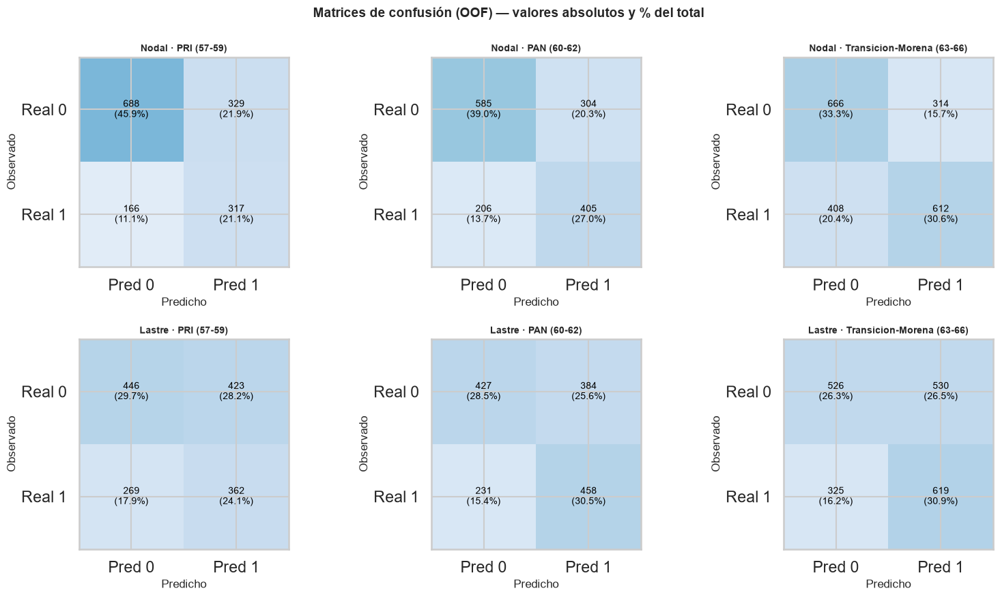

Matriz de confusión — Nodal · PRI (57-59) (absolutos):


,Pred 0,Pred 1
Real 0,688,329
Real 1,166,317


(porcentajes):


,Pred 0,Pred 1
Real 0,45.870,21.930
Real 1,11.070,21.130


In [86]:
# E3  — Matrices de confusión (valores absolutos y porcentajes)
def confusion_frames(y, p, thr=0.5):
    y = np.asarray(y).astype(int); yhat = (np.asarray(p) >= thr).astype(int)
    cm = confusion_matrix(y, yhat, labels=[0, 1])
    idx = ["Real 0", "Real 1"]; col = ["Pred 0", "Pred 1"]
    abs_df = pd.DataFrame(cm, index=idx, columns=col)
    pct_df = pd.DataFrame(cm / cm.sum() * 100, index=idx, columns=col)
    return abs_df, pct_df

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
for ax, m in zip(axes.ravel(), LASSO_MODELS):
    y, p = m["oof"]
    cm = confusion_matrix(y, (p >= 0.5).astype(int), labels=[0, 1])
    pct = cm / cm.sum() * 100
    im = ax.imshow(pct, cmap="Blues", vmin=0, vmax=100)
    for i in range(2):
        for j in range(2):
            ax.text(j, i, f"{cm[i,j]}\n({pct[i,j]:.1f}%)", ha="center",
                    va="center", fontsize=10,
                    color="white" if pct[i, j] > 50 else "black")
    ax.set_xticks([0, 1]); ax.set_xticklabels(["Pred 0", "Pred 1"])
    ax.set_yticks([0, 1]); ax.set_yticklabels(["Real 0", "Real 1"])
    ax.set_title(m["model_id"], fontsize=10, fontweight="bold")
    ax.set_xlabel("Predicho"); ax.set_ylabel("Observado")
fig.suptitle("Matrices de confusión (OOF) — valores absolutos y % del total",
             fontsize=14, fontweight="bold")
plt.tight_layout()
fig.savefig(EVAL_DIR / "eval_confusion_matrices.png", dpi=150, bbox_inches="tight")
plt.show()

# Ejemplo de tablas absolutas/porcentaje para el primer modelo
_abs, _pct = confusion_frames(*LASSO_MODELS[0]["oof"])
print(f"Matriz de confusión — {LASSO_MODELS[0]['model_id']} (absolutos):")
display(_abs)
print("(porcentajes):")
display(_pct.round(2))

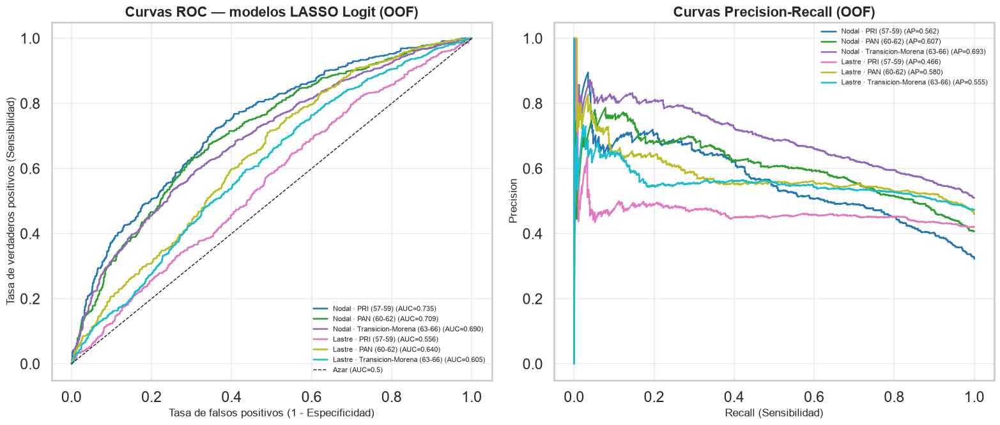

In [87]:
# E4  — Curvas ROC y Precision-Recall
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
_palette = plt.cm.tab10(np.linspace(0, 1, len(LASSO_MODELS)))
for m, c in zip(LASSO_MODELS, _palette):
    y, p = m["oof"]
    try:
        fpr, tpr, _ = roc_curve(y, p)
        axes[0].plot(fpr, tpr, color=c, lw=1.8,
                     label=f"{m['model_id']} (AUC={m['perf']['ROC_AUC']:.3f})")
        prec, rec, _ = precision_recall_curve(y, p)
        axes[1].plot(rec, prec, color=c, lw=1.8,
                     label=f"{m['model_id']} (AP={m['perf']['PR_AUC']:.3f})")
    except Exception as e:
        _warn("curvas ROC/PR", m["model_id"], e)
axes[0].plot([0, 1], [0, 1], "k--", lw=1, label="Azar (AUC=0.5)")
axes[0].set_xlabel("Tasa de falsos positivos (1 - Especificidad)")
axes[0].set_ylabel("Tasa de verdaderos positivos (Sensibilidad)")
axes[0].set_title("Curvas ROC — modelos LASSO Logit (OOF)", fontweight="bold")
axes[0].legend(fontsize=8, loc="lower right")
axes[1].set_xlabel("Recall (Sensibilidad)"); axes[1].set_ylabel("Precision")
axes[1].set_title("Curvas Precision-Recall (OOF)", fontweight="bold")
axes[1].legend(fontsize=8, loc="upper right")
for ax in axes:
    ax.grid(alpha=0.3)
plt.tight_layout()
fig.savefig(EVAL_DIR / "eval_roc_pr_curves.png", dpi=150, bbox_inches="tight")
plt.show()

## Calidad estadística

La *deviance* y los pseudo-R² se calculan sobre las probabilidades **OOF**
(fuera de muestra). El modelo nulo es el de solo intercepto (tasa base).

**AIC/BIC:** no se reportan sobre el modelo LASSO porque la penalización L1
sesga la verosimilitud y hace ambiguos los grados de libertad (los coeficientes
están encogidos hacia cero). Se reutilizan, como referencia comparable, los del
**modelo logístico clásico no penalizado** del Anexo D sobre las mismas
variables seleccionadas.

In [88]:
# E5  — Deviance, pseudo-R² y (AIC/BIC comparables del Anexo D)
def deviance_stats(y, p):
    y = np.asarray(y).astype(int)
    p = np.clip(np.asarray(p, dtype=float), 1e-15, 1 - 1e-15)
    n = len(y); pbar = y.mean()
    ll_model = float(np.sum(y * np.log(p) + (1 - y) * np.log(1 - p)))
    ll_null  = float(np.sum(y * np.log(pbar) + (1 - y) * np.log(1 - pbar)))
    resid_dev = -2 * ll_model; null_dev = -2 * ll_null
    cox = 1 - np.exp((2.0 / n) * (ll_null - ll_model))
    cox_max = 1 - np.exp((2.0 / n) * ll_null)
    return dict(
        NullDeviance=null_dev, ResidualDeviance=resid_dev,
        DevianceReduction=(1 - resid_dev / null_dev) if null_dev != 0 else np.nan,
        LogLikelihood=ll_model,
        McFadden_R2=(1 - ll_model / ll_null) if ll_null != 0 else np.nan,
        CoxSnell_R2=cox,
        Nagelkerke_R2=(cox / cox_max) if cox_max != 0 else np.nan,
        Tjur_R2=float(p[y == 1].mean() - p[y == 0].mean()),
    )

# Lookup de AIC/BIC del Anexo D (no penalizado, comparable) si está disponible
def _aicbic_lookup():
    look = {}
    for tl, var in [("Nodal", "df_logit_nodal_stats"),
                    ("Lastre", "df_logit_lastre_stats")]:
        if var in globals():
            d = globals()[var].set_index("Era")
            for era in ERA_ORDER:
                lbl = ERA_LABELS[era]
                if lbl in d.index:
                    look[(tl, era)] = (d.loc[lbl, "AIC"], d.loc[lbl, "BIC"])
    return look

_aicbic = _aicbic_lookup()
rows_stat = []
for m in LASSO_MODELS:
    y, p = m["oof"]
    st = deviance_stats(y, p)
    m["stat"] = st
    aic, bic = _aicbic.get((m["target_label"], m["era"]), (np.nan, np.nan))
    rows_stat.append(dict(Modelo=m["model_id"], **st,
                          AIC_noPenal=aic, BIC_noPenal=bic))
df_stat = pd.DataFrame(rows_stat).set_index("Modelo").round(4)
print("── Calidad estadística (deviance y pseudo-R², OOF) ──")
if not _aicbic:
    warnings.warn("AIC/BIC del Anexo D no disponibles; columnas AIC/BIC en NaN.")
display(df_stat)

── Calidad estadística (deviance y pseudo-R², OOF) ──


,NullDeviance,ResidualDeviance,DevianceReduction,LogLikelihood,McFadden_R2,CoxSnell_R2,Nagelkerke_R2,Tjur_R2,AIC_noPenal,BIC_noPenal
Modelo,,,,,,,,,,
Nodal · PRI (57-59),1885.103,1825.138,0.032,-912.569,0.032,0.039,0.055,0.165,inf,inf
Nodal · PAN (60-62),2027.620,1890.037,0.068,-945.019,0.068,0.088,0.118,0.137,1791.300,1908.200
Nodal · Transicion-Morena (63-66),2771.789,2546.108,0.081,-1273.054,0.081,0.107,0.142,0.117,2490.200,2630.200
Lastre · PRI (57-59),2041.519,2080.077,-0.019,-1040.039,-0.019,-0.026,-0.035,0.019,1981.100,2092.700
Lastre · PAN (60-62),2069.508,1971.791,0.047,-985.895,0.047,0.063,0.084,0.075,1926.700,2064.900
Lastre · Transicion-Morena (63-66),2766.313,2708.014,0.021,-1354.007,0.021,0.029,0.038,0.046,2659.800,2805.500


## Efecto de las variables

In [89]:
# E6  — Tablas de coeficientes y Odds Ratios (por modelo)
def coefficient_table(model_rec):
    """Coeficientes (escala estandarizada), |coef|, OR y % de cambio del odds.

    Los coeficientes provienen del paso final `lr` del pipeline SFM; están en
    escala de desviaciones estándar (por el StandardScaler previo), por lo que
    el OR representa el cambio multiplicativo del odds por +1 SD de la variable.
    """
    lr = model_rec["model"].named_steps["lr"]
    feats = model_rec["selected"]
    coefs = np.asarray(lr.coef_).ravel()
    tbl = pd.DataFrame({
        "Variable": feats, "Coeficiente": coefs, "|Coef|": np.abs(coefs),
        "OddsRatio": np.exp(coefs), "Cambio%Odds": (np.exp(coefs) - 1) * 100,
    }).sort_values("|Coef|", ascending=False).reset_index(drop=True)
    return tbl.round(4)

coef_tables = {}
for m in LASSO_MODELS:
    tbl = coefficient_table(m)
    coef_tables[m["model_id"]] = tbl
    m["coef_table"] = tbl
print(f"── Tabla de coeficientes — {LASSO_MODELS[0]['model_id']} ──")
display(coef_tables[LASSO_MODELS[0]["model_id"]].head(15))

── Tabla de coeficientes — Nodal · PRI (57-59) ──


,Variable,Coeficiente,|Coef|,OddsRatio,Cambio%Odds
0,area_Derecho,0.420,0.420,1.521,52.136
1,area_Económico-Financiera,0.271,0.271,1.311,31.123
2,fue_secretario_cargo,0.218,0.218,1.244,24.390
3,univ_privada,0.200,0.200,1.221,22.090
4,n_organos_gobierno,0.191,0.191,1.210,21.030
5,fue_subsecretario,0.182,0.182,1.199,19.908
6,fue_delegado,0.170,0.170,1.185,18.535
7,reg_SUR,-0.159,0.159,0.853,-14.683
8,legislatura_num,0.155,0.155,1.168,16.785
9,area_Ciencias Políticas y Sociales,0.133,0.133,1.142,14.164


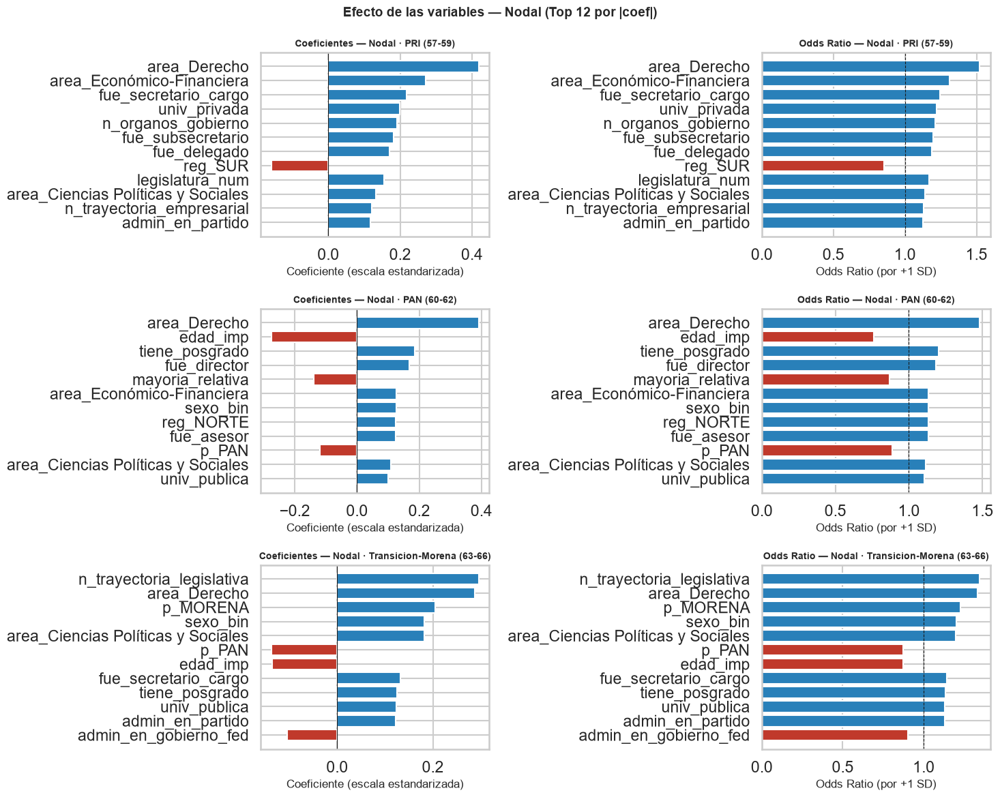

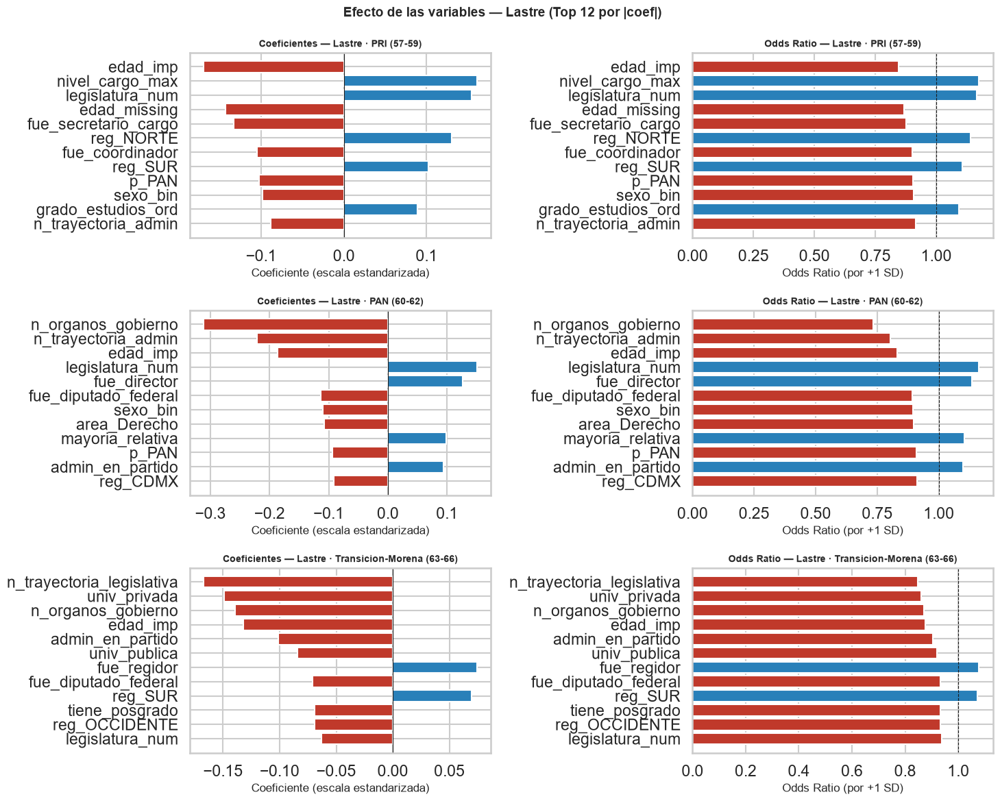

In [90]:
# E7  — Visualización de coeficientes y Odds Ratios (barras horizontales)
def plot_coef_or(model_rec, top_n=12, ax_coef=None, ax_or=None):
    tbl = model_rec["coef_table"].head(top_n).iloc[::-1]
    colors = ["#c0392b" if c < 0 else "#2980b9" for c in tbl["Coeficiente"]]
    ax_coef.barh(tbl["Variable"], tbl["Coeficiente"], color=colors)
    ax_coef.axvline(0, color="k", lw=0.8)
    ax_coef.set_title(f"Coeficientes — {model_rec['model_id']}", fontsize=10,
                      fontweight="bold")
    ax_coef.set_xlabel("Coeficiente (escala estandarizada)")
    ax_or.barh(tbl["Variable"], tbl["OddsRatio"], color=colors)
    ax_or.axvline(1, color="k", lw=0.8, ls="--")
    ax_or.set_title(f"Odds Ratio — {model_rec['model_id']}", fontsize=10,
                    fontweight="bold")
    ax_or.set_xlabel("Odds Ratio (por +1 SD)")

for tl in ["Nodal", "Lastre"]:
    fam = [m for m in LASSO_MODELS if m["target_label"] == tl]
    fig, axes = plt.subplots(len(fam), 2, figsize=(15, 4 * len(fam)))
    for row, m in zip(axes, fam):
        plot_coef_or(m, ax_coef=row[0], ax_or=row[1])
    fig.suptitle(f"Efecto de las variables — {tl} (Top 12 por |coef|)",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    fig.savefig(EVAL_DIR / f"eval_coef_or_{tl.lower()}.png", dpi=140,
                bbox_inches="tight")
    plt.show()

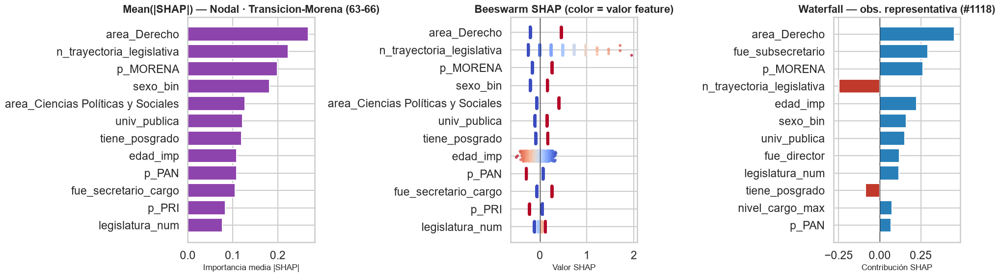

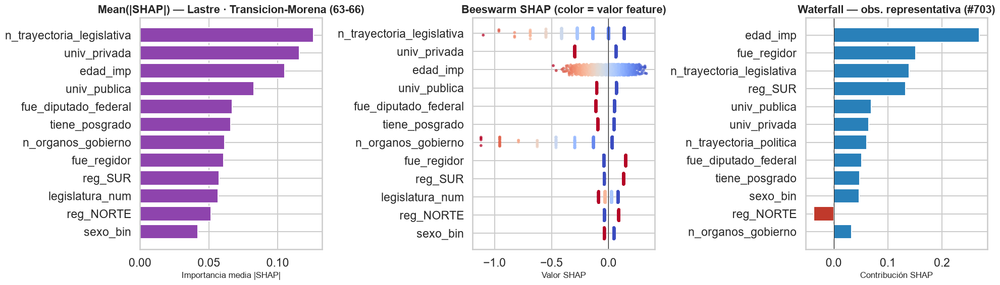

In [91]:
# E8  — SHAP (reutilizando shap_nodal / shap_lastre)
def shap_panels(model_rec, top_n=12):
    """Beeswarm, mean(|SHAP|) y waterfall de una observación representativa,
    reutilizando los valores SHAP ya calculados."""
    sv_full, X = model_rec["shap"]
    feats = model_rec["selected"]
    idx = [FEAT_COLS.index(f) for f in feats]
    sv = sv_full[:, idx]
    Xs = X.iloc[:, idx]
    mean_abs = np.abs(sv).mean(axis=0)
    order = np.argsort(mean_abs)[::-1][:top_n]

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    # (1) mean(|SHAP|) — barra / summary
    o2 = order[::-1]
    axes[0].barh([feats[i] for i in o2], mean_abs[o2], color="#8e44ad")
    axes[0].set_title(f"Mean(|SHAP|) — {model_rec['model_id']}", fontweight="bold")
    axes[0].set_xlabel("Importancia media |SHAP|")
    # (2) Beeswarm manual (dispersión coloreada por valor de la feature)
    for rank, i in enumerate(order):
        vals = sv[:, i]
        fv = Xs.iloc[:, i].values.astype(float)
        fv_n = (fv - fv.min()) / (np.ptp(fv) + 1e-9)
        jitter = (np.random.rand(len(vals)) - 0.5) * 0.6
        axes[1].scatter(vals, np.full(len(vals), rank) + jitter, c=fv_n,
                        cmap="coolwarm", s=8, alpha=0.6)
    axes[1].set_yticks(range(len(order)))
    axes[1].set_yticklabels([feats[i] for i in order]); axes[1].invert_yaxis()
    axes[1].axvline(0, color="k", lw=0.8)
    axes[1].set_title("Beeswarm SHAP (color = valor feature)", fontweight="bold")
    axes[1].set_xlabel("Valor SHAP")
    # (3) Waterfall de la observación con mayor probabilidad predicha
    y, p = model_rec["oof"]
    rep = int(np.argmax(p))
    contrib = sv[rep]; ordc = np.argsort(np.abs(contrib))[::-1][:top_n][::-1]
    colors = ["#c0392b" if contrib[i] < 0 else "#2980b9" for i in ordc]
    axes[2].barh([feats[i] for i in ordc], [contrib[i] for i in ordc],
                 color=colors)
    axes[2].axvline(0, color="k", lw=0.8)
    axes[2].set_title(f"Waterfall — obs. representativa (#{rep})",
                      fontweight="bold")
    axes[2].set_xlabel("Contribución SHAP")
    plt.tight_layout()
    fig.savefig(EVAL_DIR / f"eval_shap_{model_rec['era']}_{model_rec['target_label'].lower()}.png",
                dpi=130, bbox_inches="tight")
    plt.show()

# Un panel SHAP representativo por familia (era 3) para no saturar; el resto
# queda disponible vía la función shap_panels(m).
for m in LASSO_MODELS:
    if m["era"] == "ERA_3_TRANSMOR":
        try:
            shap_panels(m)
        except Exception as e:
            _warn("SHAP panels", m["model_id"], e)

## Interpretación del proceso de selección

── Parámetros de regularización LASSO por modelo ──


,lambda_opt,lambda_min,lambda_1se,AUC_opt,n_vars_opt
Modelo,,,,,
Nodal · PRI (57-59),12.690,0.010,28.072,0.733,34
Nodal · PAN (60-62),18.874,0.010,62.102,0.714,34
Nodal · Transicion-Morena (63-66),8.532,0.010,41.753,0.695,49
Lastre · PRI (57-59),0.033,0.010,28.072,0.568,56
Lastre · PAN (60-62),3.857,0.010,41.753,0.651,48
Lastre · Transicion-Morena (63-66),18.874,0.010,41.753,0.608,29


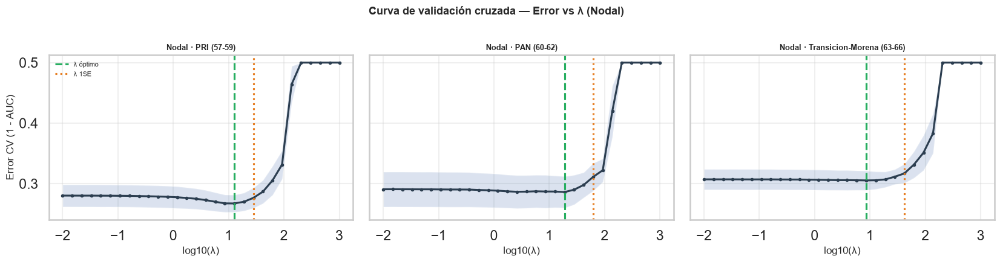

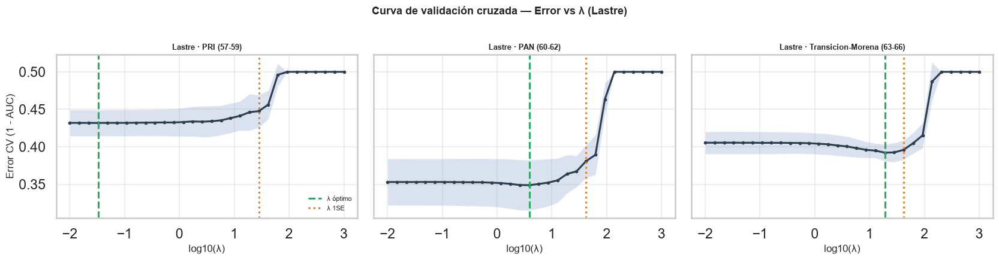

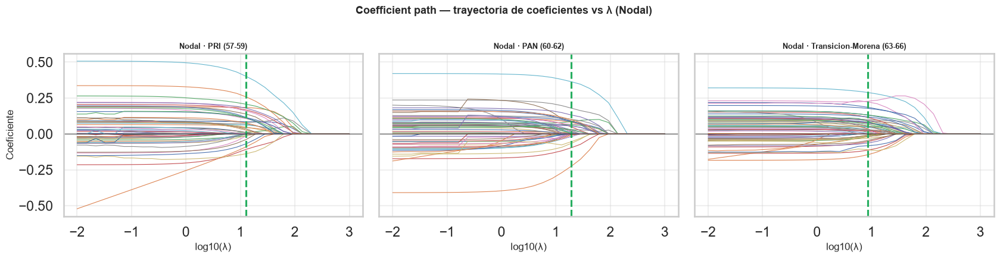

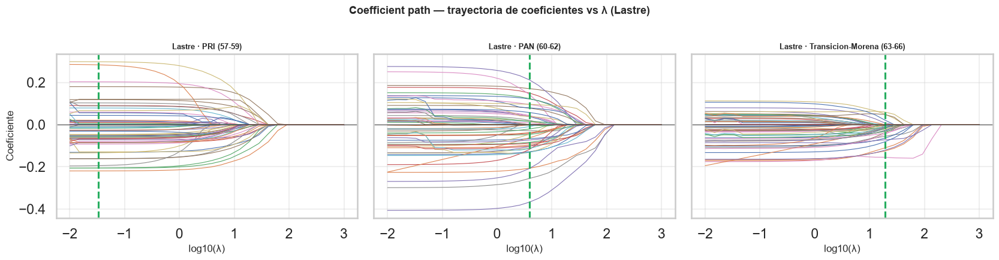

In [92]:
# E9  — Ruta de regularización: lambda óptimo, curva CV y coefficient path
def lasso_path_analysis(target_col, era, n_lambda=30, k=EVAL_K):
    """Ajusta L1-LR sobre una malla de lambda (=1/C) y calcula, por CV agrupada,
    la curva de error, el lambda óptimo, lambda 1SE, y la trayectoria de coefs."""
    X, y = get_Xy(era, target_col)
    groups = get_groups(era)
    Xs = StandardScaler().fit_transform(X)
    Cs = np.logspace(-3, 2, n_lambda)          # C = 1/lambda
    lambdas = 1.0 / Cs
    cv = StratifiedGroupKFold(n_splits=k, shuffle=True, random_state=EVAL_SEED)
    mean_auc, std_auc, n_nonzero, coef_path = [], [], [], []
    for C in Cs:
        fold_auc = []
        for tr, te in cv.split(Xs, y, groups):
            lr = LogisticRegression(l1_ratio=1, solver="liblinear", C=C,
                                    class_weight="balanced", max_iter=3000,
                                    random_state=EVAL_SEED)
            try:
                lr.fit(Xs[tr], y.iloc[tr])
                if len(np.unique(y.iloc[te])) < 2:
                    continue
                fold_auc.append(roc_auc_score(
                    y.iloc[te], lr.predict_proba(Xs[te])[:, 1]))
            except Exception:
                continue
        mean_auc.append(np.mean(fold_auc) if fold_auc else np.nan)
        std_auc.append(np.std(fold_auc) if fold_auc else np.nan)
        lr_full = LogisticRegression(l1_ratio=1, solver="liblinear", C=C,
                                     class_weight="balanced", max_iter=3000,
                                     random_state=EVAL_SEED).fit(Xs, y)
        coef = lr_full.coef_.ravel()
        n_nonzero.append(int(np.sum(np.abs(coef) > 1e-8)))
        coef_path.append(coef)
    mean_auc = np.array(mean_auc); std_auc = np.array(std_auc)
    best = int(np.nanargmax(mean_auc))
    thr = mean_auc[best] - std_auc[best]           # regla 1SE (sobre AUC)
    within = np.where(mean_auc >= thr)[0]
    idx_1se = int(within[np.argmax(lambdas[within])])  # mayor lambda dentro de 1SE
    return dict(
        lambdas=lambdas, Cs=Cs, mean_auc=mean_auc, std_auc=std_auc,
        n_nonzero=np.array(n_nonzero), coef_path=np.array(coef_path),
        lambda_opt=lambdas[best], lambda_min=lambdas.min(),
        lambda_1se=lambdas[idx_1se], idx_opt=best, idx_1se=idx_1se,
        auc_opt=mean_auc[best], feats=list(X.columns),
    )

lasso_paths = {}
rows_lambda = []
for m in LASSO_MODELS:
    key = (m["target_col"], m["era"])
    if key not in lasso_paths:
        lasso_paths[key] = lasso_path_analysis(*key)
    pa = lasso_paths[key]; m["path"] = pa
    rows_lambda.append(dict(
        Modelo=m["model_id"], lambda_opt=pa["lambda_opt"],
        lambda_min=pa["lambda_min"], lambda_1se=pa["lambda_1se"],
        AUC_opt=pa["auc_opt"], n_vars_opt=pa["n_nonzero"][pa["idx_opt"]]))
df_lambda = pd.DataFrame(rows_lambda).set_index("Modelo").round(4)
print("── Parámetros de regularización LASSO por modelo ──")
display(df_lambda)

# Curvas CV (error vs lambda) — un subplot por modelo
for tl in ["Nodal", "Lastre"]:
    fam = [m for m in LASSO_MODELS if m["target_label"] == tl]
    fig, axes = plt.subplots(1, 3, figsize=(17, 4.5), sharey=True)
    for ax, m in zip(axes, fam):
        pa = m["path"]
        ax.plot(np.log10(pa["lambdas"]), 1 - pa["mean_auc"], "-o", ms=3,
                color="#2c3e50")
        ax.fill_between(np.log10(pa["lambdas"]),
                        1 - pa["mean_auc"] - pa["std_auc"],
                        1 - pa["mean_auc"] + pa["std_auc"], alpha=0.2)
        ax.axvline(np.log10(pa["lambda_opt"]), color="#27ae60", ls="--",
                   label="λ óptimo")
        ax.axvline(np.log10(pa["lambda_1se"]), color="#e67e22", ls=":",
                   label="λ 1SE")
        ax.set_title(m["model_id"], fontsize=9, fontweight="bold")
        ax.set_xlabel("log10(λ)"); ax.grid(alpha=0.3)
    axes[0].set_ylabel("Error CV (1 - AUC)"); axes[0].legend(fontsize=8)
    fig.suptitle(f"Curva de validación cruzada — Error vs λ ({tl})",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    fig.savefig(EVAL_DIR / f"eval_cv_lambda_{tl.lower()}.png", dpi=140,
                bbox_inches="tight")
    plt.show()

# Coefficient path — un subplot por modelo
for tl in ["Nodal", "Lastre"]:
    fam = [m for m in LASSO_MODELS if m["target_label"] == tl]
    fig, axes = plt.subplots(1, 3, figsize=(17, 4.5), sharey=True)
    for ax, m in zip(axes, fam):
        pa = m["path"]
        for j in range(pa["coef_path"].shape[1]):
            ax.plot(np.log10(pa["lambdas"]), pa["coef_path"][:, j], lw=0.8)
        ax.axvline(np.log10(pa["lambda_opt"]), color="#27ae60", ls="--")
        ax.axhline(0, color="k", lw=0.6)
        ax.set_title(m["model_id"], fontsize=9, fontweight="bold")
        ax.set_xlabel("log10(λ)"); ax.grid(alpha=0.3)
    axes[0].set_ylabel("Coeficiente")
    fig.suptitle(f"Coefficient path — trayectoria de coeficientes vs λ ({tl})",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    fig.savefig(EVAL_DIR / f"eval_coefpath_{tl.lower()}.png", dpi=140,
                bbox_inches="tight")
    plt.show()

In [93]:
# E10  — Sparsity (parsimonia)
rows_sparse = []
for m in LASSO_MODELS:
    total = len(FEAT_COLS); ret = len(m["selected"]); elim = total - ret
    m["sparsity"] = dict(total=total, retenidas=ret, eliminadas=elim,
                         pct_ret=100 * ret / total, pct_elim=100 * elim / total)
    rows_sparse.append(dict(Modelo=m["model_id"], Total=total, Retenidas=ret,
                            Eliminadas=elim,
                            **{"%Retenido": 100 * ret / total,
                               "%Eliminado": 100 * elim / total}))
df_sparse = pd.DataFrame(rows_sparse).set_index("Modelo").round(1)
print("── Sparsity (variables retenidas vs eliminadas por LASSO) ──")
display(df_sparse)

── Sparsity (variables retenidas vs eliminadas por LASSO) ──


,Total,Retenidas,Eliminadas,%Retenido,%Eliminado
Modelo,,,,,
Nodal · PRI (57-59),62,22,40,35.500,64.500
Nodal · PAN (60-62),62,21,41,33.900,66.100
Nodal · Transicion-Morena (63-66),62,24,38,38.700,61.300
Lastre · PRI (57-59),62,20,42,32.300,67.700
Lastre · PAN (60-62),62,25,37,40.300,59.700
Lastre · Transicion-Morena (63-66),62,25,37,40.300,59.700


── Frecuencia de selección (Bootstrap, B=100) — Nodal · PRI (57-59) ──


,Variable,FreqSeleccion,CoefMedio,CoefSD
0,fue_secretario_cargo,1.000,0.228,0.080
1,fue_subsecretario,1.000,0.172,0.052
2,area_Derecho,1.000,0.441,0.083
3,area_Económico-Financiera,1.000,0.271,0.069
4,n_organos_gobierno,1.000,0.194,0.061
5,univ_privada,0.990,0.168,0.073
6,admin_en_partido,0.990,0.119,0.054
7,fue_delegado,0.990,0.164,0.060
8,area_Ciencias Políticas y Sociales,0.990,0.126,0.059
9,p_PVEM,0.970,0.123,0.059


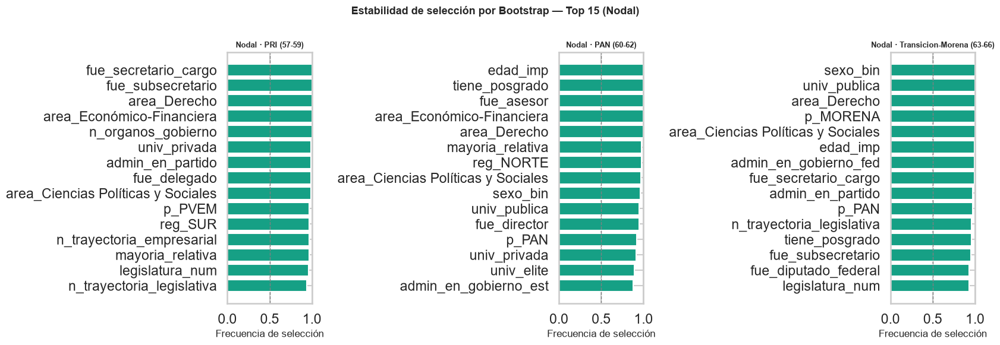

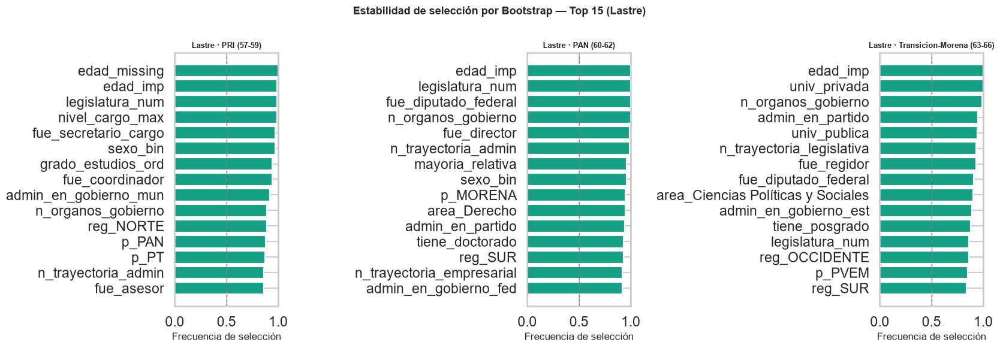

In [94]:
# E11  — Estabilidad de selección por Bootstrap
def bootstrap_selection(target_col, era, B=BOOTSTRAP_N):
    """Frecuencia de selección, media y sd de coeficientes vía B remuestreos.
    Un coeficiente 'seleccionado' = |coef| > 1e-8 en el L1 full sobre el bootstrap."""
    X, y = get_Xy(era, target_col)
    Xs = StandardScaler().fit_transform(X); yv = y.values
    n = len(yv); feats = list(X.columns)
    counts = np.zeros(len(feats)); coef_sum = np.zeros(len(feats))
    coef_sq = np.zeros(len(feats))
    rng = np.random.RandomState(EVAL_SEED)
    done = 0
    for _ in range(B):
        idx = rng.randint(0, n, n)
        if len(np.unique(yv[idx])) < 2:
            continue
        lr = LogisticRegression(l1_ratio=1, solver="liblinear", C=0.1,
                                class_weight="balanced", max_iter=3000,
                                random_state=EVAL_SEED)
        try:
            lr.fit(Xs[idx], yv[idx])
        except Exception:
            continue
        coef = lr.coef_.ravel()
        counts += (np.abs(coef) > 1e-8); coef_sum += coef; coef_sq += coef ** 2
        done += 1
    freq = counts / max(done, 1)
    mean_c = coef_sum / max(done, 1)
    sd_c = np.sqrt(np.maximum(coef_sq / max(done, 1) - mean_c ** 2, 0))
    tbl = pd.DataFrame({
        "Variable": feats, "FreqSeleccion": freq,
        "CoefMedio": mean_c, "CoefSD": sd_c,
    }).sort_values("FreqSeleccion", ascending=False).reset_index(drop=True)
    return tbl.round(4), done

boot_tables = {}
for m in LASSO_MODELS:
    tbl, done = bootstrap_selection(m["target_col"], m["era"])
    boot_tables[m["model_id"]] = tbl; m["boot"] = tbl
    if done < BOOTSTRAP_N:
        warnings.warn(f"[{m['model_id']}] bootstrap efectivo: {done}/{BOOTSTRAP_N} "
                      "réplicas válidas (resto descartadas por una sola clase).")
print(f"── Frecuencia de selección (Bootstrap, B={BOOTSTRAP_N}) — "
      f"{LASSO_MODELS[0]['model_id']} ──")
display(boot_tables[LASSO_MODELS[0]["model_id"]].head(15))

# Gráfico de barras de frecuencia de selección
for tl in ["Nodal", "Lastre"]:
    fam = [m for m in LASSO_MODELS if m["target_label"] == tl]
    fig, axes = plt.subplots(1, 3, figsize=(17, 6), sharex=True)
    for ax, m in zip(axes, fam):
        top = m["boot"].head(15).iloc[::-1]
        ax.barh(top["Variable"], top["FreqSeleccion"], color="#16a085")
        ax.axvline(0.5, color="grey", ls="--", lw=1)
        ax.set_title(m["model_id"], fontsize=9, fontweight="bold")
        ax.set_xlabel("Frecuencia de selección"); ax.set_xlim(0, 1)
    fig.suptitle(f"Estabilidad de selección por Bootstrap — Top 15 ({tl})",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    fig.savefig(EVAL_DIR / f"eval_bootstrap_{tl.lower()}.png", dpi=140,
                bbox_inches="tight")
    plt.show()

## Reporte consolidado

In [95]:
# E12  — Tabla maestra + exportación CSV/Excel
rows_master = []
for m in LASSO_MODELS:
    perf, stat, sp, pa = m["perf"], m["stat"], m["sparsity"], m["path"]
    rows_master.append({
        "Modelo": m["model_id"],
        "Accuracy": perf["Accuracy"], "Precision": perf["Precision"],
        "Recall": perf["Recall"], "Specificity": perf["Specificity"],
        "F1": perf["F1"], "ROC_AUC": perf["ROC_AUC"], "PR_AUC": perf["PR_AUC"],
        "LogLoss": perf["LogLoss"], "Brier": perf["Brier"],
        "McFadden_R2": stat["McFadden_R2"], "Tjur_R2": stat["Tjur_R2"],
        "NullDeviance": stat["NullDeviance"],
        "ResidualDeviance": stat["ResidualDeviance"],
        "DevianceReduction": stat["DevianceReduction"],
        "VarsRetenidas": sp["retenidas"], "Sparsity_%Elim": sp["pct_elim"],
        "Lambda_opt": pa["lambda_opt"],
    })
df_master = pd.DataFrame(rows_master).set_index("Modelo").round(4)
print("── Reporte consolidado (tabla maestra) ──")
display(df_master)

_csv = EVAL_DIR / "reporte_consolidado_lasso_logit.csv"
_xlsx = EVAL_DIR / "reporte_consolidado_lasso_logit.xlsx"
df_master.to_csv(_csv)
try:
    with pd.ExcelWriter(_xlsx, engine="openpyxl") as xw:
        df_master.to_excel(xw, sheet_name="Consolidado")
        df_perf.to_excel(xw, sheet_name="Desempeno")
        df_stat.to_excel(xw, sheet_name="Estadistica")
        df_sparse.to_excel(xw, sheet_name="Sparsity")
        df_lambda.to_excel(xw, sheet_name="Lambda")
    print(f"Exportado: {_csv.name} y {_xlsx.name}")
except Exception as e:
    _warn("exportación Excel", "reporte", e)
    print(f"Exportado solo CSV: {_csv.name}")

── Reporte consolidado (tabla maestra) ──


,Accuracy,Precision,Recall,Specificity,F1,ROC_AUC,PR_AUC,LogLoss,Brier,McFadden_R2,Tjur_R2,NullDeviance,ResidualDeviance,DevianceReduction,VarsRetenidas,Sparsity_%Elim,Lambda_opt
Modelo,,,,,,,,,,,,,,,,,
Nodal · PRI (57-59),0.670,0.491,0.656,0.676,0.562,0.735,0.562,0.608,0.209,0.032,0.165,1885.103,1825.138,0.032,22,64.516,12.690
Nodal · PAN (60-62),0.660,0.571,0.663,0.658,0.614,0.709,0.607,0.630,0.219,0.068,0.137,2027.620,1890.037,0.068,21,66.129,18.874
Nodal · Transicion-Morena (63-66),0.639,0.661,0.600,0.680,0.629,0.690,0.693,0.636,0.223,0.081,0.117,2771.789,2546.108,0.081,24,61.290,8.532
Lastre · PRI (57-59),0.539,0.461,0.574,0.513,0.511,0.556,0.466,0.693,0.250,-0.019,0.019,2041.519,2080.077,-0.019,20,67.742,0.033
Lastre · PAN (60-62),0.590,0.544,0.665,0.526,0.598,0.640,0.580,0.657,0.233,0.047,0.075,2069.508,1971.791,0.047,25,59.677,3.857
Lastre · Transicion-Morena (63-66),0.573,0.539,0.656,0.498,0.592,0.605,0.555,0.677,0.242,0.021,0.046,2766.313,2708.014,0.021,25,59.677,18.874


Exportado: reporte_consolidado_lasso_logit.csv y reporte_consolidado_lasso_logit.xlsx


In [96]:
# E13  — Interpretación automática en Markdown por modelo
from IPython.display import Markdown

def interpret_model(m):
    perf, stat, sp, pa = m["perf"], m["stat"], m["sparsity"], m["path"]
    ct = m["coef_table"]
    pos = ct[ct["Coeficiente"] > 0].head(3)
    neg = ct[ct["Coeficiente"] < 0].head(3)
    top_or = ct.reindex(ct["OddsRatio"].sub(1).abs().sort_values(
        ascending=False).index).head(3)
    auc = perf["ROC_AUC"]
    cal = ("excelente" if auc >= 0.8 else "aceptable" if auc >= 0.7
           else "moderada" if auc >= 0.6 else "limitada")
    def _lst(df):
        return "; ".join(f"`{r.Variable}` (β={r.Coeficiente:+.3f}, "
                         f"OR={r.OddsRatio:.2f})" for r in df.itertuples())
    md = f"""
#### Interpretación automática — {m['model_id']}

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *{cal}*
(ROC-AUC = {auc:.3f}; PR-AUC = {perf['PR_AUC']:.3f}) sobre datos fuera de muestra,
con *recall* de {perf['Recall']:.2f} y especificidad de {perf['Specificity']:.2f}.
La calibración probabilística es razonable (Brier = {perf['Brier']:.3f};
Log-Loss = {perf['LogLoss']:.3f}).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del {stat['DevianceReduction']*100:.1f}% (McFadden R² = {stat['McFadden_R2']:.3f};
Tjur R² = {stat['Tjur_R2']:.3f}), lo que indica un ajuste
{'sustantivo' if stat['McFadden_R2'] > 0.2 else 'modesto pero informativo'}
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** {_lst(pos) or '—'}.

**4. Variables con mayor efecto negativo.** {_lst(neg) or '—'}.

**5. Odds Ratios más relevantes.** {_lst(top_or) or '—'}. Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De {sp['total']} variables candidatas, la penalización L1
retuvo {sp['retenidas']} y eliminó {sp['eliminadas']} ({sp['pct_elim']:.0f}%),
con un λ óptimo de {pa['lambda_opt']:.3g}.

**7. Parsimonia.** El modelo logra una solución
{'muy parsimoniosa' if sp['pct_elim'] > 60 else 'parsimoniosa' if sp['pct_elim'] > 30 else 'poco restrictiva'},
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
{'útil y recomendable' if auc >= 0.7 else 'de utilidad moderada'} para caracterizar
el fenómeno estudiado en esta era: combina discriminación {cal} con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.
"""
    return md.strip()

_md_all = []
for m in LASSO_MODELS:
    try:
        _md_all.append(interpret_model(m))
    except Exception as e:
        _warn("interpretación", m["model_id"], e)
_full_md = "\n\n---\n\n".join(_md_all)
(EVAL_DIR / "interpretacion_lasso_logit.md").write_text(_full_md, encoding="utf-8")
try:
    display(Markdown(_full_md))
except Exception:
    print(_full_md[:1500])
print("Interpretaciones Markdown generadas y guardadas.")

#### Interpretación automática — Nodal · PRI (57-59)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *aceptable*
(ROC-AUC = 0.735; PR-AUC = 0.562) sobre datos fuera de muestra,
con *recall* de 0.66 y especificidad de 0.68.
La calibración probabilística es razonable (Brier = 0.209;
Log-Loss = 0.608).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del 3.2% (McFadden R² = 0.032;
Tjur R² = 0.165), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `area_Derecho` (β=+0.420, OR=1.52); `area_Económico-Financiera` (β=+0.271, OR=1.31); `fue_secretario_cargo` (β=+0.218, OR=1.24).

**4. Variables con mayor efecto negativo.** `reg_SUR` (β=-0.159, OR=0.85); `admin_en_sindicato` (β=-0.110, OR=0.90); `mayoria_relativa` (β=-0.103, OR=0.90).

**5. Odds Ratios más relevantes.** `area_Derecho` (β=+0.420, OR=1.52); `area_Económico-Financiera` (β=+0.271, OR=1.31); `fue_secretario_cargo` (β=+0.218, OR=1.24). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 22 y eliminó 40 (65%),
con un λ óptimo de 12.7.

**7. Parsimonia.** El modelo logra una solución
muy parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
útil y recomendable para caracterizar
el fenómeno estudiado en esta era: combina discriminación aceptable con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

---

#### Interpretación automática — Nodal · PAN (60-62)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *aceptable*
(ROC-AUC = 0.709; PR-AUC = 0.607) sobre datos fuera de muestra,
con *recall* de 0.66 y especificidad de 0.66.
La calibración probabilística es razonable (Brier = 0.219;
Log-Loss = 0.630).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del 6.8% (McFadden R² = 0.068;
Tjur R² = 0.137), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `area_Derecho` (β=+0.392, OR=1.48); `tiene_posgrado` (β=+0.185, OR=1.20); `fue_director` (β=+0.168, OR=1.18).

**4. Variables con mayor efecto negativo.** `edad_imp` (β=-0.276, OR=0.76); `mayoria_relativa` (β=-0.139, OR=0.87); `p_PAN` (β=-0.119, OR=0.89).

**5. Odds Ratios más relevantes.** `area_Derecho` (β=+0.392, OR=1.48); `edad_imp` (β=-0.276, OR=0.76); `tiene_posgrado` (β=+0.185, OR=1.20). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 21 y eliminó 41 (66%),
con un λ óptimo de 18.9.

**7. Parsimonia.** El modelo logra una solución
muy parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
útil y recomendable para caracterizar
el fenómeno estudiado en esta era: combina discriminación aceptable con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

---

#### Interpretación automática — Nodal · Transicion-Morena (63-66)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *moderada*
(ROC-AUC = 0.690; PR-AUC = 0.693) sobre datos fuera de muestra,
con *recall* de 0.60 y especificidad de 0.68.
La calibración probabilística es razonable (Brier = 0.223;
Log-Loss = 0.637).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del 8.1% (McFadden R² = 0.081;
Tjur R² = 0.117), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `n_trayectoria_legislativa` (β=+0.297, OR=1.35); `area_Derecho` (β=+0.287, OR=1.33); `p_MORENA` (β=+0.205, OR=1.23).

**4. Variables con mayor efecto negativo.** `p_PAN` (β=-0.138, OR=0.87); `edad_imp` (β=-0.136, OR=0.87); `admin_en_gobierno_fed` (β=-0.105, OR=0.90).

**5. Odds Ratios más relevantes.** `n_trayectoria_legislativa` (β=+0.297, OR=1.35); `area_Derecho` (β=+0.287, OR=1.33); `p_MORENA` (β=+0.205, OR=1.23). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 24 y eliminó 38 (61%),
con un λ óptimo de 8.53.

**7. Parsimonia.** El modelo logra una solución
muy parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
de utilidad moderada para caracterizar
el fenómeno estudiado en esta era: combina discriminación moderada con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

---

#### Interpretación automática — Lastre · PRI (57-59)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *limitada*
(ROC-AUC = 0.556; PR-AUC = 0.466) sobre datos fuera de muestra,
con *recall* de 0.57 y especificidad de 0.51.
La calibración probabilística es razonable (Brier = 0.250;
Log-Loss = 0.693).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del -1.9% (McFadden R² = -0.019;
Tjur R² = 0.019), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `nivel_cargo_max` (β=+0.161, OR=1.17); `legislatura_num` (β=+0.154, OR=1.17); `reg_NORTE` (β=+0.131, OR=1.14).

**4. Variables con mayor efecto negativo.** `edad_imp` (β=-0.170, OR=0.84); `edad_missing` (β=-0.143, OR=0.87); `fue_secretario_cargo` (β=-0.133, OR=0.88).

**5. Odds Ratios más relevantes.** `nivel_cargo_max` (β=+0.161, OR=1.17); `legislatura_num` (β=+0.154, OR=1.17); `edad_imp` (β=-0.170, OR=0.84). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 20 y eliminó 42 (68%),
con un λ óptimo de 0.0329.

**7. Parsimonia.** El modelo logra una solución
muy parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
de utilidad moderada para caracterizar
el fenómeno estudiado en esta era: combina discriminación limitada con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

---

#### Interpretación automática — Lastre · PAN (60-62)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *moderada*
(ROC-AUC = 0.640; PR-AUC = 0.580) sobre datos fuera de muestra,
con *recall* de 0.66 y especificidad de 0.53.
La calibración probabilística es razonable (Brier = 0.233;
Log-Loss = 0.657).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del 4.7% (McFadden R² = 0.047;
Tjur R² = 0.075), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `legislatura_num` (β=+0.151, OR=1.16); `fue_director` (β=+0.127, OR=1.14); `mayoria_relativa` (β=+0.098, OR=1.10).

**4. Variables con mayor efecto negativo.** `n_organos_gobierno` (β=-0.311, OR=0.73); `n_trayectoria_admin` (β=-0.221, OR=0.80); `edad_imp` (β=-0.187, OR=0.83).

**5. Odds Ratios más relevantes.** `n_organos_gobierno` (β=-0.311, OR=0.73); `n_trayectoria_admin` (β=-0.221, OR=0.80); `edad_imp` (β=-0.187, OR=0.83). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 25 y eliminó 37 (60%),
con un λ óptimo de 3.86.

**7. Parsimonia.** El modelo logra una solución
parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
de utilidad moderada para caracterizar
el fenómeno estudiado en esta era: combina discriminación moderada con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

---

#### Interpretación automática — Lastre · Transicion-Morena (63-66)

**1. Calidad predictiva.** El modelo alcanza una capacidad discriminante *moderada*
(ROC-AUC = 0.605; PR-AUC = 0.555) sobre datos fuera de muestra,
con *recall* de 0.66 y especificidad de 0.50.
La calibración probabilística es razonable (Brier = 0.242;
Log-Loss = 0.677).

**2. Calidad estadística.** La reducción de *deviance* respecto al modelo nulo es
del 2.1% (McFadden R² = 0.021;
Tjur R² = 0.046), lo que indica un ajuste
modesto pero informativo
en el contexto de datos transversales de ciencia política.

**3. Variables con mayor efecto positivo.** `fue_regidor` (β=+0.074, OR=1.08); `reg_SUR` (β=+0.070, OR=1.07); `reg_NORTE` (β=+0.057, OR=1.06).

**4. Variables con mayor efecto negativo.** `n_trayectoria_legislativa` (β=-0.167, OR=0.85); `univ_privada` (β=-0.149, OR=0.86); `n_organos_gobierno` (β=-0.140, OR=0.87).

**5. Odds Ratios más relevantes.** `n_trayectoria_legislativa` (β=-0.167, OR=0.85); `univ_privada` (β=-0.149, OR=0.86); `n_organos_gobierno` (β=-0.140, OR=0.87). Cada OR expresa el
cambio multiplicativo del *odds* de pertenencia por un incremento de una
desviación estándar en la variable.

**6. Selección LASSO.** De 62 variables candidatas, la penalización L1
retuvo 25 y eliminó 37 (60%),
con un λ óptimo de 18.9.

**7. Parsimonia.** El modelo logra una solución
parsimoniosa,
concentrando la señal predictiva en un subconjunto reducido de predictores
teóricamente interpretables.

**8. Conclusión.** El modelo LASSO Logit resulta
de utilidad moderada para caracterizar
el fenómeno estudiado en esta era: combina discriminación moderada con una estructura
parsimoniosa que favorece la interpretación sustantiva de los determinantes.

Interpretaciones Markdown generadas y guardadas.
